<a href="https://colab.research.google.com/github/AI4Finance-LLC/FinRL-Library/blob/master/FinRL_single_stock_trading.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Deep Reinforcement Learning for Stock Trading from Scratch: Single Stock Trading

Tutorials to use OpenAI DRL to trade single stock in one Jupyter Notebook | Presented at NeurIPS 2020: Deep RL Workshop

* This blog is based on our paper: FinRL: A Deep Reinforcement Learning Library for Automated Stock Trading in Quantitative Finance, presented at NeurIPS 2020: Deep RL Workshop.
* Check out medium blog for detailed explanations: https://towardsdatascience.com/finrl-for-quantitative-finance-tutorial-for-single-stock-trading-37d6d7c30aac
* Please report any issues to our Github: https://github.com/AI4Finance-LLC/FinRL-Library/issues
* **Pytorch Version** 




## Content

* [1. Problem Definition](#0)
* [2. Getting Started - Load Python packages](#1)
    * [2.1. Install Packages](#1.1)    
    * [2.2. Check Additional Packages](#1.2)
    * [2.3. Import Packages](#1.3)
    * [2.4. Create Folders](#1.4)
* [3. Download Data](#2)
* [4. Preprocess Data](#3)        
    * [4.1. Technical Indicators](#3.1)
    * [4.2. Perform Feature Engineering](#3.2)
* [5.Build Environment](#4)  
    * [5.1. Training & Trade Data Split](#4.1)
    * [5.2. User-defined Environment](#4.2)   
    * [5.3. Initialize Environment](#4.3)    
* [6.Implement DRL Algorithms](#5)  
* [7.Backtesting Performance](#6)  
    * [7.1. BackTestStats](#6.1)
    * [7.2. BackTestPlot](#6.2)   
    * [7.3. Baseline Stats](#6.3)   
    * [7.3. Compare to Stock Market Index](#6.4)             

<a id='0'></a>
# Part 1. Problem Definition

This problem is to design an automated trading solution for single stock trading. We model the stock trading process as a Markov Decision Process (MDP). We then formulate our trading goal as a maximization problem.

The components of the reinforcement learning environment are:


* Action: The action space describes the allowed actions that the agent interacts with the
environment. Normally, a ∈ A includes three actions: a ∈ {−1, 0, 1}, where −1, 0, 1 represent
selling, holding, and buying one stock. Also, an action can be carried upon multiple shares. We use
an action space {−k, ..., −1, 0, 1, ..., k}, where k denotes the number of shares. For example, "Buy
10 shares of AAPL" or "Sell 10 shares of AAPL" are 10 or −10, respectively

* Reward function: r(s, a, s′) is the incentive mechanism for an agent to learn a better action. The change of the portfolio value when action a is taken at state s and arriving at new state s',  i.e., r(s, a, s′) = v′ − v, where v′ and v represent the portfolio
values at state s′ and s, respectively

* State: The state space describes the observations that the agent receives from the environment. Just as a human trader needs to analyze various information before executing a trade, so
our trading agent observes many different features to better learn in an interactive environment.

* Environment: single stock trading for AAPL


The data of the single stock that we will be using for this case study is obtained from Yahoo Finance API. The data contains Open-High-Low-Close price and volume.

We use Apple Inc. stock: AAPL as an example throughout this article, because it is one of the most popular and profitable stocks.

<a id='1'></a>
# Part 2. Getting Started- Load Python Packages

<a id='1.1'></a>
## 2.1. Install all the packages through FinRL library


In [1]:
## install finrl library
!pip install git+https://github.com/AI4Finance-LLC/FinRL-Library.git

  Cloning https://github.com/AI4Finance-LLC/FinRL-Library.git to c:\users\e0690420\appdata\local\temp\pip-req-build-dne7oseg
  Cloning https://github.com/quantopian/pyfolio.git to c:\users\e0690420\appdata\local\temp\pip-install-4igxp2jb\pyfolio_ab7d233d57f847389beeeb214875ce5f

  Running command git clone -q https://github.com/AI4Finance-LLC/FinRL-Library.git 'C:\Users\e0690420\AppData\Local\Temp\pip-req-build-dne7oseg'
  Running command git clone -q https://github.com/quantopian/pyfolio.git 'C:\Users\e0690420\AppData\Local\Temp\pip-install-4igxp2jb\pyfolio_ab7d233d57f847389beeeb214875ce5f'



  Using cached stockstats-0.3.2-py2.py3-none-any.whl (13 kB)
  Using cached yfinance-0.1.55-py2.py3-none-any.whl
  Using cached gym-0.18.0.tar.gz (1.6 MB)
  Using cached stable_baselines3-0.10.0-py3-none-any.whl (145 kB)
  Using cached seaborn-0.11.1-py3-none-any.whl (285 kB)
  Using cached empyrical-0.5.5-py3-none-any.whl
  Using cached pandas_datareader-0.9.0-py3-none-any.whl (107 kB)
  Using cached pyglet-1.5.0-py2.py3-none-any.whl (1.0 MB)
  Using cached lxml-4.6.2-cp37-cp37m-win_amd64.whl (3.5 MB)
  Using cached py-1.10.0-py2.py3-none-any.whl (97 kB)
  Using cached iniconfig-1.1.1-py2.py3-none-any.whl (5.0 kB)
  Using cached torch-1.7.1-cp37-cp37m-win_amd64.whl (184.1 MB)
  Using cached tensorboard-2.4.1-py3-none-any.whl (10.6 MB)
  Using cached atari_py-0.2.6-cp37-cp37m-win_amd64.whl (1.8 MB)
  Using cached opencv_python-4.5.1.48-cp37-cp37m-win_amd64.whl (34.9 MB)
  Using cached int_date-0.1.8-py2.py3-none-any.whl (5.0 kB)
  Using cached absl_py-0.11.0-py3-none-any.whl (127 kB)



<a id='1.2'></a>
## 2.2. Check if the additional packages needed are present, if not install them. 
* Yahoo Finance API
* pandas
* numpy
* matplotlib
* stockstats
* OpenAI gym
* stable-baselines
* tensorflow
* pyfolio

<a id='1.3'></a>
## 2.3. Import Packages

In [2]:
!pip3 install pandas

In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
matplotlib.use('Agg')
import datetime

from finrl.config import config
from finrl.marketdata.yahoodownloader import YahooDownloader
from finrl.preprocessing.preprocessors import FeatureEngineer
from finrl.preprocessing.data import data_split
from finrl.env.env_stocktrading import StockTradingEnv
from finrl.model.models import DRLAgent
from finrl.trade.backtest import BackTestStats, BaselineStats, BackTestPlot

import sys
sys.path.append("../FinRL-Library")


D:\User\Anaconda3\envs\rl_fx\lib\site-packages\pyfolio\pos.py:27: UserWarning: Module "zipline.assets" not found; mutltipliers will not be applied to position notionals.
  'Module "zipline.assets" not found; mutltipliers will not be applied' +


In [2]:
#Diable the warnings
import warnings
warnings.filterwarnings('ignore')

<a id='1.4'></a>
## 2.4. Create Folders

In [2]:
import os
if not os.path.exists("./" + config.DATA_SAVE_DIR):
    os.makedirs("./" + config.DATA_SAVE_DIR)
if not os.path.exists("./" + config.TRAINED_MODEL_DIR):
    os.makedirs("./" + config.TRAINED_MODEL_DIR)
if not os.path.exists("./" + config.TENSORBOARD_LOG_DIR):
    os.makedirs("./" + config.TENSORBOARD_LOG_DIR)
if not os.path.exists("./" + config.RESULTS_DIR):
    os.makedirs("./" + config.RESULTS_DIR)

<a id='2'></a>
# Part 3. Download Data
Yahoo Finance is a website that provides stock data, financial news, financial reports, etc. All the data provided by Yahoo Finance is free.
* FinRL uses a class **YahooDownloader** to fetch data from Yahoo Finance API
* Call Limit: Using the Public API (without authentication), you are limited to 2,000 requests per hour per IP (or up to a total of 48,000 requests a day).




-----
class YahooDownloader:
    Provides methods for retrieving daily stock data from
    Yahoo Finance API

    Attributes
    ----------
        start_date : str
            start date of the data (modified from config.py)
        end_date : str
            end date of the data (modified from config.py)
        ticker_list : list
            a list of stock tickers (modified from config.py)

    Methods
    -------
    fetch_data()
        Fetches data from yahoo API


In [3]:
# from config.py start_date is a string
config.START_DATE

'2000-01-01'

In [4]:
# from config.py end_date is a string
config.END_DATE

'2021-01-01'

ticker_list is a list of stock tickers, in a single stock trading case, the list contains only 1 ticker

In [5]:
# Download and save the data in a pandas DataFrame:
data_df = YahooDownloader(start_date = '2009-01-01',
                          end_date = '2021-01-01',
                          ticker_list = ['AAPL']).fetch_data()

[*********************100%***********************]  1 of 1 completed
Shape of DataFrame:  (3022, 8)


In [6]:
data_df.shape

(3022, 8)

In [7]:
data_df.head()

,date,open,high,low,close,volume,tic,day
0,2008-12-31,3.070357,3.133571,3.047857,2.625620,607541200,AAPL,2
1,2009-01-02,3.067143,3.251429,3.041429,2.791740,746015200,AAPL,4
2,2009-01-05,3.327500,3.435000,3.311071,2.909563,1181608400,AAPL,0
3,2009-01-06,3.426786,3.470357,3.299643,2.861573,1289310400,AAPL,1
4,2009-01-07,3.278929,3.303571,3.223571,2.799739,753048800,AAPL,2


In [9]:
from finrl.preprocessing import data
data_df=data.load_ohlc_dataset('chicago_pmi\EURUSD\ohlc\EURUSD_Chicago_Pmi_2018-01-31.csv')
data_df.rename(columns = {"time": "date"},  
          inplace = True) 
data_df.date = pd.to_datetime(data_df.date)
data_df['day'] = data_df['date'].dt.dayofweek
data_df['tic'] = 'A'
data_df.head()

AttributeError: 'DataFrame' object has no attribute 'date'

In [16]:
data_df

ask                                 bid  \
                              open     high      low    close     open   
time                                                                     
2018-01-31 13:45:00+00:00  1.24666  1.24667  1.24666  1.24667  1.24664   
2018-01-31 13:45:01+00:00  1.24669  1.24669  1.24667  1.24667  1.24666   
2018-01-31 13:45:02+00:00  1.24667  1.24667  1.24667  1.24667  1.24665   
2018-01-31 13:45:03+00:00  1.24667  1.24667  1.24667  1.24667  1.24666   
2018-01-31 13:45:04+00:00  1.24667  1.24667  1.24667  1.24667  1.24666   
...                            ...      ...      ...      ...      ...   
2018-01-31 15:44:55+00:00  1.24705  1.24705  1.24705  1.24705  1.24703   
2018-01-31 15:44:56+00:00  1.24704  1.24707  1.24704  1.24707  1.24703   
2018-01-31 15:44:57+00:00  1.24710  1.24710  1.24707  1.24707  1.24705   
2018-01-31 15:44:58+00:00  1.24708  1.24708  1.24708  1.24708  1.24704   
2018-01-31 15:44:59+00:00  1.24708  1.24708  1.24708  1.24708  1.24706   

                                                           bid_vol  \
                              high      low    close       bid_vol   
time                                                                 
2018-01-31 13:45:00+00:00  1.24666  1.24664  1.24666  4.680000e+06   
2018-01-31 13:45:01+00:00  1.24666  1.24665  1.24665  4.900000e+06   
2018-01-31 13:45:02+00:00  1.24665  1.24665  1.24665  0.000000e+00   
2018-01-31 13:45:03+00:00  1.24666  1.24665  1.24665  2.200000e+06   
2018-01-31 13:45:04+00:00  1.24666  1.24666  1.24666  1.000000e+06   
...                            ...      ...      ...           ...   
2018-01-31 15:44:55+00:00  1.24703  1.24703  1.24703  2.500000e+06   
2018-01-31 15:44:56+00:00  1.24705  1.24703  1.24705  4.870000e+06   
2018-01-31 15:44:57+00:00  1.24706  1.24705  1.24706  1.068000e+07   
2018-01-31 15:44:58+00:00  1.24704  1.24704  1.24704  5.320000e+06   
2018-01-31 15:44:59+00:00  1.24706  1.24706  1.24706  1.000000e+06   

                                ask_vol  
                                ask_vol  
time                                     
2018-01-31 13:45:00+00:00  2.500000e+06  
2018-01-31 13:45:01+00:00  4.810000e+06  
2018-01-31 13:45:02+00:00  0.000000e+00  
2018-01-31 13:45:03+00:00  3.000000e+06  
2018-01-31 13:45:04+00:00  1.500000e+06  
...                                 ...  
2018-01-31 15:44:55+00:00  3.990000e+06  
2018-01-31 15:44:56+00:00  3.990000e+06  
2018-01-31 15:44:57+00:00  1.795000e+07  
2018-01-31 15:44:58+00:00  3.370000e+06  
2018-01-31 15:44:59+00:00  2.250000e+06  

[7200 rows x 10 columns]

<a id='3'></a>
# Part 4. Preprocess Data
Data preprocessing is a crucial step for training a high quality machine learning model. We need to check for missing data and do feature engineering in order to convert the data into a model-ready state.
* FinRL uses a class **FeatureEngineer** to preprocess the data
* Add **technical indicators**. In practical trading, various information needs to be taken into account, for example the historical stock prices, current holding shares, technical indicators, etc.


class FeatureEngineer:
Provides methods for preprocessing the stock price data

    Attributes
    ----------
        df: DataFrame
            data downloaded from Yahoo API
        feature_number : int
            number of features we used
        use_technical_indicator : boolean
            we technical indicator or not
        use_turbulence : boolean
            use turbulence index or not

    Methods
    -------
    preprocess_data()
        main method to do the feature engineering

<a id='3.1'></a>

## 4.1 Technical Indicators
* FinRL uses stockstats to calcualte technical indicators such as **Moving Average Convergence Divergence (MACD)**, **Relative Strength Index (RSI)**, **Average Directional Index (ADX)**, **Commodity Channel Index (CCI)** and other various indicators and stats.
* **stockstats**: supplies a wrapper StockDataFrame based on the **pandas.DataFrame** with inline stock statistics/indicators support.



In [8]:
## we store the stockstats technical indicator column names in config.py
tech_indicator_list=config.TECHNICAL_INDICATORS_LIST
print(tech_indicator_list)

['macd', 'boll_ub', 'boll_lb', 'rsi_30', 'cci_30', 'dx_30', 'close_30_sma', 'close_60_sma']


In [9]:
## user can add more technical indicators
## check https://github.com/jealous/stockstats for different names
tech_indicator_list=tech_indicator_list+['kdjk','open_2_sma','boll','close_10.0_le_5_c','wr_10','dma','trix']
print(tech_indicator_list)

['macd', 'boll_ub', 'boll_lb', 'rsi_30', 'cci_30', 'dx_30', 'close_30_sma', 'close_60_sma', 'kdjk', 'open_2_sma', 'boll', 'close_10.0_le_5_c', 'wr_10', 'dma', 'trix']


<a id='3.2'></a>
## 4.2 Perform Feature Engineering

In [10]:
fe = FeatureEngineer(
                    use_technical_indicator=True,
                    tech_indicator_list = tech_indicator_list,
                    use_turbulence=False,
                    user_defined_feature = False)

data_df = fe.preprocess_data(data_df)

Successfully added technical indicators


In [11]:
data_df.head()

,date,open,high,low,close,volume,tic,day,macd,boll_ub,...,dx_30,close_30_sma,close_60_sma,kdjk,open_2_sma,boll,close_10.0_le_5_c,wr_10,dma,trix
0,2008-12-31,3.070357,3.133571,3.047857,2.625620,607541200,AAPL,2,0.000000,2.943609,...,100.000000,2.625620,2.625620,-130.870722,3.070357,2.625620,1.0,592.612167,0.0,1.005509
1,2009-01-02,3.067143,3.251429,3.041429,2.791740,746015200,AAPL,4,0.003727,2.943609,...,100.000000,2.708680,2.708680,-126.880332,3.068750,2.708680,2.0,218.899551,0.0,1.005509
2,2009-01-05,3.327500,3.435000,3.311071,2.909563,1181608400,AAPL,0,0.008403,3.060949,...,100.000000,2.775641,2.775641,-95.755266,3.197322,2.775641,3.0,133.505133,0.0,1.000507
3,2009-01-06,3.426786,3.470357,3.299643,2.861573,1289310400,AAPL,1,0.008591,3.045421,...,100.000000,2.797124,2.797124,-77.814023,3.377143,2.797124,4.0,141.931537,0.0,0.836218
4,2009-01-07,3.278929,3.303571,3.223571,2.799739,753048800,AAPL,2,0.006051,3.012691,...,58.462756,2.797647,2.797647,-70.658498,3.352857,2.797647,5.0,156.347447,0.0,0.653105


<a id='4'></a>
# Part 5. Build Environment
Considering the stochastic and interactive nature of the automated stock trading tasks, a financial task is modeled as a **Markov Decision Process (MDP)** problem. The training process involves observing stock price change, taking an action and reward's calculation to have the agent adjusting its strategy accordingly. By interacting with the environment, the trading agent will derive a trading strategy with the maximized rewards as time proceeds.

Our trading environments, based on OpenAI Gym framework, simulate live stock markets with real market data according to the principle of time-driven simulation.

The action space describes the allowed actions that the agent interacts with the environment. Normally, action a includes three actions: {-1, 0, 1}, where -1, 0, 1 represent selling, holding, and buying one share. Also, an action can be carried upon multiple shares. We use an action space {-k,…,-1, 0, 1, …, k}, where k denotes the number of shares to buy and -k denotes the number of shares to sell. For example, "Buy 10 shares of AAPL" or "Sell 10 shares of AAPL" are 10 or -10, respectively. The continuous action space needs to be normalized to [-1, 1], since the policy is defined on a Gaussian distribution, which needs to be normalized and symmetric.

<a id='4.1'></a>
## 5.1 Training & Trade data split
* Training: 2009-01-01 to 2018-12-31
* Trade: 2019-01-01 to 2020-09-30

In [12]:
#train = data_split(data_df, start = config.START_DATE, end = config.START_TRADE_DATE)
#trade = data_split(data_df, start = config.START_TRADE_DATE, end = config.END_DATE)
train = data_split(data_df, start = '2009-01-01', end = '2019-01-01')
trade = data_split(data_df, start = '2019-01-01', end = '2021-01-01')


In [13]:
## data normalization, this part is optional, have little impact
#feaures_list = list(train.columns)
#feaures_list.remove('date')
#feaures_list.remove('tic')
#feaures_list.remove('close')
#print(feaures_list)
#from sklearn import preprocessing
#data_normaliser = preprocessing.StandardScaler()
#train[feaures_list] = data_normaliser.fit_transform(train[feaures_list])
#trade[feaures_list] = data_normaliser.transform(trade[feaures_list])

In [14]:
data_df

,date,open,high,low,close,volume,tic,day,macd,boll_ub,...,dx_30,close_30_sma,close_60_sma,kdjk,open_2_sma,boll,close_10.0_le_5_c,wr_10,dma,trix
0,2008-12-31,3.070357,3.133571,3.047857,2.625620,607541200,AAPL,2,0.000000,2.943609,...,100.000000,2.625620,2.625620,-130.870722,3.070357,2.625620,1.0,592.612167,0.000000,1.005509
1,2009-01-02,3.067143,3.251429,3.041429,2.791740,746015200,AAPL,4,0.003727,2.943609,...,100.000000,2.708680,2.708680,-126.880332,3.068750,2.708680,2.0,218.899551,0.000000,1.005509
2,2009-01-05,3.327500,3.435000,3.311071,2.909563,1181608400,AAPL,0,0.008403,3.060949,...,100.000000,2.775641,2.775641,-95.755266,3.197322,2.775641,3.0,133.505133,0.000000,1.000507
3,2009-01-06,3.426786,3.470357,3.299643,2.861573,1289310400,AAPL,1,0.008591,3.045421,...,100.000000,2.797124,2.797124,-77.814023,3.377143,2.797124,4.0,141.931537,0.000000,0.836218
4,2009-01-07,3.278929,3.303571,3.223571,2.799739,753048800,AAPL,2,0.006051,3.012691,...,58.462756,2.797647,2.797647,-70.658498,3.352857,2.797647,5.0,156.347447,0.000000,0.653105
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3017,2020-12-24,131.320007,133.460007,131.100006,131.773087,54930100,AAPL,3,3.332375,133.084918,...,31.194296,122.326539,119.069382,77.915476,131.740005,124.716634,0.0,19.025375,8.142250,0.393373
3018,2020-12-28,133.990005,137.339996,133.509995,136.486053,124486200,AAPL,0,3.801722,134.689237,...,40.801655,122.908336,119.403902,83.227685,132.655006,125.720135,0.0,5.404703,9.244844,0.425959
3019,2020-12-29,138.050003,138.789993,134.339996,134.668762,121047300,AAPL,1,3.981151,135.718903,...,43.929288,123.427893,119.770764,79.863150,136.020004,126.509954,0.0,26.865920,10.231271,0.455702
3020,2020-12-30,135.580002,135.990005,133.399994,133.520477,96452100,AAPL,2,3.984758,136.575356,...,38.845768,123.874559,120.060675,75.124940,136.815002,127.059134,0.0,34.351481,10.456140,0.476507


In [15]:
train

,date,open,high,low,close,volume,tic,day,macd,boll_ub,...,dx_30,close_30_sma,close_60_sma,kdjk,open_2_sma,boll,close_10.0_le_5_c,wr_10,dma,trix
0,2009-01-02,3.067143,3.251429,3.041429,2.791740,746015200,AAPL,4,0.003727,2.943609,...,100.000000,2.708680,2.708680,-126.880332,3.068750,2.708680,2.0,218.899551,0.000000,1.005509
1,2009-01-05,3.327500,3.435000,3.311071,2.909563,1181608400,AAPL,0,0.008403,3.060949,...,100.000000,2.775641,2.775641,-95.755266,3.197322,2.775641,3.0,133.505133,0.000000,1.000507
2,2009-01-06,3.426786,3.470357,3.299643,2.861573,1289310400,AAPL,1,0.008591,3.045421,...,100.000000,2.797124,2.797124,-77.814023,3.377143,2.797124,4.0,141.931537,0.000000,0.836218
3,2009-01-07,3.278929,3.303571,3.223571,2.799739,753048800,AAPL,2,0.006051,3.012691,...,58.462756,2.797647,2.797647,-70.658498,3.352857,2.797647,5.0,156.347447,0.000000,0.653105
4,2009-01-08,3.229643,3.326786,3.215714,2.851728,673500800,AAPL,3,0.006634,3.004006,...,61.098383,2.806661,2.806661,-61.847894,3.254286,2.806661,5.0,144.226688,0.000000,0.540255
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2511,2018-12-24,37.037498,37.887501,36.647499,35.800995,148676800,AAPL,0,-2.538863,46.022341,...,64.922675,42.720131,47.923342,-11.053978,38.126249,41.227346,0.0,113.033162,-7.096887,-0.772484
2512,2018-12-26,37.075001,39.307499,36.680000,38.322155,234330000,AAPL,2,-2.445456,45.933433,...,47.187525,42.335699,47.647879,1.225268,37.056250,41.014608,0.0,74.216240,-7.063397,-0.793572
2513,2018-12-27,38.959999,39.192501,37.517502,38.073456,212468400,AAPL,3,-2.364246,45.829588,...,47.187525,42.026690,47.362115,9.270714,38.017500,40.794067,0.0,78.045325,-7.084346,-0.802392
2514,2018-12-28,39.375000,39.630001,38.637501,38.092960,169165600,AAPL,4,-2.272120,45.410592,...,41.818385,41.734098,47.068496,15.037465,39.167500,40.492820,0.0,74.291491,-7.125564,-0.800334


In [16]:
trade

,date,open,high,low,close,volume,tic,day,macd,boll_ub,...,dx_30,close_30_sma,close_60_sma,kdjk,open_2_sma,boll,close_10.0_le_5_c,wr_10,dma,trix
0,2019-01-02,38.722500,39.712502,38.557499,38.505024,148158800,AAPL,2,-2.016889,44.505522,...,42.250808,41.225720,46.488189,26.255061,39.177500,39.975055,0.0,64.517199,-6.875741,-0.761653
1,2019-01-03,35.994999,36.430000,35.500000,34.669640,365248800,AAPL,3,-2.199742,43.911981,...,55.246973,40.808453,46.157722,11.997918,37.358749,39.455339,0.0,113.050853,-7.085639,-0.763467
2,2019-01-04,36.132500,37.137501,35.950001,36.149662,234428400,AAPL,4,-2.199870,43.454764,...,47.060632,40.502857,45.854029,12.988335,36.063749,39.108740,0.0,87.077832,-7.044321,-0.766086
3,2019-01-07,37.174999,37.207500,36.474998,36.069202,219111200,AAPL,0,-2.181318,43.003009,...,46.245025,40.266752,45.536440,13.030644,36.653749,38.782134,0.0,86.884737,-6.900339,-0.767321
4,2019-01-08,37.389999,37.955002,37.130001,36.756794,164101200,AAPL,1,-2.087075,42.733426,...,37.537680,40.055192,45.272874,18.339891,37.282499,38.565861,0.0,71.041614,-6.589742,-0.759067
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
500,2020-12-24,131.320007,133.460007,131.100006,131.773087,54930100,AAPL,3,3.332375,133.084918,...,31.194296,122.326539,119.069382,77.915476,131.740005,124.716634,0.0,19.025375,8.142250,0.393373
501,2020-12-28,133.990005,137.339996,133.509995,136.486053,124486200,AAPL,0,3.801722,134.689237,...,40.801655,122.908336,119.403902,83.227685,132.655006,125.720135,0.0,5.404703,9.244844,0.425959
502,2020-12-29,138.050003,138.789993,134.339996,134.668762,121047300,AAPL,1,3.981151,135.718903,...,43.929288,123.427893,119.770764,79.863150,136.020004,126.509954,0.0,26.865920,10.231271,0.455702
503,2020-12-30,135.580002,135.990005,133.399994,133.520477,96452100,AAPL,2,3.984758,136.575356,...,38.845768,123.874559,120.060675,75.124940,136.815002,127.059134,0.0,34.351481,10.456140,0.476507


<a id='4.2'></a>
## 5.2 User-defined Environment: a simulation environment class 

<a id='4.3'></a>
## 5.3 Initialize Environment
* **stock dimension**: the number of unique stock tickers we use
* **hmax**: the maximum amount of shares to buy or sell
* **initial amount**: the amount of money we use to trade in the begining
* **transaction cost percentage**: a per share rate for every share trade
* **tech_indicator_list**: a list of technical indicator names (modified from config.py)

In [17]:
## we store the stockstats technical indicator column names in config.py
## check https://github.com/jealous/stockstats for different names
tech_indicator_list

['macd',
 'boll_ub',
 'boll_lb',
 'rsi_30',
 'cci_30',
 'dx_30',
 'close_30_sma',
 'close_60_sma',
 'kdjk',
 'open_2_sma',
 'boll',
 'close_10.0_le_5_c',
 'wr_10',
 'dma',
 'trix']

In [18]:
# the stock dimension is 1, because we only use the price data of AAPL.
len(train.tic.unique())

1

In [19]:
stock_dimension = len(train.tic.unique())
state_space = 1 + 2*stock_dimension + len(config.TECHNICAL_INDICATORS_LIST)*stock_dimension
print(f"Stock Dimension: {stock_dimension}, State Space: {state_space}")


Stock Dimension: 1, State Space: 11


In [20]:
env_kwargs = {
    "hmax": 100, 
    "initial_amount": 100000, 
    "buy_cost_pct": 0.001, 
    "sell_cost_pct": 0.001, 
    "state_space": state_space, 
    "stock_dim": stock_dimension, 
    "tech_indicator_list": config.TECHNICAL_INDICATORS_LIST, 
    "action_space": stock_dimension, 
    "reward_scaling": 1e-4
    
}

e_train_gym = StockTradingEnv(df = train, **env_kwargs)


In [21]:
env_train, _ = e_train_gym.get_sb_env()
print(type(env_train))

<class 'stable_baselines3.common.vec_env.dummy_vec_env.DummyVecEnv'>


<a id='5'></a>
# Part 6: Implement DRL Algorithms
* The implementation of the DRL algorithms are based on **OpenAI Baselines** and **Stable Baselines**. Stable Baselines is a fork of OpenAI Baselines, with a major structural refactoring, and code cleanups.
* FinRL library includes fine-tuned standard DRL algorithms, such as DQN, DDPG,
Multi-Agent DDPG, PPO, SAC, A2C and TD3. We also allow users to
design their own DRL algorithms by adapting these DRL algorithms.

In [22]:
agent = DRLAgent(env = env_train)

### Model Training: 5 models, A2C DDPG, PPO, TD3, SAC



### Model 1: A2C

In [23]:
agent = DRLAgent(env = env_train)

A2C_PARAMS = {"n_steps": 5, "ent_coef": 0.005, "learning_rate": 0.0002}
model_a2c = agent.get_model(model_name="a2c",model_kwargs = A2C_PARAMS)

{'n_steps': 5, 'ent_coef': 0.005, 'learning_rate': 0.0002}
Using cpu device


In [24]:
trained_a2c = agent.train_model(model=model_a2c, 
                                tb_log_name='a2c',
                                total_timesteps=50000)

9    |
|    std                | 1.08     |
|    value_loss         | 0.0756   |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 524      |
|    iterations         | 6800     |
|    time_elapsed       | 64       |
|    total_timesteps    | 34000    |
| train/                |          |
|    entropy_loss       | -1.49    |
|    explained_variance | nan      |
|    learning_rate      | 0.0002   |
|    n_updates          | 6799     |
|    policy_loss        | 1.16     |
|    std                | 1.08     |
|    value_loss         | 0.63     |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 524      |
|    iterations         | 6900     |
|    time_elapsed       | 65       |
|    total_timesteps    | 34500    |
| train/                |          |
|    entropy_loss       | -1.49    |
|    explained_variance | -20.8

In [ ]:
agent = DRLAgent(env = env_train)

A2C_PARAMS = {"n_steps": 5, "ent_coef": 0.005, "learning_rate": 0.0002}
model_a2c = agent.get_model(model_name="a2c",model_kwargs = A2C_PARAMS)

for i in range(20):
    for j in range(20):
        agent = DRLAgent(env = env_train)
        A2C_PARAMS = {"n_steps": 5, "ent_coef": 0.005+(i-10)/1000, "learning_rate": 0.0002+(j-10)/200000}
        model_a2c = agent.get_model(model_name="a2c",model_kwargs = A2C_PARAMS)
        trained_a2c = agent.train_model(model=model_a2c, 
                                tb_log_name='a2c',
                                total_timesteps=50000)
        print('i:',i, 'j:',j)

In [ ]:
from bayes_opt import BayesianOptimization

pbounds = {'ent_coef': (0.0001, 0.02), 'learning_rate': (0.00001, 0.002)}

optimizer = BayesianOptimization(
    f=black_box_function,
    pbounds=pbounds,
    verbose=2, # verbose = 1 prints only when a maximum is observed, verbose = 0 is silent
    random_state=1,
)

### Model 2: DDPG

In [28]:
agent = DRLAgent(env = env_train)
DDPG_PARAMS = {"batch_size": 64, "buffer_size": 500000, "learning_rate": 0.0001}


model_ddpg = agent.get_model("ddpg",model_kwargs = DDPG_PARAMS)

{'batch_size': 64, 'buffer_size': 500000, 'learning_rate': 0.0001}
Using cpu device


In [29]:
trained_ddpg = agent.train_model(model=model_ddpg, 
                             tb_log_name='ddpg',
                             total_timesteps=30000)

Logging to tensorboard_log/ddpg\ddpg_2
day: 7199, episode: 2810
begin_total_asset: 100000.00
end_total_asset: 100000.00
total_reward: 0.00
total_cost: 0.00
total_trades: 0
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+05    |
|    total_cost       | 0        |
|    total_reward     | 0        |
|    total_reward_pct | 0        |
|    total_trades     | 0        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 159      |
|    time_elapsed     | 180      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | -745     |
|    critic_loss      | 1.07e+03 |
|    learning_rate    | 0.0001   |
|    n_updates        | 21600    |
----------------------------------


In [30]:
agent = DRLAgent(env = env_train)

DDPG_PARAMS = {"batch_size": 64, "buffer_size": 500000, "learning_rate": 0.0001}
model_ddpg = agent.get_model("ddpg",model_kwargs = DDPG_PARAMS)

for i in range(20):
    for j in range(20):
        agent = DRLAgent(env = env_train)
        DDPG_PARAMS = {"batch_size": 64, "buffer_size": 500000+(i-10)*10000, "learning_rate": 0.0001+(j-10)/200000}
        model_ddpg = agent.get_model("ddpg",model_kwargs = DDPG_PARAMS)
        trained_ddpg = agent.train_model(model=model_ddpg, 
                             tb_log_name='ddpg',
                             total_timesteps=30000)
        print('i:',i,'j:',j)

{'batch_size': 64, 'buffer_size': 500000, 'learning_rate': 0.0001}
Using cpu device
{'batch_size': 64, 'buffer_size': 400000, 'learning_rate': 5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_3
----------------------------------
| environment/        |          |
|    portfolio_value  | 9.99e+04 |
|    total_cost       | 99.9     |
|    total_reward     | -61.8    |
|    total_reward_pct | -0.0618  |
|    total_trades     | 7199     |
| time/               |          |
|    episodes         | 4        |
|    fps              | 152      |
|    time_elapsed     | 188      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | -908     |
|    critic_loss      | 405      |
|    learning_rate    | 5e-05    |
|    n_updates        | 21600    |
----------------------------------
i: 0 j: 0
{'batch_size': 64, 'buffer_size': 400000, 'learning_rate': 5.5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_4
------------------------------

i: 0 j: 9
{'batch_size': 64, 'buffer_size': 400000, 'learning_rate': 0.0001}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_13
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+05    |
|    total_cost       | 0        |
|    total_reward     | 0        |
|    total_reward_pct | 0        |
|    total_trades     | 0        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 158      |
|    time_elapsed     | 182      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | -42.9    |
|    critic_loss      | 695      |
|    learning_rate    | 0.0001   |
|    n_updates        | 21600    |
----------------------------------
i: 0 j: 10
{'batch_size': 64, 'buffer_size': 400000, 'learning_rate': 0.000105}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_14
----------------------------------
| environment/        |          |
|    portfolio_value  | 9.99e

i: 0 j: 19
{'batch_size': 64, 'buffer_size': 410000, 'learning_rate': 5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_23
----------------------------------
| environment/        |          |
|    portfolio_value  | 9.99e+04 |
|    total_cost       | 99.9     |
|    total_reward     | -61.8    |
|    total_reward_pct | -0.0618  |
|    total_trades     | 7199     |
| time/               |          |
|    episodes         | 4        |
|    fps              | 151      |
|    time_elapsed     | 189      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | -466     |
|    critic_loss      | 240      |
|    learning_rate    | 5e-05    |
|    n_updates        | 21600    |
----------------------------------
i: 1 j: 0
{'batch_size': 64, 'buffer_size': 410000, 'learning_rate': 5.5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_24
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+05  

i: 1 j: 9
{'batch_size': 64, 'buffer_size': 410000, 'learning_rate': 0.0001}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_33
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+05    |
|    total_cost       | 0        |
|    total_reward     | 0        |
|    total_reward_pct | 0        |
|    total_trades     | 0        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 157      |
|    time_elapsed     | 183      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | 2.12e+03 |
|    critic_loss      | 1.31e+03 |
|    learning_rate    | 0.0001   |
|    n_updates        | 21600    |
----------------------------------
i: 1 j: 10
{'batch_size': 64, 'buffer_size': 410000, 'learning_rate': 0.000105}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_34
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+05

i: 1 j: 19
{'batch_size': 64, 'buffer_size': 420000, 'learning_rate': 5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_43
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+05    |
|    total_cost       | 0        |
|    total_reward     | 0        |
|    total_reward_pct | 0        |
|    total_trades     | 0        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 158      |
|    time_elapsed     | 182      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | -655     |
|    critic_loss      | 307      |
|    learning_rate    | 5e-05    |
|    n_updates        | 21600    |
----------------------------------
i: 2 j: 0
{'batch_size': 64, 'buffer_size': 420000, 'learning_rate': 5.5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_44
----------------------------------
| environment/        |          |
|    portfolio_value  | 9.99e+0

i: 2 j: 9
{'batch_size': 64, 'buffer_size': 420000, 'learning_rate': 0.0001}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_53
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+05    |
|    total_cost       | 0        |
|    total_reward     | 0        |
|    total_reward_pct | 0        |
|    total_trades     | 0        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 158      |
|    time_elapsed     | 182      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | -1.5e+03 |
|    critic_loss      | 810      |
|    learning_rate    | 0.0001   |
|    n_updates        | 21600    |
----------------------------------
i: 2 j: 10
{'batch_size': 64, 'buffer_size': 420000, 'learning_rate': 0.000105}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_54
-----------------------------------
| environment/        |           |
|    portfolio_value  | 1e+

i: 2 j: 19
{'batch_size': 64, 'buffer_size': 430000, 'learning_rate': 5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_63
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+05    |
|    total_cost       | 0        |
|    total_reward     | 0        |
|    total_reward_pct | 0        |
|    total_trades     | 0        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 141      |
|    time_elapsed     | 203      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | 1.37e+03 |
|    critic_loss      | 550      |
|    learning_rate    | 5e-05    |
|    n_updates        | 21600    |
----------------------------------
i: 3 j: 0
{'batch_size': 64, 'buffer_size': 430000, 'learning_rate': 5.5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_64
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+05  

i: 3 j: 9
{'batch_size': 64, 'buffer_size': 430000, 'learning_rate': 0.0001}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_73
----------------------------------
| environment/        |          |
|    portfolio_value  | 9.99e+04 |
|    total_cost       | 99.9     |
|    total_reward     | -61.8    |
|    total_reward_pct | -0.0618  |
|    total_trades     | 7199     |
| time/               |          |
|    episodes         | 4        |
|    fps              | 142      |
|    time_elapsed     | 202      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | -921     |
|    critic_loss      | 1.08e+03 |
|    learning_rate    | 0.0001   |
|    n_updates        | 21600    |
----------------------------------
i: 3 j: 10
{'batch_size': 64, 'buffer_size': 430000, 'learning_rate': 0.000105}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_74
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+05

i: 3 j: 19
{'batch_size': 64, 'buffer_size': 440000, 'learning_rate': 5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_83
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+05    |
|    total_cost       | 0        |
|    total_reward     | 0        |
|    total_reward_pct | 0        |
|    total_trades     | 0        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 157      |
|    time_elapsed     | 183      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | 775      |
|    critic_loss      | 487      |
|    learning_rate    | 5e-05    |
|    n_updates        | 21600    |
----------------------------------
i: 4 j: 0
{'batch_size': 64, 'buffer_size': 440000, 'learning_rate': 5.5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_84
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+05  

i: 4 j: 9
{'batch_size': 64, 'buffer_size': 440000, 'learning_rate': 0.0001}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_93
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+05    |
|    total_cost       | 0        |
|    total_reward     | 0        |
|    total_reward_pct | 0        |
|    total_trades     | 0        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 156      |
|    time_elapsed     | 183      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | 1.05e+03 |
|    critic_loss      | 889      |
|    learning_rate    | 0.0001   |
|    n_updates        | 21600    |
----------------------------------
i: 4 j: 10
{'batch_size': 64, 'buffer_size': 440000, 'learning_rate': 0.000105}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_94
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+05

i: 4 j: 19
{'batch_size': 64, 'buffer_size': 450000, 'learning_rate': 5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_103
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+05    |
|    total_cost       | 0        |
|    total_reward     | 0        |
|    total_reward_pct | 0        |
|    total_trades     | 0        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 143      |
|    time_elapsed     | 201      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | -153     |
|    critic_loss      | 266      |
|    learning_rate    | 5e-05    |
|    n_updates        | 21600    |
----------------------------------
i: 5 j: 0
{'batch_size': 64, 'buffer_size': 450000, 'learning_rate': 5.5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_104
----------------------------------
| environment/        |          |
|    portfolio_value  | 9.99e

i: 5 j: 9
{'batch_size': 64, 'buffer_size': 450000, 'learning_rate': 0.0001}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_113
----------------------------------
| environment/        |          |
|    portfolio_value  | 9.99e+04 |
|    total_cost       | 99.9     |
|    total_reward     | -61.8    |
|    total_reward_pct | -0.0618  |
|    total_trades     | 7199     |
| time/               |          |
|    episodes         | 4        |
|    fps              | 150      |
|    time_elapsed     | 191      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | 574      |
|    critic_loss      | 597      |
|    learning_rate    | 0.0001   |
|    n_updates        | 21600    |
----------------------------------
i: 5 j: 10
{'batch_size': 64, 'buffer_size': 450000, 'learning_rate': 0.000105}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_114
----------------------------------
| environment/        |          |
|    portfolio_value  | 9.9

i: 5 j: 19
{'batch_size': 64, 'buffer_size': 460000, 'learning_rate': 5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_123
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+05    |
|    total_cost       | 0        |
|    total_reward     | 0        |
|    total_reward_pct | 0        |
|    total_trades     | 0        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 158      |
|    time_elapsed     | 182      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | 22.7     |
|    critic_loss      | 334      |
|    learning_rate    | 5e-05    |
|    n_updates        | 21600    |
----------------------------------
i: 6 j: 0
{'batch_size': 64, 'buffer_size': 460000, 'learning_rate': 5.5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_124
----------------------------------
| environment/        |          |
|    portfolio_value  | 9.99e

i: 6 j: 9
{'batch_size': 64, 'buffer_size': 460000, 'learning_rate': 0.0001}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_133
----------------------------------
| environment/        |          |
|    portfolio_value  | 9.99e+04 |
|    total_cost       | 99.9     |
|    total_reward     | -61.8    |
|    total_reward_pct | -0.0618  |
|    total_trades     | 7199     |
| time/               |          |
|    episodes         | 4        |
|    fps              | 151      |
|    time_elapsed     | 190      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | -131     |
|    critic_loss      | 599      |
|    learning_rate    | 0.0001   |
|    n_updates        | 21600    |
----------------------------------
i: 6 j: 10
{'batch_size': 64, 'buffer_size': 460000, 'learning_rate': 0.000105}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_134
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+

i: 6 j: 19
{'batch_size': 64, 'buffer_size': 470000, 'learning_rate': 5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_143
-----------------------------------
| environment/        |           |
|    portfolio_value  | 9.99e+04  |
|    total_cost       | 99.9      |
|    total_reward     | -61.8     |
|    total_reward_pct | -0.0618   |
|    total_trades     | 7199      |
| time/               |           |
|    episodes         | 4         |
|    fps              | 146       |
|    time_elapsed     | 196       |
|    total timesteps  | 28800     |
| train/              |           |
|    actor_loss       | -1.36e+03 |
|    critic_loss      | 544       |
|    learning_rate    | 5e-05     |
|    n_updates        | 21600     |
-----------------------------------
i: 7 j: 0
{'batch_size': 64, 'buffer_size': 470000, 'learning_rate': 5.5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_144
----------------------------------
| environment/        |          |
|    portfo

i: 7 j: 9
{'batch_size': 64, 'buffer_size': 470000, 'learning_rate': 0.0001}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_153
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+05    |
|    total_cost       | 0        |
|    total_reward     | 0        |
|    total_reward_pct | 0        |
|    total_trades     | 0        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 157      |
|    time_elapsed     | 183      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | -941     |
|    critic_loss      | 1.06e+03 |
|    learning_rate    | 0.0001   |
|    n_updates        | 21600    |
----------------------------------
i: 7 j: 10
{'batch_size': 64, 'buffer_size': 470000, 'learning_rate': 0.000105}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_154
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+

i: 7 j: 19
{'batch_size': 64, 'buffer_size': 480000, 'learning_rate': 5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_163
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+05    |
|    total_cost       | 0        |
|    total_reward     | 0        |
|    total_reward_pct | 0        |
|    total_trades     | 0        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 157      |
|    time_elapsed     | 182      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | 147      |
|    critic_loss      | 340      |
|    learning_rate    | 5e-05    |
|    n_updates        | 21600    |
----------------------------------
i: 8 j: 0
{'batch_size': 64, 'buffer_size': 480000, 'learning_rate': 5.5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_164
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+05

i: 8 j: 9
{'batch_size': 64, 'buffer_size': 480000, 'learning_rate': 0.0001}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_173
----------------------------------
| environment/        |          |
|    portfolio_value  | 9.99e+04 |
|    total_cost       | 99.9     |
|    total_reward     | -61.8    |
|    total_reward_pct | -0.0618  |
|    total_trades     | 7199     |
| time/               |          |
|    episodes         | 4        |
|    fps              | 150      |
|    time_elapsed     | 191      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | -433     |
|    critic_loss      | 466      |
|    learning_rate    | 0.0001   |
|    n_updates        | 21600    |
----------------------------------
i: 8 j: 10
{'batch_size': 64, 'buffer_size': 480000, 'learning_rate': 0.000105}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_174
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+

i: 8 j: 19
{'batch_size': 64, 'buffer_size': 490000, 'learning_rate': 5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_183
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+05    |
|    total_cost       | 0        |
|    total_reward     | 0        |
|    total_reward_pct | 0        |
|    total_trades     | 0        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 157      |
|    time_elapsed     | 182      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | -285     |
|    critic_loss      | 296      |
|    learning_rate    | 5e-05    |
|    n_updates        | 21600    |
----------------------------------
i: 9 j: 0
{'batch_size': 64, 'buffer_size': 490000, 'learning_rate': 5.5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_184
----------------------------------
| environment/        |          |
|    portfolio_value  | 9.99e

i: 9 j: 9
{'batch_size': 64, 'buffer_size': 490000, 'learning_rate': 0.0001}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_193
----------------------------------
| environment/        |          |
|    portfolio_value  | 9.99e+04 |
|    total_cost       | 99.9     |
|    total_reward     | -61.8    |
|    total_reward_pct | -0.0618  |
|    total_trades     | 7199     |
| time/               |          |
|    episodes         | 4        |
|    fps              | 141      |
|    time_elapsed     | 203      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | 46.7     |
|    critic_loss      | 421      |
|    learning_rate    | 0.0001   |
|    n_updates        | 21600    |
----------------------------------
i: 9 j: 10
{'batch_size': 64, 'buffer_size': 490000, 'learning_rate': 0.000105}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_194
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+

i: 9 j: 19
{'batch_size': 64, 'buffer_size': 500000, 'learning_rate': 5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_203
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+05    |
|    total_cost       | 0        |
|    total_reward     | 0        |
|    total_reward_pct | 0        |
|    total_trades     | 0        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 157      |
|    time_elapsed     | 182      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | -907     |
|    critic_loss      | 464      |
|    learning_rate    | 5e-05    |
|    n_updates        | 21600    |
----------------------------------
i: 10 j: 0
{'batch_size': 64, 'buffer_size': 500000, 'learning_rate': 5.5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_204
----------------------------------
| environment/        |          |
|    portfolio_value  | 9.99

i: 10 j: 9
{'batch_size': 64, 'buffer_size': 500000, 'learning_rate': 0.0001}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_213
-----------------------------------
| environment/        |           |
|    portfolio_value  | 1e+05     |
|    total_cost       | 0         |
|    total_reward     | 0         |
|    total_reward_pct | 0         |
|    total_trades     | 0         |
| time/               |           |
|    episodes         | 4         |
|    fps              | 157       |
|    time_elapsed     | 182       |
|    total timesteps  | 28800     |
| train/              |           |
|    actor_loss       | -1.58e+03 |
|    critic_loss      | 1.19e+03  |
|    learning_rate    | 0.0001    |
|    n_updates        | 21600     |
-----------------------------------
i: 10 j: 10
{'batch_size': 64, 'buffer_size': 500000, 'learning_rate': 0.000105}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_214
-----------------------------------
| environment/        |           |
|    

i: 10 j: 19
{'batch_size': 64, 'buffer_size': 510000, 'learning_rate': 5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_223
----------------------------------
| environment/        |          |
|    portfolio_value  | 9.99e+04 |
|    total_cost       | 99.9     |
|    total_reward     | -61.8    |
|    total_reward_pct | -0.0618  |
|    total_trades     | 7199     |
| time/               |          |
|    episodes         | 4        |
|    fps              | 152      |
|    time_elapsed     | 188      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | -564     |
|    critic_loss      | 293      |
|    learning_rate    | 5e-05    |
|    n_updates        | 21600    |
----------------------------------
i: 11 j: 0
{'batch_size': 64, 'buffer_size': 510000, 'learning_rate': 5.5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_224
----------------------------------
| environment/        |          |
|    portfolio_value  | 9.9

i: 11 j: 9
{'batch_size': 64, 'buffer_size': 510000, 'learning_rate': 0.0001}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_233
----------------------------------
| environment/        |          |
|    portfolio_value  | 9.99e+04 |
|    total_cost       | 99.9     |
|    total_reward     | -61.8    |
|    total_reward_pct | -0.0618  |
|    total_trades     | 7199     |
| time/               |          |
|    episodes         | 4        |
|    fps              | 149      |
|    time_elapsed     | 192      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | -189     |
|    critic_loss      | 555      |
|    learning_rate    | 0.0001   |
|    n_updates        | 21600    |
----------------------------------
i: 11 j: 10
{'batch_size': 64, 'buffer_size': 510000, 'learning_rate': 0.000105}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_234
----------------------------------
| environment/        |          |
|    portfolio_value  | 9

i: 11 j: 19
{'batch_size': 64, 'buffer_size': 520000, 'learning_rate': 5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_243
----------------------------------
| environment/        |          |
|    portfolio_value  | 9.99e+04 |
|    total_cost       | 99.9     |
|    total_reward     | -61.8    |
|    total_reward_pct | -0.0618  |
|    total_trades     | 7199     |
| time/               |          |
|    episodes         | 4        |
|    fps              | 151      |
|    time_elapsed     | 190      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | 1.68e+03 |
|    critic_loss      | 751      |
|    learning_rate    | 5e-05    |
|    n_updates        | 21600    |
----------------------------------
i: 12 j: 0
{'batch_size': 64, 'buffer_size': 520000, 'learning_rate': 5.5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_244
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+

i: 12 j: 9
{'batch_size': 64, 'buffer_size': 520000, 'learning_rate': 0.0001}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_253
----------------------------------
| environment/        |          |
|    portfolio_value  | 9.99e+04 |
|    total_cost       | 99.9     |
|    total_reward     | -61.8    |
|    total_reward_pct | -0.0618  |
|    total_trades     | 7199     |
| time/               |          |
|    episodes         | 4        |
|    fps              | 150      |
|    time_elapsed     | 191      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | 92.8     |
|    critic_loss      | 442      |
|    learning_rate    | 0.0001   |
|    n_updates        | 21600    |
----------------------------------
i: 12 j: 10
{'batch_size': 64, 'buffer_size': 520000, 'learning_rate': 0.000105}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_254
----------------------------------
| environment/        |          |
|    portfolio_value  | 9

i: 12 j: 19
{'batch_size': 64, 'buffer_size': 530000, 'learning_rate': 5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_263
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+05    |
|    total_cost       | 0        |
|    total_reward     | 0        |
|    total_reward_pct | 0        |
|    total_trades     | 0        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 155      |
|    time_elapsed     | 184      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | 683      |
|    critic_loss      | 288      |
|    learning_rate    | 5e-05    |
|    n_updates        | 21600    |
----------------------------------
i: 13 j: 0
{'batch_size': 64, 'buffer_size': 530000, 'learning_rate': 5.5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_264
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+

i: 13 j: 9
{'batch_size': 64, 'buffer_size': 530000, 'learning_rate': 0.0001}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_273
----------------------------------
| environment/        |          |
|    portfolio_value  | 9.99e+04 |
|    total_cost       | 99.9     |
|    total_reward     | -61.8    |
|    total_reward_pct | -0.0618  |
|    total_trades     | 7199     |
| time/               |          |
|    episodes         | 4        |
|    fps              | 145      |
|    time_elapsed     | 197      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | 105      |
|    critic_loss      | 516      |
|    learning_rate    | 0.0001   |
|    n_updates        | 21600    |
----------------------------------
i: 13 j: 10
{'batch_size': 64, 'buffer_size': 530000, 'learning_rate': 0.000105}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_274
----------------------------------
| environment/        |          |
|    portfolio_value  | 1

i: 13 j: 19
{'batch_size': 64, 'buffer_size': 540000, 'learning_rate': 5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_283
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+05    |
|    total_cost       | 0        |
|    total_reward     | 0        |
|    total_reward_pct | 0        |
|    total_trades     | 0        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 139      |
|    time_elapsed     | 206      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | 370      |
|    critic_loss      | 282      |
|    learning_rate    | 5e-05    |
|    n_updates        | 21600    |
----------------------------------
i: 14 j: 0
{'batch_size': 64, 'buffer_size': 540000, 'learning_rate': 5.5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_284
----------------------------------
| environment/        |          |
|    portfolio_value  | 9.9

i: 14 j: 9
{'batch_size': 64, 'buffer_size': 540000, 'learning_rate': 0.0001}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_293
----------------------------------
| environment/        |          |
|    portfolio_value  | 9.99e+04 |
|    total_cost       | 99.9     |
|    total_reward     | -61.8    |
|    total_reward_pct | -0.0618  |
|    total_trades     | 7199     |
| time/               |          |
|    episodes         | 4        |
|    fps              | 141      |
|    time_elapsed     | 203      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | -272     |
|    critic_loss      | 636      |
|    learning_rate    | 0.0001   |
|    n_updates        | 21600    |
----------------------------------
i: 14 j: 10
{'batch_size': 64, 'buffer_size': 540000, 'learning_rate': 0.000105}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_294
----------------------------------
| environment/        |          |
|    portfolio_value  | 9

i: 14 j: 19
{'batch_size': 64, 'buffer_size': 550000, 'learning_rate': 5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_303
-----------------------------------
| environment/        |           |
|    portfolio_value  | 9.99e+04  |
|    total_cost       | 99.9      |
|    total_reward     | -61.8     |
|    total_reward_pct | -0.0618   |
|    total_trades     | 7199      |
| time/               |           |
|    episodes         | 4         |
|    fps              | 149       |
|    time_elapsed     | 192       |
|    total timesteps  | 28800     |
| train/              |           |
|    actor_loss       | -1.37e+03 |
|    critic_loss      | 727       |
|    learning_rate    | 5e-05     |
|    n_updates        | 21600     |
-----------------------------------
i: 15 j: 0
{'batch_size': 64, 'buffer_size': 550000, 'learning_rate': 5.5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_304
----------------------------------
| environment/        |          |
|    port

i: 15 j: 9
{'batch_size': 64, 'buffer_size': 550000, 'learning_rate': 0.0001}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_313
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+05    |
|    total_cost       | 0        |
|    total_reward     | 0        |
|    total_reward_pct | 0        |
|    total_trades     | 0        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 155      |
|    time_elapsed     | 185      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | 637      |
|    critic_loss      | 704      |
|    learning_rate    | 0.0001   |
|    n_updates        | 21600    |
----------------------------------
i: 15 j: 10
{'batch_size': 64, 'buffer_size': 550000, 'learning_rate': 0.000105}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_314
----------------------------------
| environment/        |          |
|    portfolio_value  | 9

i: 15 j: 19
{'batch_size': 64, 'buffer_size': 560000, 'learning_rate': 5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_323
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+05    |
|    total_cost       | 0        |
|    total_reward     | 0        |
|    total_reward_pct | 0        |
|    total_trades     | 0        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 156      |
|    time_elapsed     | 184      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | -156     |
|    critic_loss      | 299      |
|    learning_rate    | 5e-05    |
|    n_updates        | 21600    |
----------------------------------
i: 16 j: 0
{'batch_size': 64, 'buffer_size': 560000, 'learning_rate': 5.5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_324
-----------------------------------
| environment/        |           |
|    portfolio_value  | 9

i: 16 j: 9
{'batch_size': 64, 'buffer_size': 560000, 'learning_rate': 0.0001}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_333
----------------------------------
| environment/        |          |
|    portfolio_value  | 9.99e+04 |
|    total_cost       | 99.9     |
|    total_reward     | -61.8    |
|    total_reward_pct | -0.0618  |
|    total_trades     | 7199     |
| time/               |          |
|    episodes         | 4        |
|    fps              | 141      |
|    time_elapsed     | 203      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | -681     |
|    critic_loss      | 607      |
|    learning_rate    | 0.0001   |
|    n_updates        | 21600    |
----------------------------------
i: 16 j: 10
{'batch_size': 64, 'buffer_size': 560000, 'learning_rate': 0.000105}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_334
----------------------------------
| environment/        |          |
|    portfolio_value  | 9

i: 16 j: 19
{'batch_size': 64, 'buffer_size': 570000, 'learning_rate': 5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_343
----------------------------------
| environment/        |          |
|    portfolio_value  | 9.99e+04 |
|    total_cost       | 99.9     |
|    total_reward     | -61.8    |
|    total_reward_pct | -0.0618  |
|    total_trades     | 7199     |
| time/               |          |
|    episodes         | 4        |
|    fps              | 141      |
|    time_elapsed     | 203      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | 212      |
|    critic_loss      | 275      |
|    learning_rate    | 5e-05    |
|    n_updates        | 21600    |
----------------------------------
i: 17 j: 0
{'batch_size': 64, 'buffer_size': 570000, 'learning_rate': 5.5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_344
----------------------------------
| environment/        |          |
|    portfolio_value  | 9.9

i: 17 j: 9
{'batch_size': 64, 'buffer_size': 570000, 'learning_rate': 0.0001}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_353
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+05    |
|    total_cost       | 0        |
|    total_reward     | 0        |
|    total_reward_pct | 0        |
|    total_trades     | 0        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 140      |
|    time_elapsed     | 204      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | 1.08e+03 |
|    critic_loss      | 1.2e+03  |
|    learning_rate    | 0.0001   |
|    n_updates        | 21600    |
----------------------------------
i: 17 j: 10
{'batch_size': 64, 'buffer_size': 570000, 'learning_rate': 0.000105}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_354
----------------------------------
| environment/        |          |
|    portfolio_value  | 9

i: 17 j: 19
{'batch_size': 64, 'buffer_size': 580000, 'learning_rate': 5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_363
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+05    |
|    total_cost       | 0        |
|    total_reward     | 0        |
|    total_reward_pct | 0        |
|    total_trades     | 0        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 155      |
|    time_elapsed     | 185      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | -806     |
|    critic_loss      | 365      |
|    learning_rate    | 5e-05    |
|    n_updates        | 21600    |
----------------------------------
i: 18 j: 0
{'batch_size': 64, 'buffer_size': 580000, 'learning_rate': 5.5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_364
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+

i: 18 j: 9
{'batch_size': 64, 'buffer_size': 580000, 'learning_rate': 0.0001}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_373
----------------------------------
| environment/        |          |
|    portfolio_value  | 9.99e+04 |
|    total_cost       | 99.9     |
|    total_reward     | -61.8    |
|    total_reward_pct | -0.0618  |
|    total_trades     | 7199     |
| time/               |          |
|    episodes         | 4        |
|    fps              | 148      |
|    time_elapsed     | 193      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | 276      |
|    critic_loss      | 755      |
|    learning_rate    | 0.0001   |
|    n_updates        | 21600    |
----------------------------------
i: 18 j: 10
{'batch_size': 64, 'buffer_size': 580000, 'learning_rate': 0.000105}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_374
----------------------------------
| environment/        |          |
|    portfolio_value  | 9

i: 18 j: 19
{'batch_size': 64, 'buffer_size': 590000, 'learning_rate': 5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_383
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+05    |
|    total_cost       | 0        |
|    total_reward     | 0        |
|    total_reward_pct | 0        |
|    total_trades     | 0        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 143      |
|    time_elapsed     | 200      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | 56.7     |
|    critic_loss      | 245      |
|    learning_rate    | 5e-05    |
|    n_updates        | 21600    |
----------------------------------
i: 19 j: 0
{'batch_size': 64, 'buffer_size': 590000, 'learning_rate': 5.5e-05}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_384
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+

i: 19 j: 9
{'batch_size': 64, 'buffer_size': 590000, 'learning_rate': 0.0001}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_393
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+05    |
|    total_cost       | 0        |
|    total_reward     | 0        |
|    total_reward_pct | 0        |
|    total_trades     | 0        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 155      |
|    time_elapsed     | 185      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | 1.33e+03 |
|    critic_loss      | 1.37e+03 |
|    learning_rate    | 0.0001   |
|    n_updates        | 21600    |
----------------------------------
i: 19 j: 10
{'batch_size': 64, 'buffer_size': 590000, 'learning_rate': 0.000105}
Using cpu device
Logging to tensorboard_log/ddpg\ddpg_394
----------------------------------
| environment/        |          |
|    portfolio_value  | 1

i: 19 j: 19


### Model 3: PPO

In [31]:
agent = DRLAgent(env = env_train)
PPO_PARAMS = {
    "n_steps": 2048,
    "ent_coef": 0.005,
    "learning_rate": 0.0001,
    "batch_size": 128,
}
model_ppo = agent.get_model("ppo",model_kwargs = PPO_PARAMS)

{'n_steps': 2048, 'ent_coef': 0.005, 'learning_rate': 0.0001, 'batch_size': 128}
Using cpu device


In [32]:
trained_ppo = agent.train_model(model=model_ppo, 
                             tb_log_name='ppo',
                             total_timesteps=80000)

Logging to tensorboard_log/ppo\ppo_2
-----------------------------
| time/              |      |
|    fps             | 745  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 2048 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 685          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 4096         |
| train/                  |              |
|    approx_kl            | 0.0063337204 |
|    clip_fraction        | 0.0275       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.499        |
|    learning_rate        | 0.0001       |
|    loss                 | -0.000844    |
|    n_updates            | 10           |
|    policy_gradient_loss | -0.00232     |
|    std                  | 1            |
|    value_loss       

-----------------------------------------
| time/                   |             |
|    fps                  | 634         |
|    iterations           | 12          |
|    time_elapsed         | 38          |
|    total_timesteps      | 24576       |
| train/                  |             |
|    approx_kl            | 0.007860018 |
|    clip_fraction        | 0.0958      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | -7.03e+10   |
|    learning_rate        | 0.0001      |
|    loss                 | -0.00426    |
|    n_updates            | 110         |
|    policy_gradient_loss | -0.00313    |
|    std                  | 0.949       |
|    value_loss           | 8.66e-07    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 634          |
|    iterations           | 13           |
|    time_elapsed         | 41

day: 7199, episode: 5220
begin_total_asset: 100000.00
end_total_asset: 99972.39
total_reward: -27.61
total_cost: 27.63
total_trades: 622
Sharpe: -3.707
------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 27.6         |
|    total_reward         | -27.6        |
|    total_reward_pct     | -0.0276      |
|    total_trades         | 622          |
| time/                   |              |
|    fps                  | 633          |
|    iterations           | 22           |
|    time_elapsed         | 71           |
|    total_timesteps      | 45056        |
| train/                  |              |
|    approx_kl            | 0.0010199789 |
|    clip_fraction        | 0.000439     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.31        |
|    explained_variance   | -3.89e+09    |
|    learning_rate        | 0.0001       |
|    loss                 | -0.

------------------------------------------
| time/                   |              |
|    fps                  | 632          |
|    iterations           | 31           |
|    time_elapsed         | 100          |
|    total_timesteps      | 63488        |
| train/                  |              |
|    approx_kl            | 0.0038110923 |
|    clip_fraction        | 0.0289       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.27        |
|    explained_variance   | -1.43e+10    |
|    learning_rate        | 0.0001       |
|    loss                 | 0.00581      |
|    n_updates            | 300          |
|    policy_gradient_loss | -0.00165     |
|    std                  | 0.86         |
|    value_loss           | 3.94e-08     |
------------------------------------------
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 4.7         |
|    total_rewa

In [33]:
agent = DRLAgent(env = env_train)

PPO_PARAMS = {
    "n_steps": 2048,
    "ent_coef": 0.005,
    "learning_rate": 0.0001,
    "batch_size": 128,
}
model_ppo = agent.get_model("ppo",model_kwargs = PPO_PARAMS)

for i in range(20):
    for j in range(20):
        agent = DRLAgent(env = env_train)
        PPO_PARAMS = {
    "n_steps": 2048,
    "ent_coef": 0.005+(i-10)/1000,
    "learning_rate": 0.0001+(j-10)/200000,
    "batch_size": 128,
}
        
        model_ppo = agent.get_model("ppo",model_kwargs = PPO_PARAMS)
        trained_ppo = agent.train_model(model=model_ppo, 
                             tb_log_name='ppo',
                             total_timesteps=80000)
        print('i:',i,'j:',j)

{'n_steps': 2048, 'ent_coef': 0.005, 'learning_rate': 0.0001, 'batch_size': 128}
Using cpu device
{'n_steps': 2048, 'ent_coef': -0.005, 'learning_rate': 5e-05, 'batch_size': 128}
Using cpu device
Logging to tensorboard_log/ppo\ppo_3
-----------------------------
| time/              |      |
|    fps             | 755  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 2048 |
-----------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 692         |
|    iterations           | 2           |
|    time_elapsed         | 5           |
|    total_timesteps      | 4096        |
| train/                  |             |
|    approx_kl            | 0.008613041 |
|    clip_fraction        | 0.0111      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | -1.2e+10    |
|    learning_rate        | 5e-05       |
|    loss  

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.96e+04    |
|    total_cost           | 439         |
|    total_reward         | -440        |
|    total_reward_pct     | -0.44       |
|    total_trades         | 6066        |
| time/                   |             |
|    fps                  | 645         |
|    iterations           | 11          |
|    time_elapsed         | 34          |
|    total_timesteps      | 22528       |
| train/                  |             |
|    approx_kl            | 0.011703001 |
|    clip_fraction        | 0.0782      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -3.27e+09   |
|    learning_rate        | 5e-05       |
|    loss                 | 0.00251     |
|    n_updates            | 100         |
|    policy_gradient_loss | -0.00485    |
|    std                  | 0.987       |
|    value_loss           | 7.36e-

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 20           |
|    time_elapsed         | 63           |
|    total_timesteps      | 40960        |
| train/                  |              |
|    approx_kl            | 0.0010384968 |
|    clip_fraction        | 0.0217       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | nan          |
|    learning_rate        | 5e-05        |
|    loss                 | -0.00395     |
|    n_updates            | 190          |
|    policy_gradient_loss | -0.00333     |
|    std                  | 0.957        |
|    value_loss           | 3.07e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 21          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 30           |
|    time_elapsed         | 95           |
|    total_timesteps      | 61440        |
| train/                  |              |
|    approx_kl            | 0.0066499617 |
|    clip_fraction        | 0.0265       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.34        |
|    explained_variance   | -1.78e+11    |
|    learning_rate        | 5e-05        |
|    loss                 | 0.00326      |
|    n_updates            | 290          |
|    policy_gradient_loss | -0.00164     |
|    std                  | 0.923        |
|    value_loss           | 6.73e-09     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 31           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 40          |
|    time_elapsed         | 127         |
|    total_timesteps      | 81920       |
| train/                  |             |
|    approx_kl            | 0.011430429 |
|    clip_fraction        | 0.0565      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.32       |
|    explained_variance   | -1.37e+11   |
|    learning_rate        | 5e-05       |
|    loss                 | -0.0139     |
|    n_updates            | 390         |
|    policy_gradient_loss | -0.00388    |
|    std                  | 0.906       |
|    value_loss           | 4.09e-08    |
-----------------------------------------
i: 0 j: 0
{'n_steps': 2048, 'ent_coef': -0.005, 'learning_rate': 5.5e-05, 'batch_size': 128}
Using cpu device
Logging to tensorboard_log/ppo\ppo_4
-----------------------------
| time/              |   

------------------------------------------
| time/                   |              |
|    fps                  | 644          |
|    iterations           | 10           |
|    time_elapsed         | 31           |
|    total_timesteps      | 20480        |
| train/                  |              |
|    approx_kl            | 0.0034867479 |
|    clip_fraction        | 0.0123       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.945        |
|    learning_rate        | 5.5e-05      |
|    loss                 | -0.00185     |
|    n_updates            | 90           |
|    policy_gradient_loss | -0.0023      |
|    std                  | 0.987        |
|    value_loss           | 0.000588     |
------------------------------------------
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 565         |
|    total_rewa

----------------------------------------
| time/                   |            |
|    fps                  | 639        |
|    iterations           | 20         |
|    time_elapsed         | 64         |
|    total_timesteps      | 40960      |
| train/                  |            |
|    approx_kl            | 0.00948611 |
|    clip_fraction        | 0.0555     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.39      |
|    explained_variance   | 0.901      |
|    learning_rate        | 5.5e-05    |
|    loss                 | 0.00952    |
|    n_updates            | 190        |
|    policy_gradient_loss | -0.00466   |
|    std                  | 0.965      |
|    value_loss           | 6.87e-05   |
----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 21          |
|    time_elapsed         | 67          |
|    total_

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 30           |
|    time_elapsed         | 96           |
|    total_timesteps      | 61440        |
| train/                  |              |
|    approx_kl            | 0.0068672877 |
|    clip_fraction        | 0.0323       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | 0.686        |
|    learning_rate        | 5.5e-05      |
|    loss                 | -0.000795    |
|    n_updates            | 290          |
|    policy_gradient_loss | -0.00509     |
|    std                  | 0.952        |
|    value_loss           | 0.000202     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 31          |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 40          |
|    time_elapsed         | 128         |
|    total_timesteps      | 81920       |
| train/                  |             |
|    approx_kl            | 0.007887734 |
|    clip_fraction        | 0.0283      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | 0.894       |
|    learning_rate        | 5.5e-05     |
|    loss                 | -0.00157    |
|    n_updates            | 390         |
|    policy_gradient_loss | -0.00246    |
|    std                  | 0.937       |
|    value_loss           | 1.83e-06    |
-----------------------------------------
i: 0 j: 1
{'n_steps': 2048, 'ent_coef': -0.005, 'learning_rate': 6e-05, 'batch_size': 128}
Using cpu device
Logging to tensorboard_log/ppo\ppo_5
-----------------------------
| time/              |     

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 567          |
|    total_reward         | -510         |
|    total_reward_pct     | -0.51        |
|    total_trades         | 7133         |
| time/                   |              |
|    fps                  | 644          |
|    iterations           | 11           |
|    time_elapsed         | 34           |
|    total_timesteps      | 22528        |
| train/                  |              |
|    approx_kl            | 0.0032257617 |
|    clip_fraction        | 0.00557      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.597        |
|    learning_rate        | 6e-05        |
|    loss                 | 0.00689      |
|    n_updates            | 100          |
|    policy_gradient_loss | -0.000782    |
|    std                  | 0.984        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 21          |
|    time_elapsed         | 67          |
|    total_timesteps      | 43008       |
| train/                  |             |
|    approx_kl            | 0.008941305 |
|    clip_fraction        | 0.0975      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | 0.557       |
|    learning_rate        | 6e-05       |
|    loss                 | 0.00264     |
|    n_updates            | 200         |
|    policy_gradient_loss | -0.00357    |
|    std                  | 0.974       |
|    value_loss           | 2.29e-05    |
-----------------------------------------
------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 561          |
|    total_reward         | -5

-----------------------------------------
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 31          |
|    time_elapsed         | 99          |
|    total_timesteps      | 63488       |
| train/                  |             |
|    approx_kl            | 0.026856665 |
|    clip_fraction        | 0.228       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | 0.377       |
|    learning_rate        | 6e-05       |
|    loss                 | -0.00791    |
|    n_updates            | 300         |
|    policy_gradient_loss | -0.0039     |
|    std                  | 0.955       |
|    value_loss           | 4.26e-06    |
-----------------------------------------
------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 551          |
|    total_reward         | -5

i: 0 j: 2
{'n_steps': 2048, 'ent_coef': -0.005, 'learning_rate': 6.500000000000001e-05, 'batch_size': 128}
Using cpu device
Logging to tensorboard_log/ppo\ppo_6
-----------------------------
| time/              |      |
|    fps             | 752  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 2048 |
-----------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 693         |
|    iterations           | 2           |
|    time_elapsed         | 5           |
|    total_timesteps      | 4096        |
| train/                  |             |
|    approx_kl            | 0.003787663 |
|    clip_fraction        | 0.0309      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.143       |
|    learning_rate        | 6.5e-05     |
|    loss                 | -0.0115     |
|    n_updates            | 10          |

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 12           |
|    time_elapsed         | 38           |
|    total_timesteps      | 24576        |
| train/                  |              |
|    approx_kl            | 0.0060576033 |
|    clip_fraction        | 0.0465       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.967        |
|    learning_rate        | 6.5e-05      |
|    loss                 | 0.014        |
|    n_updates            | 110          |
|    policy_gradient_loss | -0.0053      |
|    std                  | 0.983        |
|    value_loss           | 7.32e-06     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 13          |
|    time_elaps

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 552         |
|    total_reward         | -538        |
|    total_reward_pct     | -0.538      |
|    total_trades         | 7149        |
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 22          |
|    time_elapsed         | 70          |
|    total_timesteps      | 45056       |
| train/                  |             |
|    approx_kl            | 0.003535676 |
|    clip_fraction        | 0.000293    |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | -2.01e+10   |
|    learning_rate        | 6.5e-05     |
|    loss                 | -0.00401    |
|    n_updates            | 210         |
|    policy_gradient_loss | -0.000344   |
|    std                  | 0.954       |
|    value_loss           | 6e-08 

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 31           |
|    time_elapsed         | 99           |
|    total_timesteps      | 63488        |
| train/                  |              |
|    approx_kl            | 0.0029817703 |
|    clip_fraction        | 0.0251       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | -11          |
|    learning_rate        | 6.5e-05      |
|    loss                 | -0.00336     |
|    n_updates            | 300          |
|    policy_gradient_loss | -0.00072     |
|    std                  | 0.94         |
|    value_loss           | 5.06e-07     |
------------------------------------------
------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 543          |
|    total_

i: 0 j: 3
{'n_steps': 2048, 'ent_coef': -0.005, 'learning_rate': 7.000000000000001e-05, 'batch_size': 128}
Using cpu device
Logging to tensorboard_log/ppo\ppo_7
-----------------------------
| time/              |      |
|    fps             | 754  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 2048 |
-----------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 694           |
|    iterations           | 2             |
|    time_elapsed         | 5             |
|    total_timesteps      | 4096          |
| train/                  |               |
|    approx_kl            | 2.0677864e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.42         |
|    explained_variance   | -1.16e+10     |
|    learning_rate        | 7e-05         |
|    loss                 | 0.00504       |
|    n_update

------------------------------------------
| time/                   |              |
|    fps                  | 644          |
|    iterations           | 12           |
|    time_elapsed         | 38           |
|    total_timesteps      | 24576        |
| train/                  |              |
|    approx_kl            | 0.0032468454 |
|    clip_fraction        | 0.0203       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | nan          |
|    learning_rate        | 7e-05        |
|    loss                 | 0.00801      |
|    n_updates            | 110          |
|    policy_gradient_loss | -0.00103     |
|    std                  | 0.996        |
|    value_loss           | 0.000159     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 644           |
|    iterations           | 13            |
|    ti

day: 7199, episode: 5280
begin_total_asset: 100000.00
end_total_asset: 99769.85
total_reward: -230.15
total_cost: 230.34
total_trades: 3743
Sharpe: -11.827
-------------------------------------------
| environment/            |               |
|    portfolio_value      | 9.98e+04      |
|    total_cost           | 230           |
|    total_reward         | -230          |
|    total_reward_pct     | -0.23         |
|    total_trades         | 3743          |
| time/                   |               |
|    fps                  | 641           |
|    iterations           | 22            |
|    time_elapsed         | 70            |
|    total_timesteps      | 45056         |
| train/                  |               |
|    approx_kl            | 0.00039766915 |
|    clip_fraction        | 0.00317       |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.41         |
|    explained_variance   | -7.14e+09     |
|    learning_rate        | 7e-05         |
|    los

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 31           |
|    time_elapsed         | 99           |
|    total_timesteps      | 63488        |
| train/                  |              |
|    approx_kl            | 0.0047195964 |
|    clip_fraction        | 0.0396       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | -1.68e+10    |
|    learning_rate        | 7e-05        |
|    loss                 | 0.00925      |
|    n_updates            | 300          |
|    policy_gradient_loss | -0.00251     |
|    std                  | 0.95         |
|    value_loss           | 4.89e-08     |
------------------------------------------
------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 34.8         |
|    total_

i: 0 j: 4
{'n_steps': 2048, 'ent_coef': -0.005, 'learning_rate': 7.500000000000001e-05, 'batch_size': 128}
Using cpu device
Logging to tensorboard_log/ppo\ppo_8
-----------------------------
| time/              |      |
|    fps             | 752  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 2048 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 693          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 4096         |
| train/                  |              |
|    approx_kl            | 0.0046795364 |
|    clip_fraction        | 0.000439     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -8.75e+09    |
|    learning_rate        | 7.5e-05      |
|    loss                 | 0.00308      |
|    n_updates            |

-----------------------------------------
| time/                   |             |
|    fps                  | 644         |
|    iterations           | 12          |
|    time_elapsed         | 38          |
|    total_timesteps      | 24576       |
| train/                  |             |
|    approx_kl            | 0.010958459 |
|    clip_fraction        | 0.0774      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | -107        |
|    learning_rate        | 7.5e-05     |
|    loss                 | 0.00366     |
|    n_updates            | 110         |
|    policy_gradient_loss | -0.00199    |
|    std                  | 0.981       |
|    value_loss           | 0.000157    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 644         |
|    iterations           | 13          |
|    time_elapsed         | 41    

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.97e+04    |
|    total_cost           | 310         |
|    total_reward         | -310        |
|    total_reward_pct     | -0.31       |
|    total_trades         | 4664        |
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 22          |
|    time_elapsed         | 70          |
|    total_timesteps      | 45056       |
| train/                  |             |
|    approx_kl            | 0.007362676 |
|    clip_fraction        | 0.06        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | -2.75e+10   |
|    learning_rate        | 7.5e-05     |
|    loss                 | 0.00962     |
|    n_updates            | 210         |
|    policy_gradient_loss | -0.00356    |
|    std                  | 0.95        |
|    value_loss           | 9.25e-

--------------------------------------------
| environment/            |                |
|    portfolio_value      | 9.99e+04       |
|    total_cost           | 54.4           |
|    total_reward         | -54.3          |
|    total_reward_pct     | -0.0543        |
|    total_trades         | 1117           |
| time/                   |                |
|    fps                  | 639            |
|    iterations           | 32             |
|    time_elapsed         | 102            |
|    total_timesteps      | 65536          |
| train/                  |                |
|    approx_kl            | -0.00045408582 |
|    clip_fraction        | 0.012          |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.32          |
|    explained_variance   | nan            |
|    learning_rate        | 7.5e-05        |
|    loss                 | 0.00312        |
|    n_updates            | 310            |
|    policy_gradient_loss | -0.0019        |
|    std  

i: 0 j: 5
{'n_steps': 2048, 'ent_coef': -0.005, 'learning_rate': 8e-05, 'batch_size': 128}
Using cpu device
Logging to tensorboard_log/ppo\ppo_9
-----------------------------
| time/              |      |
|    fps             | 738  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 2048 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 682          |
|    iterations           | 2            |
|    time_elapsed         | 6            |
|    total_timesteps      | 4096         |
| train/                  |              |
|    approx_kl            | 0.0028443756 |
|    clip_fraction        | 0.0126       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | nan          |
|    learning_rate        | 8e-05        |
|    loss                 | 0.0119       |
|    n_updates            | 10           |


-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.97e+04    |
|    total_cost           | 294         |
|    total_reward         | -294        |
|    total_reward_pct     | -0.294      |
|    total_trades         | 4565        |
| time/                   |             |
|    fps                  | 644         |
|    iterations           | 11          |
|    time_elapsed         | 34          |
|    total_timesteps      | 22528       |
| train/                  |             |
|    approx_kl            | 0.008265113 |
|    clip_fraction        | 0.00439     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | nan         |
|    learning_rate        | 8e-05       |
|    loss                 | -0.00381    |
|    n_updates            | 100         |
|    policy_gradient_loss | -0.000615   |
|    std                  | 0.957       |
|    value_loss           | 2.04e-

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 21           |
|    time_elapsed         | 67           |
|    total_timesteps      | 43008        |
| train/                  |              |
|    approx_kl            | 0.0050770026 |
|    clip_fraction        | 0.00137      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.32        |
|    explained_variance   | -3.89e+09    |
|    learning_rate        | 8e-05        |
|    loss                 | -0.00787     |
|    n_updates            | 200          |
|    policy_gradient_loss | -0.000809    |
|    std                  | 0.905        |
|    value_loss           | 4.97e-07     |
------------------------------------------
------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.98e+04     |
|    total_cost           | 229          |
|    total_

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 31           |
|    time_elapsed         | 99           |
|    total_timesteps      | 63488        |
| train/                  |              |
|    approx_kl            | 0.0063642897 |
|    clip_fraction        | 0.019        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.28        |
|    explained_variance   | -6.68e+09    |
|    learning_rate        | 8e-05        |
|    loss                 | 0.0154       |
|    n_updates            | 300          |
|    policy_gradient_loss | -0.00266     |
|    std                  | 0.864        |
|    value_loss           | 1.22e-07     |
------------------------------------------
------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 32.8         |
|    total_

i: 0 j: 6
{'n_steps': 2048, 'ent_coef': -0.005, 'learning_rate': 8.5e-05, 'batch_size': 128}
Using cpu device
Logging to tensorboard_log/ppo\ppo_10
-----------------------------
| time/              |      |
|    fps             | 755  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 2048 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 693          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 4096         |
| train/                  |              |
|    approx_kl            | 0.0039314744 |
|    clip_fraction        | 0.00322      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -2.19e+10    |
|    learning_rate        | 8.5e-05      |
|    loss                 | 0.00958      |
|    n_updates            | 10          

-------------------------------------------
| environment/            |               |
|    portfolio_value      | 9.96e+04      |
|    total_cost           | 379           |
|    total_reward         | -379          |
|    total_reward_pct     | -0.379        |
|    total_trades         | 5397          |
| time/                   |               |
|    fps                  | 646           |
|    iterations           | 11            |
|    time_elapsed         | 34            |
|    total_timesteps      | 22528         |
| train/                  |               |
|    approx_kl            | 0.00042619277 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.42         |
|    explained_variance   | -3.2e+09      |
|    learning_rate        | 8.5e-05       |
|    loss                 | -0.00608      |
|    n_updates            | 100           |
|    policy_gradient_loss | -0.00011      |
|    std                  | 0.99

-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 21          |
|    time_elapsed         | 66          |
|    total_timesteps      | 43008       |
| train/                  |             |
|    approx_kl            | 0.005257112 |
|    clip_fraction        | 0.043       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | -5.29e+09   |
|    learning_rate        | 8.5e-05     |
|    loss                 | 0.000302    |
|    n_updates            | 200         |
|    policy_gradient_loss | -0.0025     |
|    std                  | 0.958       |
|    value_loss           | 3.66e-07    |
-----------------------------------------
------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.98e+04     |
|    total_cost           | 162          |
|    total_reward         | -1

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 31          |
|    time_elapsed         | 98          |
|    total_timesteps      | 63488       |
| train/                  |             |
|    approx_kl            | 0.005894035 |
|    clip_fraction        | 0.0292      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.3        |
|    explained_variance   | nan         |
|    learning_rate        | 8.5e-05     |
|    loss                 | -0.000608   |
|    n_updates            | 300         |
|    policy_gradient_loss | -0.00352    |
|    std                  | 0.889       |
|    value_loss           | 8.87e-09    |
-----------------------------------------
-------------------------------------------
| environment/            |               |
|    portfolio_value      | 1e+05         |
|    total_cost           | 27.1          |
|    total_reward         

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 40          |
|    time_elapsed         | 128         |
|    total_timesteps      | 81920       |
| train/                  |             |
|    approx_kl            | 0.004409465 |
|    clip_fraction        | 0.0772      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.26       |
|    explained_variance   | nan         |
|    learning_rate        | 8.5e-05     |
|    loss                 | 0.00455     |
|    n_updates            | 390         |
|    policy_gradient_loss | -0.00695    |
|    std                  | 0.852       |
|    value_loss           | 1.37e-05    |
-----------------------------------------
i: 0 j: 7
{'n_steps': 2048, 'ent_coef': -0.005, 'learning_rate': 9e-05, 'batch_size': 128}
Using cpu device
Logging to tensorboard_log/ppo\ppo_11
-----------------------------
| time/              |    

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 559          |
|    total_reward         | -511         |
|    total_reward_pct     | -0.511       |
|    total_trades         | 7129         |
| time/                   |              |
|    fps                  | 645          |
|    iterations           | 11           |
|    time_elapsed         | 34           |
|    total_timesteps      | 22528        |
| train/                  |              |
|    approx_kl            | 0.0063358005 |
|    clip_fraction        | 0.0784       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | 0.686        |
|    learning_rate        | 9e-05        |
|    loss                 | 0.000319     |
|    n_updates            | 100          |
|    policy_gradient_loss | -0.00695     |
|    std                  | 0.958        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 21          |
|    time_elapsed         | 67          |
|    total_timesteps      | 43008       |
| train/                  |             |
|    approx_kl            | 0.009600375 |
|    clip_fraction        | 0.0356      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | 0.899       |
|    learning_rate        | 9e-05       |
|    loss                 | -0.00734    |
|    n_updates            | 200         |
|    policy_gradient_loss | -0.00504    |
|    std                  | 0.94        |
|    value_loss           | 7.29e-05    |
-----------------------------------------
------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 553          |
|    total_reward         | -5

-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 30          |
|    time_elapsed         | 96          |
|    total_timesteps      | 61440       |
| train/                  |             |
|    approx_kl            | 0.006489058 |
|    clip_fraction        | 0.038       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | 0.928       |
|    learning_rate        | 9e-05       |
|    loss                 | 0.00035     |
|    n_updates            | 290         |
|    policy_gradient_loss | -0.00119    |
|    std                  | 0.928       |
|    value_loss           | 1.82e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 31          |
|    time_elapsed         | 99    

------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 40           |
|    time_elapsed         | 128          |
|    total_timesteps      | 81920        |
| train/                  |              |
|    approx_kl            | 0.0070856423 |
|    clip_fraction        | 0.0672       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.32        |
|    explained_variance   | 0.915        |
|    learning_rate        | 9e-05        |
|    loss                 | 0.0178       |
|    n_updates            | 390          |
|    policy_gradient_loss | 0.00649      |
|    std                  | 0.906        |
|    value_loss           | 1.29e-07     |
------------------------------------------
i: 0 j: 8
{'n_steps': 2048, 'ent_coef': -0.005, 'learning_rate': 9.5e-05, 'batch_size': 128}
Using cpu device
Logging to tensorboard_log/ppo\ppo_12
-----------------------------
| tim

-------------------------------------------
| environment/            |               |
|    portfolio_value      | 9.97e+04      |
|    total_cost           | 316           |
|    total_reward         | -316          |
|    total_reward_pct     | -0.316        |
|    total_trades         | 4804          |
| time/                   |               |
|    fps                  | 645           |
|    iterations           | 11            |
|    time_elapsed         | 34            |
|    total_timesteps      | 22528         |
| train/                  |               |
|    approx_kl            | 0.00046112816 |
|    clip_fraction        | 9.77e-05      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.36         |
|    explained_variance   | -46.6         |
|    learning_rate        | 9.5e-05       |
|    loss                 | 0.0109        |
|    n_updates            | 100           |
|    policy_gradient_loss | -0.000254     |
|    std                  | 0.94

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 21           |
|    time_elapsed         | 67           |
|    total_timesteps      | 43008        |
| train/                  |              |
|    approx_kl            | 0.0015840945 |
|    clip_fraction        | 0.0262       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.32        |
|    explained_variance   | -8.31e+09    |
|    learning_rate        | 9.5e-05      |
|    loss                 | 0.00216      |
|    n_updates            | 200          |
|    policy_gradient_loss | -0.00199     |
|    std                  | 0.9          |
|    value_loss           | 1.33e-06     |
------------------------------------------
day: 7199, episode: 5340
begin_total_asset: 100000.00
end_total_asset: 99719.98
total_reward: -280.02
total_cost: 280.07
total_trades: 4621
Sharpe: -14.103
---------------------------

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 30          |
|    time_elapsed         | 96          |
|    total_timesteps      | 61440       |
| train/                  |             |
|    approx_kl            | 0.005293414 |
|    clip_fraction        | 0.038       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.26       |
|    explained_variance   | -1.32e+11   |
|    learning_rate        | 9.5e-05     |
|    loss                 | 0.016       |
|    n_updates            | 290         |
|    policy_gradient_loss | -0.00161    |
|    std                  | 0.854       |
|    value_loss           | 1.58e-07    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 31           |
|    time_elapsed         | 99

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 40           |
|    time_elapsed         | 128          |
|    total_timesteps      | 81920        |
| train/                  |              |
|    approx_kl            | 0.0039583067 |
|    clip_fraction        | 0.018        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.2         |
|    explained_variance   | nan          |
|    learning_rate        | 9.5e-05      |
|    loss                 | 0.00149      |
|    n_updates            | 390          |
|    policy_gradient_loss | -0.000634    |
|    std                  | 0.801        |
|    value_loss           | 3.84e-09     |
------------------------------------------
i: 0 j: 9
{'n_steps': 2048, 'ent_coef': -0.005, 'learning_rate': 0.0001, 'batch_size': 128}
Using cpu device
Logging to tensorboard_log/ppo\ppo_13
-----------------------------
| time

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.97e+04    |
|    total_cost           | 298         |
|    total_reward         | -298        |
|    total_reward_pct     | -0.298      |
|    total_trades         | 4504        |
| time/                   |             |
|    fps                  | 645         |
|    iterations           | 11          |
|    time_elapsed         | 34          |
|    total_timesteps      | 22528       |
| train/                  |             |
|    approx_kl            | 0.009447727 |
|    clip_fraction        | 0.135       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | nan         |
|    learning_rate        | 0.0001      |
|    loss                 | -0.002      |
|    n_updates            | 100         |
|    policy_gradient_loss | -0.00361    |
|    std                  | 0.989       |
|    value_loss           | 2.14e-

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 20           |
|    time_elapsed         | 63           |
|    total_timesteps      | 40960        |
| train/                  |              |
|    approx_kl            | 0.0071322965 |
|    clip_fraction        | 0.0662       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | -2.41e+09    |
|    learning_rate        | 0.0001       |
|    loss                 | -0.00719     |
|    n_updates            | 190          |
|    policy_gradient_loss | -0.00286     |
|    std                  | 0.943        |
|    value_loss           | 1.38e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 21          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 30           |
|    time_elapsed         | 95           |
|    total_timesteps      | 61440        |
| train/                  |              |
|    approx_kl            | 0.0021191193 |
|    clip_fraction        | 0.00181      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.31        |
|    explained_variance   | -9.79e+10    |
|    learning_rate        | 0.0001       |
|    loss                 | 0.00176      |
|    n_updates            | 290          |
|    policy_gradient_loss | -9.83e-05    |
|    std                  | 0.89         |
|    value_loss           | 4.03e-08     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 31           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 40           |
|    time_elapsed         | 127          |
|    total_timesteps      | 81920        |
| train/                  |              |
|    approx_kl            | 0.0057163336 |
|    clip_fraction        | 0.033        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.26        |
|    explained_variance   | nan          |
|    learning_rate        | 0.0001       |
|    loss                 | 0.00523      |
|    n_updates            | 390          |
|    policy_gradient_loss | -0.00145     |
|    std                  | 0.857        |
|    value_loss           | 1.56e-08     |
------------------------------------------
i: 0 j: 10
{'n_steps': 2048, 'ent_coef': -0.005, 'learning_rate': 0.000105, 'batch_size': 128}
Using cpu device
Logging to tensorboard_log/ppo\ppo_14
-----------------------------
| t

-----------------------------------------
| time/                   |             |
|    fps                  | 648         |
|    iterations           | 10          |
|    time_elapsed         | 31          |
|    total_timesteps      | 20480       |
| train/                  |             |
|    approx_kl            | 0.004988975 |
|    clip_fraction        | 0.0417      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | nan         |
|    learning_rate        | 0.000105    |
|    loss                 | -0.00425    |
|    n_updates            | 90          |
|    policy_gradient_loss | -0.00233    |
|    std                  | 0.969       |
|    value_loss           | 4.32e-06    |
-----------------------------------------
-------------------------------------------
| environment/            |               |
|    portfolio_value      | 9.96e+04      |
|    total_cost           | 430           |
|    total_reward         

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 20           |
|    time_elapsed         | 63           |
|    total_timesteps      | 40960        |
| train/                  |              |
|    approx_kl            | 0.0072329175 |
|    clip_fraction        | 0.0226       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.32        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000105     |
|    loss                 | 0.0155       |
|    n_updates            | 190          |
|    policy_gradient_loss | -0.00271     |
|    std                  | 0.905        |
|    value_loss           | 1.09e-07     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 21           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 30          |
|    time_elapsed         | 96          |
|    total_timesteps      | 61440       |
| train/                  |             |
|    approx_kl            | 0.010704732 |
|    clip_fraction        | 0.0812      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.24       |
|    explained_variance   | -7.51e+10   |
|    learning_rate        | 0.000105    |
|    loss                 | 0.0106      |
|    n_updates            | 290         |
|    policy_gradient_loss | -0.00324    |
|    std                  | 0.833       |
|    value_loss           | 7.4e-09     |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 31           |
|    time_elapsed         | 99

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 40          |
|    time_elapsed         | 128         |
|    total_timesteps      | 81920       |
| train/                  |             |
|    approx_kl            | 0.006550529 |
|    clip_fraction        | 0.00996     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.17       |
|    explained_variance   | nan         |
|    learning_rate        | 0.000105    |
|    loss                 | -0.00668    |
|    n_updates            | 390         |
|    policy_gradient_loss | -0.00164    |
|    std                  | 0.776       |
|    value_loss           | 4.9e-07     |
-----------------------------------------
i: 0 j: 11
{'n_steps': 2048, 'ent_coef': -0.005, 'learning_rate': 0.00011, 'batch_size': 128}
Using cpu device
Logging to tensorboard_log/ppo\ppo_15
-----------------------------
| time/              | 

------------------------------------------
| time/                   |              |
|    fps                  | 646          |
|    iterations           | 10           |
|    time_elapsed         | 31           |
|    total_timesteps      | 20480        |
| train/                  |              |
|    approx_kl            | 0.0114949085 |
|    clip_fraction        | 0.198        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -0.0139      |
|    learning_rate        | 0.00011      |
|    loss                 | -0.00667     |
|    n_updates            | 90           |
|    policy_gradient_loss | -0.00868     |
|    std                  | 1            |
|    value_loss           | 5.09e-05     |
------------------------------------------
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 481         |
|    total_rewa

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 20           |
|    time_elapsed         | 63           |
|    total_timesteps      | 40960        |
| train/                  |              |
|    approx_kl            | 0.0028589987 |
|    clip_fraction        | 0.0675       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | -8.25e+09    |
|    learning_rate        | 0.00011      |
|    loss                 | -0.0131      |
|    n_updates            | 190          |
|    policy_gradient_loss | -0.00285     |
|    std                  | 0.947        |
|    value_loss           | 2.1e-06      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 21           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 30           |
|    time_elapsed         | 96           |
|    total_timesteps      | 61440        |
| train/                  |              |
|    approx_kl            | 0.0029162052 |
|    clip_fraction        | 0.000586     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.29        |
|    explained_variance   | nan          |
|    learning_rate        | 0.00011      |
|    loss                 | -0.00179     |
|    n_updates            | 290          |
|    policy_gradient_loss | -0.000229    |
|    std                  | 0.874        |
|    value_loss           | 1.28e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 31          |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 40          |
|    time_elapsed         | 128         |
|    total_timesteps      | 81920       |
| train/                  |             |
|    approx_kl            | 0.009104931 |
|    clip_fraction        | 0.0772      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.21       |
|    explained_variance   | -8.93e+10   |
|    learning_rate        | 0.00011     |
|    loss                 | 0.00152     |
|    n_updates            | 390         |
|    policy_gradient_loss | -0.003      |
|    std                  | 0.81        |
|    value_loss           | 6.22e-08    |
-----------------------------------------
i: 0 j: 12
{'n_steps': 2048, 'ent_coef': -0.005, 'learning_rate': 0.000115, 'batch_size': 128}
Using cpu device
Logging to tensorboard_log/ppo\ppo_16
-----------------------------
| time/              |

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.98e+04    |
|    total_cost           | 204         |
|    total_reward         | -204        |
|    total_reward_pct     | -0.204      |
|    total_trades         | 3332        |
| time/                   |             |
|    fps                  | 645         |
|    iterations           | 11          |
|    time_elapsed         | 34          |
|    total_timesteps      | 22528       |
| train/                  |             |
|    approx_kl            | 0.013787071 |
|    clip_fraction        | 0.151       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | nan         |
|    learning_rate        | 0.000115    |
|    loss                 | -0.00163    |
|    n_updates            | 100         |
|    policy_gradient_loss | -0.00313    |
|    std                  | 0.995       |
|    value_loss           | 3.53e-

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 21          |
|    time_elapsed         | 67          |
|    total_timesteps      | 43008       |
| train/                  |             |
|    approx_kl            | 0.004982885 |
|    clip_fraction        | 0.0587      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | -4.74e+09   |
|    learning_rate        | 0.000115    |
|    loss                 | -0.0139     |
|    n_updates            | 200         |
|    policy_gradient_loss | -0.000601   |
|    std                  | 0.963       |
|    value_loss           | 9.48e-07    |
-----------------------------------------
----------------------------------------
| environment/            |            |
|    portfolio_value      | 9.99e+04   |
|    total_cost           | 56.5       |
|    total_reward         | -56.5     

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 31          |
|    time_elapsed         | 99          |
|    total_timesteps      | 63488       |
| train/                  |             |
|    approx_kl            | 0.004613407 |
|    clip_fraction        | 0.0223      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | -9.08e+09   |
|    learning_rate        | 0.000115    |
|    loss                 | 0.00303     |
|    n_updates            | 300         |
|    policy_gradient_loss | -0.00169    |
|    std                  | 0.922       |
|    value_loss           | 2.85e-08    |
-----------------------------------------
------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 14.7         |
|    total_reward         | -1

i: 0 j: 13
{'n_steps': 2048, 'ent_coef': -0.005, 'learning_rate': 0.00012, 'batch_size': 128}
Using cpu device
Logging to tensorboard_log/ppo\ppo_17
-----------------------------
| time/              |      |
|    fps             | 749  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 2048 |
-----------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 688        |
|    iterations           | 2          |
|    time_elapsed         | 5          |
|    total_timesteps      | 4096       |
| train/                  |            |
|    approx_kl            | 0.00854381 |
|    clip_fraction        | 0.00972    |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.42      |
|    explained_variance   | -1.3e+10   |
|    learning_rate        | 0.00012    |
|    loss                 | 0.0134     |
|    n_updates            | 10         |
|    policy_gradient_loss 

-----------------------------------------
| time/                   |             |
|    fps                  | 643         |
|    iterations           | 12          |
|    time_elapsed         | 38          |
|    total_timesteps      | 24576       |
| train/                  |             |
|    approx_kl            | 0.003887793 |
|    clip_fraction        | 0.00122     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | -1.57e+11   |
|    learning_rate        | 0.00012     |
|    loss                 | 0.0113      |
|    n_updates            | 110         |
|    policy_gradient_loss | 6.24e-05    |
|    std                  | 0.969       |
|    value_loss           | 1.33e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 13          |
|    time_elapsed         | 41    

day: 7199, episode: 5400
begin_total_asset: 100000.00
end_total_asset: 99946.75
total_reward: -53.25
total_cost: 53.23
total_trades: 1085
Sharpe: -5.084
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.99e+04    |
|    total_cost           | 53.2        |
|    total_reward         | -53.3       |
|    total_reward_pct     | -0.0533     |
|    total_trades         | 1085        |
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 22          |
|    time_elapsed         | 70          |
|    total_timesteps      | 45056       |
| train/                  |             |
|    approx_kl            | 0.012120344 |
|    clip_fraction        | 0.135       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | -9.15e+09   |
|    learning_rate        | 0.00012     |
|    loss                 | 0.00407     |
|    n_

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 31           |
|    time_elapsed         | 99           |
|    total_timesteps      | 63488        |
| train/                  |              |
|    approx_kl            | 0.0031859134 |
|    clip_fraction        | 0.00215      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.32        |
|    explained_variance   | -1.39e+10    |
|    learning_rate        | 0.00012      |
|    loss                 | 0.0144       |
|    n_updates            | 300          |
|    policy_gradient_loss | 0.000212     |
|    std                  | 0.907        |
|    value_loss           | 6.62e-08     |
------------------------------------------
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 5.66        |
|    total_rewa

i: 0 j: 14
{'n_steps': 2048, 'ent_coef': -0.005, 'learning_rate': 0.000125, 'batch_size': 128}
Using cpu device
Logging to tensorboard_log/ppo\ppo_18
-----------------------------
| time/              |      |
|    fps             | 755  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 2048 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 690          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 4096         |
| train/                  |              |
|    approx_kl            | 0.0106427325 |
|    clip_fraction        | 0.0296       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -1.8e+04     |
|    learning_rate        | 0.000125     |
|    loss                 | -0.000689    |
|    n_updates            | 10        

------------------------------------------
| time/                   |              |
|    fps                  | 643          |
|    iterations           | 12           |
|    time_elapsed         | 38           |
|    total_timesteps      | 24576        |
| train/                  |              |
|    approx_kl            | 0.0138172135 |
|    clip_fraction        | 0.0871       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | 0.949        |
|    learning_rate        | 0.000125     |
|    loss                 | -0.00369     |
|    n_updates            | 110          |
|    policy_gradient_loss | -0.00219     |
|    std                  | 0.963        |
|    value_loss           | 0.000153     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 13          |
|    time_elaps

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 551         |
|    total_reward         | -540        |
|    total_reward_pct     | -0.54       |
|    total_trades         | 7146        |
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 22          |
|    time_elapsed         | 70          |
|    total_timesteps      | 45056       |
| train/                  |             |
|    approx_kl            | 0.010025978 |
|    clip_fraction        | 0.0915      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | -1.54e+10   |
|    learning_rate        | 0.000125    |
|    loss                 | -0.0102     |
|    n_updates            | 210         |
|    policy_gradient_loss | 0.000926    |
|    std                  | 0.923       |
|    value_loss           | 2.19e-

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 531          |
|    total_reward         | -525         |
|    total_reward_pct     | -0.525       |
|    total_trades         | 7128         |
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 32           |
|    time_elapsed         | 102          |
|    total_timesteps      | 65536        |
| train/                  |              |
|    approx_kl            | 0.0036051641 |
|    clip_fraction        | 0.0257       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.29        |
|    explained_variance   | -3.09e+11    |
|    learning_rate        | 0.000125     |
|    loss                 | 0.00154      |
|    n_updates            | 310          |
|    policy_gradient_loss | -0.000732    |
|    std                  | 0.876        |
|    value_

-----------------------------
| time/              |      |
|    fps             | 756  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 2048 |
-----------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 692         |
|    iterations           | 2           |
|    time_elapsed         | 5           |
|    total_timesteps      | 4096        |
| train/                  |             |
|    approx_kl            | 0.012867899 |
|    clip_fraction        | 0.129       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.578       |
|    learning_rate        | 0.00013     |
|    loss                 | -0.00649    |
|    n_updates            | 10          |
|    policy_gradient_loss | -0.00918    |
|    std                  | 0.996       |
|    value_loss           | 0.000304    |
----------------------------------

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.96e+04     |
|    total_cost           | 351          |
|    total_reward         | -351         |
|    total_reward_pct     | -0.351       |
|    total_trades         | 5168         |
| time/                   |              |
|    fps                  | 644          |
|    iterations           | 11           |
|    time_elapsed         | 34           |
|    total_timesteps      | 22528        |
| train/                  |              |
|    approx_kl            | 0.0027727247 |
|    clip_fraction        | 0.0101       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | -1.27e+10    |
|    learning_rate        | 0.00013      |
|    loss                 | 0.00463      |
|    n_updates            | 100          |
|    policy_gradient_loss | -0.000855    |
|    std                  | 0.952        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 21           |
|    time_elapsed         | 67           |
|    total_timesteps      | 43008        |
| train/                  |              |
|    approx_kl            | 0.0043666433 |
|    clip_fraction        | 0.0324       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.31        |
|    explained_variance   | nan          |
|    learning_rate        | 0.00013      |
|    loss                 | -0.00439     |
|    n_updates            | 200          |
|    policy_gradient_loss | -0.00238     |
|    std                  | 0.893        |
|    value_loss           | 2.15e-07     |
------------------------------------------
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.99e+04    |
|    total_cost           | 123         |
|    total_rewa

--------------------------------------------
| time/                   |                |
|    fps                  | 637            |
|    iterations           | 31             |
|    time_elapsed         | 99             |
|    total_timesteps      | 63488          |
| train/                  |                |
|    approx_kl            | -1.0732008e-05 |
|    clip_fraction        | 0              |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.23          |
|    explained_variance   | -1.01e+10      |
|    learning_rate        | 0.00013        |
|    loss                 | 0.00683        |
|    n_updates            | 300            |
|    policy_gradient_loss | 9.99e-05       |
|    std                  | 0.821          |
|    value_loss           | 2.33e-06       |
--------------------------------------------
----------------------------------------
| environment/            |            |
|    portfolio_value      | 1e+05      |
|    total_cost       

i: 0 j: 16
{'n_steps': 2048, 'ent_coef': -0.005, 'learning_rate': 0.000135, 'batch_size': 128}
Using cpu device
Logging to tensorboard_log/ppo\ppo_20
-----------------------------
| time/              |      |
|    fps             | 753  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 2048 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 691          |
|    iterations           | 2            |
|    time_elapsed         | 5            |
|    total_timesteps      | 4096         |
| train/                  |              |
|    approx_kl            | 0.0025272276 |
|    clip_fraction        | 0.00522      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -6.79e+09    |
|    learning_rate        | 0.000135     |
|    loss                 | -0.00431     |
|    n_updates            | 10        

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 12          |
|    time_elapsed         | 38          |
|    total_timesteps      | 24576       |
| train/                  |             |
|    approx_kl            | 0.004400727 |
|    clip_fraction        | 0.013       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | nan         |
|    learning_rate        | 0.000135    |
|    loss                 | 0.0145      |
|    n_updates            | 110         |
|    policy_gradient_loss | -0.000336   |
|    std                  | 0.97        |
|    value_loss           | 0.000101    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 13           |
|    time_elapsed         | 41

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.98e+04    |
|    total_cost           | 246         |
|    total_reward         | -246        |
|    total_reward_pct     | -0.246      |
|    total_trades         | 4027        |
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 22          |
|    time_elapsed         | 70          |
|    total_timesteps      | 45056       |
| train/                  |             |
|    approx_kl            | 0.009895156 |
|    clip_fraction        | 0.154       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.3        |
|    explained_variance   | -4.49e+09   |
|    learning_rate        | 0.000135    |
|    loss                 | 0.0106      |
|    n_updates            | 210         |
|    policy_gradient_loss | -0.00655    |
|    std                  | 0.885       |
|    value_loss           | 3.77e-

-------------------------------------------
| environment/            |               |
|    portfolio_value      | 1e+05         |
|    total_cost           | 31.2          |
|    total_reward         | -31.3         |
|    total_reward_pct     | -0.0313       |
|    total_trades         | 747           |
| time/                   |               |
|    fps                  | 637           |
|    iterations           | 32            |
|    time_elapsed         | 102           |
|    total_timesteps      | 65536         |
| train/                  |               |
|    approx_kl            | -0.0006693697 |
|    clip_fraction        | 0.000488      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.21         |
|    explained_variance   | -3.23e+09     |
|    learning_rate        | 0.000135      |
|    loss                 | 0.00678       |
|    n_updates            | 310           |
|    policy_gradient_loss | -0.000456     |
|    std                  | 0.80

i: 0 j: 17
{'n_steps': 2048, 'ent_coef': -0.005, 'learning_rate': 0.00014000000000000001, 'batch_size': 128}
Using cpu device
Logging to tensorboard_log/ppo\ppo_21
-----------------------------
| time/              |      |
|    fps             | 752  |
|    iterations      | 1    |
|    time_elapsed    | 2    |
|    total_timesteps | 2048 |
-----------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 690         |
|    iterations           | 2           |
|    time_elapsed         | 5           |
|    total_timesteps      | 4096        |
| train/                  |             |
|    approx_kl            | 0.005135238 |
|    clip_fraction        | 0.00107     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | nan         |
|    learning_rate        | 0.00014     |
|    loss                 | 0.00349     |
|    n_updates            | 10        

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 499          |
|    total_reward         | -501         |
|    total_reward_pct     | -0.501       |
|    total_trades         | 6683         |
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 11           |
|    time_elapsed         | 35           |
|    total_timesteps      | 22528        |
| train/                  |              |
|    approx_kl            | 0.0076412535 |
|    clip_fraction        | 0.0109       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | nan          |
|    learning_rate        | 0.00014      |
|    loss                 | 0.00308      |
|    n_updates            | 100          |
|    policy_gradient_loss | -0.000494    |
|    std                  | 0.958        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 21           |
|    time_elapsed         | 67           |
|    total_timesteps      | 43008        |
| train/                  |              |
|    approx_kl            | 0.0055089397 |
|    clip_fraction        | 0.00693      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.31        |
|    explained_variance   | -1.95e+10    |
|    learning_rate        | 0.00014      |
|    loss                 | 0.00249      |
|    n_updates            | 200          |
|    policy_gradient_loss | -0.000907    |
|    std                  | 0.898        |
|    value_loss           | 8.68e-07     |
------------------------------------------
------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.97e+04     |
|    total_cost           | 315          |
|    total_

----------------------------------------
| time/                   |            |
|    fps                  | 637        |
|    iterations           | 30         |
|    time_elapsed         | 96         |
|    total_timesteps      | 61440      |
| train/                  |            |
|    approx_kl            | 0.00374873 |
|    clip_fraction        | 0.0202     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.24      |
|    explained_variance   | nan        |
|    learning_rate        | 0.00014    |
|    loss                 | 0.00555    |
|    n_updates            | 290        |
|    policy_gradient_loss | -0.00106   |
|    std                  | 0.84       |
|    value_loss           | 1.03e-07   |
----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 31           |
|    time_elapsed         | 99           |
|    t

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 40           |
|    time_elapsed         | 128          |
|    total_timesteps      | 81920        |
| train/                  |              |
|    approx_kl            | 0.0025244663 |
|    clip_fraction        | 0.0587       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.19        |
|    explained_variance   | -1e+11       |
|    learning_rate        | 0.00014      |
|    loss                 | 0.00252      |
|    n_updates            | 390          |
|    policy_gradient_loss | -0.00128     |
|    std                  | 0.794        |
|    value_loss           | 5.23e-07     |
------------------------------------------
i: 0 j: 18
{'n_steps': 2048, 'ent_coef': -0.005, 'learning_rate': 0.000145, 'batch_size': 128}
Using cpu device
Logging to tensorboard_log/ppo\ppo_22
-----------------------------
| t

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 554          |
|    total_reward         | -525         |
|    total_reward_pct     | -0.525       |
|    total_trades         | 7133         |
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 11           |
|    time_elapsed         | 35           |
|    total_timesteps      | 22528        |
| train/                  |              |
|    approx_kl            | 0.0152928885 |
|    clip_fraction        | 0.23         |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | 0.45         |
|    learning_rate        | 0.000145     |
|    loss                 | -0.0263      |
|    n_updates            | 100          |
|    policy_gradient_loss | -0.014       |
|    std                  | 0.946        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 632         |
|    iterations           | 21          |
|    time_elapsed         | 67          |
|    total_timesteps      | 43008       |
| train/                  |             |
|    approx_kl            | 0.008086111 |
|    clip_fraction        | 0.0995      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.32       |
|    explained_variance   | 0.868       |
|    learning_rate        | 0.000145    |
|    loss                 | 0.00616     |
|    n_updates            | 200         |
|    policy_gradient_loss | -0.0088     |
|    std                  | 0.897       |
|    value_loss           | 7.06e-05    |
-----------------------------------------
day: 7199, episode: 5460
begin_total_asset: 100000.00
end_total_asset: 99484.55
total_reward: -515.45
total_cost: 539.91
total_trades: 7125
Sharpe: -1.199
------------------------------------------
| en

-----------------------------------------
| time/                   |             |
|    fps                  | 630         |
|    iterations           | 30          |
|    time_elapsed         | 97          |
|    total_timesteps      | 61440       |
| train/                  |             |
|    approx_kl            | 0.006460609 |
|    clip_fraction        | 0.0333      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.28       |
|    explained_variance   | 0.923       |
|    learning_rate        | 0.000145    |
|    loss                 | 0.0163      |
|    n_updates            | 290         |
|    policy_gradient_loss | -0.00248    |
|    std                  | 0.862       |
|    value_loss           | 0.000179    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 630          |
|    iterations           | 31           |
|    time_elapsed         | 10

------------------------------------------
| time/                   |              |
|    fps                  | 630          |
|    iterations           | 40           |
|    time_elapsed         | 130          |
|    total_timesteps      | 81920        |
| train/                  |              |
|    approx_kl            | 0.0033178118 |
|    clip_fraction        | 0.0103       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.22        |
|    explained_variance   | 0.961        |
|    learning_rate        | 0.000145     |
|    loss                 | 0.00748      |
|    n_updates            | 390          |
|    policy_gradient_loss | -0.00109     |
|    std                  | 0.821        |
|    value_loss           | 1.01e-05     |
------------------------------------------
i: 0 j: 19
{'n_steps': 2048, 'ent_coef': -0.003999999999999999, 'learning_rate': 5e-05, 'batch_size': 128}
Using cpu device
Logging to tensorboard_log/ppo\ppo_23
---------------------

-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 10          |
|    time_elapsed         | 31          |
|    total_timesteps      | 20480       |
| train/                  |             |
|    approx_kl            | 0.004595171 |
|    clip_fraction        | 0.00176     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | -3.04e+09   |
|    learning_rate        | 5e-05       |
|    loss                 | -0.000535   |
|    n_updates            | 90          |
|    policy_gradient_loss | -0.00076    |
|    std                  | 0.998       |
|    value_loss           | 2.26e-05    |
-----------------------------------------
------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.96e+04     |
|    total_cost           | 396          |
|    total_reward         | -3

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 19           |
|    time_elapsed         | 60           |
|    total_timesteps      | 38912        |
| train/                  |              |
|    approx_kl            | 6.764749e-06 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | -1.18e+11    |
|    learning_rate        | 5e-05        |
|    loss                 | 0.00253      |
|    n_updates            | 180          |
|    policy_gradient_loss | -0.000119    |
|    std                  | 0.983        |
|    value_loss           | 2.13e-06     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 20          |
|    time_elaps

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 43.3         |
|    total_reward         | -43.2        |
|    total_reward_pct     | -0.0432      |
|    total_trades         | 900          |
| time/                   |              |
|    fps                  | 617          |
|    iterations           | 29           |
|    time_elapsed         | 96           |
|    total_timesteps      | 59392        |
| train/                  |              |
|    approx_kl            | 0.0053870184 |
|    clip_fraction        | 0.0528       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | nan          |
|    learning_rate        | 5e-05        |
|    loss                 | -0.0125      |
|    n_updates            | 280          |
|    policy_gradient_loss | -0.00394     |
|    std                  | 0.959        |
|    value_

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 4.96        |
|    total_reward         | -4.96       |
|    total_reward_pct     | -0.00496    |
|    total_trades         | 140         |
| time/                   |             |
|    fps                  | 608         |
|    iterations           | 39          |
|    time_elapsed         | 131         |
|    total_timesteps      | 79872       |
| train/                  |             |
|    approx_kl            | 0.005915656 |
|    clip_fraction        | 0.0219      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | -2.97e+09   |
|    learning_rate        | 5e-05       |
|    loss                 | 0.00209     |
|    n_updates            | 380         |
|    policy_gradient_loss | -0.00227    |
|    std                  | 0.932       |
|    value_loss           | 8.38e-

-------------------------------------------
| time/                   |               |
|    fps                  | 628           |
|    iterations           | 9             |
|    time_elapsed         | 29            |
|    total_timesteps      | 18432         |
| train/                  |               |
|    approx_kl            | 0.00038691124 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.42         |
|    explained_variance   | nan           |
|    learning_rate        | 5.5e-05       |
|    loss                 | 0.00513       |
|    n_updates            | 80            |
|    policy_gradient_loss | 0.000222      |
|    std                  | 0.998         |
|    value_loss           | 2.17e-05      |
-------------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 621            |
|    iterations           | 1

--------------------------------------------
| time/                   |                |
|    fps                  | 616            |
|    iterations           | 19             |
|    time_elapsed         | 63             |
|    total_timesteps      | 38912          |
| train/                  |                |
|    approx_kl            | -5.4657867e-05 |
|    clip_fraction        | 0              |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.4           |
|    explained_variance   | -1.12e+11      |
|    learning_rate        | 5.5e-05        |
|    loss                 | 0.00622        |
|    n_updates            | 180            |
|    policy_gradient_loss | 6.28e-05       |
|    std                  | 0.982          |
|    value_loss           | 6.93e-07       |
--------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 616         |
|    iterations    

----------------------------------------
| environment/            |            |
|    portfolio_value      | 1e+05      |
|    total_cost           | 29.6       |
|    total_reward         | -29.6      |
|    total_reward_pct     | -0.0296    |
|    total_trades         | 632        |
| time/                   |            |
|    fps                  | 620        |
|    iterations           | 29         |
|    time_elapsed         | 95         |
|    total_timesteps      | 59392      |
| train/                  |            |
|    approx_kl            | 0.00420176 |
|    clip_fraction        | 0.0156     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.36      |
|    explained_variance   | nan        |
|    learning_rate        | 5.5e-05    |
|    loss                 | 0.0129     |
|    n_updates            | 280        |
|    policy_gradient_loss | -0.00229   |
|    std                  | 0.946      |
|    value_loss           | 5.67e-09   |
----------------

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 2.39         |
|    total_reward         | -2.39        |
|    total_reward_pct     | -0.00239     |
|    total_trades         | 60           |
| time/                   |              |
|    fps                  | 623          |
|    iterations           | 39           |
|    time_elapsed         | 128          |
|    total_timesteps      | 79872        |
| train/                  |              |
|    approx_kl            | 0.0020275891 |
|    clip_fraction        | 0.0112       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.34        |
|    explained_variance   | nan          |
|    learning_rate        | 5.5e-05      |
|    loss                 | 0.00701      |
|    n_updates            | 380          |
|    policy_gradient_loss | -0.00112     |
|    std                  | 0.922        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 646          |
|    iterations           | 9            |
|    time_elapsed         | 28           |
|    total_timesteps      | 18432        |
| train/                  |              |
|    approx_kl            | 0.0019000904 |
|    clip_fraction        | 0.00171      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.872        |
|    learning_rate        | 6e-05        |
|    loss                 | 0.00712      |
|    n_updates            | 80           |
|    policy_gradient_loss | -0.00241     |
|    std                  | 0.991        |
|    value_loss           | 1.26e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 644         |
|    iterations           | 10          |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 19          |
|    time_elapsed         | 60          |
|    total_timesteps      | 38912       |
| train/                  |             |
|    approx_kl            | 0.004171286 |
|    clip_fraction        | 0.00493     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.938       |
|    learning_rate        | 6e-05       |
|    loss                 | -0.000212   |
|    n_updates            | 180         |
|    policy_gradient_loss | -0.000233   |
|    std                  | 0.987       |
|    value_loss           | 0.000103    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 20          |
|    time_elapsed         | 64    

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 559         |
|    total_reward         | -536        |
|    total_reward_pct     | -0.536      |
|    total_trades         | 7144        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 29          |
|    time_elapsed         | 93          |
|    total_timesteps      | 59392       |
| train/                  |             |
|    approx_kl            | 0.004902007 |
|    clip_fraction        | 0.0707      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.035       |
|    learning_rate        | 6e-05       |
|    loss                 | -0.00799    |
|    n_updates            | 280         |
|    policy_gradient_loss | -0.00365    |
|    std                  | 0.98        |
|    value_loss           | 1.39e-

-----------------------------------------
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 38          |
|    time_elapsed         | 122         |
|    total_timesteps      | 77824       |
| train/                  |             |
|    approx_kl            | 0.004037112 |
|    clip_fraction        | 0.00659     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | 0.874       |
|    learning_rate        | 6e-05       |
|    loss                 | 0.0135      |
|    n_updates            | 370         |
|    policy_gradient_loss | -0.000636   |
|    std                  | 0.97        |
|    value_loss           | 6.93e-07    |
-----------------------------------------
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 556         |
|    total_reward         | -540  

-------------------------------------------
| time/                   |               |
|    fps                  | 644           |
|    iterations           | 9             |
|    time_elapsed         | 28            |
|    total_timesteps      | 18432         |
| train/                  |               |
|    approx_kl            | 0.00015696805 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.41         |
|    explained_variance   | 0.938         |
|    learning_rate        | 6.5e-05       |
|    loss                 | 0.00835       |
|    n_updates            | 80            |
|    policy_gradient_loss | -9.5e-05      |
|    std                  | 0.988         |
|    value_loss           | 0.000979      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 643          |
|    iterations           | 10     

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 19           |
|    time_elapsed         | 60           |
|    total_timesteps      | 38912        |
| train/                  |              |
|    approx_kl            | 0.0047323587 |
|    clip_fraction        | 0.00488      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.911        |
|    learning_rate        | 6.5e-05      |
|    loss                 | 0.0046       |
|    n_updates            | 180          |
|    policy_gradient_loss | -0.000136    |
|    std                  | 0.985        |
|    value_loss           | 0.000232     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 20           |
|    time_e

day: 7199, episode: 5510
begin_total_asset: 100000.00
end_total_asset: 99471.83
total_reward: -528.17
total_cost: 558.23
total_trades: 7128
Sharpe: -1.362
------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 558          |
|    total_reward         | -528         |
|    total_reward_pct     | -0.528       |
|    total_trades         | 7128         |
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 29           |
|    time_elapsed         | 93           |
|    total_timesteps      | 59392        |
| train/                  |              |
|    approx_kl            | 0.0042219893 |
|    clip_fraction        | 0.0198       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | 0.905        |
|    learning_rate        | 6.5e-05      |
|    loss                 | 

------------------------------------------
| time/                   |              |
|    fps                  | 635          |
|    iterations           | 38           |
|    time_elapsed         | 122          |
|    total_timesteps      | 77824        |
| train/                  |              |
|    approx_kl            | 0.0017947126 |
|    clip_fraction        | 0.00996      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | -0.832       |
|    learning_rate        | 6.5e-05      |
|    loss                 | 0.00593      |
|    n_updates            | 370          |
|    policy_gradient_loss | 0.000234     |
|    std                  | 0.957        |
|    value_loss           | 1.01e-07     |
------------------------------------------
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 553         |
|    total_rewa

----------------------------------------
| time/                   |            |
|    fps                  | 646        |
|    iterations           | 9          |
|    time_elapsed         | 28         |
|    total_timesteps      | 18432      |
| train/                  |            |
|    approx_kl            | 0.00300095 |
|    clip_fraction        | 0.00937    |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.42      |
|    explained_variance   | 0.928      |
|    learning_rate        | 7e-05      |
|    loss                 | -0.0098    |
|    n_updates            | 80         |
|    policy_gradient_loss | -0.0027    |
|    std                  | 1          |
|    value_loss           | 0.00228    |
----------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 645           |
|    iterations           | 10            |
|    time_elapsed         | 31            |
|

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 19           |
|    time_elapsed         | 60           |
|    total_timesteps      | 38912        |
| train/                  |              |
|    approx_kl            | 0.0026028547 |
|    clip_fraction        | 0.0186       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.955        |
|    learning_rate        | 7e-05        |
|    loss                 | 0.00275      |
|    n_updates            | 180          |
|    policy_gradient_loss | -0.00231     |
|    std                  | 0.984        |
|    value_loss           | 0.000116     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 20           |
|    time_e

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.97e+04    |
|    total_cost           | 352         |
|    total_reward         | -250        |
|    total_reward_pct     | -0.25       |
|    total_trades         | 7147        |
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 29          |
|    time_elapsed         | 93          |
|    total_timesteps      | 59392       |
| train/                  |             |
|    approx_kl            | 0.003973046 |
|    clip_fraction        | 0.0353      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | -8.18e+11   |
|    learning_rate        | 7e-05       |
|    loss                 | 0.00392     |
|    n_updates            | 280         |
|    policy_gradient_loss | -0.00298    |
|    std                  | 0.97        |
|    value_loss           | 4.42e-

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.98e+04     |
|    total_cost           | 289          |
|    total_reward         | -177         |
|    total_reward_pct     | -0.177       |
|    total_trades         | 7159         |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 39           |
|    time_elapsed         | 125          |
|    total_timesteps      | 79872        |
| train/                  |              |
|    approx_kl            | 0.0001576191 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | nan          |
|    learning_rate        | 7e-05        |
|    loss                 | 0.00588      |
|    n_updates            | 380          |
|    policy_gradient_loss | 4.81e-05     |
|    std                  | 0.959        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 648         |
|    iterations           | 9           |
|    time_elapsed         | 28          |
|    total_timesteps      | 18432       |
| train/                  |             |
|    approx_kl            | 0.010084936 |
|    clip_fraction        | 0.0683      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | -2.3e+11    |
|    learning_rate        | 7.5e-05     |
|    loss                 | 0.0137      |
|    n_updates            | 80          |
|    policy_gradient_loss | -0.00292    |
|    std                  | 0.974       |
|    value_loss           | 1.09e-06    |
-----------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 647        |
|    iterations           | 10         |
|    time_elapsed         | 31        

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 19           |
|    time_elapsed         | 60           |
|    total_timesteps      | 38912        |
| train/                  |              |
|    approx_kl            | 0.0023879956 |
|    clip_fraction        | 0.000146     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.34        |
|    explained_variance   | -3.16e+11    |
|    learning_rate        | 7.5e-05      |
|    loss                 | 0.0127       |
|    n_updates            | 180          |
|    policy_gradient_loss | -3.27e-06    |
|    std                  | 0.92         |
|    value_loss           | 1.06e-06     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 20          |
|    time_elaps

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 9.73        |
|    total_reward         | -9.72       |
|    total_reward_pct     | -0.00972    |
|    total_trades         | 257         |
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 29          |
|    time_elapsed         | 92          |
|    total_timesteps      | 59392       |
| train/                  |             |
|    approx_kl            | 0.002111723 |
|    clip_fraction        | 0.00474     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.31       |
|    explained_variance   | -1.38e+10   |
|    learning_rate        | 7.5e-05     |
|    loss                 | -0.00764    |
|    n_updates            | 280         |
|    policy_gradient_loss | -0.00113    |
|    std                  | 0.892       |
|    value_loss           | 8.4e-0

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 0.71        |
|    total_reward         | -0.715      |
|    total_reward_pct     | -0.000715   |
|    total_trades         | 30          |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 39          |
|    time_elapsed         | 125         |
|    total_timesteps      | 79872       |
| train/                  |             |
|    approx_kl            | 0.007380286 |
|    clip_fraction        | 0.04        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.26       |
|    explained_variance   | -6.68e+09   |
|    learning_rate        | 7.5e-05     |
|    loss                 | -0.00128    |
|    n_updates            | 380         |
|    policy_gradient_loss | -0.00237    |
|    std                  | 0.856       |
|    value_loss           | 1.41e-

-----------------------------------------
| time/                   |             |
|    fps                  | 647         |
|    iterations           | 9           |
|    time_elapsed         | 28          |
|    total_timesteps      | 18432       |
| train/                  |             |
|    approx_kl            | 0.002555327 |
|    clip_fraction        | 0.00303     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | 0.959       |
|    learning_rate        | 8e-05       |
|    loss                 | 0.00961     |
|    n_updates            | 80          |
|    policy_gradient_loss | -0.00128    |
|    std                  | 0.965       |
|    value_loss           | 0.00204     |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 646          |
|    iterations           | 10           |
|    time_elapsed         | 31

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 19           |
|    time_elapsed         | 60           |
|    total_timesteps      | 38912        |
| train/                  |              |
|    approx_kl            | 0.0044692657 |
|    clip_fraction        | 0.0178       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | 0.965        |
|    learning_rate        | 8e-05        |
|    loss                 | 0.0131       |
|    n_updates            | 180          |
|    policy_gradient_loss | -0.00172     |
|    std                  | 0.938        |
|    value_loss           | 0.00027      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 20           |
|    time_e

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 544         |
|    total_reward         | -493        |
|    total_reward_pct     | -0.493      |
|    total_trades         | 7122        |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 29          |
|    time_elapsed         | 93          |
|    total_timesteps      | 59392       |
| train/                  |             |
|    approx_kl            | 0.014038291 |
|    clip_fraction        | 0.127       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | 0.717       |
|    learning_rate        | 8e-05       |
|    loss                 | -0.00706    |
|    n_updates            | 280         |
|    policy_gradient_loss | -0.00463    |
|    std                  | 0.93        |
|    value_loss           | 3.42e-

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 541         |
|    total_reward         | -474        |
|    total_reward_pct     | -0.474      |
|    total_trades         | 7129        |
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 39          |
|    time_elapsed         | 125         |
|    total_timesteps      | 79872       |
| train/                  |             |
|    approx_kl            | 0.007320717 |
|    clip_fraction        | 0.108       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | -0.146      |
|    learning_rate        | 8e-05       |
|    loss                 | 0.0117      |
|    n_updates            | 380         |
|    policy_gradient_loss | -0.0021     |
|    std                  | 0.922       |
|    value_loss           | 4.4e-0

-----------------------------------------
| time/                   |             |
|    fps                  | 647         |
|    iterations           | 9           |
|    time_elapsed         | 28          |
|    total_timesteps      | 18432       |
| train/                  |             |
|    approx_kl            | 0.006612811 |
|    clip_fraction        | 0.00669     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.929       |
|    learning_rate        | 8.5e-05     |
|    loss                 | 0.00527     |
|    n_updates            | 80          |
|    policy_gradient_loss | -0.000446   |
|    std                  | 0.992       |
|    value_loss           | 0.000412    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 646         |
|    iterations           | 10          |
|    time_elapsed         | 31    

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 19          |
|    time_elapsed         | 60          |
|    total_timesteps      | 38912       |
| train/                  |             |
|    approx_kl            | 0.011113701 |
|    clip_fraction        | 0.0964      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | -4.73       |
|    learning_rate        | 8.5e-05     |
|    loss                 | -0.00422    |
|    n_updates            | 180         |
|    policy_gradient_loss | -0.00421    |
|    std                  | 0.969       |
|    value_loss           | 5.24e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 20          |
|    time_elapsed         | 63    

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 473         |
|    total_reward         | -472        |
|    total_reward_pct     | -0.472      |
|    total_trades         | 6496        |
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 29          |
|    time_elapsed         | 92          |
|    total_timesteps      | 59392       |
| train/                  |             |
|    approx_kl            | 0.006428054 |
|    clip_fraction        | 0.00591     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | -0.112      |
|    learning_rate        | 8.5e-05     |
|    loss                 | -0.00327    |
|    n_updates            | 280         |
|    policy_gradient_loss | -0.00094    |
|    std                  | 0.942       |
|    value_loss           | 9.43e-

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.99e+04    |
|    total_cost           | 119         |
|    total_reward         | -119        |
|    total_reward_pct     | -0.119      |
|    total_trades         | 2180        |
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 39          |
|    time_elapsed         | 124         |
|    total_timesteps      | 79872       |
| train/                  |             |
|    approx_kl            | 0.010202078 |
|    clip_fraction        | 0.0647      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.29       |
|    explained_variance   | -1.51       |
|    learning_rate        | 8.5e-05     |
|    loss                 | 0.00251     |
|    n_updates            | 380         |
|    policy_gradient_loss | -0.00825    |
|    std                  | 0.875       |
|    value_loss           | 7.57e-

------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 9            |
|    time_elapsed         | 28           |
|    total_timesteps      | 18432        |
| train/                  |              |
|    approx_kl            | 0.0029858963 |
|    clip_fraction        | 0.00083      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.931        |
|    learning_rate        | 9e-05        |
|    loss                 | 0.012        |
|    n_updates            | 80           |
|    policy_gradient_loss | -0.00024     |
|    std                  | 0.995        |
|    value_loss           | 0.000673     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 646         |
|    iterations           | 10          |
|    time_elaps

----------------------------------------
| time/                   |            |
|    fps                  | 641        |
|    iterations           | 19         |
|    time_elapsed         | 60         |
|    total_timesteps      | 38912      |
| train/                  |            |
|    approx_kl            | 0.00299789 |
|    clip_fraction        | 0.00791    |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.4       |
|    explained_variance   | 0.916      |
|    learning_rate        | 9e-05      |
|    loss                 | 0.000327   |
|    n_updates            | 180        |
|    policy_gradient_loss | 6.81e-06   |
|    std                  | 0.979      |
|    value_loss           | 2.36e-06   |
----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 20           |
|    time_elapsed         | 63           |
|    t

day: 7199, episode: 5570
begin_total_asset: 100000.00
end_total_asset: 99467.98
total_reward: -532.02
total_cost: 549.74
total_trades: 7127
Sharpe: -2.341
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 550         |
|    total_reward         | -532        |
|    total_reward_pct     | -0.532      |
|    total_trades         | 7127        |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 29          |
|    time_elapsed         | 92          |
|    total_timesteps      | 59392       |
| train/                  |             |
|    approx_kl            | 0.004436312 |
|    clip_fraction        | 0.107       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | 0.787       |
|    learning_rate        | 9e-05       |
|    loss                 | 0.00316     |
|    

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 548         |
|    total_reward         | -520        |
|    total_reward_pct     | -0.52       |
|    total_trades         | 7137        |
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 39          |
|    time_elapsed         | 125         |
|    total_timesteps      | 79872       |
| train/                  |             |
|    approx_kl            | 0.007141417 |
|    clip_fraction        | 0.0281      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | 0.925       |
|    learning_rate        | 9e-05       |
|    loss                 | 0.00706     |
|    n_updates            | 380         |
|    policy_gradient_loss | -0.000665   |
|    std                  | 0.923       |
|    value_loss           | 2.92e-

------------------------------------------
| time/                   |              |
|    fps                  | 647          |
|    iterations           | 9            |
|    time_elapsed         | 28           |
|    total_timesteps      | 18432        |
| train/                  |              |
|    approx_kl            | 0.0023862706 |
|    clip_fraction        | 0.0125       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.868        |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.00915     |
|    n_updates            | 80           |
|    policy_gradient_loss | -0.00267     |
|    std                  | 0.984        |
|    value_loss           | 0.00262      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 646         |
|    iterations           | 10          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 19           |
|    time_elapsed         | 60           |
|    total_timesteps      | 38912        |
| train/                  |              |
|    approx_kl            | 0.0026430606 |
|    clip_fraction        | 0.0105       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | 0.966        |
|    learning_rate        | 9.5e-05      |
|    loss                 | 0.00243      |
|    n_updates            | 180          |
|    policy_gradient_loss | 8.21e-05     |
|    std                  | 0.975        |
|    value_loss           | 0.000104     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 20          |
|    time_elaps

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 481          |
|    total_reward         | -479         |
|    total_reward_pct     | -0.479       |
|    total_trades         | 6604         |
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 29           |
|    time_elapsed         | 92           |
|    total_timesteps      | 59392        |
| train/                  |              |
|    approx_kl            | 0.0017206883 |
|    clip_fraction        | 9.77e-05     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | 0.905        |
|    learning_rate        | 9.5e-05      |
|    loss                 | 0.00841      |
|    n_updates            | 280          |
|    policy_gradient_loss | 3.5e-05      |
|    std                  | 0.951        |
|    value_

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 550         |
|    total_reward         | -531        |
|    total_reward_pct     | -0.531      |
|    total_trades         | 7137        |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 39          |
|    time_elapsed         | 125         |
|    total_timesteps      | 79872       |
| train/                  |             |
|    approx_kl            | 0.019107083 |
|    clip_fraction        | 0.127       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | 0.63        |
|    learning_rate        | 9.5e-05     |
|    loss                 | 0.0158      |
|    n_updates            | 380         |
|    policy_gradient_loss | -0.00447    |
|    std                  | 0.937       |
|    value_loss           | 3.92e-

------------------------------------------
| time/                   |              |
|    fps                  | 646          |
|    iterations           | 9            |
|    time_elapsed         | 28           |
|    total_timesteps      | 18432        |
| train/                  |              |
|    approx_kl            | 0.0023871432 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | -1.15e+11    |
|    learning_rate        | 0.0001       |
|    loss                 | 0.0059       |
|    n_updates            | 80           |
|    policy_gradient_loss | -7.59e-05    |
|    std                  | 0.987        |
|    value_loss           | 0.000589     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 645         |
|    iterations           | 10          |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 19          |
|    time_elapsed         | 60          |
|    total_timesteps      | 38912       |
| train/                  |             |
|    approx_kl            | 0.004000973 |
|    clip_fraction        | 0.0298      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | nan         |
|    learning_rate        | 0.0001      |
|    loss                 | -0.00123    |
|    n_updates            | 180         |
|    policy_gradient_loss | -0.000548   |
|    std                  | 0.961       |
|    value_loss           | 1.29e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 20          |
|    time_elapsed         | 63    

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.99e+04    |
|    total_cost           | 93          |
|    total_reward         | -93.1       |
|    total_reward_pct     | -0.0931     |
|    total_trades         | 1821        |
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 29          |
|    time_elapsed         | 92          |
|    total_timesteps      | 59392       |
| train/                  |             |
|    approx_kl            | 0.010611331 |
|    clip_fraction        | 0.0917      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.31       |
|    explained_variance   | nan         |
|    learning_rate        | 0.0001      |
|    loss                 | -0.00891    |
|    n_updates            | 280         |
|    policy_gradient_loss | -0.00759    |
|    std                  | 0.895       |
|    value_loss           | 1.65e-

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 12           |
|    total_reward         | -12          |
|    total_reward_pct     | -0.012       |
|    total_trades         | 299          |
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 39           |
|    time_elapsed         | 124          |
|    total_timesteps      | 79872        |
| train/                  |              |
|    approx_kl            | 0.0002934276 |
|    clip_fraction        | 0.00513      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.26        |
|    explained_variance   | -3.2e+09     |
|    learning_rate        | 0.0001       |
|    loss                 | 0.00166      |
|    n_updates            | 380          |
|    policy_gradient_loss | -0.00154     |
|    std                  | 0.846        |
|    value_

-------------------------------------------
| time/                   |               |
|    fps                  | 644           |
|    iterations           | 9             |
|    time_elapsed         | 28            |
|    total_timesteps      | 18432         |
| train/                  |               |
|    approx_kl            | 0.00047912088 |
|    clip_fraction        | 0.0355        |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.38         |
|    explained_variance   | -2.59e+11     |
|    learning_rate        | 0.000105      |
|    loss                 | 0.00928       |
|    n_updates            | 80            |
|    policy_gradient_loss | -0.00142      |
|    std                  | 0.968         |
|    value_loss           | 0.000308      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 644          |
|    iterations           | 10     

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 19          |
|    time_elapsed         | 60          |
|    total_timesteps      | 38912       |
| train/                  |             |
|    approx_kl            | 0.002436874 |
|    clip_fraction        | 0.00933     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | -9.87e+10   |
|    learning_rate        | 0.000105    |
|    loss                 | 0.0134      |
|    n_updates            | 180         |
|    policy_gradient_loss | -0.000129   |
|    std                  | 0.937       |
|    value_loss           | 7.26e-06    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 20          |
|    time_elapsed         | 63    

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.99e+04    |
|    total_cost           | 116         |
|    total_reward         | -117        |
|    total_reward_pct     | -0.117      |
|    total_trades         | 2197        |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 29          |
|    time_elapsed         | 92          |
|    total_timesteps      | 59392       |
| train/                  |             |
|    approx_kl            | 0.005676116 |
|    clip_fraction        | 0.0212      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.28       |
|    explained_variance   | nan         |
|    learning_rate        | 0.000105    |
|    loss                 | 0.00236     |
|    n_updates            | 280         |
|    policy_gradient_loss | -0.00296    |
|    std                  | 0.862       |
|    value_loss           | 5.76e-

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 11.9         |
|    total_reward         | -11.9        |
|    total_reward_pct     | -0.0119      |
|    total_trades         | 297          |
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 39           |
|    time_elapsed         | 124          |
|    total_timesteps      | 79872        |
| train/                  |              |
|    approx_kl            | 0.0030351565 |
|    clip_fraction        | 0.0146       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.19        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000105     |
|    loss                 | -0.0118      |
|    n_updates            | 380          |
|    policy_gradient_loss | -0.00287     |
|    std                  | 0.794        |
|    value_

----------------------------------------
| time/                   |            |
|    fps                  | 648        |
|    iterations           | 9          |
|    time_elapsed         | 28         |
|    total_timesteps      | 18432      |
| train/                  |            |
|    approx_kl            | 0.01009495 |
|    clip_fraction        | 0.0432     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.38      |
|    explained_variance   | nan        |
|    learning_rate        | 0.00011    |
|    loss                 | 0.00184    |
|    n_updates            | 80         |
|    policy_gradient_loss | -0.000964  |
|    std                  | 0.959      |
|    value_loss           | 1.64e-06   |
----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 646          |
|    iterations           | 10           |
|    time_elapsed         | 31           |
|    t

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 19           |
|    time_elapsed         | 60           |
|    total_timesteps      | 38912        |
| train/                  |              |
|    approx_kl            | 0.0012538803 |
|    clip_fraction        | 0.000879     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.28        |
|    explained_variance   | -1.01e+11    |
|    learning_rate        | 0.00011      |
|    loss                 | 0.00254      |
|    n_updates            | 180          |
|    policy_gradient_loss | -3.45e-05    |
|    std                  | 0.871        |
|    value_loss           | 1.74e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 20          |
|    time_elaps

-------------------------------------------
| environment/            |               |
|    portfolio_value      | 1e+05         |
|    total_cost           | 8.92          |
|    total_reward         | -8.92         |
|    total_reward_pct     | -0.00892      |
|    total_trades         | 218           |
| time/                   |               |
|    fps                  | 640           |
|    iterations           | 29            |
|    time_elapsed         | 92            |
|    total_timesteps      | 59392         |
| train/                  |               |
|    approx_kl            | 0.00086495257 |
|    clip_fraction        | 0.00508       |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.21         |
|    explained_variance   | -1.11e+10     |
|    learning_rate        | 0.00011       |
|    loss                 | 0.00471       |
|    n_updates            | 280           |
|    policy_gradient_loss | -0.000542     |
|    std                  | 0.81

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 38           |
|    time_elapsed         | 121          |
|    total_timesteps      | 77824        |
| train/                  |              |
|    approx_kl            | 0.0069426433 |
|    clip_fraction        | 0.0601       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.19        |
|    explained_variance   | -8.74e+09    |
|    learning_rate        | 0.00011      |
|    loss                 | 0.025        |
|    n_updates            | 370          |
|    policy_gradient_loss | -0.000565    |
|    std                  | 0.79         |
|    value_loss           | 1.84e-08     |
------------------------------------------
------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 1.34         |
|    total_

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 558          |
|    total_reward         | -529         |
|    total_reward_pct     | -0.529       |
|    total_trades         | 7136         |
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 8            |
|    time_elapsed         | 25           |
|    total_timesteps      | 16384        |
| train/                  |              |
|    approx_kl            | 0.0016159551 |
|    clip_fraction        | 0.00386      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.918        |
|    learning_rate        | 0.000115     |
|    loss                 | 0.00407      |
|    n_updates            | 70           |
|    policy_gradient_loss | -0.000605    |
|    std                  | 0.989        |
|    value_

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.98e+04    |
|    total_cost           | 168         |
|    total_reward         | -168        |
|    total_reward_pct     | -0.168      |
|    total_trades         | 2838        |
| time/                   |             |
|    fps                  | 643         |
|    iterations           | 18          |
|    time_elapsed         | 57          |
|    total_timesteps      | 36864       |
| train/                  |             |
|    approx_kl            | 0.008783221 |
|    clip_fraction        | 0.0212      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | nan         |
|    learning_rate        | 0.000115    |
|    loss                 | 0.00442     |
|    n_updates            | 170         |
|    policy_gradient_loss | -0.000836   |
|    std                  | 0.953       |
|    value_loss           | 2.97e-

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 28           |
|    time_elapsed         | 89           |
|    total_timesteps      | 57344        |
| train/                  |              |
|    approx_kl            | 0.0010384698 |
|    clip_fraction        | 0.0345       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.31        |
|    explained_variance   | -9.73e+09    |
|    learning_rate        | 0.000115     |
|    loss                 | -0.00308     |
|    n_updates            | 270          |
|    policy_gradient_loss | -0.00318     |
|    std                  | 0.892        |
|    value_loss           | 7.68e-08     |
------------------------------------------
day: 7199, episode: 5630
begin_total_asset: 100000.00
end_total_asset: 99901.21
total_reward: -98.79
total_cost: 98.77
total_trades: 1989
Sharpe: -7.401
------------------------------

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 37           |
|    time_elapsed         | 118          |
|    total_timesteps      | 75776        |
| train/                  |              |
|    approx_kl            | 0.0034329537 |
|    clip_fraction        | 0.0412       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.24        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000115     |
|    loss                 | 0.00542      |
|    n_updates            | 360          |
|    policy_gradient_loss | -0.000238    |
|    std                  | 0.839        |
|    value_loss           | 1.2e-07      |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 640           |
|    iterations           | 38            |
|    ti

------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 7            |
|    time_elapsed         | 22           |
|    total_timesteps      | 14336        |
| train/                  |              |
|    approx_kl            | 0.0046529574 |
|    clip_fraction        | 0.0277       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -1.55e+10    |
|    learning_rate        | 0.00012      |
|    loss                 | 0.00232      |
|    n_updates            | 60           |
|    policy_gradient_loss | -0.000959    |
|    std                  | 0.97         |
|    value_loss           | 0.000108     |
------------------------------------------
------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.96e+04     |
|    total_cost           | 449          |
|    total_

--------------------------------------------
| time/                   |                |
|    fps                  | 643            |
|    iterations           | 17             |
|    time_elapsed         | 54             |
|    total_timesteps      | 34816          |
| train/                  |                |
|    approx_kl            | -5.7935715e-05 |
|    clip_fraction        | 0              |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.35          |
|    explained_variance   | -6.05e+09      |
|    learning_rate        | 0.00012        |
|    loss                 | 0.00605        |
|    n_updates            | 160            |
|    policy_gradient_loss | 0.000176       |
|    std                  | 0.934          |
|    value_loss           | 4.29e-06       |
--------------------------------------------
-------------------------------------------
| environment/            |               |
|    portfolio_value      | 9.95e+04      |
|    total_co

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 26           |
|    time_elapsed         | 82           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0015528899 |
|    clip_fraction        | 0.000537     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.28        |
|    explained_variance   | -9.63e+10    |
|    learning_rate        | 0.00012      |
|    loss                 | -0.00126     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000412    |
|    std                  | 0.867        |
|    value_loss           | 5.65e-07     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 27           |
|    time_e

--------------------------------------------
| environment/            |                |
|    portfolio_value      | 1e+05          |
|    total_cost           | 42.8           |
|    total_reward         | -42.8          |
|    total_reward_pct     | -0.0428        |
|    total_trades         | 1007           |
| time/                   |                |
|    fps                  | 640            |
|    iterations           | 36             |
|    time_elapsed         | 115            |
|    total_timesteps      | 73728          |
| train/                  |                |
|    approx_kl            | -0.00057099835 |
|    clip_fraction        | 0.011          |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.18          |
|    explained_variance   | nan            |
|    learning_rate        | 0.00012        |
|    loss                 | -0.0079        |
|    n_updates            | 350            |
|    policy_gradient_loss | -0.000705      |
|    std  

------------------------------------------
| time/                   |              |
|    fps                  | 654          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0054226527 |
|    clip_fraction        | 0.0423       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | -1.59e+09    |
|    learning_rate        | 0.000125     |
|    loss                 | -0.00141     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00212     |
|    std                  | 0.972        |
|    value_loss           | 0.000217     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 7            |
|    time_e

-------------------------------------------
| time/                   |               |
|    fps                  | 644           |
|    iterations           | 16            |
|    time_elapsed         | 50            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | 0.00035542442 |
|    clip_fraction        | 0.000146      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.34         |
|    explained_variance   | nan           |
|    learning_rate        | 0.000125      |
|    loss                 | 0.00556       |
|    n_updates            | 150           |
|    policy_gradient_loss | 0.000168      |
|    std                  | 0.921         |
|    value_loss           | 2.24e-05      |
-------------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 643            |
|    iterations           | 1

-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 26          |
|    time_elapsed         | 82          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.005282331 |
|    clip_fraction        | 0.0105      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.27       |
|    explained_variance   | -1.07e+11   |
|    learning_rate        | 0.000125    |
|    loss                 | 0.00681     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000811   |
|    std                  | 0.865       |
|    value_loss           | 5.96e-07    |
-----------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 642           |
|    iterations           | 27            |
|    time_elapsed         

-------------------------------------------
| environment/            |               |
|    portfolio_value      | 1e+05         |
|    total_cost           | 24.3          |
|    total_reward         | -24.3         |
|    total_reward_pct     | -0.0243       |
|    total_trades         | 609           |
| time/                   |               |
|    fps                  | 639           |
|    iterations           | 36            |
|    time_elapsed         | 115           |
|    total_timesteps      | 73728         |
| train/                  |               |
|    approx_kl            | 0.00028371834 |
|    clip_fraction        | 0.0231        |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.18         |
|    explained_variance   | -2.34e+10     |
|    learning_rate        | 0.000125      |
|    loss                 | 0.00679       |
|    n_updates            | 350           |
|    policy_gradient_loss | -0.00363      |
|    std                  | 0.78

-------------------------------------------
| time/                   |               |
|    fps                  | 656           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | -0.0006927881 |
|    clip_fraction        | 0.00317       |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.4          |
|    explained_variance   | -2.17e+09     |
|    learning_rate        | 0.00013       |
|    loss                 | 0.0046        |
|    n_updates            | 50            |
|    policy_gradient_loss | 0.000263      |
|    std                  | 0.985         |
|    value_loss           | 4.47e-05      |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 653         |
|    iterations           | 7         

-----------------------------------------
| time/                   |             |
|    fps                  | 643         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.007887021 |
|    clip_fraction        | 0.0458      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | -8.33e+11   |
|    learning_rate        | 0.00013     |
|    loss                 | 0.00953     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000402   |
|    std                  | 0.933       |
|    value_loss           | 3.86e-06    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 643          |
|    iterations           | 17           |
|    time_elapsed         | 54

-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 26          |
|    time_elapsed         | 82          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.001546524 |
|    clip_fraction        | 0.0124      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.27       |
|    explained_variance   | nan         |
|    learning_rate        | 0.00013     |
|    loss                 | 0.00457     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000644   |
|    std                  | 0.865       |
|    value_loss           | 2.1e-07     |
-----------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 642            |
|    iterations           | 27             |
|    time_elapsed     

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 7.24        |
|    total_reward         | -7.25       |
|    total_reward_pct     | -0.00725    |
|    total_trades         | 191         |
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.013486057 |
|    clip_fraction        | 0.119       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.21       |
|    explained_variance   | -3.15e+09   |
|    learning_rate        | 0.00013     |
|    loss                 | 0.0177      |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00358    |
|    std                  | 0.815       |
|    value_loss           | 1.22e-

-------------------------------------------
| time/                   |               |
|    fps                  | 654           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 0.00028946222 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.4          |
|    explained_variance   | -4.4e+09      |
|    learning_rate        | 0.000135      |
|    loss                 | 0.00364       |
|    n_updates            | 50            |
|    policy_gradient_loss | -2.64e-05     |
|    std                  | 0.98          |
|    value_loss           | 1.25e-05      |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 7         

------------------------------------------
| time/                   |              |
|    fps                  | 643          |
|    iterations           | 16           |
|    time_elapsed         | 50           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0013465409 |
|    clip_fraction        | 0.0301       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.34        |
|    explained_variance   | -1.43e+11    |
|    learning_rate        | 0.000135     |
|    loss                 | 0.0137       |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00113     |
|    std                  | 0.924        |
|    value_loss           | 8.56e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 17          |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.004398167 |
|    clip_fraction        | 0.00381     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.25       |
|    explained_variance   | nan         |
|    learning_rate        | 0.000135    |
|    loss                 | 0.0118      |
|    n_updates            | 250         |
|    policy_gradient_loss | 0.000186    |
|    std                  | 0.847       |
|    value_loss           | 2.19e-06    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 27          |
|    time_elapsed         | 86    

day: 7199, episode: 5680
begin_total_asset: 100000.00
end_total_asset: 99992.36
total_reward: -7.64
total_cost: 7.63
total_trades: 200
Sharpe: -2.020
------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 7.63         |
|    total_reward         | -7.64        |
|    total_reward_pct     | -0.00764     |
|    total_trades         | 200          |
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0060528633 |
|    clip_fraction        | 0.0177       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.19        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000135     |
|    loss                 | 0.004

------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0027632643 |
|    clip_fraction        | 0.0127       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.777        |
|    learning_rate        | 0.00014      |
|    loss                 | 0.0139       |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00136     |
|    std                  | 0.984        |
|    value_loss           | 0.00313      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0026734064 |
|    clip_fraction        | 0.0183       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | 0.921        |
|    learning_rate        | 0.00014      |
|    loss                 | -0.00201     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00106     |
|    std                  | 0.945        |
|    value_loss           | 0.000617     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.001758126 |
|    clip_fraction        | 0.0624      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | 0.904       |
|    learning_rate        | 0.00014     |
|    loss                 | 0.00638     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00287    |
|    std                  | 0.928       |
|    value_loss           | 0.00014     |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elapsed         | 86    

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 541         |
|    total_reward         | -509        |
|    total_reward_pct     | -0.509      |
|    total_trades         | 7131        |
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.011344476 |
|    clip_fraction        | 0.0635      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.32       |
|    explained_variance   | -1.51e+11   |
|    learning_rate        | 0.00014     |
|    loss                 | 0.0334      |
|    n_updates            | 350         |
|    policy_gradient_loss | 0.00485     |
|    std                  | 0.902       |
|    value_loss           | 9.48e-

-----------------------------------------
| time/                   |             |
|    fps                  | 655         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.008242259 |
|    clip_fraction        | 0.0247      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -8.02e+09   |
|    learning_rate        | 0.000145    |
|    loss                 | 0.00982     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.0013     |
|    std                  | 0.985       |
|    value_loss           | 0.000259    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 7            |
|    time_elapsed         | 21

------------------------------------------
| time/                   |              |
|    fps                  | 643          |
|    iterations           | 16           |
|    time_elapsed         | 50           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0012191363 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -9.7e+10     |
|    learning_rate        | 0.000145     |
|    loss                 | 0.00234      |
|    n_updates            | 150          |
|    policy_gradient_loss | 0.000251     |
|    std                  | 0.972        |
|    value_loss           | 2.86e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 643          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.011589799 |
|    clip_fraction        | 0.0938      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | -1.57e+11   |
|    learning_rate        | 0.000145    |
|    loss                 | 0.00222     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00309    |
|    std                  | 0.922       |
|    value_loss           | 1.1e-06     |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_elapsed         | 86

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 12.2         |
|    total_reward         | -12.2        |
|    total_reward_pct     | -0.0122      |
|    total_trades         | 319          |
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0036372775 |
|    clip_fraction        | 0.0682       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.27        |
|    explained_variance   | -2.27e+09    |
|    learning_rate        | 0.000145     |
|    loss                 | -0.00572     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00249     |
|    std                  | 0.858        |
|    value_

-------------------------------------------
| time/                   |               |
|    fps                  | 655           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 9.6163916e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.42         |
|    explained_variance   | -9.91e+09     |
|    learning_rate        | 5e-05         |
|    loss                 | 0.00326       |
|    n_updates            | 50            |
|    policy_gradient_loss | -3.01e-05     |
|    std                  | 1             |
|    value_loss           | 0.00039       |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 7      

--------------------------------------------
| time/                   |                |
|    fps                  | 644            |
|    iterations           | 16             |
|    time_elapsed         | 50             |
|    total_timesteps      | 32768          |
| train/                  |                |
|    approx_kl            | -0.00039200883 |
|    clip_fraction        | 0              |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.41          |
|    explained_variance   | nan            |
|    learning_rate        | 5e-05          |
|    loss                 | 0.00387        |
|    n_updates            | 150            |
|    policy_gradient_loss | -0.000172      |
|    std                  | 0.991          |
|    value_loss           | 3.51e-05       |
--------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 643           |
|    iteratio

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.007589587 |
|    clip_fraction        | 0.0233      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | -6.84e+10   |
|    learning_rate        | 5e-05       |
|    loss                 | 0.0141      |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000897   |
|    std                  | 0.964       |
|    value_loss           | 7.22e-07    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 27           |
|    time_elapsed         | 86

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 39.5         |
|    total_reward         | -39.4        |
|    total_reward_pct     | -0.0394      |
|    total_trades         | 819          |
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0045155874 |
|    clip_fraction        | 0.0347       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.34        |
|    explained_variance   | nan          |
|    learning_rate        | 5e-05        |
|    loss                 | 0.00724      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00426     |
|    std                  | 0.923        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0012341395 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | nan          |
|    learning_rate        | 5.5e-05      |
|    loss                 | 0.0032       |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000334    |
|    std                  | 0.991        |
|    value_loss           | 2.88e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 7            |
|    time_e

-------------------------------------------
| time/                   |               |
|    fps                  | 641           |
|    iterations           | 16            |
|    time_elapsed         | 51            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | 0.00065924076 |
|    clip_fraction        | 0.000146      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.4          |
|    explained_variance   | 0.833         |
|    learning_rate        | 5.5e-05       |
|    loss                 | 0.00344       |
|    n_updates            | 150           |
|    policy_gradient_loss | -5.11e-05     |
|    std                  | 0.979         |
|    value_loss           | 0.00054       |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 17        

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0011384127 |
|    clip_fraction        | 0.000684     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | 0.943        |
|    learning_rate        | 5.5e-05      |
|    loss                 | 0.00125      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000952    |
|    std                  | 0.975        |
|    value_loss           | 0.00146      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 27          |
|    time_elaps

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.97e+04    |
|    total_cost           | 325         |
|    total_reward         | -325        |
|    total_reward_pct     | -0.325      |
|    total_trades         | 4915        |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.008099861 |
|    clip_fraction        | 0.131       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | nan         |
|    learning_rate        | 5.5e-05     |
|    loss                 | 0.0298      |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00915    |
|    std                  | 0.942       |
|    value_loss           | 1.02e-

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.002424803 |
|    clip_fraction        | 0.00151     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.958       |
|    learning_rate        | 6e-05       |
|    loss                 | 0.0143      |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.000768   |
|    std                  | 1           |
|    value_loss           | 0.00105     |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0021325587 |
|    clip_fraction        | 0.00083      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.941        |
|    learning_rate        | 6e-05        |
|    loss                 | -0.00427     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000892    |
|    std                  | 1            |
|    value_loss           | 0.000679     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0014646157 |
|    clip_fraction        | 0.0122       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.958        |
|    learning_rate        | 6e-05        |
|    loss                 | 0.00907      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00108     |
|    std                  | 0.986        |
|    value_loss           | 7.31e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elaps

day: 7199, episode: 5740
begin_total_asset: 100000.00
end_total_asset: 99460.65
total_reward: -539.35
total_cost: 561.94
total_trades: 7136
Sharpe: -1.284
------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 562          |
|    total_reward         | -539         |
|    total_reward_pct     | -0.539       |
|    total_trades         | 7136         |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0124309845 |
|    clip_fraction        | 0.122        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.803        |
|    learning_rate        | 6e-05        |
|    loss                 | 

------------------------------------------
| time/                   |              |
|    fps                  | 655          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0022864542 |
|    clip_fraction        | 0.0021       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.919        |
|    learning_rate        | 6.5e-05      |
|    loss                 | 0.0171       |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000678    |
|    std                  | 0.987        |
|    value_loss           | 0.00127      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0015207021 |
|    clip_fraction        | 0.0021       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.913        |
|    learning_rate        | 6.5e-05      |
|    loss                 | -0.00823     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00194     |
|    std                  | 0.976        |
|    value_loss           | 0.000885     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 17           |
|    time_e

-------------------------------------------
| time/                   |               |
|    fps                  | 640           |
|    iterations           | 26            |
|    time_elapsed         | 83            |
|    total_timesteps      | 53248         |
| train/                  |               |
|    approx_kl            | 0.00046516047 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | 0.815         |
|    learning_rate        | 6.5e-05       |
|    loss                 | 0.00348       |
|    n_updates            | 250           |
|    policy_gradient_loss | 8.67e-05      |
|    std                  | 0.968         |
|    value_loss           | 7.49e-05      |
-------------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 640            |
|    iterations           | 2

-------------------------------------------
| environment/            |               |
|    portfolio_value      | 9.98e+04      |
|    total_cost           | 287           |
|    total_reward         | -202          |
|    total_reward_pct     | -0.202        |
|    total_trades         | 7156          |
| time/                   |               |
|    fps                  | 639           |
|    iterations           | 36            |
|    time_elapsed         | 115           |
|    total_timesteps      | 73728         |
| train/                  |               |
|    approx_kl            | 0.00016018236 |
|    clip_fraction        | 0.00317       |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.37         |
|    explained_variance   | nan           |
|    learning_rate        | 6.5e-05       |
|    loss                 | 0.00265       |
|    n_updates            | 350           |
|    policy_gradient_loss | -0.000453     |
|    std                  | 0.95

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0036041907 |
|    clip_fraction        | 0.101        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | -8.99e+09    |
|    learning_rate        | 7e-05        |
|    loss                 | 0.00259      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00626     |
|    std                  | 0.978        |
|    value_loss           | 1.68e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 644         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.010204817 |
|    clip_fraction        | 0.0555      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | -6.3e+11    |
|    learning_rate        | 7e-05       |
|    loss                 | -0.0141     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00287    |
|    std                  | 0.926       |
|    value_loss           | 1.23e-07    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 644         |
|    iterations           | 17          |
|    time_elapsed         | 54    

-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 26          |
|    time_elapsed         | 82          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.009189099 |
|    clip_fraction        | 0.0549      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.3        |
|    explained_variance   | -1.11e+11   |
|    learning_rate        | 7e-05       |
|    loss                 | 0.00573     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.0023     |
|    std                  | 0.887       |
|    value_loss           | 5.25e-06    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 27           |
|    time_elapsed         | 86

-------------------------------------------
| environment/            |               |
|    portfolio_value      | 1e+05         |
|    total_cost           | 0.469         |
|    total_reward         | -0.468        |
|    total_reward_pct     | -0.000468     |
|    total_trades         | 8             |
| time/                   |               |
|    fps                  | 642           |
|    iterations           | 36            |
|    time_elapsed         | 114           |
|    total_timesteps      | 73728         |
| train/                  |               |
|    approx_kl            | 0.00014540658 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.29         |
|    explained_variance   | nan           |
|    learning_rate        | 7e-05         |
|    loss                 | 0.00673       |
|    n_updates            | 350           |
|    policy_gradient_loss | 6.95e-05      |
|    std                  | 0.88

-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.003904676 |
|    clip_fraction        | 0.00293     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -1.46e+10   |
|    learning_rate        | 7.5e-05     |
|    loss                 | 0.00563     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.000348   |
|    std                  | 0.988       |
|    value_loss           | 0.000115    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0006348737 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | -7.35e+10    |
|    learning_rate        | 7.5e-05      |
|    loss                 | 0.00393      |
|    n_updates            | 150          |
|    policy_gradient_loss | 2.82e-05     |
|    std                  | 0.961        |
|    value_loss           | 1.2e-05      |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 639           |
|    iterations           | 17            |
|    ti

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.012641043 |
|    clip_fraction        | 0.0714      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | nan         |
|    learning_rate        | 7.5e-05     |
|    loss                 | -0.0011     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00188    |
|    std                  | 0.928       |
|    value_loss           | 3.75e-07    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_elapsed         | 86

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 36.4        |
|    total_reward         | -36.4       |
|    total_reward_pct     | -0.0364     |
|    total_trades         | 789         |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.005935809 |
|    clip_fraction        | 0.0667      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.27       |
|    explained_variance   | nan         |
|    learning_rate        | 7.5e-05     |
|    loss                 | 0.00295     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00803    |
|    std                  | 0.861       |
|    value_loss           | 6.1e-0

------------------------------------------
| time/                   |              |
|    fps                  | 656          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0112633705 |
|    clip_fraction        | 0.0488       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | nan          |
|    learning_rate        | 8e-05        |
|    loss                 | 0.009        |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00114     |
|    std                  | 0.995        |
|    value_loss           | 0.000149     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 644         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.002368859 |
|    clip_fraction        | 0.0129      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | -7.28e+11   |
|    learning_rate        | 8e-05       |
|    loss                 | -0.00708    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00191    |
|    std                  | 0.977       |
|    value_loss           | 1.33e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 643         |
|    iterations           | 17          |
|    time_elapsed         | 54    

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 26           |
|    time_elapsed         | 82           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0051198434 |
|    clip_fraction        | 0.00146      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.35        |
|    explained_variance   | nan          |
|    learning_rate        | 8e-05        |
|    loss                 | -0.00493     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00044     |
|    std                  | 0.936        |
|    value_loss           | 3.43e-07     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 642           |
|    iterations           | 27            |
|    ti

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 24.8         |
|    total_reward         | -24.8        |
|    total_reward_pct     | -0.0248      |
|    total_trades         | 564          |
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 36           |
|    time_elapsed         | 114          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0030530402 |
|    clip_fraction        | 0.00562      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.3         |
|    explained_variance   | -1.97e+10    |
|    learning_rate        | 8e-05        |
|    loss                 | 0.0106       |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00185     |
|    std                  | 0.883        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.009580097 |
|    clip_fraction        | 0.0531      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | nan         |
|    learning_rate        | 8.5e-05     |
|    loss                 | -0.000927   |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00335    |
|    std                  | 0.977       |
|    value_loss           | 5.94e-06    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 7           |
|    time_elapsed         | 22    

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0047993264 |
|    clip_fraction        | 0.0177       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.35        |
|    explained_variance   | nan          |
|    learning_rate        | 8.5e-05      |
|    loss                 | -0.000677    |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000555    |
|    std                  | 0.932        |
|    value_loss           | 4.91e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 17          |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.004343602 |
|    clip_fraction        | 0.0145      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.28       |
|    explained_variance   | -6.85e+11   |
|    learning_rate        | 8.5e-05     |
|    loss                 | 0.0143      |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00138    |
|    std                  | 0.865       |
|    value_loss           | 2.92e-08    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 27          |
|    time_elapsed         | 86    

day: 7199, episode: 5800
begin_total_asset: 100000.00
end_total_asset: 99995.11
total_reward: -4.89
total_cost: 4.90
total_trades: 148
Sharpe: -1.706
------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 4.9          |
|    total_reward         | -4.89        |
|    total_reward_pct     | -0.00489     |
|    total_trades         | 148          |
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0030332876 |
|    clip_fraction        | 0.0179       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.22        |
|    explained_variance   | nan          |
|    learning_rate        | 8.5e-05      |
|    loss                 | 0.006

-------------------------------------------
| time/                   |               |
|    fps                  | 655           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 0.00031713414 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.42         |
|    explained_variance   | -2.24         |
|    learning_rate        | 9e-05         |
|    loss                 | 0.00419       |
|    n_updates            | 50            |
|    policy_gradient_loss | 9.6e-05       |
|    std                  | 1             |
|    value_loss           | 0.000196      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 7      

-----------------------------------------
| time/                   |             |
|    fps                  | 645         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.005571896 |
|    clip_fraction        | 0.0243      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -2.58e+11   |
|    learning_rate        | 9e-05       |
|    loss                 | -0.0107     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000992   |
|    std                  | 0.986       |
|    value_loss           | 1.97e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 644          |
|    iterations           | 17           |
|    time_elapsed         | 53

-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 26          |
|    time_elapsed         | 82          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.010662604 |
|    clip_fraction        | 0.0801      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | nan         |
|    learning_rate        | 9e-05       |
|    loss                 | 0.00275     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00337    |
|    std                  | 0.941       |
|    value_loss           | 6.53e-07    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 27          |
|    time_elapsed         | 86    

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 7.3         |
|    total_reward         | -7.3        |
|    total_reward_pct     | -0.0073     |
|    total_trades         | 210         |
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 36          |
|    time_elapsed         | 114         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.003653545 |
|    clip_fraction        | 0.0139      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | nan         |
|    learning_rate        | 9e-05       |
|    loss                 | -0.00226    |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.000776   |
|    std                  | 0.922       |
|    value_loss           | 1.95e-

-------------------------------------------
| time/                   |               |
|    fps                  | 653           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 0.00083712954 |
|    clip_fraction        | 0.00122       |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.41         |
|    explained_variance   | 0.946         |
|    learning_rate        | 9.5e-05       |
|    loss                 | -0.00011      |
|    n_updates            | 50            |
|    policy_gradient_loss | 2.66e-05      |
|    std                  | 0.99          |
|    value_loss           | 0.00164       |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 7         

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0032641916 |
|    clip_fraction        | 0.0227       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.81         |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.00789     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00188     |
|    std                  | 0.975        |
|    value_loss           | 0.000324     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 17          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0008633893 |
|    clip_fraction        | 0.00562      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | 0.952        |
|    learning_rate        | 9.5e-05      |
|    loss                 | 0.00513      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000463    |
|    std                  | 0.961        |
|    value_loss           | 0.000268     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_e

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 551         |
|    total_reward         | -527        |
|    total_reward_pct     | -0.527      |
|    total_trades         | 7127        |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.006396269 |
|    clip_fraction        | 0.0709      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | 0.774       |
|    learning_rate        | 9.5e-05     |
|    loss                 | 0.00293     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.0069     |
|    std                  | 0.945       |
|    value_loss           | 2.16e-

------------------------------------------
| time/                   |              |
|    fps                  | 655          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0031184675 |
|    clip_fraction        | 0.0246       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.929        |
|    learning_rate        | 0.0001       |
|    loss                 | -0.005       |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00219     |
|    std                  | 0.983        |
|    value_loss           | 0.00145      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 643         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.005562426 |
|    clip_fraction        | 0.0256      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | 0.935       |
|    learning_rate        | 0.0001      |
|    loss                 | -0.0197     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00261    |
|    std                  | 0.973       |
|    value_loss           | 0.000197    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 643         |
|    iterations           | 17          |
|    time_elapsed         | 54    

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0064058118 |
|    clip_fraction        | 0.0468       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | 0.9          |
|    learning_rate        | 0.0001       |
|    loss                 | -0.00143     |
|    n_updates            | 250          |
|    policy_gradient_loss | 0.000733     |
|    std                  | 0.959        |
|    value_loss           | 2.73e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 27          |
|    time_elaps

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 557         |
|    total_reward         | -541        |
|    total_reward_pct     | -0.541      |
|    total_trades         | 7144        |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.004733391 |
|    clip_fraction        | 0.0289      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | -0.3        |
|    learning_rate        | 0.0001      |
|    loss                 | -0.00705    |
|    n_updates            | 350         |
|    policy_gradient_loss | 0.00106     |
|    std                  | 0.938       |
|    value_loss           | 0.0004

-----------------------------------------
| time/                   |             |
|    fps                  | 655         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.006167762 |
|    clip_fraction        | 0.00459     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | -6.99e+09   |
|    learning_rate        | 0.000105    |
|    loss                 | -0.000718   |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.000253   |
|    std                  | 0.972       |
|    value_loss           | 5.25e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 7            |
|    time_elapsed         | 21

-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.001477827 |
|    clip_fraction        | 0.013       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | 0.908       |
|    learning_rate        | 0.000105    |
|    loss                 | -0.0044     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.002      |
|    std                  | 0.957       |
|    value_loss           | 0.00127     |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0048390063 |
|    clip_fraction        | 0.0118       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.35        |
|    explained_variance   | 0.884        |
|    learning_rate        | 0.000105     |
|    loss                 | 0.00247      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00142     |
|    std                  | 0.932        |
|    value_loss           | 0.000153     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_e

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 545          |
|    total_reward         | -495         |
|    total_reward_pct     | -0.495       |
|    total_trades         | 7142         |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0017872956 |
|    clip_fraction        | 0.0106       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.31        |
|    explained_variance   | -0.155       |
|    learning_rate        | 0.000105     |
|    loss                 | 0.000742     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.000861    |
|    std                  | 0.892        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 653         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.007315654 |
|    clip_fraction        | 0.0755      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -6.82       |
|    learning_rate        | 0.00011     |
|    loss                 | -0.0116     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00323    |
|    std                  | 0.985       |
|    value_loss           | 1.91e-06    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 7           |
|    time_elapsed         | 22    

-----------------------------------------
| time/                   |             |
|    fps                  | 643         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.008893302 |
|    clip_fraction        | 0.053       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | -5.08e+11   |
|    learning_rate        | 0.00011     |
|    loss                 | -8.1e-05    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.0012     |
|    std                  | 0.921       |
|    value_loss           | 5.28e-07    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 643          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0025746103 |
|    clip_fraction        | 0.042        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.26        |
|    explained_variance   | -3.82e+11    |
|    learning_rate        | 0.00011      |
|    loss                 | 0.00609      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00409     |
|    std                  | 0.856        |
|    value_loss           | 2.45e-10     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 27           |
|    time_e

day: 7199, episode: 5860
begin_total_asset: 100000.00
end_total_asset: 99999.64
total_reward: -0.36
total_cost: 0.36
total_trades: 12
Sharpe: -0.421
------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 0.356        |
|    total_reward         | -0.357       |
|    total_reward_pct     | -0.000357    |
|    total_trades         | 12           |
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0032523063 |
|    clip_fraction        | 0.0336       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.23        |
|    explained_variance   | nan          |
|    learning_rate        | 0.00011      |
|    loss                 | -0.013

------------------------------------------
| time/                   |              |
|    fps                  | 654          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0041686418 |
|    clip_fraction        | 0.0138       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | 0.899        |
|    learning_rate        | 0.000115     |
|    loss                 | 0.00171      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00101     |
|    std                  | 0.967        |
|    value_loss           | 0.00053      |
------------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 652            |
|    iterations           | 7              |
|  

------------------------------------------
| time/                   |              |
|    fps                  | 643          |
|    iterations           | 16           |
|    time_elapsed         | 50           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0045038178 |
|    clip_fraction        | 0.0209       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | 0.944        |
|    learning_rate        | 0.000115     |
|    loss                 | 0.00387      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00117     |
|    std                  | 0.953        |
|    value_loss           | 0.000209     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 643         |
|    iterations           | 17          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0023982497 |
|    clip_fraction        | 0.0316       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.33        |
|    explained_variance   | 0.919        |
|    learning_rate        | 0.000115     |
|    loss                 | 0.015        |
|    n_updates            | 250          |
|    policy_gradient_loss | 0.00131      |
|    std                  | 0.911        |
|    value_loss           | 2.18e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 27          |
|    time_elaps

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 539          |
|    total_reward         | -516         |
|    total_reward_pct     | -0.516       |
|    total_trades         | 7129         |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0062684943 |
|    clip_fraction        | 0.0277       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.3         |
|    explained_variance   | -15.7        |
|    learning_rate        | 0.000115     |
|    loss                 | -0.00214     |
|    n_updates            | 350          |
|    policy_gradient_loss | 0.000201     |
|    std                  | 0.889        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 654         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.011084184 |
|    clip_fraction        | 0.0972      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.828       |
|    learning_rate        | 0.00012     |
|    loss                 | -0.00632    |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00631    |
|    std                  | 0.984       |
|    value_loss           | 8.64e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 7           |
|    time_elapsed         | 21    

-----------------------------------------
| time/                   |             |
|    fps                  | 643         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.009835381 |
|    clip_fraction        | 0.0697      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | nan         |
|    learning_rate        | 0.00012     |
|    loss                 | 0.00837     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00352    |
|    std                  | 0.932       |
|    value_loss           | 4.74e-07    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0025155824 |
|    clip_fraction        | 0.000684     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.26        |
|    explained_variance   | -1.58e+11    |
|    learning_rate        | 0.00012      |
|    loss                 | 0.00589      |
|    n_updates            | 250          |
|    policy_gradient_loss | 0.000187     |
|    std                  | 0.854        |
|    value_loss           | 4.74e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_e

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 5.86         |
|    total_reward         | -5.85        |
|    total_reward_pct     | -0.00585     |
|    total_trades         | 179          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0013378076 |
|    clip_fraction        | 0.00254      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.2         |
|    explained_variance   | -1.14e+10    |
|    learning_rate        | 0.00012      |
|    loss                 | 0.00511      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.000958    |
|    std                  | 0.804        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0002625808 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.953        |
|    learning_rate        | 0.000125     |
|    loss                 | 0.0107       |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00119     |
|    std                  | 0.983        |
|    value_loss           | 0.000268     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.006589979 |
|    clip_fraction        | 0.0199      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | 0.87        |
|    learning_rate        | 0.000125    |
|    loss                 | -0.0138     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00498    |
|    std                  | 0.933       |
|    value_loss           | 3.66e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_elapsed         | 54

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.012605889 |
|    clip_fraction        | 0.0708      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.28       |
|    explained_variance   | nan         |
|    learning_rate        | 0.000125    |
|    loss                 | 0.0075      |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00226    |
|    std                  | 0.87        |
|    value_loss           | 5.89e-07    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_elapsed         | 86

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 17.4         |
|    total_reward         | -17.4        |
|    total_reward_pct     | -0.0174      |
|    total_trades         | 423          |
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0024881533 |
|    clip_fraction        | 0.0113       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.18        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000125     |
|    loss                 | 0.0105       |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00377     |
|    std                  | 0.784        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.005773516 |
|    clip_fraction        | 0.0883      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.85        |
|    learning_rate        | 0.00013     |
|    loss                 | -0.0127     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00659    |
|    std                  | 0.99        |
|    value_loss           | 0.000113    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7            |
|    time_elapsed         | 22

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.004854304 |
|    clip_fraction        | 0.00747     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | -1.58e+08   |
|    learning_rate        | 0.00013     |
|    loss                 | -0.00204    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000458   |
|    std                  | 0.948       |
|    value_loss           | 1.39e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 17          |
|    time_elapsed         | 54    

-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.000902281 |
|    clip_fraction        | 0.000439    |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.31       |
|    explained_variance   | -3.44e+06   |
|    learning_rate        | 0.00013     |
|    loss                 | 0.000655    |
|    n_updates            | 250         |
|    policy_gradient_loss | 9.67e-05    |
|    std                  | 0.897       |
|    value_loss           | 4.68e-07    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elapsed         | 86    

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 19.8         |
|    total_reward         | -19.9        |
|    total_reward_pct     | -0.0199      |
|    total_trades         | 477          |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0005242977 |
|    clip_fraction        | 0.000537     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.23        |
|    explained_variance   | -2.59e+08    |
|    learning_rate        | 0.00013      |
|    loss                 | 0.00257      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.000294    |
|    std                  | 0.825        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 653         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.004980947 |
|    clip_fraction        | 0.0109      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.956       |
|    learning_rate        | 0.000135    |
|    loss                 | 0.0166      |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.000749   |
|    std                  | 0.985       |
|    value_loss           | 0.00119     |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 7           |
|    time_elapsed         | 21    

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.002010358 |
|    clip_fraction        | 0.00107     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.934       |
|    learning_rate        | 0.000135    |
|    loss                 | -0.00436    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00119    |
|    std                  | 0.976       |
|    value_loss           | 0.000351    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0068635037 |
|    clip_fraction        | 0.0248       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | 0.857        |
|    learning_rate        | 0.000135     |
|    loss                 | 0.00421      |
|    n_updates            | 250          |
|    policy_gradient_loss | 0.000223     |
|    std                  | 0.948        |
|    value_loss           | 8.27e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 27          |
|    time_elaps

day: 7199, episode: 5920
begin_total_asset: 100000.00
end_total_asset: 99543.38
total_reward: -456.62
total_cost: 547.48
total_trades: 7132
Sharpe: -0.710
------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 547          |
|    total_reward         | -457         |
|    total_reward_pct     | -0.457       |
|    total_trades         | 7132         |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0046157227 |
|    clip_fraction        | 0.0129       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | -2.08        |
|    learning_rate        | 0.000135     |
|    loss                 | 

------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0024852708 |
|    clip_fraction        | 0.0447       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.911        |
|    learning_rate        | 0.00014      |
|    loss                 | -0.0165      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.0043      |
|    std                  | 0.979        |
|    value_loss           | 0.00213      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0030248044 |
|    clip_fraction        | 0.0119       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | 0.947        |
|    learning_rate        | 0.00014      |
|    loss                 | 0.00193      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000879    |
|    std                  | 0.944        |
|    value_loss           | 9.97e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.005608891 |
|    clip_fraction        | 0.0266      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | 0.945       |
|    learning_rate        | 0.00014     |
|    loss                 | -0.00501    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00249    |
|    std                  | 0.922       |
|    value_loss           | 2.73e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 27          |
|    time_elapsed         | 86    

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 538         |
|    total_reward         | -536        |
|    total_reward_pct     | -0.536      |
|    total_trades         | 7140        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.014699828 |
|    clip_fraction        | 0.118       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.31       |
|    explained_variance   | 0.222       |
|    learning_rate        | 0.00014     |
|    loss                 | 0.0146      |
|    n_updates            | 350         |
|    policy_gradient_loss | 0.000475    |
|    std                  | 0.899       |
|    value_loss           | 2.32e-

--------------------------------------------
| time/                   |                |
|    fps                  | 650            |
|    iterations           | 6              |
|    time_elapsed         | 18             |
|    total_timesteps      | 12288          |
| train/                  |                |
|    approx_kl            | -4.3018954e-06 |
|    clip_fraction        | 0              |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.41          |
|    explained_variance   | -1.44e+04      |
|    learning_rate        | 0.000145       |
|    loss                 | 0.00609        |
|    n_updates            | 50             |
|    policy_gradient_loss | 8.01e-05       |
|    std                  | 1              |
|    value_loss           | 0.000244       |
--------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 647          |
|    iterations 

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0038717822 |
|    clip_fraction        | 0.0171       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.922        |
|    learning_rate        | 0.000145     |
|    loss                 | 0.00744      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00161     |
|    std                  | 0.993        |
|    value_loss           | 0.00211      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 17          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0036564032 |
|    clip_fraction        | 0.0253       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | 0.954        |
|    learning_rate        | 0.000145     |
|    loss                 | -0.00203     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00279     |
|    std                  | 0.958        |
|    value_loss           | 0.000215     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 27          |
|    time_elaps

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 559         |
|    total_reward         | -548        |
|    total_reward_pct     | -0.548      |
|    total_trades         | 7137        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.013123169 |
|    clip_fraction        | 0.173       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | 0.536       |
|    learning_rate        | 0.000145    |
|    loss                 | -0.00491    |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.0012     |
|    std                  | 0.958       |
|    value_loss           | 2.87e-

------------------------------------------
| time/                   |              |
|    fps                  | 654          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0026653884 |
|    clip_fraction        | 0.00308      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | nan          |
|    learning_rate        | 5e-05        |
|    loss                 | -0.00603     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.0012      |
|    std                  | 0.998        |
|    value_loss           | 0.000543     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.008622855 |
|    clip_fraction        | 0.0298      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | nan         |
|    learning_rate        | 5e-05       |
|    loss                 | 0.00218     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00202    |
|    std                  | 1           |
|    value_loss           | 4.64e-05    |
-----------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 642        |
|    iterations           | 17         |
|    time_elapsed         | 54        

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.004074266 |
|    clip_fraction        | 0.000391    |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -2.55e+11   |
|    learning_rate        | 5e-05       |
|    loss                 | 0.00423     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000543   |
|    std                  | 0.987       |
|    value_loss           | 1.15e-06    |
-----------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 640           |
|    iterations           | 27            |
|    time_elapsed         

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.99e+04    |
|    total_cost           | 53.4        |
|    total_reward         | -53.5       |
|    total_reward_pct     | -0.0535     |
|    total_trades         | 1042        |
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.006322637 |
|    clip_fraction        | 0.0649      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | -4.01e+09   |
|    learning_rate        | 5e-05       |
|    loss                 | 0.00286     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.0064     |
|    std                  | 0.952       |
|    value_loss           | 1.21e-

-----------------------------------------
| time/                   |             |
|    fps                  | 653         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.006889478 |
|    clip_fraction        | 0.0588      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | nan         |
|    learning_rate        | 5.5e-05     |
|    loss                 | -0.00345    |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00346    |
|    std                  | 0.996       |
|    value_loss           | 0.000564    |
-----------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 651           |
|    iterations           | 7             |
|    time_elapsed         

-------------------------------------------
| time/                   |               |
|    fps                  | 642           |
|    iterations           | 16            |
|    time_elapsed         | 50            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | 0.00072533917 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.42         |
|    explained_variance   | -8.07e+10     |
|    learning_rate        | 5.5e-05       |
|    loss                 | 0.00494       |
|    n_updates            | 150           |
|    policy_gradient_loss | -0.000209     |
|    std                  | 0.999         |
|    value_loss           | 5.26e-05      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 17     

-------------------------------------------
| time/                   |               |
|    fps                  | 640           |
|    iterations           | 26            |
|    time_elapsed         | 83            |
|    total_timesteps      | 53248         |
| train/                  |               |
|    approx_kl            | 0.00035753893 |
|    clip_fraction        | 0.002         |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.4          |
|    explained_variance   | nan           |
|    learning_rate        | 5.5e-05       |
|    loss                 | 0.00666       |
|    n_updates            | 250           |
|    policy_gradient_loss | -0.000256     |
|    std                  | 0.979         |
|    value_loss           | 1.24e-06      |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 27        

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 29.5        |
|    total_reward         | -29.5       |
|    total_reward_pct     | -0.0295     |
|    total_trades         | 667         |
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.001857349 |
|    clip_fraction        | 0.0103      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | -1.65e+10   |
|    learning_rate        | 5.5e-05     |
|    loss                 | 0.00474     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00273    |
|    std                  | 0.938       |
|    value_loss           | 4.05e-

------------------------------------------
| time/                   |              |
|    fps                  | 654          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0028597475 |
|    clip_fraction        | 0.0183       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -1.01e+10    |
|    learning_rate        | 6e-05        |
|    loss                 | 0.00438      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00206     |
|    std                  | 0.992        |
|    value_loss           | 9.73e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 7            |
|    time_e

--------------------------------------------
| time/                   |                |
|    fps                  | 642            |
|    iterations           | 16             |
|    time_elapsed         | 50             |
|    total_timesteps      | 32768          |
| train/                  |                |
|    approx_kl            | -0.00060917943 |
|    clip_fraction        | 0              |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.39          |
|    explained_variance   | -4.43e+11      |
|    learning_rate        | 6e-05          |
|    loss                 | 0.0024         |
|    n_updates            | 150            |
|    policy_gradient_loss | -8.53e-05      |
|    std                  | 0.969          |
|    value_loss           | 8.74e-06       |
--------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations 

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0033532886 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | -7.15e+10    |
|    learning_rate        | 6e-05        |
|    loss                 | -0.0081      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000118    |
|    std                  | 0.937        |
|    value_loss           | 2.83e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 27          |
|    time_elaps

day: 7199, episode: 5980
begin_total_asset: 100000.00
end_total_asset: 99975.39
total_reward: -24.61
total_cost: 24.64
total_trades: 567
Sharpe: -3.507
------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 24.6         |
|    total_reward         | -24.6        |
|    total_reward_pct     | -0.0246      |
|    total_trades         | 567          |
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0041377153 |
|    clip_fraction        | 0.00303      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.3         |
|    explained_variance   | nan          |
|    learning_rate        | 6e-05        |
|    loss                 | 0.0

-------------------------------------------
| time/                   |               |
|    fps                  | 652           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 0.00091236393 |
|    clip_fraction        | 4.88e-05      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.41         |
|    explained_variance   | 0.913         |
|    learning_rate        | 6.5e-05       |
|    loss                 | 0.00783       |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.000554     |
|    std                  | 0.992         |
|    value_loss           | 0.00256       |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7      

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | -0.000543894 |
|    clip_fraction        | 0.000293     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.932        |
|    learning_rate        | 6.5e-05      |
|    loss                 | -0.00266     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000664    |
|    std                  | 0.983        |
|    value_loss           | 0.000832     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0006711217 |
|    clip_fraction        | 0.00723      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | 0.941        |
|    learning_rate        | 6.5e-05      |
|    loss                 | -0.0128      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00255     |
|    std                  | 0.965        |
|    value_loss           | 9.48e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elaps

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 552         |
|    total_reward         | -521        |
|    total_reward_pct     | -0.521      |
|    total_trades         | 7139        |
| time/                   |             |
|    fps                  | 635         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.008560305 |
|    clip_fraction        | 0.0331      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | -7.22e+09   |
|    learning_rate        | 6.5e-05     |
|    loss                 | -0.000858   |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.000162   |
|    std                  | 0.953       |
|    value_loss           | 1.05e-

-----------------------------------------
| time/                   |             |
|    fps                  | 653         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.004499607 |
|    clip_fraction        | 0.00874     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.853       |
|    learning_rate        | 7e-05       |
|    loss                 | -0.00224    |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00172    |
|    std                  | 0.999       |
|    value_loss           | 0.00135     |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0010347643 |
|    clip_fraction        | 9.77e-05     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | 0.9          |
|    learning_rate        | 7e-05        |
|    loss                 | 0.00867      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000508    |
|    std                  | 0.971        |
|    value_loss           | 0.000247     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elaps

-------------------------------------------
| time/                   |               |
|    fps                  | 637           |
|    iterations           | 26            |
|    time_elapsed         | 83            |
|    total_timesteps      | 53248         |
| train/                  |               |
|    approx_kl            | 0.00096165005 |
|    clip_fraction        | 0.0319        |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.38         |
|    explained_variance   | 0.9           |
|    learning_rate        | 7e-05         |
|    loss                 | -0.00298      |
|    n_updates            | 250           |
|    policy_gradient_loss | -0.0019       |
|    std                  | 0.961         |
|    value_loss           | 2.12e-05      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27     

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 548         |
|    total_reward         | -505        |
|    total_reward_pct     | -0.505      |
|    total_trades         | 7143        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.008498572 |
|    clip_fraction        | 0.0523      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | 0.695       |
|    learning_rate        | 7e-05       |
|    loss                 | 0.0103      |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00377    |
|    std                  | 0.95        |
|    value_loss           | 1.09e-

-----------------------------------------
| time/                   |             |
|    fps                  | 654         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.004929497 |
|    clip_fraction        | 0.0193      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | nan         |
|    learning_rate        | 7.5e-05     |
|    loss                 | -0.00743    |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00147    |
|    std                  | 0.991       |
|    value_loss           | 5.43e-07    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 7            |
|    time_elapsed         | 21

------------------------------------------
| time/                   |              |
|    fps                  | 643          |
|    iterations           | 16           |
|    time_elapsed         | 50           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0052340534 |
|    clip_fraction        | 0.0043       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | nan          |
|    learning_rate        | 7.5e-05      |
|    loss                 | 0.000514     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000535    |
|    std                  | 0.938        |
|    value_loss           | 4.66e-08     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 643         |
|    iterations           | 17          |
|    time_elaps

-------------------------------------------
| time/                   |               |
|    fps                  | 640           |
|    iterations           | 26            |
|    time_elapsed         | 83            |
|    total_timesteps      | 53248         |
| train/                  |               |
|    approx_kl            | 0.00015620369 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.32         |
|    explained_variance   | -2.59e+11     |
|    learning_rate        | 7.5e-05       |
|    loss                 | 0.00245       |
|    n_updates            | 250           |
|    policy_gradient_loss | 6.49e-05      |
|    std                  | 0.905         |
|    value_loss           | 3.73e-06      |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 27        

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 1.28        |
|    total_reward         | -1.28       |
|    total_reward_pct     | -0.00128    |
|    total_trades         | 54          |
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.005253937 |
|    clip_fraction        | 0.0426      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.29       |
|    explained_variance   | -8.74e+09   |
|    learning_rate        | 7.5e-05     |
|    loss                 | 0.00365     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00204    |
|    std                  | 0.884       |
|    value_loss           | 2.65e-

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0126915835 |
|    clip_fraction        | 0.0726       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | nan          |
|    learning_rate        | 8e-05        |
|    loss                 | -0.00103     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00224     |
|    std                  | 0.994        |
|    value_loss           | 0.000273     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 644          |
|    iterations           | 16           |
|    time_elapsed         | 50           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0043153567 |
|    clip_fraction        | 0.0202       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -8.53e+10    |
|    learning_rate        | 8e-05        |
|    loss                 | -0.0141      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000793    |
|    std                  | 0.977        |
|    value_loss           | 2.55e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 644          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 26          |
|    time_elapsed         | 82          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.007749997 |
|    clip_fraction        | 0.0522      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | nan         |
|    learning_rate        | 8e-05       |
|    loss                 | -0.00714    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00231    |
|    std                  | 0.932       |
|    value_loss           | 7.19e-07    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 27           |
|    time_elapsed         | 86

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 12           |
|    total_reward         | -12          |
|    total_reward_pct     | -0.012       |
|    total_trades         | 336          |
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 36           |
|    time_elapsed         | 114          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0036628125 |
|    clip_fraction        | 0.0201       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.29        |
|    explained_variance   | -7.82e+09    |
|    learning_rate        | 8e-05        |
|    loss                 | 0.00096      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00152     |
|    std                  | 0.877        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 655          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0008315997 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.863        |
|    learning_rate        | 8.5e-05      |
|    loss                 | 0.00917      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000714    |
|    std                  | 0.998        |
|    value_loss           | 0.00131      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 643         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.007361574 |
|    clip_fraction        | 0.0347      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.92        |
|    learning_rate        | 8.5e-05     |
|    loss                 | 0.00245     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00365    |
|    std                  | 0.981       |
|    value_loss           | 7.68e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0028366302 |
|    clip_fraction        | 0.0182       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.958        |
|    learning_rate        | 8.5e-05      |
|    loss                 | 0.00109      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000877    |
|    std                  | 0.988        |
|    value_loss           | 1.67e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_e

day: 7199, episode: 6040
begin_total_asset: 100000.00
end_total_asset: 99472.07
total_reward: -527.93
total_cost: 551.23
total_trades: 7151
Sharpe: -2.104
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 551         |
|    total_reward         | -528        |
|    total_reward_pct     | -0.528      |
|    total_trades         | 7151        |
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.006806235 |
|    clip_fraction        | 0.0925      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | -0.0555     |
|    learning_rate        | 8.5e-05     |
|    loss                 | 0.00525     |
|    

------------------------------------------
| time/                   |              |
|    fps                  | 655          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0039603803 |
|    clip_fraction        | 0.0244       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.9          |
|    learning_rate        | 9e-05        |
|    loss                 | -0.0111      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00235     |
|    std                  | 0.992        |
|    value_loss           | 0.00173      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 7           |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0026641265 |
|    clip_fraction        | 0.00884      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | 0.899        |
|    learning_rate        | 9e-05        |
|    loss                 | -0.00403     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000895    |
|    std                  | 0.972        |
|    value_loss           | 0.00106      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.007194292 |
|    clip_fraction        | 0.0271      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | 0.936       |
|    learning_rate        | 9e-05       |
|    loss                 | 0.00979     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00202    |
|    std                  | 0.965       |
|    value_loss           | 6.36e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 27          |
|    time_elapsed         | 86    

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.96e+04    |
|    total_cost           | 443         |
|    total_reward         | -443        |
|    total_reward_pct     | -0.443      |
|    total_trades         | 6120        |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.008541703 |
|    clip_fraction        | 0.0712      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | -5.15e+09   |
|    learning_rate        | 9e-05       |
|    loss                 | -0.00301    |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00498    |
|    std                  | 0.928       |
|    value_loss           | 6.15e-

-------------------------------------------
| time/                   |               |
|    fps                  | 654           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 0.00041020894 |
|    clip_fraction        | 0.000439      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.41         |
|    explained_variance   | 0.88          |
|    learning_rate        | 9.5e-05       |
|    loss                 | 0.00424       |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.000457     |
|    std                  | 0.989         |
|    value_loss           | 0.000551      |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 7         

----------------------------------------
| time/                   |            |
|    fps                  | 642        |
|    iterations           | 16         |
|    time_elapsed         | 51         |
|    total_timesteps      | 32768      |
| train/                  |            |
|    approx_kl            | 0.00106509 |
|    clip_fraction        | 0.000635   |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.39      |
|    explained_variance   | 0.933      |
|    learning_rate        | 9.5e-05    |
|    loss                 | 0.00184    |
|    n_updates            | 150        |
|    policy_gradient_loss | 0.000274   |
|    std                  | 0.973      |
|    value_loss           | 3.65e-05   |
----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_elapsed         | 54           |
|    t

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.015521246 |
|    clip_fraction        | 0.107       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | 0.867       |
|    learning_rate        | 9.5e-05     |
|    loss                 | -0.00693    |
|    n_updates            | 250         |
|    policy_gradient_loss | 0.00303     |
|    std                  | 0.953       |
|    value_loss           | 3.56e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_elapsed         | 86

----------------------------------------
| environment/            |            |
|    portfolio_value      | 9.95e+04   |
|    total_cost           | 542        |
|    total_reward         | -520       |
|    total_reward_pct     | -0.52      |
|    total_trades         | 7135       |
| time/                   |            |
|    fps                  | 638        |
|    iterations           | 36         |
|    time_elapsed         | 115        |
|    total_timesteps      | 73728      |
| train/                  |            |
|    approx_kl            | 0.00540704 |
|    clip_fraction        | 0.0227     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.34      |
|    explained_variance   | -4.36e+11  |
|    learning_rate        | 9.5e-05    |
|    loss                 | 0.0194     |
|    n_updates            | 350        |
|    policy_gradient_loss | 0.00119    |
|    std                  | 0.92       |
|    value_loss           | 1.05e-07   |
----------------

------------------------------------------
| time/                   |              |
|    fps                  | 657          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0055412906 |
|    clip_fraction        | 0.0231       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | -2.78        |
|    learning_rate        | 0.0001       |
|    loss                 | 0.00011      |
|    n_updates            | 50           |
|    policy_gradient_loss | 2.55e-05     |
|    std                  | 0.978        |
|    value_loss           | 2.76e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 654          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 644         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.004606132 |
|    clip_fraction        | 0.0145      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | -5.56       |
|    learning_rate        | 0.0001      |
|    loss                 | -0.00734    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.0012     |
|    std                  | 0.967       |
|    value_loss           | 3.93e-06    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 644          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 26           |
|    time_elapsed         | 82           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0060921973 |
|    clip_fraction        | 0.0642       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.34        |
|    explained_variance   | -3.08e+11    |
|    learning_rate        | 0.0001       |
|    loss                 | 0.0158       |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00243     |
|    std                  | 0.92         |
|    value_loss           | 1.37e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 27          |
|    time_elaps

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 14.4         |
|    total_reward         | -14.4        |
|    total_reward_pct     | -0.0144      |
|    total_trades         | 314          |
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0035293906 |
|    clip_fraction        | 0.0429       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.27        |
|    explained_variance   | -0.0292      |
|    learning_rate        | 0.0001       |
|    loss                 | -0.0046      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00341     |
|    std                  | 0.863        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 654          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0019089188 |
|    clip_fraction        | 0.00874      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | -9.68e+09    |
|    learning_rate        | 0.000105     |
|    loss                 | 0.00583      |
|    n_updates            | 50           |
|    policy_gradient_loss | -8.65e-05    |
|    std                  | 0.977        |
|    value_loss           | 0.000272     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.008378611 |
|    clip_fraction        | 0.0531      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | 0.861       |
|    learning_rate        | 0.000105    |
|    loss                 | -0.0111     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00428    |
|    std                  | 0.953       |
|    value_loss           | 5.59e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 17          |
|    time_elapsed         | 54    

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.004403904 |
|    clip_fraction        | 0.0401      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.33       |
|    explained_variance   | 0.898       |
|    learning_rate        | 0.000105    |
|    loss                 | -0.000263   |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00243    |
|    std                  | 0.912       |
|    value_loss           | 2.47e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 27          |
|    time_elapsed         | 86    

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 527          |
|    total_reward         | -517         |
|    total_reward_pct     | -0.517       |
|    total_trades         | 7133         |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0032643024 |
|    clip_fraction        | 0.0398       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.3         |
|    explained_variance   | -0.292       |
|    learning_rate        | 0.000105     |
|    loss                 | 0.00421      |
|    n_updates            | 350          |
|    policy_gradient_loss | 0.00164      |
|    std                  | 0.887        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.003034878 |
|    clip_fraction        | 0.04        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -1.18e+10   |
|    learning_rate        | 0.00011     |
|    loss                 | 0.00332     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00101    |
|    std                  | 0.99        |
|    value_loss           | 2.14e-06    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 7           |
|    time_elapsed         | 22    

-------------------------------------------
| time/                   |               |
|    fps                  | 643           |
|    iterations           | 16            |
|    time_elapsed         | 50            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | 0.00041060458 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.37         |
|    explained_variance   | -6.25e+10     |
|    learning_rate        | 0.00011       |
|    loss                 | 0.00113       |
|    n_updates            | 150           |
|    policy_gradient_loss | 0.000178      |
|    std                  | 0.945         |
|    value_loss           | 1.24e-06      |
-------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 643           |
|    iterations           | 17  

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0003065291 |
|    clip_fraction        | 0.000146     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.31        |
|    explained_variance   | nan          |
|    learning_rate        | 0.00011      |
|    loss                 | 0.000345     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000299    |
|    std                  | 0.893        |
|    value_loss           | 3.85e-09     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 27           |
|    time_e

day: 7199, episode: 6100
begin_total_asset: 100000.00
end_total_asset: 99997.47
total_reward: -2.53
total_cost: 2.55
total_trades: 94
Sharpe: -1.337
------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 2.55         |
|    total_reward         | -2.53        |
|    total_reward_pct     | -0.00253     |
|    total_trades         | 94           |
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 9.477307e-05 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.26        |
|    explained_variance   | -4.4e+09     |
|    learning_rate        | 0.00011      |
|    loss                 | 0.0022

-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.012796332 |
|    clip_fraction        | 0.104       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | nan         |
|    learning_rate        | 0.000115    |
|    loss                 | 0.0291      |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.000688   |
|    std                  | 0.979       |
|    value_loss           | 2.9e-05     |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0046795607 |
|    clip_fraction        | 0.0139       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | -1.5e+11     |
|    learning_rate        | 0.000115     |
|    loss                 | -0.00298     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000323    |
|    std                  | 0.956        |
|    value_loss           | 4.13e-06     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elaps

-------------------------------------------
| time/                   |               |
|    fps                  | 640           |
|    iterations           | 26            |
|    time_elapsed         | 83            |
|    total_timesteps      | 53248         |
| train/                  |               |
|    approx_kl            | 3.5043224e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.34         |
|    explained_variance   | nan           |
|    learning_rate        | 0.000115      |
|    loss                 | 0.00217       |
|    n_updates            | 250           |
|    policy_gradient_loss | -0.000118     |
|    std                  | 0.92          |
|    value_loss           | 1.91e-07      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 27     

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 0.852       |
|    total_reward         | -0.853      |
|    total_reward_pct     | -0.000853   |
|    total_trades         | 36          |
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.005020415 |
|    clip_fraction        | 0.033       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.28       |
|    explained_variance   | nan         |
|    learning_rate        | 0.000115    |
|    loss                 | -0.00729    |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00316    |
|    std                  | 0.87        |
|    value_loss           | 3.74e-

-------------------------------------------
| time/                   |               |
|    fps                  | 655           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 1.0437914e-05 |
|    clip_fraction        | 0.0169        |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | 0.934         |
|    learning_rate        | 0.00012       |
|    loss                 | -0.000554     |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.00302      |
|    std                  | 0.975         |
|    value_loss           | 0.00222       |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 7      

------------------------------------------
| time/                   |              |
|    fps                  | 643          |
|    iterations           | 16           |
|    time_elapsed         | 50           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0039476575 |
|    clip_fraction        | 0.00933      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | 0.956        |
|    learning_rate        | 0.00012      |
|    loss                 | -0.00311     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00132     |
|    std                  | 0.955        |
|    value_loss           | 0.000217     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 643          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.006335589 |
|    clip_fraction        | 0.0438      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | 0.934       |
|    learning_rate        | 0.00012     |
|    loss                 | 0.00436     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00342    |
|    std                  | 0.923       |
|    value_loss           | 8.97e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 27          |
|    time_elapsed         | 86    

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 541         |
|    total_reward         | -523        |
|    total_reward_pct     | -0.523      |
|    total_trades         | 7142        |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.011841117 |
|    clip_fraction        | 0.102       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.31       |
|    explained_variance   | 0.926       |
|    learning_rate        | 0.00012     |
|    loss                 | -0.0195     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00756    |
|    std                  | 0.893       |
|    value_loss           | 1.22e-

------------------------------------------
| time/                   |              |
|    fps                  | 655          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0035629096 |
|    clip_fraction        | 0.00156      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.874        |
|    learning_rate        | 0.000125     |
|    loss                 | 0.0101       |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000318    |
|    std                  | 0.98         |
|    value_loss           | 0.00117      |
------------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 653        |
|    iterations           | 7          |
|    time_elapsed  

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 16           |
|    time_elapsed         | 50           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0030553953 |
|    clip_fraction        | 0.00142      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.35        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000125     |
|    loss                 | -0.000951    |
|    n_updates            | 150          |
|    policy_gradient_loss | 9.37e-05     |
|    std                  | 0.929        |
|    value_loss           | 1.07e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 17          |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.012067407 |
|    clip_fraction        | 0.144       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.27       |
|    explained_variance   | -4.36e+10   |
|    learning_rate        | 0.000125    |
|    loss                 | -0.00795    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00373    |
|    std                  | 0.861       |
|    value_loss           | 2.73e-07    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 27          |
|    time_elapsed         | 86    

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 20.1        |
|    total_reward         | -20.1       |
|    total_reward_pct     | -0.0201     |
|    total_trades         | 546         |
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.003711157 |
|    clip_fraction        | 0.016       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.18       |
|    explained_variance   | -2.55e+10   |
|    learning_rate        | 0.000125    |
|    loss                 | 0.005       |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00492    |
|    std                  | 0.781       |
|    value_loss           | 4.15e-

-----------------------------------------
| time/                   |             |
|    fps                  | 654         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.008559352 |
|    clip_fraction        | 0.00825     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.897       |
|    learning_rate        | 0.00013     |
|    loss                 | -0.00062    |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.000914   |
|    std                  | 0.979       |
|    value_loss           | 0.00123     |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 7           |
|    time_elapsed         | 21    

-----------------------------------------
| time/                   |             |
|    fps                  | 643         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.002783255 |
|    clip_fraction        | 0.0108      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | 0.875       |
|    learning_rate        | 0.00013     |
|    loss                 | 0.00635     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00268    |
|    std                  | 0.957       |
|    value_loss           | 0.000492    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 17          |
|    time_elapsed         | 54    

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.003824818 |
|    clip_fraction        | 0.0307      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.32       |
|    explained_variance   | -8.47e+10   |
|    learning_rate        | 0.00013     |
|    loss                 | -0.00232    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000458   |
|    std                  | 0.903       |
|    value_loss           | 3.98e-06    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 27           |
|    time_elapsed         | 86

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 44.1         |
|    total_reward         | -44.1        |
|    total_reward_pct     | -0.0441      |
|    total_trades         | 1013         |
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0026221492 |
|    clip_fraction        | 0.00659      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.24        |
|    explained_variance   | -9.72e+09    |
|    learning_rate        | 0.00013      |
|    loss                 | 0.00464      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.0012      |
|    std                  | 0.829        |
|    value_

----------------------------------------
| time/                   |            |
|    fps                  | 653        |
|    iterations           | 6          |
|    time_elapsed         | 18         |
|    total_timesteps      | 12288      |
| train/                  |            |
|    approx_kl            | 0.00457073 |
|    clip_fraction        | 0.00903    |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.4       |
|    explained_variance   | -4.43e+09  |
|    learning_rate        | 0.000135   |
|    loss                 | -0.00359   |
|    n_updates            | 50         |
|    policy_gradient_loss | -0.000342  |
|    std                  | 0.975      |
|    value_loss           | 4.8e-05    |
----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_elapsed         | 22           |
|    t

-----------------------------------------
| time/                   |             |
|    fps                  | 643         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.002885579 |
|    clip_fraction        | 0.0134      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | -2.04e+11   |
|    learning_rate        | 0.000135    |
|    loss                 | 0.00409     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000391   |
|    std                  | 0.931       |
|    value_loss           | 4.65e-06    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 643          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0045323316 |
|    clip_fraction        | 0.0711       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.25        |
|    explained_variance   | -9.3e+10     |
|    learning_rate        | 0.000135     |
|    loss                 | 0.0171       |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00193     |
|    std                  | 0.844        |
|    value_loss           | 8.58e-08     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 27           |
|    time_e

day: 7199, episode: 6160
begin_total_asset: 100000.00
end_total_asset: 99993.39
total_reward: -6.61
total_cost: 6.60
total_trades: 192
Sharpe: -1.961
-------------------------------------------
| environment/            |               |
|    portfolio_value      | 1e+05         |
|    total_cost           | 6.6           |
|    total_reward         | -6.61         |
|    total_reward_pct     | -0.00661      |
|    total_trades         | 192           |
| time/                   |               |
|    fps                  | 640           |
|    iterations           | 36            |
|    time_elapsed         | 115           |
|    total_timesteps      | 73728         |
| train/                  |               |
|    approx_kl            | 0.00020761613 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.16         |
|    explained_variance   | -3.6e+09      |
|    learning_rate        | 0.000135      |
|    loss     

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0128427455 |
|    clip_fraction        | 0.123        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | -0.85        |
|    learning_rate        | 0.00014      |
|    loss                 | 0.00198      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00708     |
|    std                  | 0.978        |
|    value_loss           | 0.000194     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 643         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.001241714 |
|    clip_fraction        | 0.0597      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | -359        |
|    learning_rate        | 0.00014     |
|    loss                 | 0.00445     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00122    |
|    std                  | 0.933       |
|    value_loss           | 4.16e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 17          |
|    time_elapsed         | 54    

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0006362835 |
|    clip_fraction        | 0.000293     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.3         |
|    explained_variance   | -1.95e+11    |
|    learning_rate        | 0.00014      |
|    loss                 | 0.00391      |
|    n_updates            | 250          |
|    policy_gradient_loss | 5.15e-05     |
|    std                  | 0.889        |
|    value_loss           | 1.2e-06      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 27           |
|    time_e

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 30.4        |
|    total_reward         | -30.4       |
|    total_reward_pct     | -0.0304     |
|    total_trades         | 740         |
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.008596068 |
|    clip_fraction        | 0.0272      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.23       |
|    explained_variance   | -0.328      |
|    learning_rate        | 0.00014     |
|    loss                 | -0.0114     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00334    |
|    std                  | 0.824       |
|    value_loss           | 2.58e-

-------------------------------------------
| time/                   |               |
|    fps                  | 653           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 5.3551776e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | -8.17e+09     |
|    learning_rate        | 0.000145      |
|    loss                 | 0.0027        |
|    n_updates            | 50            |
|    policy_gradient_loss | 0.000186      |
|    std                  | 0.968         |
|    value_loss           | 5.88e-05      |
-------------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 651        |
|    iterations           | 7          |


-----------------------------------------
| time/                   |             |
|    fps                  | 643         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.007947609 |
|    clip_fraction        | 0.0485      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.33       |
|    explained_variance   | nan         |
|    learning_rate        | 0.000145    |
|    loss                 | 0.000544    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00098    |
|    std                  | 0.912       |
|    value_loss           | 8.23e-06    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 17          |
|    time_elapsed         | 54    

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.008383007 |
|    clip_fraction        | 0.0958      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.26       |
|    explained_variance   | -6.37e+10   |
|    learning_rate        | 0.000145    |
|    loss                 | 0.00347     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00257    |
|    std                  | 0.851       |
|    value_loss           | 1.84e-07    |
-----------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 640           |
|    iterations           | 27            |
|    time_elapsed         

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 4.71        |
|    total_reward         | -4.72       |
|    total_reward_pct     | -0.00472    |
|    total_trades         | 154         |
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.007704433 |
|    clip_fraction        | 0.0395      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.19       |
|    explained_variance   | nan         |
|    learning_rate        | 0.000145    |
|    loss                 | -0.0128     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00441    |
|    std                  | 0.79        |
|    value_loss           | 2.03e-

--------------------------------------------
| time/                   |                |
|    fps                  | 652            |
|    iterations           | 6              |
|    time_elapsed         | 18             |
|    total_timesteps      | 12288          |
| train/                  |                |
|    approx_kl            | -0.00092675304 |
|    clip_fraction        | 0              |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.42          |
|    explained_variance   | 0.826          |
|    learning_rate        | 5e-05          |
|    loss                 | 0.00179        |
|    n_updates            | 50             |
|    policy_gradient_loss | -0.000251      |
|    std                  | 0.996          |
|    value_loss           | 0.000706       |
--------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 649           |
|    iteratio

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0024350146 |
|    clip_fraction        | 0.0308       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.937        |
|    learning_rate        | 5e-05        |
|    loss                 | -0.0108      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00324     |
|    std                  | 0.996        |
|    value_loss           | 0.000105     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_e

-------------------------------------------
| time/                   |               |
|    fps                  | 638           |
|    iterations           | 26            |
|    time_elapsed         | 83            |
|    total_timesteps      | 53248         |
| train/                  |               |
|    approx_kl            | 0.00050260854 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.4          |
|    explained_variance   | 0.945         |
|    learning_rate        | 5e-05         |
|    loss                 | 0.000467      |
|    n_updates            | 250           |
|    policy_gradient_loss | -0.000253     |
|    std                  | 0.979         |
|    value_loss           | 1.26e-05      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27     

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 558          |
|    total_reward         | -506         |
|    total_reward_pct     | -0.506       |
|    total_trades         | 7139         |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0012434475 |
|    clip_fraction        | 0.00508      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -1.32e+13    |
|    learning_rate        | 5e-05        |
|    loss                 | -0.00305     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.000698    |
|    std                  | 0.968        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0069761947 |
|    clip_fraction        | 0.0415       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.82         |
|    learning_rate        | 5.5e-05      |
|    loss                 | 0.0156       |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00397     |
|    std                  | 0.994        |
|    value_loss           | 0.000291     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 7           |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 643          |
|    iterations           | 16           |
|    time_elapsed         | 50           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0017776475 |
|    clip_fraction        | 0.0305       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | -4.08        |
|    learning_rate        | 5.5e-05      |
|    loss                 | -0.0123      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00348     |
|    std                  | 0.978        |
|    value_loss           | 1.22e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 17          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0025403432 |
|    clip_fraction        | 0.044        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | -0.023       |
|    learning_rate        | 5.5e-05      |
|    loss                 | 0.00628      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00303     |
|    std                  | 0.956        |
|    value_loss           | 9.35e-07     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_e

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 450         |
|    total_reward         | -451        |
|    total_reward_pct     | -0.451      |
|    total_trades         | 6267        |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.016761564 |
|    clip_fraction        | 0.156       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | -0.0632     |
|    learning_rate        | 5.5e-05     |
|    loss                 | -0.016      |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.0118     |
|    std                  | 0.924       |
|    value_loss           | 1.16e-

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.017500132 |
|    clip_fraction        | 0.119       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.793       |
|    learning_rate        | 6e-05       |
|    loss                 | -0.0174     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.0127     |
|    std                  | 0.993       |
|    value_loss           | 0.00352     |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7            |
|    time_elapsed         | 22

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.004239453 |
|    clip_fraction        | 0.0125      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.82        |
|    learning_rate        | 6e-05       |
|    loss                 | -0.00217    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000844   |
|    std                  | 0.986       |
|    value_loss           | 3.58e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_elapsed         | 54

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.009370414 |
|    clip_fraction        | 0.0225      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | 0.595       |
|    learning_rate        | 6e-05       |
|    loss                 | -0.00905    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.0019     |
|    std                  | 0.97        |
|    value_loss           | 2.89e-06    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_elapsed         | 86

day: 7199, episode: 6220
begin_total_asset: 100000.00
end_total_asset: 99460.41
total_reward: -539.59
total_cost: 547.96
total_trades: 7141
Sharpe: -3.778
------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 548          |
|    total_reward         | -540         |
|    total_reward_pct     | -0.54        |
|    total_trades         | 7141         |
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0013633342 |
|    clip_fraction        | 0.00937      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | -8e+10       |
|    learning_rate        | 6e-05        |
|    loss                 | 

------------------------------------------
| time/                   |              |
|    fps                  | 654          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0022138273 |
|    clip_fraction        | 0.0204       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | nan          |
|    learning_rate        | 6.5e-05      |
|    loss                 | 0.00401      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00131     |
|    std                  | 1            |
|    value_loss           | 8.95e-05     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 651           |
|    iterations           | 7             |
|    ti

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0077478425 |
|    clip_fraction        | 0.0519       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | nan          |
|    learning_rate        | 6.5e-05      |
|    loss                 | -0.02        |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00286     |
|    std                  | 0.997        |
|    value_loss           | 6.74e-06     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 642           |
|    iterations           | 17            |
|    ti

-------------------------------------------
| time/                   |               |
|    fps                  | 640           |
|    iterations           | 26            |
|    time_elapsed         | 83            |
|    total_timesteps      | 53248         |
| train/                  |               |
|    approx_kl            | 0.00013846776 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.38         |
|    explained_variance   | nan           |
|    learning_rate        | 6.5e-05       |
|    loss                 | -0.00116      |
|    n_updates            | 250           |
|    policy_gradient_loss | -8.91e-05     |
|    std                  | 0.961         |
|    value_loss           | 2e-07         |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 27        

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 8.02         |
|    total_reward         | -8.02        |
|    total_reward_pct     | -0.00802     |
|    total_trades         | 212          |
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0049740877 |
|    clip_fraction        | 0.0405       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.34        |
|    explained_variance   | nan          |
|    learning_rate        | 6.5e-05      |
|    loss                 | -0.00906     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00313     |
|    std                  | 0.921        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 655          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0005289236 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | nan          |
|    learning_rate        | 7e-05        |
|    loss                 | -0.000988    |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000104    |
|    std                  | 0.985        |
|    value_loss           | 2.86e-05     |
------------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 652            |
|    iterations           | 7              |
|  

-----------------------------------------
| time/                   |             |
|    fps                  | 643         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.003784681 |
|    clip_fraction        | 0.00493     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | -1.66e+11   |
|    learning_rate        | 7e-05       |
|    loss                 | 0.00747     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000409   |
|    std                  | 0.956       |
|    value_loss           | 3.36e-06    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 643          |
|    iterations           | 17           |
|    time_elapsed         | 54

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.011906356 |
|    clip_fraction        | 0.109       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.33       |
|    explained_variance   | -2.41e+11   |
|    learning_rate        | 7e-05       |
|    loss                 | -0.012      |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00489    |
|    std                  | 0.918       |
|    value_loss           | 1.02e-07    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 27           |
|    time_elapsed         | 86

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 6.64        |
|    total_reward         | -6.64       |
|    total_reward_pct     | -0.00664    |
|    total_trades         | 191         |
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.013550576 |
|    clip_fraction        | 0.0472      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.29       |
|    explained_variance   | -1.7e+10    |
|    learning_rate        | 7e-05       |
|    loss                 | -0.00448    |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00421    |
|    std                  | 0.875       |
|    value_loss           | 1.96e-

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.009278053 |
|    clip_fraction        | 0.0369      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.926       |
|    learning_rate        | 7.5e-05     |
|    loss                 | 0.0133      |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00265    |
|    std                  | 0.99        |
|    value_loss           | 0.000392    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 7           |
|    time_elapsed         | 22    

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0024148854 |
|    clip_fraction        | 0.000195     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | -1.32e+11    |
|    learning_rate        | 7.5e-05      |
|    loss                 | 0.0023       |
|    n_updates            | 150          |
|    policy_gradient_loss | 2.42e-05     |
|    std                  | 0.963        |
|    value_loss           | 0.000162     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0045515187 |
|    clip_fraction        | 0.00112      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.35        |
|    explained_variance   | -2.21e+11    |
|    learning_rate        | 7.5e-05      |
|    loss                 | 0.00214      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000107    |
|    std                  | 0.938        |
|    value_loss           | 5.2e-06      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 27          |
|    time_elaps

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.99e+04     |
|    total_cost           | 121          |
|    total_reward         | -121         |
|    total_reward_pct     | -0.121       |
|    total_trades         | 2287         |
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0073925154 |
|    clip_fraction        | 0.0373       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.31        |
|    explained_variance   | nan          |
|    learning_rate        | 7.5e-05      |
|    loss                 | -0.015       |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00452     |
|    std                  | 0.893        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.001957439 |
|    clip_fraction        | 0.00854     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | -1.7e+10    |
|    learning_rate        | 8e-05       |
|    loss                 | -0.00316    |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.000734   |
|    std                  | 0.978       |
|    value_loss           | 9.6e-06     |
-----------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 650           |
|    iterations           | 7             |
|    time_elapsed         

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.006666708 |
|    clip_fraction        | 0.00723     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | 0.89        |
|    learning_rate        | 8e-05       |
|    loss                 | 0.00491     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000638   |
|    std                  | 0.958       |
|    value_loss           | 0.000269    |
-----------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 641           |
|    iterations           | 17            |
|    time_elapsed         

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.009931203 |
|    clip_fraction        | 0.139       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.29       |
|    explained_variance   | -1.81e+11   |
|    learning_rate        | 8e-05       |
|    loss                 | -0.0176     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.0164     |
|    std                  | 0.871       |
|    value_loss           | 2.11e-09    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 27          |
|    time_elapsed         | 86    

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 15.4         |
|    total_reward         | -15.4        |
|    total_reward_pct     | -0.0154      |
|    total_trades         | 380          |
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0023153792 |
|    clip_fraction        | 0.0421       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.2         |
|    explained_variance   | -2.4e+10     |
|    learning_rate        | 8e-05        |
|    loss                 | -0.00987     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00529     |
|    std                  | 0.806        |
|    value_

-------------------------------------------
| time/                   |               |
|    fps                  | 651           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 0.00094167877 |
|    clip_fraction        | 0.02          |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.42         |
|    explained_variance   | 0.959         |
|    learning_rate        | 8.5e-05       |
|    loss                 | -0.0156       |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.00193      |
|    std                  | 1             |
|    value_loss           | 0.00121       |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7      

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0059522553 |
|    clip_fraction        | 0.01         |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.909        |
|    learning_rate        | 8.5e-05      |
|    loss                 | -0.00732     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00125     |
|    std                  | 0.98         |
|    value_loss           | 0.000742     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.007911443 |
|    clip_fraction        | 0.0424      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | 0.948       |
|    learning_rate        | 8.5e-05     |
|    loss                 | -0.00814    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00793    |
|    std                  | 0.948       |
|    value_loss           | 6.24e-05    |
-----------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 638        |
|    iterations           | 27         |
|    time_elapsed         | 86        

day: 7199, episode: 6280
begin_total_asset: 100000.00
end_total_asset: 99495.71
total_reward: -504.29
total_cost: 542.44
total_trades: 7138
Sharpe: -1.363
------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 542          |
|    total_reward         | -504         |
|    total_reward_pct     | -0.504       |
|    total_trades         | 7138         |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0071893353 |
|    clip_fraction        | 0.0326       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.34        |
|    explained_variance   | -0.467       |
|    learning_rate        | 8.5e-05      |
|    loss                 | 

------------------------------------------
| time/                   |              |
|    fps                  | 654          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0012776247 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -5.72e+09    |
|    learning_rate        | 9e-05        |
|    loss                 | 0.00605      |
|    n_updates            | 50           |
|    policy_gradient_loss | -4e-05       |
|    std                  | 0.991        |
|    value_loss           | 3.65e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 644         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.005688672 |
|    clip_fraction        | 0.0928      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | -2.38e+11   |
|    learning_rate        | 9e-05       |
|    loss                 | -0.00768    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00121    |
|    std                  | 0.948       |
|    value_loss           | 2.95e-07    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 644         |
|    iterations           | 17          |
|    time_elapsed         | 54    

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 26           |
|    time_elapsed         | 82           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0004245399 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.3         |
|    explained_variance   | -7.27e+10    |
|    learning_rate        | 9e-05        |
|    loss                 | 0.000916     |
|    n_updates            | 250          |
|    policy_gradient_loss | 0.000128     |
|    std                  | 0.888        |
|    value_loss           | 3.1e-08      |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 642           |
|    iterations           | 27            |
|    ti

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 4.99        |
|    total_reward         | -4.99       |
|    total_reward_pct     | -0.00499    |
|    total_trades         | 139         |
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 36          |
|    time_elapsed         | 114         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.003980631 |
|    clip_fraction        | 0.00498     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.23       |
|    explained_variance   | -7.97e+09   |
|    learning_rate        | 9e-05       |
|    loss                 | -0.00835    |
|    n_updates            | 350         |
|    policy_gradient_loss | 0.000142    |
|    std                  | 0.829       |
|    value_loss           | 6.11e-

------------------------------------------
| time/                   |              |
|    fps                  | 655          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0065452782 |
|    clip_fraction        | 0.0554       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | -9.1         |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.00321     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00266     |
|    std                  | 0.976        |
|    value_loss           | 0.000118     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 643          |
|    iterations           | 16           |
|    time_elapsed         | 50           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0035459395 |
|    clip_fraction        | 0.0041       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -6.38e+10    |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.00627     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000246    |
|    std                  | 0.97         |
|    value_loss           | 1.1e-05      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 643         |
|    iterations           | 17          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 26           |
|    time_elapsed         | 82           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0045622285 |
|    clip_fraction        | 0.0248       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | nan          |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.00359     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00156     |
|    std                  | 0.938        |
|    value_loss           | 3.24e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 27          |
|    time_elaps

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 21.9        |
|    total_reward         | -21.9       |
|    total_reward_pct     | -0.0219     |
|    total_trades         | 527         |
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.008862317 |
|    clip_fraction        | 0.0309      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.3        |
|    explained_variance   | nan         |
|    learning_rate        | 9.5e-05     |
|    loss                 | 0.0024      |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.0045     |
|    std                  | 0.887       |
|    value_loss           | 7.04e-

------------------------------------------
| time/                   |              |
|    fps                  | 655          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0057390085 |
|    clip_fraction        | 0.115        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.165        |
|    learning_rate        | 0.0001       |
|    loss                 | -0.0189      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00791     |
|    std                  | 0.993        |
|    value_loss           | 6.41e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 644         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.007658774 |
|    clip_fraction        | 0.0452      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | -5.87e+11   |
|    learning_rate        | 0.0001      |
|    loss                 | -0.00451    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.0012     |
|    std                  | 0.968       |
|    value_loss           | 1.32e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 644          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 26           |
|    time_elapsed         | 82           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0017476877 |
|    clip_fraction        | 0.0101       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.32        |
|    explained_variance   | -9.07e+10    |
|    learning_rate        | 0.0001       |
|    loss                 | 0.00359      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000403    |
|    std                  | 0.902        |
|    value_loss           | 2.74e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 27          |
|    time_elaps

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 28.6         |
|    total_reward         | -28.6        |
|    total_reward_pct     | -0.0286      |
|    total_trades         | 636          |
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0025224634 |
|    clip_fraction        | 0.0141       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.24        |
|    explained_variance   | -3.63e+09    |
|    learning_rate        | 0.0001       |
|    loss                 | 0.0109       |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00248     |
|    std                  | 0.836        |
|    value_

---------------------------------------
| time/                   |           |
|    fps                  | 656       |
|    iterations           | 6         |
|    time_elapsed         | 18        |
|    total_timesteps      | 12288     |
| train/                  |           |
|    approx_kl            | 0.0031345 |
|    clip_fraction        | 0.000195  |
|    clip_range           | 0.2       |
|    entropy_loss         | -1.41     |
|    explained_variance   | -6.36e+09 |
|    learning_rate        | 0.000105  |
|    loss                 | -0.000761 |
|    n_updates            | 50        |
|    policy_gradient_loss | 1.18e-06  |
|    std                  | 0.99      |
|    value_loss           | 1.5e-05   |
---------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 7            |
|    time_elapsed         | 21           |
|    total_timesteps     

-----------------------------------------
| time/                   |             |
|    fps                  | 643         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.004297599 |
|    clip_fraction        | 0.00566     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | 0.895       |
|    learning_rate        | 0.000105    |
|    loss                 | 0.00141     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000338   |
|    std                  | 0.956       |
|    value_loss           | 0.000864    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 17          |
|    time_elapsed         | 54    

----------------------------------------
| time/                   |            |
|    fps                  | 640        |
|    iterations           | 26         |
|    time_elapsed         | 83         |
|    total_timesteps      | 53248      |
| train/                  |            |
|    approx_kl            | 0.00628195 |
|    clip_fraction        | 0.027      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.37      |
|    explained_variance   | 0.955      |
|    learning_rate        | 0.000105   |
|    loss                 | 0.0061     |
|    n_updates            | 250        |
|    policy_gradient_loss | -0.00149   |
|    std                  | 0.96       |
|    value_loss           | 4.48e-05   |
----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_elapsed         | 86           |
|    t

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 553         |
|    total_reward         | -497        |
|    total_reward_pct     | -0.497      |
|    total_trades         | 7155        |
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.013634731 |
|    clip_fraction        | 0.105       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | 0.855       |
|    learning_rate        | 0.000105    |
|    loss                 | -0.0124     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00568    |
|    std                  | 0.975       |
|    value_loss           | 0.0002

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0017452247 |
|    clip_fraction        | 0.00547      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -5.83e+09    |
|    learning_rate        | 0.00011      |
|    loss                 | -0.00545     |
|    n_updates            | 50           |
|    policy_gradient_loss | 0.000341     |
|    std                  | 0.999        |
|    value_loss           | 0.000194     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 643         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.000697738 |
|    clip_fraction        | 0           |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | nan         |
|    learning_rate        | 0.00011     |
|    loss                 | 0.00106     |
|    n_updates            | 150         |
|    policy_gradient_loss | 0.000162    |
|    std                  | 0.993       |
|    value_loss           | 2.23e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0051572816 |
|    clip_fraction        | 0.0334       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -4.37e+11    |
|    learning_rate        | 0.00011      |
|    loss                 | -0.00177     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00103     |
|    std                  | 0.967        |
|    value_loss           | 9.68e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 27          |
|    time_elaps

day: 7199, episode: 6340
begin_total_asset: 100000.00
end_total_asset: 99991.49
total_reward: -8.51
total_cost: 8.53
total_trades: 217
Sharpe: -2.096
------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 8.53         |
|    total_reward         | -8.51        |
|    total_reward_pct     | -0.00851     |
|    total_trades         | 217          |
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0032662372 |
|    clip_fraction        | 0.00259      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.35        |
|    explained_variance   | nan          |
|    learning_rate        | 0.00011      |
|    loss                 | -0.01

------------------------------------------
| time/                   |              |
|    fps                  | 654          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0008099299 |
|    clip_fraction        | 0.00117      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -3.42e+09    |
|    learning_rate        | 0.000115     |
|    loss                 | -0.00399     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000228    |
|    std                  | 0.969        |
|    value_loss           | 2.93e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 7            |
|    time_e

--------------------------------------------
| time/                   |                |
|    fps                  | 644            |
|    iterations           | 16             |
|    time_elapsed         | 50             |
|    total_timesteps      | 32768          |
| train/                  |                |
|    approx_kl            | -0.00096554554 |
|    clip_fraction        | 0.00674        |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.33          |
|    explained_variance   | nan            |
|    learning_rate        | 0.000115       |
|    loss                 | -0.00677       |
|    n_updates            | 150            |
|    policy_gradient_loss | 5.04e-05       |
|    std                  | 0.912          |
|    value_loss           | 2.89e-06       |
--------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 643         |
|    iterations    

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0076101827 |
|    clip_fraction        | 0.0888       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.26        |
|    explained_variance   | -2.53e+11    |
|    learning_rate        | 0.000115     |
|    loss                 | 0.00797      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00346     |
|    std                  | 0.857        |
|    value_loss           | 1.06e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 27          |
|    time_elaps

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 6.36         |
|    total_reward         | -6.38        |
|    total_reward_pct     | -0.00638     |
|    total_trades         | 178          |
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0010253565 |
|    clip_fraction        | 0.0115       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.19        |
|    explained_variance   | -3.33e+09    |
|    learning_rate        | 0.000115     |
|    loss                 | -0.00964     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00163     |
|    std                  | 0.794        |
|    value_

-------------------------------------------
| time/                   |               |
|    fps                  | 651           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 0.00036296016 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.4          |
|    explained_variance   | 0.865         |
|    learning_rate        | 0.00012       |
|    loss                 | -0.0103       |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.00164      |
|    std                  | 0.985         |
|    value_loss           | 0.00113       |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 7         

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0025711495 |
|    clip_fraction        | 0.0125       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | -3.14e+11    |
|    learning_rate        | 0.00012      |
|    loss                 | 0.00184      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00061     |
|    std                  | 0.947        |
|    value_loss           | 6.17e-06     |
------------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 641        |
|    iterations           | 17         |
|    time_elapsed  

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0014439416 |
|    clip_fraction        | 0.000488     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.31        |
|    explained_variance   | -5.04e+11    |
|    learning_rate        | 0.00012      |
|    loss                 | 0.00376      |
|    n_updates            | 250          |
|    policy_gradient_loss | -8.58e-07    |
|    std                  | 0.898        |
|    value_loss           | 1.47e-07     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_e

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 5.68         |
|    total_reward         | -5.69        |
|    total_reward_pct     | -0.00569     |
|    total_trades         | 167          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0069852727 |
|    clip_fraction        | 0.023        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.29        |
|    explained_variance   | nan          |
|    learning_rate        | 0.00012      |
|    loss                 | 0.00118      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00337     |
|    std                  | 0.876        |
|    value_

-------------------------------------------
| time/                   |               |
|    fps                  | 652           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | -9.796643e-05 |
|    clip_fraction        | 0.000586      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.41         |
|    explained_variance   | nan           |
|    learning_rate        | 0.000125      |
|    loss                 | 0.000835      |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.000407     |
|    std                  | 0.993         |
|    value_loss           | 9.7e-05       |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 7         

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0020119664 |
|    clip_fraction        | 0.0188       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000125     |
|    loss                 | -0.00949     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000788    |
|    std                  | 0.936        |
|    value_loss           | 7.63e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 9.829717e-05 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.29        |
|    explained_variance   | -1.61e+11    |
|    learning_rate        | 0.000125     |
|    loss                 | 0.0043       |
|    n_updates            | 250          |
|    policy_gradient_loss | 0.000236     |
|    std                  | 0.88         |
|    value_loss           | 3.19e-07     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_e

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 14.1         |
|    total_reward         | -14.1        |
|    total_reward_pct     | -0.0141      |
|    total_trades         | 328          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0015611781 |
|    clip_fraction        | 0.031        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.2         |
|    explained_variance   | -2.27e+10    |
|    learning_rate        | 0.000125     |
|    loss                 | 0.00964      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00306     |
|    std                  | 0.8          |
|    value_

-------------------------------------------
| time/                   |               |
|    fps                  | 652           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 0.00015924074 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.41         |
|    explained_variance   | nan           |
|    learning_rate        | 0.00013       |
|    loss                 | 0.00164       |
|    n_updates            | 50            |
|    policy_gradient_loss | 0.000117      |
|    std                  | 0.994         |
|    value_loss           | 0.000111      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7      

-------------------------------------------
| time/                   |               |
|    fps                  | 642           |
|    iterations           | 16            |
|    time_elapsed         | 51            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | -0.0013556482 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.38         |
|    explained_variance   | -5.9e+11      |
|    learning_rate        | 0.00013       |
|    loss                 | -0.00178      |
|    n_updates            | 150           |
|    policy_gradient_loss | 0.000121      |
|    std                  | 0.961         |
|    value_loss           | 1.15e-05      |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 17        

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0051882565 |
|    clip_fraction        | 0.0319       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.31        |
|    explained_variance   | -5.56e+10    |
|    learning_rate        | 0.00013      |
|    loss                 | -0.0154      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000706    |
|    std                  | 0.893        |
|    value_loss           | 3.04e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 27          |
|    time_elaps

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 19.1        |
|    total_reward         | -19.2       |
|    total_reward_pct     | -0.0192     |
|    total_trades         | 487         |
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.004079134 |
|    clip_fraction        | 0.0313      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.22       |
|    explained_variance   | nan         |
|    learning_rate        | 0.00013     |
|    loss                 | 0.000452    |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00517    |
|    std                  | 0.816       |
|    value_loss           | 5.32e-

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.009184777 |
|    clip_fraction        | 0.0851      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -0.0182     |
|    learning_rate        | 0.000135    |
|    loss                 | -0.00304    |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00389    |
|    std                  | 0.99        |
|    value_loss           | 5.27e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 7           |
|    time_elapsed         | 22    

-------------------------------------------
| time/                   |               |
|    fps                  | 641           |
|    iterations           | 16            |
|    time_elapsed         | 51            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | 0.00024473874 |
|    clip_fraction        | 4.88e-05      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.36         |
|    explained_variance   | nan           |
|    learning_rate        | 0.000135      |
|    loss                 | 0.00134       |
|    n_updates            | 150           |
|    policy_gradient_loss | 0.000313      |
|    std                  | 0.945         |
|    value_loss           | 4.58e-06      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17     

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.008879108 |
|    clip_fraction        | 0.12        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.26       |
|    explained_variance   | nan         |
|    learning_rate        | 0.000135    |
|    loss                 | 0.0147      |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00251    |
|    std                  | 0.858       |
|    value_loss           | 4.95e-06    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 27          |
|    time_elapsed         | 86    

day: 7199, episode: 6400
begin_total_asset: 100000.00
end_total_asset: 99993.01
total_reward: -6.99
total_cost: 7.00
total_trades: 234
Sharpe: -2.142
------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 7            |
|    total_reward         | -6.99        |
|    total_reward_pct     | -0.00699     |
|    total_trades         | 234          |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0027503856 |
|    clip_fraction        | 0.0215       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.21        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000135     |
|    loss                 | -0.00

-------------------------------------------
| time/                   |               |
|    fps                  | 652           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 0.00039388775 |
|    clip_fraction        | 0.053         |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.42         |
|    explained_variance   | 0.905         |
|    learning_rate        | 0.00014       |
|    loss                 | 0.00133       |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.00356      |
|    std                  | 0.997         |
|    value_loss           | 0.000104      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 7      

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0048309546 |
|    clip_fraction        | 0.0775       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | 0.821        |
|    learning_rate        | 0.00014      |
|    loss                 | -0.0132      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00734     |
|    std                  | 0.947        |
|    value_loss           | 1.08e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 17          |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.007652549 |
|    clip_fraction        | 0.0423      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | -4.15       |
|    learning_rate        | 0.00014     |
|    loss                 | -0.00175    |
|    n_updates            | 250         |
|    policy_gradient_loss | 0.00038     |
|    std                  | 0.932       |
|    value_loss           | 1.61e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 27          |
|    time_elapsed         | 86    

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.97e+04    |
|    total_cost           | 266         |
|    total_reward         | -266        |
|    total_reward_pct     | -0.266      |
|    total_trades         | 4440        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.009124766 |
|    clip_fraction        | 0.104       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.28       |
|    explained_variance   | -0.033      |
|    learning_rate        | 0.00014     |
|    loss                 | -0.0114     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00417    |
|    std                  | 0.869       |
|    value_loss           | 5.26e-

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.004871831 |
|    clip_fraction        | 0.00874     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | -8.12e+09   |
|    learning_rate        | 0.000145    |
|    loss                 | -0.0203     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.000417   |
|    std                  | 0.984       |
|    value_loss           | 0.000104    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 7           |
|    time_elapsed         | 22    

------------------------------------------
| time/                   |              |
|    fps                  | 643          |
|    iterations           | 16           |
|    time_elapsed         | 50           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0008387662 |
|    clip_fraction        | 0.0041       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -9.64e+10    |
|    learning_rate        | 0.000145     |
|    loss                 | 0.0051       |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000221    |
|    std                  | 0.966        |
|    value_loss           | 8.72e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0048418734 |
|    clip_fraction        | 0.000879     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | -1.59e+11    |
|    learning_rate        | 0.000145     |
|    loss                 | -0.00175     |
|    n_updates            | 250          |
|    policy_gradient_loss | 4.16e-05     |
|    std                  | 0.937        |
|    value_loss           | 3.79e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_e

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 4.45        |
|    total_reward         | -4.44       |
|    total_reward_pct     | -0.00444    |
|    total_trades         | 132         |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.006559954 |
|    clip_fraction        | 0.0506      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.31       |
|    explained_variance   | -1.45e+10   |
|    learning_rate        | 0.000145    |
|    loss                 | 0.0282      |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.000746   |
|    std                  | 0.894       |
|    value_loss           | 3.08e-

-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.001203473 |
|    clip_fraction        | 0           |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.884       |
|    learning_rate        | 5e-05       |
|    loss                 | 0.00212     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.000758   |
|    std                  | 0.998       |
|    value_loss           | 0.00177     |
-----------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 649            |
|    iterations           | 7              |
|    time_elapsed     

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.009700371 |
|    clip_fraction        | 0.0277      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | -1.71e+11   |
|    learning_rate        | 5e-05       |
|    loss                 | 0.00093     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.0022     |
|    std                  | 0.985       |
|    value_loss           | 3.19e-06    |
-----------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 641            |
|    iterations           | 17             |
|    time_elapsed     

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.006288494 |
|    clip_fraction        | 0.0203      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | -6.55e+10   |
|    learning_rate        | 5e-05       |
|    loss                 | -0.0171     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00114    |
|    std                  | 0.955       |
|    value_loss           | 8.23e-08    |
-----------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 639        |
|    iterations           | 27         |
|    time_elapsed         | 86        

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 5.8          |
|    total_reward         | -5.8         |
|    total_reward_pct     | -0.0058      |
|    total_trades         | 144          |
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0011831288 |
|    clip_fraction        | 0.00493      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.34        |
|    explained_variance   | -3.58e+09    |
|    learning_rate        | 5e-05        |
|    loss                 | 0.00459      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00141     |
|    std                  | 0.925        |
|    value_

--------------------------------------------
| time/                   |                |
|    fps                  | 648            |
|    iterations           | 6              |
|    time_elapsed         | 18             |
|    total_timesteps      | 12288          |
| train/                  |                |
|    approx_kl            | -0.00042864762 |
|    clip_fraction        | 0.0129         |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.42          |
|    explained_variance   | 0.889          |
|    learning_rate        | 5.5e-05        |
|    loss                 | 0.00426        |
|    n_updates            | 50             |
|    policy_gradient_loss | -0.0015        |
|    std                  | 1              |
|    value_loss           | 0.00194        |
--------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 646         |
|    iterations    

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0056126816 |
|    clip_fraction        | 0.0085       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.912        |
|    learning_rate        | 5.5e-05      |
|    loss                 | -0.000828    |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00169     |
|    std                  | 0.983        |
|    value_loss           | 0.000398     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 17          |
|    time_elaps

--------------------------------------------
| time/                   |                |
|    fps                  | 637            |
|    iterations           | 26             |
|    time_elapsed         | 83             |
|    total_timesteps      | 53248          |
| train/                  |                |
|    approx_kl            | -0.00010836229 |
|    clip_fraction        | 9.77e-05       |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.39          |
|    explained_variance   | 0.919          |
|    learning_rate        | 5.5e-05        |
|    loss                 | -0.00113       |
|    n_updates            | 250            |
|    policy_gradient_loss | -0.000399      |
|    std                  | 0.974          |
|    value_loss           | 2.17e-05       |
--------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations 

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 562         |
|    total_reward         | -528        |
|    total_reward_pct     | -0.528      |
|    total_trades         | 7154        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.016538188 |
|    clip_fraction        | 0.193       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | 0.535       |
|    learning_rate        | 5.5e-05     |
|    loss                 | -0.0341     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00936    |
|    std                  | 0.967       |
|    value_loss           | 3.38e-

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.010574015 |
|    clip_fraction        | 0.0259      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.27        |
|    learning_rate        | 6e-05       |
|    loss                 | -0.0134     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00165    |
|    std                  | 0.991       |
|    value_loss           | 0.000161    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0071851565 |
|    clip_fraction        | 0.00991      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | -699         |
|    learning_rate        | 6e-05        |
|    loss                 | -0.0223      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000981    |
|    std                  | 0.985        |
|    value_loss           | 1.52e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.005206195 |
|    clip_fraction        | 0.011       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | -3.04e+11   |
|    learning_rate        | 6e-05       |
|    loss                 | 0.00383     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000669   |
|    std                  | 0.954       |
|    value_loss           | 4.08e-07    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_elapsed         | 86

day: 7199, episode: 6460
begin_total_asset: 100000.00
end_total_asset: 99985.15
total_reward: -14.85
total_cost: 14.87
total_trades: 373
Sharpe: -2.889
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 14.9        |
|    total_reward         | -14.9       |
|    total_reward_pct     | -0.0149     |
|    total_trades         | 373         |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.003965688 |
|    clip_fraction        | 0.00161     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.33       |
|    explained_variance   | -1.6e+10    |
|    learning_rate        | 6e-05       |
|    loss                 | 0.00963     |
|    n_u

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0023678709 |
|    clip_fraction        | 4.88e-05     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -0.147       |
|    learning_rate        | 6.5e-05      |
|    loss                 | 0.00113      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000185    |
|    std                  | 0.998        |
|    value_loss           | 1.84e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0055982503 |
|    clip_fraction        | 0.00542      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | -876         |
|    learning_rate        | 6.5e-05      |
|    loss                 | -0.00175     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000387    |
|    std                  | 0.98         |
|    value_loss           | 1.18e-06     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 17          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0017638231 |
|    clip_fraction        | 0.000293     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | -9.24e+10    |
|    learning_rate        | 6.5e-05      |
|    loss                 | -0.0013      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000116    |
|    std                  | 0.942        |
|    value_loss           | 2.19e-07     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 640           |
|    iterations           | 27            |
|    ti

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 8.75         |
|    total_reward         | -8.76        |
|    total_reward_pct     | -0.00876     |
|    total_trades         | 221          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0023693223 |
|    clip_fraction        | 0.0706       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.34        |
|    explained_variance   | -48.6        |
|    learning_rate        | 6.5e-05      |
|    loss                 | 0.00848      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00267     |
|    std                  | 0.922        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.014649617 |
|    clip_fraction        | 0.0833      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.43       |
|    explained_variance   | -2.26e+10   |
|    learning_rate        | 7e-05       |
|    loss                 | -0.00552    |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00258    |
|    std                  | 1.01        |
|    value_loss           | 5.28e-05    |
-----------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 649           |
|    iterations           | 7             |
|    time_elapsed         

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.008236664 |
|    clip_fraction        | 0.0176      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -2.63e+11   |
|    learning_rate        | 7e-05       |
|    loss                 | 0.000403    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00197    |
|    std                  | 0.996       |
|    value_loss           | 4.89e-06    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elapsed         | 54    

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.006119699 |
|    clip_fraction        | 0.056       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | -4.45e+11   |
|    learning_rate        | 7e-05       |
|    loss                 | -0.0108     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00276    |
|    std                  | 0.967       |
|    value_loss           | 1.79e-07    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_elapsed         | 86

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 10.6         |
|    total_reward         | -10.6        |
|    total_reward_pct     | -0.0106      |
|    total_trades         | 253          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0010877013 |
|    clip_fraction        | 0.00669      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.34        |
|    explained_variance   | -2.67e+10    |
|    learning_rate        | 7e-05        |
|    loss                 | 0.00485      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00127     |
|    std                  | 0.924        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 655          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0075122975 |
|    clip_fraction        | 0.072        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.0979       |
|    learning_rate        | 7.5e-05      |
|    loss                 | 0.00162      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00416     |
|    std                  | 0.982        |
|    value_loss           | 4.21e-06     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 7           |
|    time_elaps

--------------------------------------------
| time/                   |                |
|    fps                  | 642            |
|    iterations           | 16             |
|    time_elapsed         | 50             |
|    total_timesteps      | 32768          |
| train/                  |                |
|    approx_kl            | -0.00097194035 |
|    clip_fraction        | 0.00615        |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.37          |
|    explained_variance   | -8.46e+10      |
|    learning_rate        | 7.5e-05        |
|    loss                 | 0.00619        |
|    n_updates            | 150            |
|    policy_gradient_loss | -0.000173      |
|    std                  | 0.949          |
|    value_loss           | 3.04e-07       |
--------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations 

----------------------------------------
| time/                   |            |
|    fps                  | 640        |
|    iterations           | 26         |
|    time_elapsed         | 83         |
|    total_timesteps      | 53248      |
| train/                  |            |
|    approx_kl            | 0.00134513 |
|    clip_fraction        | 0.000391   |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.33      |
|    explained_variance   | -4.02e+11  |
|    learning_rate        | 7.5e-05    |
|    loss                 | -0.00566   |
|    n_updates            | 250        |
|    policy_gradient_loss | -0.000515  |
|    std                  | 0.915      |
|    value_loss           | 6.13e-06   |
----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 27           |
|    time_elapsed         | 86           |
|    t

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 1.62        |
|    total_reward         | -1.62       |
|    total_reward_pct     | -0.00162    |
|    total_trades         | 50          |
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.009697901 |
|    clip_fraction        | 0.055       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.33       |
|    explained_variance   | -8.13e+09   |
|    learning_rate        | 7.5e-05     |
|    loss                 | 0.00902     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00151    |
|    std                  | 0.914       |
|    value_loss           | 8.83e-

------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0019104301 |
|    clip_fraction        | 0.00269      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.9          |
|    learning_rate        | 8e-05        |
|    loss                 | -0.0164      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00143     |
|    std                  | 0.991        |
|    value_loss           | 0.0048       |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.001186475 |
|    clip_fraction        | 0           |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | 0.875       |
|    learning_rate        | 8e-05       |
|    loss                 | 0.000982    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000267   |
|    std                  | 0.956       |
|    value_loss           | 0.00227     |
-----------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 639           |
|    iterations           | 17            |
|    time_elapsed         

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0002729039 |
|    clip_fraction        | 4.88e-05     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | 0.896        |
|    learning_rate        | 8e-05        |
|    loss                 | -0.00409     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000241    |
|    std                  | 0.952        |
|    value_loss           | 0.000282     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27           |
|    time_e

--------------------------------------------
| environment/            |                |
|    portfolio_value      | 9.96e+04       |
|    total_cost           | 461            |
|    total_reward         | -359           |
|    total_reward_pct     | -0.359         |
|    total_trades         | 7144           |
| time/                   |                |
|    fps                  | 637            |
|    iterations           | 36             |
|    time_elapsed         | 115            |
|    total_timesteps      | 73728          |
| train/                  |                |
|    approx_kl            | -0.00039129794 |
|    clip_fraction        | 0              |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.36          |
|    explained_variance   | -4.44e+11      |
|    learning_rate        | 8e-05          |
|    loss                 | -0.00318       |
|    n_updates            | 350            |
|    policy_gradient_loss | 2.43e-05       |
|    std  

-----------------------------------------
| time/                   |             |
|    fps                  | 654         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.011741356 |
|    clip_fraction        | 0.156       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | -1.99e+12   |
|    learning_rate        | 8.5e-05     |
|    loss                 | -0.0274     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.0229     |
|    std                  | 0.945       |
|    value_loss           | 1.49e-09    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 7           |
|    time_elapsed         | 21    

------------------------------------------
| time/                   |              |
|    fps                  | 644          |
|    iterations           | 16           |
|    time_elapsed         | 50           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0046730004 |
|    clip_fraction        | 0.014        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.29        |
|    explained_variance   | nan          |
|    learning_rate        | 8.5e-05      |
|    loss                 | -0.0102      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00143     |
|    std                  | 0.874        |
|    value_loss           | 1.82e-08     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 643           |
|    iterations           | 17            |
|    ti

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0013160736 |
|    clip_fraction        | 0.0397       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.25        |
|    explained_variance   | nan          |
|    learning_rate        | 8.5e-05      |
|    loss                 | -0.00693     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000866    |
|    std                  | 0.844        |
|    value_loss           | 1.36e-07     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 27           |
|    time_e

day: 7199, episode: 6520
begin_total_asset: 100000.00
end_total_asset: 99999.37
total_reward: -0.63
total_cost: 0.63
total_trades: 30
Sharpe: -0.753
------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 0.625        |
|    total_reward         | -0.626       |
|    total_reward_pct     | -0.000626    |
|    total_trades         | 30           |
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0075101345 |
|    clip_fraction        | 0.0019       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.25        |
|    explained_variance   | nan          |
|    learning_rate        | 8.5e-05      |
|    loss                 | 0.0094

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0046182955 |
|    clip_fraction        | 0.0678       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.855        |
|    learning_rate        | 9e-05        |
|    loss                 | -0.00946     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00404     |
|    std                  | 0.986        |
|    value_loss           | 0.000595     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.008086211 |
|    clip_fraction        | 0.0733      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.874       |
|    learning_rate        | 9e-05       |
|    loss                 | -0.00602    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00107    |
|    std                  | 0.986       |
|    value_loss           | 1.78e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_elapsed         | 54

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.018537983 |
|    clip_fraction        | 0.0823      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | 0.887       |
|    learning_rate        | 9e-05       |
|    loss                 | -0.0144     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00306    |
|    std                  | 0.958       |
|    value_loss           | 2.28e-06    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_elapsed         | 86

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 547          |
|    total_reward         | -542         |
|    total_reward_pct     | -0.542       |
|    total_trades         | 7132         |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0019054649 |
|    clip_fraction        | 0.00547      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.34        |
|    explained_variance   | -21.6        |
|    learning_rate        | 9e-05        |
|    loss                 | -0.0142      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.0014      |
|    std                  | 0.922        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 656         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.008918883 |
|    clip_fraction        | 0.0195      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.853       |
|    learning_rate        | 9.5e-05     |
|    loss                 | -0.00171    |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00203    |
|    std                  | 0.998       |
|    value_loss           | 0.000637    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 654          |
|    iterations           | 7            |
|    time_elapsed         | 21

-----------------------------------------
| time/                   |             |
|    fps                  | 644         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.012540786 |
|    clip_fraction        | 0.11        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | -2.23e+11   |
|    learning_rate        | 9.5e-05     |
|    loss                 | -0.0142     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00349    |
|    std                  | 0.976       |
|    value_loss           | 1.84e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 644          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 26           |
|    time_elapsed         | 82           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0079436805 |
|    clip_fraction        | 0.0892       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | -8.73e+10    |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.0149      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00254     |
|    std                  | 0.938        |
|    value_loss           | 4.81e-07     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 27           |
|    time_e

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 20           |
|    total_reward         | -20          |
|    total_reward_pct     | -0.02        |
|    total_trades         | 447          |
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 36           |
|    time_elapsed         | 114          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0018657781 |
|    clip_fraction        | 0.00225      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.3         |
|    explained_variance   | -5.14e+09    |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.00532     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.000841    |
|    std                  | 0.884        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 654          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0072250157 |
|    clip_fraction        | 0.0519       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.891        |
|    learning_rate        | 0.0001       |
|    loss                 | -0.0148      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00111     |
|    std                  | 1            |
|    value_loss           | 0.00307      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0034741745 |
|    clip_fraction        | 0.0318       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.893        |
|    learning_rate        | 0.0001       |
|    loss                 | -0.0066      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00303     |
|    std                  | 0.981        |
|    value_loss           | 0.000414     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.004665806 |
|    clip_fraction        | 0.0388      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | 0.864       |
|    learning_rate        | 0.0001      |
|    loss                 | -0.00697    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00374    |
|    std                  | 0.971       |
|    value_loss           | 4.67e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_elapsed         | 86

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 543         |
|    total_reward         | -515        |
|    total_reward_pct     | -0.515      |
|    total_trades         | 7094        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.005423697 |
|    clip_fraction        | 0.0261      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | 0.156       |
|    learning_rate        | 0.0001      |
|    loss                 | -0.00277    |
|    n_updates            | 350         |
|    policy_gradient_loss | 0.000438    |
|    std                  | 0.949       |
|    value_loss           | 0.0005

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0029456802 |
|    clip_fraction        | 0.0159       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.936        |
|    learning_rate        | 0.000105     |
|    loss                 | -0.00146     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00253     |
|    std                  | 0.996        |
|    value_loss           | 0.00687      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 7            |
|    time_e

----------------------------------------
| time/                   |            |
|    fps                  | 641        |
|    iterations           | 16         |
|    time_elapsed         | 51         |
|    total_timesteps      | 32768      |
| train/                  |            |
|    approx_kl            | 0.00916958 |
|    clip_fraction        | 0.0116     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.38      |
|    explained_variance   | 0.967      |
|    learning_rate        | 0.000105   |
|    loss                 | -0.0027    |
|    n_updates            | 150        |
|    policy_gradient_loss | -0.0014    |
|    std                  | 0.96       |
|    value_loss           | 0.000606   |
----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_elapsed         | 54           |
|    t

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0011247185 |
|    clip_fraction        | 0.00581      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | 0.908        |
|    learning_rate        | 0.000105     |
|    loss                 | -0.00248     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000413    |
|    std                  | 0.946        |
|    value_loss           | 4.35e-05     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 639           |
|    iterations           | 27            |
|    ti

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.99e+04     |
|    total_cost           | 207          |
|    total_reward         | -118         |
|    total_reward_pct     | -0.118       |
|    total_trades         | 7169         |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0030521913 |
|    clip_fraction        | 0.00898      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.35        |
|    explained_variance   | -1.83e+12    |
|    learning_rate        | 0.000105     |
|    loss                 | -0.00377     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.000445    |
|    std                  | 0.935        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 653         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.004908001 |
|    clip_fraction        | 0.0113      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.815       |
|    learning_rate        | 0.00011     |
|    loss                 | 0.00323     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00135    |
|    std                  | 0.983       |
|    value_loss           | 2.19e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 7           |
|    time_elapsed         | 22    

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.002709662 |
|    clip_fraction        | 0.0167      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | 0.846       |
|    learning_rate        | 0.00011     |
|    loss                 | -0.0137     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00325    |
|    std                  | 0.972       |
|    value_loss           | 4.1e-05     |
-----------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 640        |
|    iterations           | 17         |
|    time_elapsed         | 54        

-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.004292339 |
|    clip_fraction        | 0.00889     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | 0.923       |
|    learning_rate        | 0.00011     |
|    loss                 | -0.00411    |
|    n_updates            | 250         |
|    policy_gradient_loss | 0.000168    |
|    std                  | 0.959       |
|    value_loss           | 4.38e-06    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 27          |
|    time_elapsed         | 86    

day: 7199, episode: 6580
begin_total_asset: 100000.00
end_total_asset: 99500.61
total_reward: -499.39
total_cost: 547.27
total_trades: 7144
Sharpe: -1.119
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 547         |
|    total_reward         | -499        |
|    total_reward_pct     | -0.499      |
|    total_trades         | 7144        |
| time/                   |             |
|    fps                  | 631         |
|    iterations           | 36          |
|    time_elapsed         | 116         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.008840839 |
|    clip_fraction        | 0.078       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | -1.3e+11    |
|    learning_rate        | 0.00011     |
|    loss                 | -0.00693    |
|    

-----------------------------------------
| time/                   |             |
|    fps                  | 653         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.004721876 |
|    clip_fraction        | 0.0888      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | nan         |
|    learning_rate        | 0.000115    |
|    loss                 | -0.00955    |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00229    |
|    std                  | 0.979       |
|    value_loss           | 0.000265    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 7           |
|    time_elapsed         | 22    

------------------------------------------
| time/                   |              |
|    fps                  | 643          |
|    iterations           | 16           |
|    time_elapsed         | 50           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0003231837 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000115     |
|    loss                 | -0.00048     |
|    n_updates            | 150          |
|    policy_gradient_loss | 0.000121     |
|    std                  | 0.949        |
|    value_loss           | 3.4e-05      |
------------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 643            |
|    iterations           | 17             |
|  

----------------------------------------
| time/                   |            |
|    fps                  | 641        |
|    iterations           | 26         |
|    time_elapsed         | 83         |
|    total_timesteps      | 53248      |
| train/                  |            |
|    approx_kl            | 0.00618188 |
|    clip_fraction        | 0.00996    |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.32      |
|    explained_variance   | -6.59e+10  |
|    learning_rate        | 0.000115   |
|    loss                 | -0.00251   |
|    n_updates            | 250        |
|    policy_gradient_loss | -0.000305  |
|    std                  | 0.909      |
|    value_loss           | 1.01e-06   |
----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 27           |
|    time_elapsed         | 86           |
|    t

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 16.5        |
|    total_reward         | -16.4       |
|    total_reward_pct     | -0.0164     |
|    total_trades         | 415         |
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.006027344 |
|    clip_fraction        | 0.0392      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.25       |
|    explained_variance   | -3.41e+09   |
|    learning_rate        | 0.000115    |
|    loss                 | -0.000322   |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00269    |
|    std                  | 0.84        |
|    value_loss           | 4.99e-

-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.008067399 |
|    clip_fraction        | 0.0631      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.43       |
|    explained_variance   | -4.39e+09   |
|    learning_rate        | 0.00012     |
|    loss                 | -0.0133     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00213    |
|    std                  | 1.01        |
|    value_loss           | 0.000169    |
-----------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 647           |
|    iterations           | 7             |
|    time_elapsed         

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0091476785 |
|    clip_fraction        | 0.0688       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.44        |
|    explained_variance   | -9.09e+10    |
|    learning_rate        | 0.00012      |
|    loss                 | -0.0109      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.0031      |
|    std                  | 1.02         |
|    value_loss           | 1.39e-05     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 641           |
|    iterations           | 17            |
|    ti

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0012365836 |
|    clip_fraction        | 0.00166      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | nan          |
|    learning_rate        | 0.00012      |
|    loss                 | -0.00624     |
|    n_updates            | 250          |
|    policy_gradient_loss | -3.29e-05    |
|    std                  | 0.986        |
|    value_loss           | 8.12e-07     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 27           |
|    time_e

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 14.4         |
|    total_reward         | -14.4        |
|    total_reward_pct     | -0.0144      |
|    total_trades         | 290          |
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0013073157 |
|    clip_fraction        | 0.00415      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.33        |
|    explained_variance   | nan          |
|    learning_rate        | 0.00012      |
|    loss                 | -0.00883     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00231     |
|    std                  | 0.915        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 655         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.010492724 |
|    clip_fraction        | 0.0938      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.761       |
|    learning_rate        | 0.000125    |
|    loss                 | -0.0103     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00649    |
|    std                  | 0.98        |
|    value_loss           | 0.000771    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 7            |
|    time_elapsed         | 21

-----------------------------------------
| time/                   |             |
|    fps                  | 643         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.011523798 |
|    clip_fraction        | 0.0509      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | -4.24e+11   |
|    learning_rate        | 0.000125    |
|    loss                 | -0.00288    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000631   |
|    std                  | 0.953       |
|    value_loss           | 3.21e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 643          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0027161674 |
|    clip_fraction        | 0.0209       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.32        |
|    explained_variance   | -6.9e+11     |
|    learning_rate        | 0.000125     |
|    loss                 | -0.0112      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000452    |
|    std                  | 0.908        |
|    value_loss           | 9.39e-07     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 27           |
|    time_e

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 42.1         |
|    total_reward         | -42.2        |
|    total_reward_pct     | -0.0422      |
|    total_trades         | 980          |
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0037094532 |
|    clip_fraction        | 0.078        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.23        |
|    explained_variance   | -3.62e+09    |
|    learning_rate        | 0.000125     |
|    loss                 | -0.0193      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00635     |
|    std                  | 0.824        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0022455223 |
|    clip_fraction        | 0.004        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.948        |
|    learning_rate        | 0.00013      |
|    loss                 | -0.00105     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00076     |
|    std                  | 0.991        |
|    value_loss           | 0.000923     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.010059293 |
|    clip_fraction        | 0.0178      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | 0.962       |
|    learning_rate        | 0.00013     |
|    loss                 | 0.00996     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00231    |
|    std                  | 0.951       |
|    value_loss           | 0.000282    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elapsed         | 54    

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0012440921 |
|    clip_fraction        | 0.0151       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | 0.944        |
|    learning_rate        | 0.00013      |
|    loss                 | -0.004       |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00244     |
|    std                  | 0.938        |
|    value_loss           | 0.000323     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_e

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 544         |
|    total_reward         | -508        |
|    total_reward_pct     | -0.508      |
|    total_trades         | 7131        |
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.004405617 |
|    clip_fraction        | 0.0449      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.31       |
|    explained_variance   | 0.555       |
|    learning_rate        | 0.00013     |
|    loss                 | 0.00219     |
|    n_updates            | 350         |
|    policy_gradient_loss | 0.000516    |
|    std                  | 0.903       |
|    value_loss           | 4.54e-

------------------------------------------
| time/                   |              |
|    fps                  | 654          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0011495851 |
|    clip_fraction        | 0.00596      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -5.64e+09    |
|    learning_rate        | 0.000135     |
|    loss                 | 0.00332      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000148    |
|    std                  | 1            |
|    value_loss           | 1.49e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 7           |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 643         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.007955564 |
|    clip_fraction        | 0.0211      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | nan         |
|    learning_rate        | 0.000135    |
|    loss                 | -0.00261    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000438   |
|    std                  | 0.977       |
|    value_loss           | 2.49e-06    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 643          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 26           |
|    time_elapsed         | 82           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0030599833 |
|    clip_fraction        | 0.0301       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.35        |
|    explained_variance   | -4.98e+10    |
|    learning_rate        | 0.000135     |
|    loss                 | -0.00271     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00202     |
|    std                  | 0.93         |
|    value_loss           | 5.55e-07     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 27           |
|    time_e

day: 7199, episode: 6640
begin_total_asset: 100000.00
end_total_asset: 99998.05
total_reward: -1.95
total_cost: 1.95
total_trades: 52
Sharpe: -1.059
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 1.95        |
|    total_reward         | -1.95       |
|    total_reward_pct     | -0.00195    |
|    total_trades         | 52          |
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.007595221 |
|    clip_fraction        | 0.106       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | -2.99e+09   |
|    learning_rate        | 0.000135    |
|    loss                 | -0.00171    |
|    n_upda

-----------------------------------------
| time/                   |             |
|    fps                  | 653         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.000963468 |
|    clip_fraction        | 0.0231      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.933       |
|    learning_rate        | 0.00014     |
|    loss                 | -0.019      |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00205    |
|    std                  | 0.993       |
|    value_loss           | 0.00242     |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 7           |
|    time_elapsed         | 22    

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0020734125 |
|    clip_fraction        | 0.00645      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.936        |
|    learning_rate        | 0.00014      |
|    loss                 | -0.00335     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000883    |
|    std                  | 0.987        |
|    value_loss           | 0.00063      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 17          |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.004035187 |
|    clip_fraction        | 0.0384      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.887       |
|    learning_rate        | 0.00014     |
|    loss                 | -0.00179    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000264   |
|    std                  | 0.986       |
|    value_loss           | 0.00022     |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 27          |
|    time_elapsed         | 86    

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 557         |
|    total_reward         | -546        |
|    total_reward_pct     | -0.546      |
|    total_trades         | 7139        |
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.007185422 |
|    clip_fraction        | 0.0187      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.911       |
|    learning_rate        | 0.00014     |
|    loss                 | -0.000138   |
|    n_updates            | 350         |
|    policy_gradient_loss | 6.92e-05    |
|    std                  | 0.986       |
|    value_loss           | 4.77e-

------------------------------------------
| time/                   |              |
|    fps                  | 655          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0046628807 |
|    clip_fraction        | 0.0472       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.931        |
|    learning_rate        | 0.000145     |
|    loss                 | -0.00922     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00451     |
|    std                  | 0.991        |
|    value_loss           | 0.00499      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 7           |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.008477861 |
|    clip_fraction        | 0.0671      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | 0.815       |
|    learning_rate        | 0.000145    |
|    loss                 | -0.00273    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00654    |
|    std                  | 0.954       |
|    value_loss           | 0.00142     |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 17           |
|    time_elapsed         | 54

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.011368244 |
|    clip_fraction        | 0.105       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | 0.921       |
|    learning_rate        | 0.000145    |
|    loss                 | -0.00888    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000367   |
|    std                  | 0.946       |
|    value_loss           | 5.85e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elapsed         | 86    

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 531          |
|    total_reward         | -528         |
|    total_reward_pct     | -0.528       |
|    total_trades         | 6956         |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0046165837 |
|    clip_fraction        | 0.0534       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | 0.921        |
|    learning_rate        | 0.000145     |
|    loss                 | -0.0002      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00358     |
|    std                  | 0.943        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 655          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0041671093 |
|    clip_fraction        | 0.115        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -4.84e+09    |
|    learning_rate        | 5e-05        |
|    loss                 | -0.0154      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.0145      |
|    std                  | 0.969        |
|    value_loss           | 7.18e-09     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 7           |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 643          |
|    iterations           | 16           |
|    time_elapsed         | 50           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0045281383 |
|    clip_fraction        | 0.021        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.33        |
|    explained_variance   | -4.58e+11    |
|    learning_rate        | 5e-05        |
|    loss                 | 0.00566      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00172     |
|    std                  | 0.914        |
|    value_loss           | 3.5e-09      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 643          |
|    iterations           | 17           |
|    time_e

-------------------------------------------
| time/                   |               |
|    fps                  | 641           |
|    iterations           | 26            |
|    time_elapsed         | 83            |
|    total_timesteps      | 53248         |
| train/                  |               |
|    approx_kl            | 2.9364513e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.31         |
|    explained_variance   | -1.54e+11     |
|    learning_rate        | 5e-05         |
|    loss                 | -0.000497     |
|    n_updates            | 250           |
|    policy_gradient_loss | -5.2e-06      |
|    std                  | 0.896         |
|    value_loss           | 5.79e-09      |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 27        

-------------------------------------------
| environment/            |               |
|    portfolio_value      | 1e+05         |
|    total_cost           | 1.57          |
|    total_reward         | -1.57         |
|    total_reward_pct     | -0.00157      |
|    total_trades         | 55            |
| time/                   |               |
|    fps                  | 640           |
|    iterations           | 36            |
|    time_elapsed         | 115           |
|    total_timesteps      | 73728         |
| train/                  |               |
|    approx_kl            | -0.0004517436 |
|    clip_fraction        | 9.77e-05      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.29         |
|    explained_variance   | nan           |
|    learning_rate        | 5e-05         |
|    loss                 | -0.00905      |
|    n_updates            | 350           |
|    policy_gradient_loss | -0.000579     |
|    std                  | 0.87

-------------------------------------------
| time/                   |               |
|    fps                  | 653           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 0.00065956963 |
|    clip_fraction        | 9.77e-05      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.42         |
|    explained_variance   | -2.96e+09     |
|    learning_rate        | 5.5e-05       |
|    loss                 | 0.00397       |
|    n_updates            | 50            |
|    policy_gradient_loss | -8.56e-05     |
|    std                  | 1             |
|    value_loss           | 0.000222      |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 7         

------------------------------------------
| time/                   |              |
|    fps                  | 643          |
|    iterations           | 16           |
|    time_elapsed         | 50           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0025287503 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -3.28e+11    |
|    learning_rate        | 5.5e-05      |
|    loss                 | 0.00455      |
|    n_updates            | 150          |
|    policy_gradient_loss | -9.33e-05    |
|    std                  | 1            |
|    value_loss           | 2.55e-05     |
------------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 642            |
|    iterations           | 17             |
|  

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.000982602 |
|    clip_fraction        | 0           |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | -5.56e+11   |
|    learning_rate        | 5.5e-05     |
|    loss                 | -0.00628    |
|    n_updates            | 250         |
|    policy_gradient_loss | 5.83e-05    |
|    std                  | 0.973       |
|    value_loss           | 7.42e-07    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 27          |
|    time_elapsed         | 86    

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 35.8        |
|    total_reward         | -35.8       |
|    total_reward_pct     | -0.0358     |
|    total_trades         | 745         |
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.002958093 |
|    clip_fraction        | 0.00625     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | nan         |
|    learning_rate        | 5.5e-05     |
|    loss                 | -0.015      |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00148    |
|    std                  | 0.939       |
|    value_loss           | 6.52e-

------------------------------------------
| time/                   |              |
|    fps                  | 654          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0037100338 |
|    clip_fraction        | 0.00239      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.915        |
|    learning_rate        | 6e-05        |
|    loss                 | 0.00516      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000821    |
|    std                  | 1            |
|    value_loss           | 0.000188     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 643         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.016740499 |
|    clip_fraction        | 0.101       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.885       |
|    learning_rate        | 6e-05       |
|    loss                 | -0.0029     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.0107     |
|    std                  | 1           |
|    value_loss           | 0.000118    |
-----------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 642           |
|    iterations           | 17            |
|    time_elapsed         

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0077779666 |
|    clip_fraction        | 0.0236       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.883        |
|    learning_rate        | 6e-05        |
|    loss                 | -0.00182     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00281     |
|    std                  | 0.988        |
|    value_loss           | 5.19e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_e

day: 7199, episode: 6700
begin_total_asset: 100000.00
end_total_asset: 99493.87
total_reward: -506.13
total_cost: 563.24
total_trades: 7151
Sharpe: -0.939
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 563         |
|    total_reward         | -506        |
|    total_reward_pct     | -0.506      |
|    total_trades         | 7151        |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.010787223 |
|    clip_fraction        | 0.121       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.793       |
|    learning_rate        | 6e-05       |
|    loss                 | 0.00584     |
|    

-----------------------------------------
| time/                   |             |
|    fps                  | 655         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.005790878 |
|    clip_fraction        | 0.0219      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.925       |
|    learning_rate        | 6.5e-05     |
|    loss                 | -0.00103    |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00286    |
|    std                  | 0.985       |
|    value_loss           | 0.00319     |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 7           |
|    time_elapsed         | 21    

------------------------------------------
| time/                   |              |
|    fps                  | 643          |
|    iterations           | 16           |
|    time_elapsed         | 50           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0038198046 |
|    clip_fraction        | 0.000977     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | nan          |
|    learning_rate        | 6.5e-05      |
|    loss                 | -0.00579     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00022     |
|    std                  | 0.971        |
|    value_loss           | 6.42e-06     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 642           |
|    iterations           | 17            |
|    ti

----------------------------------------
| time/                   |            |
|    fps                  | 641        |
|    iterations           | 26         |
|    time_elapsed         | 83         |
|    total_timesteps      | 53248      |
| train/                  |            |
|    approx_kl            | 0.00721284 |
|    clip_fraction        | 0.0197     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.35      |
|    explained_variance   | -1.22e+11  |
|    learning_rate        | 6.5e-05    |
|    loss                 | -0.00316   |
|    n_updates            | 250        |
|    policy_gradient_loss | -0.00122   |
|    std                  | 0.933      |
|    value_loss           | 1.68e-07   |
----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 27           |
|    time_elapsed         | 86           |
|    t

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 14.9         |
|    total_reward         | -14.9        |
|    total_reward_pct     | -0.0149      |
|    total_trades         | 368          |
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0047264174 |
|    clip_fraction        | 0.031        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.3         |
|    explained_variance   | -3.31e+10    |
|    learning_rate        | 6.5e-05      |
|    loss                 | -0.00745     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00466     |
|    std                  | 0.885        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 654          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0017750645 |
|    clip_fraction        | 0.00659      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.846        |
|    learning_rate        | 7e-05        |
|    loss                 | -0.00763     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00111     |
|    std                  | 1            |
|    value_loss           | 0.005        |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 7           |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 5.488092e-05 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.909        |
|    learning_rate        | 7e-05        |
|    loss                 | -0.00555     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000281    |
|    std                  | 0.983        |
|    value_loss           | 0.000292     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 640           |
|    iterations           | 17            |
|    ti

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0027973226 |
|    clip_fraction        | 0.018        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | 0.922        |
|    learning_rate        | 7e-05        |
|    loss                 | 0.000586     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000125    |
|    std                  | 0.973        |
|    value_loss           | 0.000171     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_e

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 559          |
|    total_reward         | -540         |
|    total_reward_pct     | -0.54        |
|    total_trades         | 7148         |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0018869205 |
|    clip_fraction        | 0.00454      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -3.44        |
|    learning_rate        | 7e-05        |
|    loss                 | 0.00677      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.000102    |
|    std                  | 0.969        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 654          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0019901553 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -1.79e+10    |
|    learning_rate        | 7.5e-05      |
|    loss                 | 0.0131       |
|    n_updates            | 50           |
|    policy_gradient_loss | -8.38e-05    |
|    std                  | 0.985        |
|    value_loss           | 0.00066      |
------------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 651            |
|    iterations           | 7              |
|  

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0028822056 |
|    clip_fraction        | 0.00278      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -2.12e+11    |
|    learning_rate        | 7.5e-05      |
|    loss                 | 0.0127       |
|    n_updates            | 150          |
|    policy_gradient_loss | 6.67e-05     |
|    std                  | 0.971        |
|    value_loss           | 6.39e-05     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 641           |
|    iterations           | 17            |
|    ti

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.011622417 |
|    clip_fraction        | 0.0207      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | -3.35e+11   |
|    learning_rate        | 7.5e-05     |
|    loss                 | 0.0111      |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00192    |
|    std                  | 0.945       |
|    value_loss           | 1.85e-06    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 27           |
|    time_elapsed         | 86

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 40.6        |
|    total_reward         | -40.5       |
|    total_reward_pct     | -0.0405     |
|    total_trades         | 921         |
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.009893951 |
|    clip_fraction        | 0.0271      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.33       |
|    explained_variance   | nan         |
|    learning_rate        | 7.5e-05     |
|    loss                 | 0.00798     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00315    |
|    std                  | 0.913       |
|    value_loss           | 8.97e-

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0045125484 |
|    clip_fraction        | 0.0109       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -2.46e+10    |
|    learning_rate        | 8e-05        |
|    loss                 | -0.00836     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000996    |
|    std                  | 0.998        |
|    value_loss           | 0.000245     |
------------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 650            |
|    iterations           | 7              |
|  

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.004706474 |
|    clip_fraction        | 0.0101      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.917       |
|    learning_rate        | 8e-05       |
|    loss                 | 0.0025      |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00186    |
|    std                  | 0.997       |
|    value_loss           | 0.00061     |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0020973105 |
|    clip_fraction        | 0.0129       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | 0.971        |
|    learning_rate        | 8e-05        |
|    loss                 | -0.000762    |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000518    |
|    std                  | 0.977        |
|    value_loss           | 2.25e-06     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 27          |
|    time_elaps

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 558          |
|    total_reward         | -549         |
|    total_reward_pct     | -0.549       |
|    total_trades         | 7135         |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0037037372 |
|    clip_fraction        | 0.072        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | -3.7e+10     |
|    learning_rate        | 8e-05        |
|    loss                 | -0.00372     |
|    n_updates            | 350          |
|    policy_gradient_loss | 0.00482      |
|    std                  | 0.958        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0016177758 |
|    clip_fraction        | 0.000391     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.841        |
|    learning_rate        | 8.5e-05      |
|    loss                 | -0.00611     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00141     |
|    std                  | 0.987        |
|    value_loss           | 9.6e-05      |
------------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 648        |
|    iterations           | 7          |
|    time_elapsed  

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.003123693 |
|    clip_fraction        | 0.00469     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | 0.727       |
|    learning_rate        | 8.5e-05     |
|    loss                 | -0.00468    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000914   |
|    std                  | 0.969       |
|    value_loss           | 6.13e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0014169989 |
|    clip_fraction        | 0.00479      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | 0.962        |
|    learning_rate        | 8.5e-05      |
|    loss                 | -0.00452     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000239    |
|    std                  | 0.96         |
|    value_loss           | 1.24e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elaps

day: 7199, episode: 6760
begin_total_asset: 100000.00
end_total_asset: 99466.23
total_reward: -533.77
total_cost: 552.52
total_trades: 7141
Sharpe: -3.069
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 553         |
|    total_reward         | -534        |
|    total_reward_pct     | -0.534      |
|    total_trades         | 7141        |
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.007719157 |
|    clip_fraction        | 0.0238      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | 0.0621      |
|    learning_rate        | 8.5e-05     |
|    loss                 | -0.00176    |
|    

--------------------------------------------
| time/                   |                |
|    fps                  | 653            |
|    iterations           | 6              |
|    time_elapsed         | 18             |
|    total_timesteps      | 12288          |
| train/                  |                |
|    approx_kl            | -2.3079338e-06 |
|    clip_fraction        | 0              |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.4           |
|    explained_variance   | -1.68e+10      |
|    learning_rate        | 9e-05          |
|    loss                 | -0.00622       |
|    n_updates            | 50             |
|    policy_gradient_loss | -0.000225      |
|    std                  | 0.976          |
|    value_loss           | 0.000618       |
--------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations 

------------------------------------------
| time/                   |              |
|    fps                  | 643          |
|    iterations           | 16           |
|    time_elapsed         | 50           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0041577825 |
|    clip_fraction        | 0.0133       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | -8.42e+10    |
|    learning_rate        | 9e-05        |
|    loss                 | -0.00192     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000479    |
|    std                  | 0.957        |
|    value_loss           | 5.83e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.009667519 |
|    clip_fraction        | 0.144       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.32       |
|    explained_variance   | -7.25e+10   |
|    learning_rate        | 9e-05       |
|    loss                 | -0.0146     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00396    |
|    std                  | 0.906       |
|    value_loss           | 1.49e-06    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 27          |
|    time_elapsed         | 86    

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.99e+04     |
|    total_cost           | 67.5         |
|    total_reward         | -67.5        |
|    total_reward_pct     | -0.0675      |
|    total_trades         | 1398         |
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0032487432 |
|    clip_fraction        | 0.0302       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.27        |
|    explained_variance   | nan          |
|    learning_rate        | 9e-05        |
|    loss                 | -0.0103      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00874     |
|    std                  | 0.854        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 654         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.011477887 |
|    clip_fraction        | 0.0573      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -0.277      |
|    learning_rate        | 9.5e-05     |
|    loss                 | -2.09e-05   |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00173    |
|    std                  | 0.993       |
|    value_loss           | 3.48e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 7            |
|    time_elapsed         | 21

-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.013389354 |
|    clip_fraction        | 0.071       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -8.12e+11   |
|    learning_rate        | 9.5e-05     |
|    loss                 | -0.0146     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00372    |
|    std                  | 0.992       |
|    value_loss           | 4.22e-06    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 17          |
|    time_elapsed         | 54    

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.003963363 |
|    clip_fraction        | 0.000928    |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | nan         |
|    learning_rate        | 9.5e-05     |
|    loss                 | -0.00896    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000641   |
|    std                  | 0.938       |
|    value_loss           | 9.81e-08    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_elapsed         | 86

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 9.89         |
|    total_reward         | -9.89        |
|    total_reward_pct     | -0.00989     |
|    total_trades         | 262          |
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0031006078 |
|    clip_fraction        | 0.0217       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.3         |
|    explained_variance   | -7.41e+09    |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.0152      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00507     |
|    std                  | 0.882        |
|    value_

-------------------------------------------
| time/                   |               |
|    fps                  | 655           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 0.00023255526 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.42         |
|    explained_variance   | -4.65e+09     |
|    learning_rate        | 0.0001        |
|    loss                 | 0.000648      |
|    n_updates            | 50            |
|    policy_gradient_loss | 0.000116      |
|    std                  | 1.01          |
|    value_loss           | 0.000182      |
-------------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 652            |
|    iterations           | 7

------------------------------------------
| time/                   |              |
|    fps                  | 644          |
|    iterations           | 16           |
|    time_elapsed         | 50           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0020180785 |
|    clip_fraction        | 0.064        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | -2.2e+11     |
|    learning_rate        | 0.0001       |
|    loss                 | -0.00104     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00226     |
|    std                  | 1.01         |
|    value_loss           | 1.64e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 643         |
|    iterations           | 17          |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 26          |
|    time_elapsed         | 82          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.007298719 |
|    clip_fraction        | 0.00796     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | nan         |
|    learning_rate        | 0.0001      |
|    loss                 | 0.0127      |
|    n_updates            | 250         |
|    policy_gradient_loss | -3.89e-05   |
|    std                  | 0.968       |
|    value_loss           | 4.29e-07    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 27          |
|    time_elapsed         | 86    

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 14.7         |
|    total_reward         | -14.7        |
|    total_reward_pct     | -0.0147      |
|    total_trades         | 342          |
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0068477057 |
|    clip_fraction        | 0.059        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.35        |
|    explained_variance   | -1.47e+09    |
|    learning_rate        | 0.0001       |
|    loss                 | -0.00929     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00341     |
|    std                  | 0.929        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0036190408 |
|    clip_fraction        | 0.0101       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.946        |
|    learning_rate        | 0.000105     |
|    loss                 | -0.0057      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.0013      |
|    std                  | 0.997        |
|    value_loss           | 0.00122      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 7           |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0029783996 |
|    clip_fraction        | 0.00132      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | 0.926        |
|    learning_rate        | 0.000105     |
|    loss                 | -0.000273    |
|    n_updates            | 150          |
|    policy_gradient_loss | -2.75e-05    |
|    std                  | 0.973        |
|    value_loss           | 0.000137     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0063419077 |
|    clip_fraction        | 0.0225       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | -1.93        |
|    learning_rate        | 0.000105     |
|    loss                 | -0.00182     |
|    n_updates            | 250          |
|    policy_gradient_loss | 0.000563     |
|    std                  | 0.95         |
|    value_loss           | 3.77e-06     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 27          |
|    time_elaps

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.96e+04    |
|    total_cost           | 390         |
|    total_reward         | -390        |
|    total_reward_pct     | -0.39       |
|    total_trades         | 5738        |
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.012409443 |
|    clip_fraction        | 0.154       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.3        |
|    explained_variance   | -1.22e+10   |
|    learning_rate        | 0.000105    |
|    loss                 | -0.00638    |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.0108     |
|    std                  | 0.884       |
|    value_loss           | 3.41e-

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0019050784 |
|    clip_fraction        | 0.000781     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -8.63e+09    |
|    learning_rate        | 0.00011      |
|    loss                 | -0.00455     |
|    n_updates            | 50           |
|    policy_gradient_loss | -1.48e-05    |
|    std                  | 0.985        |
|    value_loss           | 0.000409     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 7           |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.007934063 |
|    clip_fraction        | 0.0328      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | nan         |
|    learning_rate        | 0.00011     |
|    loss                 | -0.0107     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000967   |
|    std                  | 0.969       |
|    value_loss           | 2.91e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 17           |
|    time_elapsed         | 54

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.014148731 |
|    clip_fraction        | 0.0392      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.33       |
|    explained_variance   | -1.51e+11   |
|    learning_rate        | 0.00011     |
|    loss                 | -0.00212    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000678   |
|    std                  | 0.913       |
|    value_loss           | 9.12e-07    |
-----------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 640           |
|    iterations           | 27            |
|    time_elapsed         

day: 7199, episode: 6820
begin_total_asset: 100000.00
end_total_asset: 99986.40
total_reward: -13.60
total_cost: 13.59
total_trades: 342
Sharpe: -2.685
------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 13.6         |
|    total_reward         | -13.6        |
|    total_reward_pct     | -0.0136      |
|    total_trades         | 342          |
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0035237116 |
|    clip_fraction        | 0.0125       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.25        |
|    explained_variance   | -8.23e+09    |
|    learning_rate        | 0.00011      |
|    loss                 | 0.0

------------------------------------------
| time/                   |              |
|    fps                  | 654          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0012282883 |
|    clip_fraction        | 9.77e-05     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -9.2e+09     |
|    learning_rate        | 0.000115     |
|    loss                 | 7.77e-05     |
|    n_updates            | 50           |
|    policy_gradient_loss | -3.72e-05    |
|    std                  | 0.983        |
|    value_loss           | 0.000338     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 651           |
|    iterations           | 7             |
|    ti

----------------------------------------
| time/                   |            |
|    fps                  | 643        |
|    iterations           | 16         |
|    time_elapsed         | 50         |
|    total_timesteps      | 32768      |
| train/                  |            |
|    approx_kl            | 0.01050671 |
|    clip_fraction        | 0.12       |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.38      |
|    explained_variance   | -1.07e+11  |
|    learning_rate        | 0.000115   |
|    loss                 | -0.00494   |
|    n_updates            | 150        |
|    policy_gradient_loss | -0.00385   |
|    std                  | 0.961      |
|    value_loss           | 3.91e-05   |
----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 643         |
|    iterations           | 17          |
|    time_elapsed         | 54          |
|    total_

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.003820406 |
|    clip_fraction        | 0.0861      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.33       |
|    explained_variance   | -1.65e+11   |
|    learning_rate        | 0.000115    |
|    loss                 | -0.00686    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.0019     |
|    std                  | 0.91        |
|    value_loss           | 9.86e-07    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 27          |
|    time_elapsed         | 86    

--------------------------------------------
| environment/            |                |
|    portfolio_value      | 1e+05          |
|    total_cost           | 6.54           |
|    total_reward         | -6.51          |
|    total_reward_pct     | -0.00651       |
|    total_trades         | 174            |
| time/                   |                |
|    fps                  | 640            |
|    iterations           | 36             |
|    time_elapsed         | 115            |
|    total_timesteps      | 73728          |
| train/                  |                |
|    approx_kl            | -0.00031037553 |
|    clip_fraction        | 0.0118         |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.26          |
|    explained_variance   | nan            |
|    learning_rate        | 0.000115       |
|    loss                 | -0.00798       |
|    n_updates            | 350            |
|    policy_gradient_loss | -0.00118       |
|    std  

-----------------------------------------
| time/                   |             |
|    fps                  | 653         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.008081568 |
|    clip_fraction        | 0.0752      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -4.33e+09   |
|    learning_rate        | 0.00012     |
|    loss                 | -0.0102     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00194    |
|    std                  | 0.99        |
|    value_loss           | 0.000609    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 7            |
|    time_elapsed         | 22

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.011047544 |
|    clip_fraction        | 0.0322      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.44       |
|    explained_variance   | -2.06e+11   |
|    learning_rate        | 0.00012     |
|    loss                 | -0.0163     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00158    |
|    std                  | 1.02        |
|    value_loss           | 6.25e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elapsed         | 54    

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0016573311 |
|    clip_fraction        | 0.00483      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | -8.23e+10    |
|    learning_rate        | 0.00012      |
|    loss                 | 0.0027       |
|    n_updates            | 250          |
|    policy_gradient_loss | 0.00024      |
|    std                  | 1.01         |
|    value_loss           | 1.82e-06     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elaps

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 31.8         |
|    total_reward         | -31.8        |
|    total_reward_pct     | -0.0318      |
|    total_trades         | 658          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0076717385 |
|    clip_fraction        | 0.0441       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | -4.88e+09    |
|    learning_rate        | 0.00012      |
|    loss                 | -0.00276     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00249     |
|    std                  | 0.96         |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 653         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.007290915 |
|    clip_fraction        | 0.0613      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | nan         |
|    learning_rate        | 0.000125    |
|    loss                 | -0.00983    |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00116    |
|    std                  | 0.99        |
|    value_loss           | 9.75e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_elapsed         | 22

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.009024309 |
|    clip_fraction        | 0.0311      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | -4.67e+11   |
|    learning_rate        | 0.000125    |
|    loss                 | -0.00493    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00131    |
|    std                  | 0.946       |
|    value_loss           | 1.11e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 17          |
|    time_elapsed         | 54    

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0018363538 |
|    clip_fraction        | 0.000684     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.29        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000125     |
|    loss                 | 0.00244      |
|    n_updates            | 250          |
|    policy_gradient_loss | -8.72e-06    |
|    std                  | 0.879        |
|    value_loss           | 2.12e-07     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_e

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 14.1         |
|    total_reward         | -14.1        |
|    total_reward_pct     | -0.0141      |
|    total_trades         | 359          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0047070114 |
|    clip_fraction        | 0.0146       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.23        |
|    explained_variance   | -8.73e+09    |
|    learning_rate        | 0.000125     |
|    loss                 | -0.0109      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.000788    |
|    std                  | 0.822        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0059339516 |
|    clip_fraction        | 0.0226       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -1.13e+10    |
|    learning_rate        | 0.00013      |
|    loss                 | -0.00465     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000229    |
|    std                  | 0.985        |
|    value_loss           | 2.57e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 7           |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0022879997 |
|    clip_fraction        | 0.00869      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | -6.18e+10    |
|    learning_rate        | 0.00013      |
|    loss                 | -0.00435     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000738    |
|    std                  | 0.955        |
|    value_loss           | 2.76e-06     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 641           |
|    iterations           | 17            |
|    ti

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.004654257 |
|    clip_fraction        | 0.0292      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.33       |
|    explained_variance   | -2.24e+11   |
|    learning_rate        | 0.00013     |
|    loss                 | 0.01        |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00133    |
|    std                  | 0.919       |
|    value_loss           | 5.22e-07    |
-----------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 640        |
|    iterations           | 27         |
|    time_elapsed         | 86        

----------------------------------------
| environment/            |            |
|    portfolio_value      | 1e+05      |
|    total_cost           | 3.41       |
|    total_reward         | -3.41      |
|    total_reward_pct     | -0.00341   |
|    total_trades         | 89         |
| time/                   |            |
|    fps                  | 639        |
|    iterations           | 36         |
|    time_elapsed         | 115        |
|    total_timesteps      | 73728      |
| train/                  |            |
|    approx_kl            | 0.01404965 |
|    clip_fraction        | 0.0435     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.32      |
|    explained_variance   | -1.09e+10  |
|    learning_rate        | 0.00013    |
|    loss                 | -0.00495   |
|    n_updates            | 350        |
|    policy_gradient_loss | -0.00128   |
|    std                  | 0.905      |
|    value_loss           | 5.74e-07   |
----------------

------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0064921514 |
|    clip_fraction        | 0.0184       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | -2.97e+09    |
|    learning_rate        | 0.000135     |
|    loss                 | 0.00334      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000803    |
|    std                  | 0.982        |
|    value_loss           | 2.08e-05     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 647           |
|    iterations           | 7             |
|    ti

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0022339132 |
|    clip_fraction        | 0.00435      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | -2.95e+11    |
|    learning_rate        | 0.000135     |
|    loss                 | -0.00722     |
|    n_updates            | 150          |
|    policy_gradient_loss | -2.01e-05    |
|    std                  | 0.942        |
|    value_loss           | 6.36e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0072727324 |
|    clip_fraction        | 0.042        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.28        |
|    explained_variance   | -4.68e+11    |
|    learning_rate        | 0.000135     |
|    loss                 | -0.00934     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000956    |
|    std                  | 0.872        |
|    value_loss           | 1.62e-06     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 639           |
|    iterations           | 27            |
|    ti

day: 7199, episode: 6880
begin_total_asset: 100000.00
end_total_asset: 99988.28
total_reward: -11.72
total_cost: 11.72
total_trades: 315
Sharpe: -2.543
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 11.7        |
|    total_reward         | -11.7       |
|    total_reward_pct     | -0.0117     |
|    total_trades         | 315         |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.009941423 |
|    clip_fraction        | 0.141       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.21       |
|    explained_variance   | nan         |
|    learning_rate        | 0.000135    |
|    loss                 | -0.00163    |
|    n_u

------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0033062794 |
|    clip_fraction        | 0.0102       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.936        |
|    learning_rate        | 0.00014      |
|    loss                 | 0.00446      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000707    |
|    std                  | 0.981        |
|    value_loss           | 0.00197      |
------------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 649        |
|    iterations           | 7          |
|    time_elapsed  

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0008619368 |
|    clip_fraction        | 0.0301       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.925        |
|    learning_rate        | 0.00014      |
|    loss                 | -0.00225     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00217     |
|    std                  | 0.99         |
|    value_loss           | 0.000142     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 17          |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.008958576 |
|    clip_fraction        | 0.0624      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | 0.788       |
|    learning_rate        | 0.00014     |
|    loss                 | -0.00929    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00208    |
|    std                  | 0.956       |
|    value_loss           | 3.47e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 27           |
|    time_elapsed         | 86

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 545         |
|    total_reward         | -545        |
|    total_reward_pct     | -0.545      |
|    total_trades         | 7130        |
| time/                   |             |
|    fps                  | 635         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.029147068 |
|    clip_fraction        | 0.259       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | 0.301       |
|    learning_rate        | 0.00014     |
|    loss                 | 0.00432     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00176    |
|    std                  | 0.922       |
|    value_loss           | 1.25e-

-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.006674649 |
|    clip_fraction        | 0.0437      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | -3.33e+09   |
|    learning_rate        | 0.000145    |
|    loss                 | 0.00199     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.000834   |
|    std                  | 0.998       |
|    value_loss           | 7.65e-06    |
-----------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 648        |
|    iterations           | 7          |
|    time_elapsed         | 22        

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.010777995 |
|    clip_fraction        | 0.0989      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | -1.74e+11   |
|    learning_rate        | 0.000145    |
|    loss                 | 0.00549     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00387    |
|    std                  | 0.973       |
|    value_loss           | 8.02e-07    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 17          |
|    time_elapsed         | 54    

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.004911202 |
|    clip_fraction        | 0.0652      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.3        |
|    explained_variance   | -1.07e+11   |
|    learning_rate        | 0.000145    |
|    loss                 | -0.00889    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00225    |
|    std                  | 0.889       |
|    value_loss           | 0.000118    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_elapsed         | 86

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 4.95        |
|    total_reward         | -4.95       |
|    total_reward_pct     | -0.00495    |
|    total_trades         | 146         |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.003134215 |
|    clip_fraction        | 0.0166      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.23       |
|    explained_variance   | -4.42e+09   |
|    learning_rate        | 0.000145    |
|    loss                 | -0.00188    |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00256    |
|    std                  | 0.821       |
|    value_loss           | 9.22e-

-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.010529616 |
|    clip_fraction        | 0.104       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.374       |
|    learning_rate        | 5e-05       |
|    loss                 | -0.0079     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00642    |
|    std                  | 1           |
|    value_loss           | 0.00101     |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 7           |
|    time_elapsed         | 22    

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0030423524 |
|    clip_fraction        | 0.0231       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -4.18e+11    |
|    learning_rate        | 5e-05        |
|    loss                 | -0.000401    |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00188     |
|    std                  | 0.987        |
|    value_loss           | 3.03e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0036375257 |
|    clip_fraction        | 0.00557      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | -7.38e+10    |
|    learning_rate        | 5e-05        |
|    loss                 | -0.00305     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000654    |
|    std                  | 0.965        |
|    value_loss           | 8.29e-07     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_e

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 21.2         |
|    total_reward         | -21.2        |
|    total_reward_pct     | -0.0212      |
|    total_trades         | 508          |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0011537109 |
|    clip_fraction        | 0.000439     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.35        |
|    explained_variance   | nan          |
|    learning_rate        | 5e-05        |
|    loss                 | 0.00151      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.000821    |
|    std                  | 0.926        |
|    value_

-------------------------------------------
| time/                   |               |
|    fps                  | 649           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 0.00036600837 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.41         |
|    explained_variance   | -0.0938       |
|    learning_rate        | 5.5e-05       |
|    loss                 | -0.0017       |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.000221     |
|    std                  | 0.994         |
|    value_loss           | 0.000132      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 647          |
|    iterations           | 7      

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0030983046 |
|    clip_fraction        | 0.0181       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -3.15        |
|    learning_rate        | 5.5e-05      |
|    loss                 | -0.0104      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000717    |
|    std                  | 0.976        |
|    value_loss           | 1.27e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elaps

--------------------------------------------
| time/                   |                |
|    fps                  | 638            |
|    iterations           | 26             |
|    time_elapsed         | 83             |
|    total_timesteps      | 53248          |
| train/                  |                |
|    approx_kl            | -0.00016038292 |
|    clip_fraction        | 0              |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.37          |
|    explained_variance   | -2.21e+11      |
|    learning_rate        | 5.5e-05        |
|    loss                 | -0.00301       |
|    n_updates            | 250            |
|    policy_gradient_loss | -9.78e-06      |
|    std                  | 0.949          |
|    value_loss           | 2.91e-07       |
--------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations    

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.99e+04     |
|    total_cost           | 53.1         |
|    total_reward         | -53.1        |
|    total_reward_pct     | -0.0531      |
|    total_trades         | 1146         |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0015605683 |
|    clip_fraction        | 0.0124       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.32        |
|    explained_variance   | nan          |
|    learning_rate        | 5.5e-05      |
|    loss                 | -0.0161      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.0045      |
|    std                  | 0.904        |
|    value_

-------------------------------------------
| time/                   |               |
|    fps                  | 651           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 0.00084468955 |
|    clip_fraction        | 0.00117       |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.42         |
|    explained_variance   | nan           |
|    learning_rate        | 6e-05         |
|    loss                 | -0.000704     |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.000433     |
|    std                  | 1             |
|    value_loss           | 8.58e-05      |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 7         

-------------------------------------------
| time/                   |               |
|    fps                  | 641           |
|    iterations           | 16            |
|    time_elapsed         | 51            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | 0.00079609896 |
|    clip_fraction        | 0.000977      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.42         |
|    explained_variance   | -5.6e+11      |
|    learning_rate        | 6e-05         |
|    loss                 | -0.00229      |
|    n_updates            | 150           |
|    policy_gradient_loss | -0.000441     |
|    std                  | 0.998         |
|    value_loss           | 1.05e-05      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17     

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.003094772 |
|    clip_fraction        | 0.0117      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | nan         |
|    learning_rate        | 6e-05       |
|    loss                 | -0.00352    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00126    |
|    std                  | 0.978       |
|    value_loss           | 2.96e-07    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elapsed         | 86    

day: 7199, episode: 6940
begin_total_asset: 100000.00
end_total_asset: 99983.25
total_reward: -16.75
total_cost: 16.77
total_trades: 390
Sharpe: -2.918
------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 16.8         |
|    total_reward         | -16.8        |
|    total_reward_pct     | -0.0168      |
|    total_trades         | 390          |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0047001387 |
|    clip_fraction        | 0.0328       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | -1.51e+10    |
|    learning_rate        | 6e-05        |
|    loss                 | -0.

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.008585472 |
|    clip_fraction        | 0.0394      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -2.42e+09   |
|    learning_rate        | 6.5e-05     |
|    loss                 | -0.0172     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00324    |
|    std                  | 0.993       |
|    value_loss           | 9.82e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0042649824 |
|    clip_fraction        | 0.0126       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | -1.11e+11    |
|    learning_rate        | 6.5e-05      |
|    loss                 | 0.00292      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00111     |
|    std                  | 0.979        |
|    value_loss           | 8.09e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.009044675 |
|    clip_fraction        | 0.0504      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | -1.57e+11   |
|    learning_rate        | 6.5e-05     |
|    loss                 | -0.0131     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00174    |
|    std                  | 0.942       |
|    value_loss           | 2.52e-07    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elapsed         | 86    

----------------------------------------
| environment/            |            |
|    portfolio_value      | 1e+05      |
|    total_cost           | 19.6       |
|    total_reward         | -19.6      |
|    total_reward_pct     | -0.0196    |
|    total_trades         | 472        |
| time/                   |            |
|    fps                  | 637        |
|    iterations           | 36         |
|    time_elapsed         | 115        |
|    total_timesteps      | 73728      |
| train/                  |            |
|    approx_kl            | 0.00755225 |
|    clip_fraction        | 0.026      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.31      |
|    explained_variance   | -2.32e+09  |
|    learning_rate        | 6.5e-05    |
|    loss                 | -0.00906   |
|    n_updates            | 350        |
|    policy_gradient_loss | -0.00411   |
|    std                  | 0.893      |
|    value_loss           | 6.05e-08   |
----------------

------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0041899784 |
|    clip_fraction        | 0.0146       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.958        |
|    learning_rate        | 7e-05        |
|    loss                 | -0.011       |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00234     |
|    std                  | 0.995        |
|    value_loss           | 0.0017       |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 648           |
|    iterations           | 7             |
|    ti

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.008041069 |
|    clip_fraction        | 0.0485      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.712       |
|    learning_rate        | 7e-05       |
|    loss                 | 0.00999     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00269    |
|    std                  | 0.99        |
|    value_loss           | 6.56e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 17           |
|    time_elapsed         | 54

----------------------------------------
| time/                   |            |
|    fps                  | 637        |
|    iterations           | 26         |
|    time_elapsed         | 83         |
|    total_timesteps      | 53248      |
| train/                  |            |
|    approx_kl            | 0.01072187 |
|    clip_fraction        | 0.0244     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.38      |
|    explained_variance   | -3.52e+11  |
|    learning_rate        | 7e-05      |
|    loss                 | -0.00496   |
|    n_updates            | 250        |
|    policy_gradient_loss | -0.00118   |
|    std                  | 0.962      |
|    value_loss           | 1.87e-06   |
----------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 637            |
|    iterations           | 27             |
|    time_elapsed         | 86           

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.99e+04    |
|    total_cost           | 57.8        |
|    total_reward         | -57.8       |
|    total_reward_pct     | -0.0578     |
|    total_trades         | 1158        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.007051844 |
|    clip_fraction        | 0.0414      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | -2.05e+10   |
|    learning_rate        | 7e-05       |
|    loss                 | 0.00129     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00508    |
|    std                  | 0.918       |
|    value_loss           | 1.97e-

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0028826797 |
|    clip_fraction        | 0.000879     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.825        |
|    learning_rate        | 7.5e-05      |
|    loss                 | -0.00835     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00123     |
|    std                  | 0.993        |
|    value_loss           | 0.00162      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 7           |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.003450242 |
|    clip_fraction        | 0.0187      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | nan         |
|    learning_rate        | 7.5e-05     |
|    loss                 | -0.00798    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00122    |
|    std                  | 0.989       |
|    value_loss           | 1.61e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_elapsed         | 54

-------------------------------------------
| time/                   |               |
|    fps                  | 638           |
|    iterations           | 26            |
|    time_elapsed         | 83            |
|    total_timesteps      | 53248         |
| train/                  |               |
|    approx_kl            | 0.00092698896 |
|    clip_fraction        | 0.0296        |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.38         |
|    explained_variance   | -3.58e+11     |
|    learning_rate        | 7.5e-05       |
|    loss                 | -0.0152       |
|    n_updates            | 250           |
|    policy_gradient_loss | -0.000713     |
|    std                  | 0.959         |
|    value_loss           | 4.17e-07      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27     

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 28          |
|    total_reward         | -28         |
|    total_reward_pct     | -0.028      |
|    total_trades         | 629         |
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.003065384 |
|    clip_fraction        | 0.00454     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | -6.1e+09    |
|    learning_rate        | 7.5e-05     |
|    loss                 | -0.0181     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00144    |
|    std                  | 0.928       |
|    value_loss           | 7.39e-

-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.010546261 |
|    clip_fraction        | 0.0608      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | nan         |
|    learning_rate        | 8e-05       |
|    loss                 | -0.0014     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00258    |
|    std                  | 1           |
|    value_loss           | 0.000136    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 7            |
|    time_elapsed         | 22

-------------------------------------------
| time/                   |               |
|    fps                  | 640           |
|    iterations           | 16            |
|    time_elapsed         | 51            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | 0.00041118253 |
|    clip_fraction        | 0.000391      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.43         |
|    explained_variance   | 0.884         |
|    learning_rate        | 8e-05         |
|    loss                 | -0.00205      |
|    n_updates            | 150           |
|    policy_gradient_loss | -0.000228     |
|    std                  | 1.01          |
|    value_loss           | 7.1e-05       |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17     

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0032858932 |
|    clip_fraction        | 0.0227       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | 0.879        |
|    learning_rate        | 8e-05        |
|    loss                 | -0.0173      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.0024      |
|    std                  | 1.01         |
|    value_loss           | 7.44e-07     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27           |
|    time_e

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.94e+04     |
|    total_cost           | 568          |
|    total_reward         | -556         |
|    total_reward_pct     | -0.556       |
|    total_trades         | 7133         |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0038783762 |
|    clip_fraction        | 0.0232       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -1.12        |
|    learning_rate        | 8e-05        |
|    loss                 | -0.0021      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00118     |
|    std                  | 0.997        |
|    value_

-------------------------------------------
| time/                   |               |
|    fps                  | 652           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | -0.0002688939 |
|    clip_fraction        | 0.00151       |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.41         |
|    explained_variance   | 0.925         |
|    learning_rate        | 8.5e-05       |
|    loss                 | -0.00093      |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.000681     |
|    std                  | 0.991         |
|    value_loss           | 0.000828      |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 7         

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0061907647 |
|    clip_fraction        | 0.0963       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.656        |
|    learning_rate        | 8.5e-05      |
|    loss                 | -0.0184      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.0062      |
|    std                  | 0.99         |
|    value_loss           | 0.000209     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.005865586 |
|    clip_fraction        | 0.126       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | -1.69e+11   |
|    learning_rate        | 8.5e-05     |
|    loss                 | -0.0433     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.0152     |
|    std                  | 0.933       |
|    value_loss           | 1.49e-09    |
-----------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 638        |
|    iterations           | 27         |
|    time_elapsed         | 86        

day: 7199, episode: 7000
begin_total_asset: 100000.00
end_total_asset: 99965.41
total_reward: -34.59
total_cost: 34.62
total_trades: 816
Sharpe: -4.219
------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 34.6         |
|    total_reward         | -34.6        |
|    total_reward_pct     | -0.0346      |
|    total_trades         | 816          |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0033818823 |
|    clip_fraction        | 0.0333       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.25        |
|    explained_variance   | -3.36e+10    |
|    learning_rate        | 8.5e-05      |
|    loss                 | 0.0

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0033077267 |
|    clip_fraction        | 0.00942      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.929        |
|    learning_rate        | 9e-05        |
|    loss                 | -0.000478    |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00183     |
|    std                  | 0.985        |
|    value_loss           | 0.00168      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 7           |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0034133012 |
|    clip_fraction        | 0.0113       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | 0.91         |
|    learning_rate        | 9e-05        |
|    loss                 | -0.00125     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00119     |
|    std                  | 0.971        |
|    value_loss           | 0.0009       |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 17          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0021845975 |
|    clip_fraction        | 0.00186      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | 0.963        |
|    learning_rate        | 9e-05        |
|    loss                 | 7.05e-05     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000133    |
|    std                  | 0.961        |
|    value_loss           | 2.5e-05      |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 638           |
|    iterations           | 27            |
|    ti

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.96e+04    |
|    total_cost           | 435         |
|    total_reward         | -436        |
|    total_reward_pct     | -0.436      |
|    total_trades         | 6076        |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.007442265 |
|    clip_fraction        | 0.0364      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | -3e+09      |
|    learning_rate        | 9e-05       |
|    loss                 | 0.00119     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00207    |
|    std                  | 0.942       |
|    value_loss           | 1.56e-

----------------------------------------
| time/                   |            |
|    fps                  | 653        |
|    iterations           | 6          |
|    time_elapsed         | 18         |
|    total_timesteps      | 12288      |
| train/                  |            |
|    approx_kl            | 0.01141073 |
|    clip_fraction        | 0.101      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.4       |
|    explained_variance   | 0.0285     |
|    learning_rate        | 9.5e-05    |
|    loss                 | -0.00754   |
|    n_updates            | 50         |
|    policy_gradient_loss | -0.00458   |
|    std                  | 0.979      |
|    value_loss           | 0.000216   |
----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 7            |
|    time_elapsed         | 22           |
|    t

-----------------------------------------
| time/                   |             |
|    fps                  | 643         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.008991742 |
|    clip_fraction        | 0.0744      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | -1.68e+11   |
|    learning_rate        | 9.5e-05     |
|    loss                 | 0.000428    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00222    |
|    std                  | 0.962       |
|    value_loss           | 1.43e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 643          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0029463486 |
|    clip_fraction        | 0.0178       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.33        |
|    explained_variance   | -6.54e+10    |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.0122      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000736    |
|    std                  | 0.918        |
|    value_loss           | 3.33e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 27          |
|    time_elaps

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 32.9         |
|    total_reward         | -32.9        |
|    total_reward_pct     | -0.0329      |
|    total_trades         | 744          |
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0044862907 |
|    clip_fraction        | 0.0107       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.26        |
|    explained_variance   | nan          |
|    learning_rate        | 9.5e-05      |
|    loss                 | 0.0026       |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00268     |
|    std                  | 0.847        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 655         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.003927082 |
|    clip_fraction        | 0.0106      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | -1.09e+10   |
|    learning_rate        | 0.0001      |
|    loss                 | 0.00831     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.000692   |
|    std                  | 0.999       |
|    value_loss           | 6.71e-06    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 7            |
|    time_elapsed         | 22

----------------------------------------
| time/                   |            |
|    fps                  | 643        |
|    iterations           | 16         |
|    time_elapsed         | 50         |
|    total_timesteps      | 32768      |
| train/                  |            |
|    approx_kl            | 0.00794048 |
|    clip_fraction        | 0.0241     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.39      |
|    explained_variance   | -1.4e+11   |
|    learning_rate        | 0.0001     |
|    loss                 | 0.000484   |
|    n_updates            | 150        |
|    policy_gradient_loss | -0.00151   |
|    std                  | 0.972      |
|    value_loss           | 8.74e-07   |
----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 643         |
|    iterations           | 17          |
|    time_elapsed         | 54          |
|    total_

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.006699277 |
|    clip_fraction        | 0.0528      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | -1.26e+11   |
|    learning_rate        | 0.0001      |
|    loss                 | -0.0148     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00237    |
|    std                  | 0.925       |
|    value_loss           | 4.24e-08    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 27           |
|    time_elapsed         | 86

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 6.11         |
|    total_reward         | -6.1         |
|    total_reward_pct     | -0.0061      |
|    total_trades         | 140          |
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0030352199 |
|    clip_fraction        | 0.000781     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.31        |
|    explained_variance   | -2.4e+09     |
|    learning_rate        | 0.0001       |
|    loss                 | 0.00446      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.000229    |
|    std                  | 0.89         |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 655          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0022186595 |
|    clip_fraction        | 0.000244     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.86         |
|    learning_rate        | 0.000105     |
|    loss                 | -0.00234     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000257    |
|    std                  | 0.98         |
|    value_loss           | 0.00338      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0010563988 |
|    clip_fraction        | 0.00605      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | -0.0763      |
|    learning_rate        | 0.000105     |
|    loss                 | -0.00488     |
|    n_updates            | 150          |
|    policy_gradient_loss | 0.000663     |
|    std                  | 0.979        |
|    value_loss           | 0.000103     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 17          |
|    time_elaps

-------------------------------------------
| time/                   |               |
|    fps                  | 639           |
|    iterations           | 26            |
|    time_elapsed         | 83            |
|    total_timesteps      | 53248         |
| train/                  |               |
|    approx_kl            | 1.7067272e-05 |
|    clip_fraction        | 0.00293       |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.38         |
|    explained_variance   | 0.92          |
|    learning_rate        | 0.000105      |
|    loss                 | -0.00383      |
|    n_updates            | 250           |
|    policy_gradient_loss | -0.000125     |
|    std                  | 0.962         |
|    value_loss           | 8.69e-07      |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 27        

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.99e+04     |
|    total_cost           | 113          |
|    total_reward         | -113         |
|    total_reward_pct     | -0.113       |
|    total_trades         | 2073         |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0035707294 |
|    clip_fraction        | 0.0643       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.29        |
|    explained_variance   | -8.4e+09     |
|    learning_rate        | 0.000105     |
|    loss                 | -0.0125      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00948     |
|    std                  | 0.872        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 614          |
|    iterations           | 6            |
|    time_elapsed         | 20           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0014944845 |
|    clip_fraction        | 4.88e-05     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -5.49e+09    |
|    learning_rate        | 0.00011      |
|    loss                 | -0.00142     |
|    n_updates            | 50           |
|    policy_gradient_loss | 0.00051      |
|    std                  | 0.998        |
|    value_loss           | 1.44e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 616          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 625         |
|    iterations           | 16          |
|    time_elapsed         | 52          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.003320014 |
|    clip_fraction        | 0.0135      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | 0.869       |
|    learning_rate        | 0.00011     |
|    loss                 | -0.006      |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.0013     |
|    std                  | 0.967       |
|    value_loss           | 8.57e-06    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 625          |
|    iterations           | 17           |
|    time_elapsed         | 55

----------------------------------------
| time/                   |            |
|    fps                  | 628        |
|    iterations           | 26         |
|    time_elapsed         | 84         |
|    total_timesteps      | 53248      |
| train/                  |            |
|    approx_kl            | 0.01381741 |
|    clip_fraction        | 0.119      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.34      |
|    explained_variance   | -8.61      |
|    learning_rate        | 0.00011    |
|    loss                 | -0.00499   |
|    n_updates            | 250        |
|    policy_gradient_loss | 0.00305    |
|    std                  | 0.925      |
|    value_loss           | 5.19e-06   |
----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 629         |
|    iterations           | 27          |
|    time_elapsed         | 87          |
|    total_

day: 7199, episode: 7060
begin_total_asset: 100000.00
end_total_asset: 99475.56
total_reward: -524.44
total_cost: 533.61
total_trades: 7136
Sharpe: -5.677
------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 534          |
|    total_reward         | -524         |
|    total_reward_pct     | -0.524       |
|    total_trades         | 7136         |
| time/                   |              |
|    fps                  | 630          |
|    iterations           | 36           |
|    time_elapsed         | 116          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0006086213 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.29        |
|    explained_variance   | -1.16e+10    |
|    learning_rate        | 0.00011      |
|    loss                 | 

-----------------------------------------
| time/                   |             |
|    fps                  | 648         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.005772669 |
|    clip_fraction        | 0.00361     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -2.53e+09   |
|    learning_rate        | 0.000115    |
|    loss                 | 0.00652     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.000543   |
|    std                  | 0.99        |
|    value_loss           | 0.000213    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 646          |
|    iterations           | 7            |
|    time_elapsed         | 22

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.008246884 |
|    clip_fraction        | 0.0804      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | nan         |
|    learning_rate        | 0.000115    |
|    loss                 | -0.00694    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.0017     |
|    std                  | 0.958       |
|    value_loss           | 1.94e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_elapsed         | 54

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.009383672 |
|    clip_fraction        | 0.0739      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.32       |
|    explained_variance   | -3.76e+11   |
|    learning_rate        | 0.000115    |
|    loss                 | -0.00455    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00178    |
|    std                  | 0.904       |
|    value_loss           | 5.04e-07    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 27          |
|    time_elapsed         | 86    

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 8.65         |
|    total_reward         | -8.65        |
|    total_reward_pct     | -0.00865     |
|    total_trades         | 230          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0014422138 |
|    clip_fraction        | 0.0327       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.25        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000115     |
|    loss                 | 0.00229      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00417     |
|    std                  | 0.84         |
|    value_

----------------------------------------
| time/                   |            |
|    fps                  | 650        |
|    iterations           | 6          |
|    time_elapsed         | 18         |
|    total_timesteps      | 12288      |
| train/                  |            |
|    approx_kl            | 0.00759262 |
|    clip_fraction        | 0.0449     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.42      |
|    explained_variance   | 0.878      |
|    learning_rate        | 0.00012    |
|    loss                 | -0.00631   |
|    n_updates            | 50         |
|    policy_gradient_loss | -0.00348   |
|    std                  | 1          |
|    value_loss           | 0.00156    |
----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 648         |
|    iterations           | 7           |
|    time_elapsed         | 22          |
|    total_

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0034764488 |
|    clip_fraction        | 0.0303       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.973        |
|    learning_rate        | 0.00012      |
|    loss                 | -0.00767     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00169     |
|    std                  | 0.992        |
|    value_loss           | 4.98e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.004745053 |
|    clip_fraction        | 0.0549      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.969       |
|    learning_rate        | 0.00012     |
|    loss                 | -0.00154    |
|    n_updates            | 250         |
|    policy_gradient_loss | -1.37e-06   |
|    std                  | 0.982       |
|    value_loss           | 9.58e-06    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27           |
|    time_elapsed         | 86

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 559         |
|    total_reward         | -544        |
|    total_reward_pct     | -0.544      |
|    total_trades         | 7136        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.008391308 |
|    clip_fraction        | 0.0501      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | -2.31e+10   |
|    learning_rate        | 0.00012     |
|    loss                 | 0.00305     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.000925   |
|    std                  | 0.981       |
|    value_loss           | 0.0015

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0052281795 |
|    clip_fraction        | 0.0328       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -16.5        |
|    learning_rate        | 0.000125     |
|    loss                 | -0.00703     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000637    |
|    std                  | 0.987        |
|    value_loss           | 0.00012      |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 652           |
|    iterations           | 7             |
|    ti

------------------------------------------
| time/                   |              |
|    fps                  | 643          |
|    iterations           | 16           |
|    time_elapsed         | 50           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0064780097 |
|    clip_fraction        | 0.0167       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -2.45e+04    |
|    learning_rate        | 0.000125     |
|    loss                 | 0.0177       |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00103     |
|    std                  | 0.966        |
|    value_loss           | 1.08e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 17          |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.009067559 |
|    clip_fraction        | 0.0509      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | -2.16e+11   |
|    learning_rate        | 0.000125    |
|    loss                 | -0.00585    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00078    |
|    std                  | 0.926       |
|    value_loss           | 5.99e-07    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 27           |
|    time_elapsed         | 86

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 17.2        |
|    total_reward         | -17.2       |
|    total_reward_pct     | -0.0172     |
|    total_trades         | 404         |
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.007165433 |
|    clip_fraction        | 0.069       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.27       |
|    explained_variance   | -6.4        |
|    learning_rate        | 0.000125    |
|    loss                 | -0.00908    |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00311    |
|    std                  | 0.861       |
|    value_loss           | 2.06e-

-----------------------------------------
| time/                   |             |
|    fps                  | 654         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.013738807 |
|    clip_fraction        | 0.0944      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.554       |
|    learning_rate        | 0.00013     |
|    loss                 | -0.00293    |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00291    |
|    std                  | 0.991       |
|    value_loss           | 0.00124     |
-----------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 652           |
|    iterations           | 7             |
|    time_elapsed         

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0042511174 |
|    clip_fraction        | 0.0401       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.721        |
|    learning_rate        | 0.00013      |
|    loss                 | -0.00821     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00216     |
|    std                  | 0.991        |
|    value_loss           | 0.000207     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 17          |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.014564593 |
|    clip_fraction        | 0.111       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | 0.813       |
|    learning_rate        | 0.00013     |
|    loss                 | -0.00555    |
|    n_updates            | 250         |
|    policy_gradient_loss | 0.00277     |
|    std                  | 0.944       |
|    value_loss           | 8.19e-06    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_elapsed         | 86

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 544          |
|    total_reward         | -540         |
|    total_reward_pct     | -0.54        |
|    total_trades         | 7133         |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0034877495 |
|    clip_fraction        | 0.0448       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.31        |
|    explained_variance   | -1.56e+10    |
|    learning_rate        | 0.00013      |
|    loss                 | -0.0144      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00146     |
|    std                  | 0.892        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0069891806 |
|    clip_fraction        | 0.0432       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -1.56e+10    |
|    learning_rate        | 0.000135     |
|    loss                 | -0.0113      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00217     |
|    std                  | 1            |
|    value_loss           | 2.79e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 643          |
|    iterations           | 16           |
|    time_elapsed         | 50           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0065251864 |
|    clip_fraction        | 0.0291       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000135     |
|    loss                 | 0.00142      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000267    |
|    std                  | 0.993        |
|    value_loss           | 3.63e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0002858675 |
|    clip_fraction        | 9.77e-05     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | -3.05e+11    |
|    learning_rate        | 0.000135     |
|    loss                 | -0.00185     |
|    n_updates            | 250          |
|    policy_gradient_loss | 6.02e-05     |
|    std                  | 0.951        |
|    value_loss           | 3.32e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 27          |
|    time_elaps

day: 7199, episode: 7120
begin_total_asset: 100000.00
end_total_asset: 99993.51
total_reward: -6.49
total_cost: 6.49
total_trades: 166
Sharpe: -1.902
------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 6.49         |
|    total_reward         | -6.49        |
|    total_reward_pct     | -0.00649     |
|    total_trades         | 166          |
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0015668531 |
|    clip_fraction        | 0.00205      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.31        |
|    explained_variance   | -1.43e+10    |
|    learning_rate        | 0.000135     |
|    loss                 | -0.00

------------------------------------------
| time/                   |              |
|    fps                  | 654          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0054191193 |
|    clip_fraction        | 0.0546       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.44        |
|    explained_variance   | -6.21e+09    |
|    learning_rate        | 0.00014      |
|    loss                 | -0.00431     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00204     |
|    std                  | 1.01         |
|    value_loss           | 2.01e-05     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 652           |
|    iterations           | 7             |
|    ti

-------------------------------------------
| time/                   |               |
|    fps                  | 643           |
|    iterations           | 16            |
|    time_elapsed         | 50            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | 0.00035733456 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | nan           |
|    learning_rate        | 0.00014       |
|    loss                 | -0.00246      |
|    n_updates            | 150           |
|    policy_gradient_loss | -0.000222     |
|    std                  | 0.968         |
|    value_loss           | 1.55e-06      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 17     

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0029322668 |
|    clip_fraction        | 0.00376      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.33        |
|    explained_variance   | nan          |
|    learning_rate        | 0.00014      |
|    loss                 | 0.0134       |
|    n_updates            | 250          |
|    policy_gradient_loss | -9.01e-05    |
|    std                  | 0.916        |
|    value_loss           | 1.06e-07     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 640           |
|    iterations           | 27            |
|    ti

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 6.2         |
|    total_reward         | -6.2        |
|    total_reward_pct     | -0.0062     |
|    total_trades         | 193         |
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.012576665 |
|    clip_fraction        | 0.0887      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.3        |
|    explained_variance   | nan         |
|    learning_rate        | 0.00014     |
|    loss                 | 0.0294      |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.0033     |
|    std                  | 0.884       |
|    value_loss           | 8.09e-

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0034325537 |
|    clip_fraction        | 0.0305       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | 0.852        |
|    learning_rate        | 0.000145     |
|    loss                 | -0.00842     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00344     |
|    std                  | 0.967        |
|    value_loss           | 0.00178      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 7           |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0026715957 |
|    clip_fraction        | 0.0293       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | 0.901        |
|    learning_rate        | 0.000145     |
|    loss                 | -0.00112     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00367     |
|    std                  | 0.947        |
|    value_loss           | 0.000498     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0044098203 |
|    clip_fraction        | 0.0341       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.35        |
|    explained_variance   | 0.926        |
|    learning_rate        | 0.000145     |
|    loss                 | -0.00168     |
|    n_updates            | 250          |
|    policy_gradient_loss | 0.00051      |
|    std                  | 0.931        |
|    value_loss           | 5.28e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27           |
|    time_e

----------------------------------------
| environment/            |            |
|    portfolio_value      | 9.95e+04   |
|    total_cost           | 540        |
|    total_reward         | -526       |
|    total_reward_pct     | -0.526     |
|    total_trades         | 7135       |
| time/                   |            |
|    fps                  | 636        |
|    iterations           | 36         |
|    time_elapsed         | 115        |
|    total_timesteps      | 73728      |
| train/                  |            |
|    approx_kl            | 0.02314581 |
|    clip_fraction        | 0.264      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.32      |
|    explained_variance   | 0.763      |
|    learning_rate        | 0.000145   |
|    loss                 | -0.0089    |
|    n_updates            | 350        |
|    policy_gradient_loss | -0.00217   |
|    std                  | 0.905      |
|    value_loss           | 0.00017    |
----------------

-----------------------------------------
| time/                   |             |
|    fps                  | 654         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.012766488 |
|    clip_fraction        | 0.0885      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.568       |
|    learning_rate        | 5e-05       |
|    loss                 | -0.00592    |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00673    |
|    std                  | 0.998       |
|    value_loss           | 0.000364    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0035916916 |
|    clip_fraction        | 0.0102       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -157         |
|    learning_rate        | 5e-05        |
|    loss                 | 0.0157       |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000606    |
|    std                  | 0.994        |
|    value_loss           | 3.7e-05      |
------------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 640            |
|    iterations           | 17             |
|  

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0018064956 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | -8.51e+10    |
|    learning_rate        | 5e-05        |
|    loss                 | -0.00471     |
|    n_updates            | 250          |
|    policy_gradient_loss | -5.58e-05    |
|    std                  | 0.977        |
|    value_loss           | 9.2e-07      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_e

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 43.6         |
|    total_reward         | -43.7        |
|    total_reward_pct     | -0.0437      |
|    total_trades         | 890          |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0059459554 |
|    clip_fraction        | 0.0523       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | nan          |
|    learning_rate        | 5e-05        |
|    loss                 | -3.11e-05    |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00582     |
|    std                  | 0.939        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.010352919 |
|    clip_fraction        | 0.0302      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.651       |
|    learning_rate        | 5.5e-05     |
|    loss                 | -0.00591    |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00357    |
|    std                  | 0.996       |
|    value_loss           | 0.000153    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 7           |
|    time_elapsed         | 22    

-------------------------------------------
| time/                   |               |
|    fps                  | 641           |
|    iterations           | 16            |
|    time_elapsed         | 51            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | 0.00035761765 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | -3.17e+10     |
|    learning_rate        | 5.5e-05       |
|    loss                 | -0.00465      |
|    n_updates            | 150           |
|    policy_gradient_loss | -0.000172     |
|    std                  | 0.972         |
|    value_loss           | 2.68e-06      |
-------------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 640        |
|    iterations           | 17         |


-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.003922959 |
|    clip_fraction        | 0.0324      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | -4.95e+07   |
|    learning_rate        | 5.5e-05     |
|    loss                 | -0.0247     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00116    |
|    std                  | 0.938       |
|    value_loss           | 6.12e-08    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_elapsed         | 86

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 12.5         |
|    total_reward         | -12.5        |
|    total_reward_pct     | -0.0125      |
|    total_trades         | 324          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0033439114 |
|    clip_fraction        | 0.0235       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.32        |
|    explained_variance   | -6.68e+04    |
|    learning_rate        | 5.5e-05      |
|    loss                 | -0.0123      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00459     |
|    std                  | 0.901        |
|    value_

-------------------------------------------
| time/                   |               |
|    fps                  | 653           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 0.00010130496 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.42         |
|    explained_variance   | -3.41e+09     |
|    learning_rate        | 6e-05         |
|    loss                 | -0.00345      |
|    n_updates            | 50            |
|    policy_gradient_loss | 2e-05         |
|    std                  | 0.999         |
|    value_loss           | 0.000115      |
-------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 651           |
|    iterations           | 7   

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0014202397 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | -6.62e+10    |
|    learning_rate        | 6e-05        |
|    loss                 | -0.00137     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000154    |
|    std                  | 0.964        |
|    value_loss           | 1.13e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0027318038 |
|    clip_fraction        | 0.0323       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | -2.15e+11    |
|    learning_rate        | 6e-05        |
|    loss                 | 0.00392      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00181     |
|    std                  | 0.938        |
|    value_loss           | 2.72e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 27          |
|    time_elaps

day: 7199, episode: 7180
begin_total_asset: 100000.00
end_total_asset: 99949.88
total_reward: -50.12
total_cost: 50.13
total_trades: 1147
Sharpe: -5.203
------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.99e+04     |
|    total_cost           | 50.1         |
|    total_reward         | -50.1        |
|    total_reward_pct     | -0.0501      |
|    total_trades         | 1147         |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0046446016 |
|    clip_fraction        | 0.00771      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.3         |
|    explained_variance   | nan          |
|    learning_rate        | 6e-05        |
|    loss                 | -0

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0015507481 |
|    clip_fraction        | 0.00581      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.897        |
|    learning_rate        | 6.5e-05      |
|    loss                 | -0.00796     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000992    |
|    std                  | 0.992        |
|    value_loss           | 0.000188     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 7           |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0032505267 |
|    clip_fraction        | 0.00313      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.922        |
|    learning_rate        | 6.5e-05      |
|    loss                 | -0.00364     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000579    |
|    std                  | 0.983        |
|    value_loss           | 0.000148     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.009758931 |
|    clip_fraction        | 0.0543      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | nan         |
|    learning_rate        | 6.5e-05     |
|    loss                 | -0.0062     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00282    |
|    std                  | 0.946       |
|    value_loss           | 2.47e-08    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elapsed         | 86    

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 24.5        |
|    total_reward         | -24.5       |
|    total_reward_pct     | -0.0245     |
|    total_trades         | 596         |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.002023028 |
|    clip_fraction        | 0.0149      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.29       |
|    explained_variance   | -4.45e+09   |
|    learning_rate        | 6.5e-05     |
|    loss                 | -0.018      |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00498    |
|    std                  | 0.876       |
|    value_loss           | 2.78e-

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0041778074 |
|    clip_fraction        | 0.00249      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | nan          |
|    learning_rate        | 7e-05        |
|    loss                 | -0.000251    |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000384    |
|    std                  | 1            |
|    value_loss           | 0.000252     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 7           |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.002545854 |
|    clip_fraction        | 0.000879    |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | -3.15e+11   |
|    learning_rate        | 7e-05       |
|    loss                 | -0.000392   |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000455   |
|    std                  | 1           |
|    value_loss           | 2.28e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elapsed         | 54    

-------------------------------------------
| time/                   |               |
|    fps                  | 639           |
|    iterations           | 26            |
|    time_elapsed         | 83            |
|    total_timesteps      | 53248         |
| train/                  |               |
|    approx_kl            | 0.00085953216 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.4          |
|    explained_variance   | -1.24e+11     |
|    learning_rate        | 7e-05         |
|    loss                 | -0.0044       |
|    n_updates            | 250           |
|    policy_gradient_loss | -0.000174     |
|    std                  | 0.981         |
|    value_loss           | 5.67e-07      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27     

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 12.7        |
|    total_reward         | -12.7       |
|    total_reward_pct     | -0.0127     |
|    total_trades         | 315         |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.006726972 |
|    clip_fraction        | 0.0547      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | nan         |
|    learning_rate        | 7e-05       |
|    loss                 | -0.00028    |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00364    |
|    std                  | 0.964       |
|    value_loss           | 9.78e-

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0039934926 |
|    clip_fraction        | 0.0475       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | nan          |
|    learning_rate        | 7.5e-05      |
|    loss                 | 0.000845     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00213     |
|    std                  | 0.992        |
|    value_loss           | 0.000398     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0023722346 |
|    clip_fraction        | 0.000439     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -5.08e+11    |
|    learning_rate        | 7.5e-05      |
|    loss                 | -0.00251     |
|    n_updates            | 150          |
|    policy_gradient_loss | 1.25e-05     |
|    std                  | 0.974        |
|    value_loss           | 4.31e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 17          |
|    time_elaps

---------------------------------------
| time/                   |           |
|    fps                  | 639       |
|    iterations           | 26        |
|    time_elapsed         | 83        |
|    total_timesteps      | 53248     |
| train/                  |           |
|    approx_kl            | 0.0092829 |
|    clip_fraction        | 0.0215    |
|    clip_range           | 0.2       |
|    entropy_loss         | -1.36     |
|    explained_variance   | -7.86e+11 |
|    learning_rate        | 7.5e-05   |
|    loss                 | -0.00713  |
|    n_updates            | 250       |
|    policy_gradient_loss | -0.000862 |
|    std                  | 0.945     |
|    value_loss           | 1.1e-06   |
---------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_elapsed         | 86           |
|    total_timesteps     

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 12.7        |
|    total_reward         | -12.7       |
|    total_reward_pct     | -0.0127     |
|    total_trades         | 301         |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.008584665 |
|    clip_fraction        | 0.0558      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.32       |
|    explained_variance   | nan         |
|    learning_rate        | 7.5e-05     |
|    loss                 | -0.0106     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.0035     |
|    std                  | 0.906       |
|    value_loss           | 1.39e-

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0055602454 |
|    clip_fraction        | 0.0723       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.833        |
|    learning_rate        | 8e-05        |
|    loss                 | -0.0163      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00703     |
|    std                  | 1            |
|    value_loss           | 0.00167      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 647          |
|    iterations           | 7            |
|    time_e

-------------------------------------------
| time/                   |               |
|    fps                  | 639           |
|    iterations           | 16            |
|    time_elapsed         | 51            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | 0.00014609602 |
|    clip_fraction        | 4.88e-05      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.41         |
|    explained_variance   | 0.815         |
|    learning_rate        | 8e-05         |
|    loss                 | -0.00464      |
|    n_updates            | 150           |
|    policy_gradient_loss | -0.000228     |
|    std                  | 0.989         |
|    value_loss           | 0.000752      |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 17        

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0017239056 |
|    clip_fraction        | 0.0064       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | 0.864        |
|    learning_rate        | 8e-05        |
|    loss                 | 0.00122      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000804    |
|    std                  | 0.976        |
|    value_loss           | 8.11e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 27          |
|    time_elaps

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.97e+04     |
|    total_cost           | 405          |
|    total_reward         | -285         |
|    total_reward_pct     | -0.285       |
|    total_trades         | 7156         |
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0039044083 |
|    clip_fraction        | 0.032        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -1.81e+12    |
|    learning_rate        | 8e-05        |
|    loss                 | -0.0125      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00338     |
|    std                  | 0.992        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 644         |
|    iterations           | 6           |
|    time_elapsed         | 19          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.004333239 |
|    clip_fraction        | 0.00171     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | nan         |
|    learning_rate        | 8.5e-05     |
|    loss                 | -0.0117     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.000306   |
|    std                  | 0.972       |
|    value_loss           | 0.000272    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 643          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0044135465 |
|    clip_fraction        | 0.00405      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | -5.09e+10    |
|    learning_rate        | 8.5e-05      |
|    loss                 | -0.00695     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000132    |
|    std                  | 0.95         |
|    value_loss           | 1.47e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0147088785 |
|    clip_fraction        | 0.0838       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.33        |
|    explained_variance   | -7.14e+10    |
|    learning_rate        | 8.5e-05      |
|    loss                 | -0.0019      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00258     |
|    std                  | 0.916        |
|    value_loss           | 3.39e-07     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27           |
|    time_e

day: 7199, episode: 7240
begin_total_asset: 100000.00
end_total_asset: 99984.27
total_reward: -15.73
total_cost: 15.74
total_trades: 381
Sharpe: -2.900
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 15.7        |
|    total_reward         | -15.7       |
|    total_reward_pct     | -0.0157     |
|    total_trades         | 381         |
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.004257042 |
|    clip_fraction        | 0.0237      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.28       |
|    explained_variance   | -1.73e+10   |
|    learning_rate        | 8.5e-05     |
|    loss                 | -0.0191     |
|    n_u

-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.004428714 |
|    clip_fraction        | 0.0251      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.573       |
|    learning_rate        | 9e-05       |
|    loss                 | -0.0162     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00475    |
|    std                  | 0.978       |
|    value_loss           | 0.00051     |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 647          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0070539974 |
|    clip_fraction        | 0.0756       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | 0.927        |
|    learning_rate        | 9e-05        |
|    loss                 | -0.0197      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.0015      |
|    std                  | 0.976        |
|    value_loss           | 6.93e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0012479813 |
|    clip_fraction        | 0.0106       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | 0.93         |
|    learning_rate        | 9e-05        |
|    loss                 | 0.00291      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000819    |
|    std                  | 0.96         |
|    value_loss           | 0.00421      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 27           |
|    time_e

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 553         |
|    total_reward         | -550        |
|    total_reward_pct     | -0.55       |
|    total_trades         | 7144        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.032257088 |
|    clip_fraction        | 0.227       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | -0.00971    |
|    learning_rate        | 9e-05       |
|    loss                 | 0.000414    |
|    n_updates            | 350         |
|    policy_gradient_loss | 0.00173     |
|    std                  | 0.959       |
|    value_loss           | 9.83e-

---------------------------------------
| time/                   |           |
|    fps                  | 652       |
|    iterations           | 6         |
|    time_elapsed         | 18        |
|    total_timesteps      | 12288     |
| train/                  |           |
|    approx_kl            | 0.0125317 |
|    clip_fraction        | 0.0941    |
|    clip_range           | 0.2       |
|    entropy_loss         | -1.41     |
|    explained_variance   | -0.0358   |
|    learning_rate        | 9.5e-05   |
|    loss                 | 0.00424   |
|    n_updates            | 50        |
|    policy_gradient_loss | -0.00254  |
|    std                  | 0.988     |
|    value_loss           | 5.68e-06  |
---------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7            |
|    time_elapsed         | 22           |
|    total_timesteps     

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0065145195 |
|    clip_fraction        | 0.0487       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | -4.15e+06    |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.00287     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00272     |
|    std                  | 0.963        |
|    value_loss           | 1.1e-06      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.009536704 |
|    clip_fraction        | 0.0408      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.31       |
|    explained_variance   | -3.92e+11   |
|    learning_rate        | 9.5e-05     |
|    loss                 | -0.000855   |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00313    |
|    std                  | 0.897       |
|    value_loss           | 1.19e-07    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elapsed         | 86    

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 9.31         |
|    total_reward         | -9.31        |
|    total_reward_pct     | -0.00931     |
|    total_trades         | 217          |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0033538104 |
|    clip_fraction        | 0.031        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.24        |
|    explained_variance   | nan          |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.00821     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00563     |
|    std                  | 0.834        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0045857774 |
|    clip_fraction        | 0.0136       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | -1.99e+10    |
|    learning_rate        | 0.0001       |
|    loss                 | -0.0144      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000204    |
|    std                  | 1.01         |
|    value_loss           | 8.93e-06     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 648         |
|    iterations           | 7           |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0060589663 |
|    clip_fraction        | 0.032        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -2.35e+11    |
|    learning_rate        | 0.0001       |
|    loss                 | -0.0098      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000799    |
|    std                  | 0.97         |
|    value_loss           | 1.26e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0016439497 |
|    clip_fraction        | 0.000586     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.34        |
|    explained_variance   | nan          |
|    learning_rate        | 0.0001       |
|    loss                 | -0.00416     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000385    |
|    std                  | 0.926        |
|    value_loss           | 7.91e-07     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_e

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 4.43        |
|    total_reward         | -4.42       |
|    total_reward_pct     | -0.00442    |
|    total_trades         | 132         |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.010712216 |
|    clip_fraction        | 0.0574      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.33       |
|    explained_variance   | -8.73e+09   |
|    learning_rate        | 0.0001      |
|    loss                 | -0.02       |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00214    |
|    std                  | 0.921       |
|    value_loss           | 2.21e-

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0017348927 |
|    clip_fraction        | 0.00151      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -5.76e+09    |
|    learning_rate        | 0.000105     |
|    loss                 | -0.00542     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000408    |
|    std                  | 0.966        |
|    value_loss           | 6.56e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 643          |
|    iterations           | 16           |
|    time_elapsed         | 50           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0028845076 |
|    clip_fraction        | 0.0148       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.34        |
|    explained_variance   | -2.72e+11    |
|    learning_rate        | 0.000105     |
|    loss                 | 0.00393      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000236    |
|    std                  | 0.927        |
|    value_loss           | 5.72e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.004621082 |
|    clip_fraction        | 0.0112      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.3        |
|    explained_variance   | -4.34e+11   |
|    learning_rate        | 0.000105    |
|    loss                 | 0.0177      |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000316   |
|    std                  | 0.894       |
|    value_loss           | 2.1e-07     |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 27           |
|    time_elapsed         | 86

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 10.7        |
|    total_reward         | -10.7       |
|    total_reward_pct     | -0.0107     |
|    total_trades         | 285         |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.006447357 |
|    clip_fraction        | 0.0439      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.23       |
|    explained_variance   | -5.48e+09   |
|    learning_rate        | 0.000105    |
|    loss                 | -0.0043     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00438    |
|    std                  | 0.828       |
|    value_loss           | 3.02e-

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0030659214 |
|    clip_fraction        | 0.00317      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -2.06e+09    |
|    learning_rate        | 0.00011      |
|    loss                 | -0.00695     |
|    n_updates            | 50           |
|    policy_gradient_loss | 0.000228     |
|    std                  | 0.995        |
|    value_loss           | 7.36e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.004011131 |
|    clip_fraction        | 0.00537     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | 0.87        |
|    learning_rate        | 0.00011     |
|    loss                 | 0.00186     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000885   |
|    std                  | 0.978       |
|    value_loss           | 0.00133     |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_elapsed         | 54

----------------------------------------
| time/                   |            |
|    fps                  | 638        |
|    iterations           | 26         |
|    time_elapsed         | 83         |
|    total_timesteps      | 53248      |
| train/                  |            |
|    approx_kl            | 0.00458064 |
|    clip_fraction        | 0.0482     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.4       |
|    explained_variance   | 0.954      |
|    learning_rate        | 0.00011    |
|    loss                 | -0.00832   |
|    n_updates            | 250        |
|    policy_gradient_loss | -0.000926  |
|    std                  | 0.982      |
|    value_loss           | 0.000309   |
----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_elapsed         | 86           |
|    t

day: 7199, episode: 7300
begin_total_asset: 100000.00
end_total_asset: 99497.62
total_reward: -502.38
total_cost: 571.32
total_trades: 7139
Sharpe: -0.692
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 571         |
|    total_reward         | -502        |
|    total_reward_pct     | -0.502      |
|    total_trades         | 7139        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.020841217 |
|    clip_fraction        | 0.171       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -0.105      |
|    learning_rate        | 0.00011     |
|    loss                 | -0.00681    |
|    

-------------------------------------------
| time/                   |               |
|    fps                  | 653           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 0.00074831693 |
|    clip_fraction        | 0.0145        |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.43         |
|    explained_variance   | 0.938         |
|    learning_rate        | 0.000115      |
|    loss                 | -0.00937      |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.0022       |
|    std                  | 1.01          |
|    value_loss           | 0.00268       |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 7         

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0022046193 |
|    clip_fraction        | 0.0175       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.929        |
|    learning_rate        | 0.000115     |
|    loss                 | -0.0111      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00367     |
|    std                  | 0.988        |
|    value_loss           | 0.000634     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elaps

-------------------------------------------
| time/                   |               |
|    fps                  | 637           |
|    iterations           | 26            |
|    time_elapsed         | 83            |
|    total_timesteps      | 53248         |
| train/                  |               |
|    approx_kl            | 0.00093015854 |
|    clip_fraction        | 0.0169        |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | 0.948         |
|    learning_rate        | 0.000115      |
|    loss                 | -0.0212       |
|    n_updates            | 250           |
|    policy_gradient_loss | -0.00183      |
|    std                  | 0.967         |
|    value_loss           | 4.75e-05      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27     

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 553         |
|    total_reward         | -529        |
|    total_reward_pct     | -0.529      |
|    total_trades         | 7114        |
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.004380656 |
|    clip_fraction        | 0.0385      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | 0.923       |
|    learning_rate        | 0.000115    |
|    loss                 | -0.0258     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.0051     |
|    std                  | 0.948       |
|    value_loss           | 1.46e-

-----------------------------------------
| time/                   |             |
|    fps                  | 653         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.007568088 |
|    clip_fraction        | 0.0309      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | -7.47       |
|    learning_rate        | 0.00012     |
|    loss                 | -0.00884    |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00102    |
|    std                  | 0.97        |
|    value_loss           | 1.93e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 7           |
|    time_elapsed         | 22    

-------------------------------------------
| time/                   |               |
|    fps                  | 642           |
|    iterations           | 16            |
|    time_elapsed         | 51            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | -0.0024868434 |
|    clip_fraction        | 0.0179        |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.38         |
|    explained_variance   | -1.02e+11     |
|    learning_rate        | 0.00012       |
|    loss                 | -0.00691      |
|    n_updates            | 150           |
|    policy_gradient_loss | 2.25e-05      |
|    std                  | 0.956         |
|    value_loss           | 3.4e-06       |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 17        

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.012780864 |
|    clip_fraction        | 0.0714      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.31       |
|    explained_variance   | -5.47e+11   |
|    learning_rate        | 0.00012     |
|    loss                 | -0.00553    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000922   |
|    std                  | 0.891       |
|    value_loss           | 5.15e-08    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_elapsed         | 86

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 2.99         |
|    total_reward         | -2.98        |
|    total_reward_pct     | -0.00298     |
|    total_trades         | 102          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0013974175 |
|    clip_fraction        | 0.00156      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.23        |
|    explained_variance   | -3.62e+09    |
|    learning_rate        | 0.00012      |
|    loss                 | -0.00404     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.000558    |
|    std                  | 0.822        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0063028773 |
|    clip_fraction        | 0.0298       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.915        |
|    learning_rate        | 0.000125     |
|    loss                 | 0.00528      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00216     |
|    std                  | 0.983        |
|    value_loss           | 0.00119      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0066628233 |
|    clip_fraction        | 0.0324       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000125     |
|    loss                 | -0.0193      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00079     |
|    std                  | 0.953        |
|    value_loss           | 7.92e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0030907025 |
|    clip_fraction        | 0.0227       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.35        |
|    explained_variance   | 0.943        |
|    learning_rate        | 0.000125     |
|    loss                 | -0.00692     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.0027      |
|    std                  | 0.93         |
|    value_loss           | 1.32e-05     |
------------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 636            |
|    iterations           | 27             |
|  

----------------------------------------
| environment/            |            |
|    portfolio_value      | 9.95e+04   |
|    total_cost           | 538        |
|    total_reward         | -510       |
|    total_reward_pct     | -0.51      |
|    total_trades         | 7138       |
| time/                   |            |
|    fps                  | 635        |
|    iterations           | 36         |
|    time_elapsed         | 116        |
|    total_timesteps      | 73728      |
| train/                  |            |
|    approx_kl            | 0.00453252 |
|    clip_fraction        | 0.0538     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.32      |
|    explained_variance   | -3.39e+09  |
|    learning_rate        | 0.000125   |
|    loss                 | -0.000322  |
|    n_updates            | 350        |
|    policy_gradient_loss | -0.00187   |
|    std                  | 0.904      |
|    value_loss           | 1.74e-06   |
----------------

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.006035839 |
|    clip_fraction        | 0.0512      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.896       |
|    learning_rate        | 0.00013     |
|    loss                 | -0.00976    |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00593    |
|    std                  | 0.992       |
|    value_loss           | 0.00306     |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 7           |
|    time_elapsed         | 22    

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0074050575 |
|    clip_fraction        | 0.0248       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | 0.941        |
|    learning_rate        | 0.00013      |
|    loss                 | -0.00385     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000532    |
|    std                  | 0.975        |
|    value_loss           | 3.69e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 17          |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 635         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.015968565 |
|    clip_fraction        | 0.129       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | 0.914       |
|    learning_rate        | 0.00013     |
|    loss                 | -0.0161     |
|    n_updates            | 250         |
|    policy_gradient_loss | 0.00235     |
|    std                  | 0.958       |
|    value_loss           | 9.52e-06    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 635         |
|    iterations           | 27          |
|    time_elapsed         | 86    

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 550         |
|    total_reward         | -545        |
|    total_reward_pct     | -0.545      |
|    total_trades         | 7143        |
| time/                   |             |
|    fps                  | 634         |
|    iterations           | 36          |
|    time_elapsed         | 116         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.008419874 |
|    clip_fraction        | 0.146       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | 0.594       |
|    learning_rate        | 0.00013     |
|    loss                 | -0.00198    |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00104    |
|    std                  | 0.949       |
|    value_loss           | 9.21e-

-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.005728204 |
|    clip_fraction        | 0.00518     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -760        |
|    learning_rate        | 0.000135    |
|    loss                 | -0.0166     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.000441   |
|    std                  | 0.991       |
|    value_loss           | 0.000525    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 648         |
|    iterations           | 7           |
|    time_elapsed         | 22    

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.006812247 |
|    clip_fraction        | 0.031       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | -7.77e+10   |
|    learning_rate        | 0.000135    |
|    loss                 | -0.0039     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00119    |
|    std                  | 1           |
|    value_loss           | 5.25e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0021482033 |
|    clip_fraction        | 0.0387       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -3.07e+11    |
|    learning_rate        | 0.000135     |
|    loss                 | -0.0088      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000202    |
|    std                  | 0.97         |
|    value_loss           | 1.57e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27           |
|    time_e

day: 7199, episode: 7360
begin_total_asset: 100000.00
end_total_asset: 99981.74
total_reward: -18.26
total_cost: 18.24
total_trades: 407
Sharpe: -3.031
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 18.2        |
|    total_reward         | -18.3       |
|    total_reward_pct     | -0.0183     |
|    total_trades         | 407         |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.006801405 |
|    clip_fraction        | 0.089       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | -1.77e+10   |
|    learning_rate        | 0.000135    |
|    loss                 | -0.00918    |
|    n_u

-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.002293931 |
|    clip_fraction        | 0.0105      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.926       |
|    learning_rate        | 0.00014     |
|    loss                 | -0.0125     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00229    |
|    std                  | 0.986       |
|    value_loss           | 0.000206    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 648         |
|    iterations           | 7           |
|    time_elapsed         | 22    

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.007425748 |
|    clip_fraction        | 0.0209      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | -542        |
|    learning_rate        | 0.00014     |
|    loss                 | 0.0234      |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000932   |
|    std                  | 0.962       |
|    value_loss           | 3.02e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0026290517 |
|    clip_fraction        | 0.0303       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.33        |
|    explained_variance   | -7.02e+11    |
|    learning_rate        | 0.00014      |
|    loss                 | -0.00643     |
|    n_updates            | 250          |
|    policy_gradient_loss | 4.36e-05     |
|    std                  | 0.916        |
|    value_loss           | 1.16e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27           |
|    time_e

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.99e+04    |
|    total_cost           | 88.7        |
|    total_reward         | -88.7       |
|    total_reward_pct     | -0.0887     |
|    total_trades         | 1838        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.007412823 |
|    clip_fraction        | 0.0463      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.21       |
|    explained_variance   | -1.15e+10   |
|    learning_rate        | 0.00014     |
|    loss                 | -0.00405    |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00635    |
|    std                  | 0.804       |
|    value_loss           | 1.12e-

--------------------------------------------
| time/                   |                |
|    fps                  | 650            |
|    iterations           | 6              |
|    time_elapsed         | 18             |
|    total_timesteps      | 12288          |
| train/                  |                |
|    approx_kl            | -0.00068192545 |
|    clip_fraction        | 0.0107         |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.4           |
|    explained_variance   | -1.28e+10      |
|    learning_rate        | 0.000145       |
|    loss                 | -0.00196       |
|    n_updates            | 50             |
|    policy_gradient_loss | 0.000159       |
|    std                  | 0.984          |
|    value_loss           | 8.51e-05       |
--------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 646         |
|    iterations    

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.001166427 |
|    clip_fraction        | 0           |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -1.56e+11   |
|    learning_rate        | 0.000145    |
|    loss                 | -0.00327    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000393   |
|    std                  | 0.98        |
|    value_loss           | 1.18e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0008857441 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.33        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000145     |
|    loss                 | -0.0048      |
|    n_updates            | 250          |
|    policy_gradient_loss | 0.000138     |
|    std                  | 0.915        |
|    value_loss           | 5.77e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elaps

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 6.26         |
|    total_reward         | -6.28        |
|    total_reward_pct     | -0.00628     |
|    total_trades         | 189          |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0057840664 |
|    clip_fraction        | 0.0881       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.29        |
|    explained_variance   | -4.8e+09     |
|    learning_rate        | 0.000145     |
|    loss                 | -0.0143      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00326     |
|    std                  | 0.876        |
|    value_

-------------------------------------------
| time/                   |               |
|    fps                  | 647           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 0.00055040716 |
|    clip_fraction        | 4.88e-05      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.42         |
|    explained_variance   | 0.389         |
|    learning_rate        | 5e-05         |
|    loss                 | -0.00952      |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.000615     |
|    std                  | 1             |
|    value_loss           | 0.00318       |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 645         |
|    iterations           | 7         

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.006960933 |
|    clip_fraction        | 0.00342     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.886       |
|    learning_rate        | 5e-05       |
|    loss                 | -0.00502    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00187    |
|    std                  | 0.995       |
|    value_loss           | 0.000317    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0084383935 |
|    clip_fraction        | 0.0785       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.461        |
|    learning_rate        | 5e-05        |
|    loss                 | 0.00931      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00842     |
|    std                  | 0.99         |
|    value_loss           | 0.000571     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 636           |
|    iterations           | 27            |
|    ti

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 566          |
|    total_reward         | -526         |
|    total_reward_pct     | -0.526       |
|    total_trades         | 7143         |
| time/                   |              |
|    fps                  | 635          |
|    iterations           | 36           |
|    time_elapsed         | 116          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0052997656 |
|    clip_fraction        | 0.0456       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.858        |
|    learning_rate        | 5e-05        |
|    loss                 | -0.0111      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00482     |
|    std                  | 0.987        |
|    value_

----------------------------------------
| time/                   |            |
|    fps                  | 645        |
|    iterations           | 6          |
|    time_elapsed         | 19         |
|    total_timesteps      | 12288      |
| train/                  |            |
|    approx_kl            | 0.00623829 |
|    clip_fraction        | 0.086      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.41      |
|    explained_variance   | 0.828      |
|    learning_rate        | 5.5e-05    |
|    loss                 | -0.0086    |
|    n_updates            | 50         |
|    policy_gradient_loss | -0.00828   |
|    std                  | 0.991      |
|    value_loss           | 0.00247    |
----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 7            |
|    time_elapsed         | 22           |
|    t

-------------------------------------------
| time/                   |               |
|    fps                  | 637           |
|    iterations           | 16            |
|    time_elapsed         | 51            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | -0.0003072921 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.41         |
|    explained_variance   | -6.45e+10     |
|    learning_rate        | 5.5e-05       |
|    loss                 | -0.00321      |
|    n_updates            | 150           |
|    policy_gradient_loss | 8.56e-05      |
|    std                  | 0.986         |
|    value_loss           | 1.98e-05      |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 17        

--------------------------------------------
| time/                   |                |
|    fps                  | 635            |
|    iterations           | 26             |
|    time_elapsed         | 83             |
|    total_timesteps      | 53248          |
| train/                  |                |
|    approx_kl            | -0.00025263504 |
|    clip_fraction        | 0              |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.39          |
|    explained_variance   | -1.18e+11      |
|    learning_rate        | 5.5e-05        |
|    loss                 | -0.00609       |
|    n_updates            | 250            |
|    policy_gradient_loss | 7.13e-06       |
|    std                  | 0.971          |
|    value_loss           | 5.62e-07       |
--------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 635          |
|    iterations 

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.99e+04     |
|    total_cost           | 70.7         |
|    total_reward         | -70.6        |
|    total_reward_pct     | -0.0706      |
|    total_trades         | 1397         |
| time/                   |              |
|    fps                  | 635          |
|    iterations           | 36           |
|    time_elapsed         | 116          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0016307305 |
|    clip_fraction        | 0.0583       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | -564         |
|    learning_rate        | 5.5e-05      |
|    loss                 | -0.0115      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00527     |
|    std                  | 0.953        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.002879567 |
|    clip_fraction        | 0.000293    |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.874       |
|    learning_rate        | 6e-05       |
|    loss                 | -0.00261    |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.000212   |
|    std                  | 0.996       |
|    value_loss           | 0.0003      |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7            |
|    time_elapsed         | 22

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.002582223 |
|    clip_fraction        | 0.00244     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | -84.3       |
|    learning_rate        | 6e-05       |
|    loss                 | -0.0156     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000957   |
|    std                  | 0.997       |
|    value_loss           | 4.8e-06     |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_elapsed         | 54

-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.003937933 |
|    clip_fraction        | 0.00249     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | nan         |
|    learning_rate        | 6e-05       |
|    loss                 | -0.0083     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00103    |
|    std                  | 0.968       |
|    value_loss           | 1.29e-07    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27           |
|    time_elapsed         | 86

day: 7199, episode: 7420
begin_total_asset: 100000.00
end_total_asset: 99984.01
total_reward: -15.99
total_cost: 15.98
total_trades: 355
Sharpe: -2.721
------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 16           |
|    total_reward         | -16          |
|    total_reward_pct     | -0.016       |
|    total_trades         | 355          |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0028129555 |
|    clip_fraction        | 0.00771      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.34        |
|    explained_variance   | -3.45e+09    |
|    learning_rate        | 6e-05        |
|    loss                 | -0.

-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.011337006 |
|    clip_fraction        | 0.0681      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -1.04e+10   |
|    learning_rate        | 6.5e-05     |
|    loss                 | -0.000102   |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00324    |
|    std                  | 0.989       |
|    value_loss           | 7.04e-07    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0045960834 |
|    clip_fraction        | 0.055        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | -5.95e+11    |
|    learning_rate        | 6.5e-05      |
|    loss                 | -0.00339     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00329     |
|    std                  | 0.947        |
|    value_loss           | 6.46e-08     |
------------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 640        |
|    iterations           | 17         |
|    time_elapsed  

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0060602245 |
|    clip_fraction        | 0.00605      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.32        |
|    explained_variance   | -8.24e+10    |
|    learning_rate        | 6.5e-05      |
|    loss                 | -0.00488     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00121     |
|    std                  | 0.902        |
|    value_loss           | 3.92e-09     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_e

---------------------------------------------
| environment/            |                 |
|    portfolio_value      | 1e+05           |
|    total_cost           | 1.53            |
|    total_reward         | -1.53           |
|    total_reward_pct     | -0.00153        |
|    total_trades         | 36              |
| time/                   |                 |
|    fps                  | 638             |
|    iterations           | 36              |
|    time_elapsed         | 115             |
|    total_timesteps      | 73728           |
| train/                  |                 |
|    approx_kl            | -0.000101423706 |
|    clip_fraction        | 0               |
|    clip_range           | 0.2             |
|    entropy_loss         | -1.29           |
|    explained_variance   | nan             |
|    learning_rate        | 6.5e-05         |
|    loss                 | -0.00546        |
|    n_updates            | 350             |
|    policy_gradient_loss | 5.23e-

-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.004952573 |
|    clip_fraction        | 0.0102      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.816       |
|    learning_rate        | 7e-05       |
|    loss                 | -0.0167     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00382    |
|    std                  | 0.988       |
|    value_loss           | 0.0014      |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 648         |
|    iterations           | 7           |
|    time_elapsed         | 22    

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0058190953 |
|    clip_fraction        | 0.0627       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.83         |
|    learning_rate        | 7e-05        |
|    loss                 | -0.0237      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00474     |
|    std                  | 0.992        |
|    value_loss           | 0.000174     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 17          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0031793746 |
|    clip_fraction        | 0.0117       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.739        |
|    learning_rate        | 7e-05        |
|    loss                 | -0.00613     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00152     |
|    std                  | 0.994        |
|    value_loss           | 6.22e-06     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 27          |
|    time_elaps

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.94e+04     |
|    total_cost           | 559          |
|    total_reward         | -553         |
|    total_reward_pct     | -0.553       |
|    total_trades         | 7116         |
| time/                   |              |
|    fps                  | 634          |
|    iterations           | 36           |
|    time_elapsed         | 116          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0064604003 |
|    clip_fraction        | 0.0479       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.864        |
|    learning_rate        | 7e-05        |
|    loss                 | -0.0146      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00413     |
|    std                  | 0.982        |
|    value_

----------------------------------------
| time/                   |            |
|    fps                  | 650        |
|    iterations           | 6          |
|    time_elapsed         | 18         |
|    total_timesteps      | 12288      |
| train/                  |            |
|    approx_kl            | 0.00512634 |
|    clip_fraction        | 0.00327    |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.41      |
|    explained_variance   | 0.958      |
|    learning_rate        | 7.5e-05    |
|    loss                 | -0.0115    |
|    n_updates            | 50         |
|    policy_gradient_loss | -0.00118   |
|    std                  | 0.992      |
|    value_loss           | 0.00249    |
----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 7            |
|    time_elapsed         | 22           |
|    t

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0020739753 |
|    clip_fraction        | 0.00269      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.932        |
|    learning_rate        | 7.5e-05      |
|    loss                 | 0.00695      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00135     |
|    std                  | 0.978        |
|    value_loss           | 0.00071      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0012818816 |
|    clip_fraction        | 0.00259      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | 0.936        |
|    learning_rate        | 7.5e-05      |
|    loss                 | -0.00896     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00078     |
|    std                  | 0.964        |
|    value_loss           | 2.22e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 635          |
|    iterations           | 27           |
|    time_e

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.97e+04     |
|    total_cost           | 416          |
|    total_reward         | -289         |
|    total_reward_pct     | -0.289       |
|    total_trades         | 7146         |
| time/                   |              |
|    fps                  | 634          |
|    iterations           | 36           |
|    time_elapsed         | 116          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0034170854 |
|    clip_fraction        | 0.0172       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | -4.45e+11    |
|    learning_rate        | 7.5e-05      |
|    loss                 | 0.00181      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00161     |
|    std                  | 0.953        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0073965215 |
|    clip_fraction        | 0.0327       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | nan          |
|    learning_rate        | 8e-05        |
|    loss                 | -0.00126     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.0017      |
|    std                  | 0.988        |
|    value_loss           | 0.000176     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 7           |
|    time_elaps

----------------------------------------
| time/                   |            |
|    fps                  | 640        |
|    iterations           | 16         |
|    time_elapsed         | 51         |
|    total_timesteps      | 32768      |
| train/                  |            |
|    approx_kl            | 0.01432856 |
|    clip_fraction        | 0.0989     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.39      |
|    explained_variance   | -2.15e+11  |
|    learning_rate        | 8e-05      |
|    loss                 | -0.0288    |
|    n_updates            | 150        |
|    policy_gradient_loss | -0.00413   |
|    std                  | 0.97       |
|    value_loss           | 1.71e-05   |
----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elapsed         | 54          |
|    total_

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.008028641 |
|    clip_fraction        | 0.0968      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | -7.85e+10   |
|    learning_rate        | 8e-05       |
|    loss                 | 0.00856     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00329    |
|    std                  | 0.933       |
|    value_loss           | 3.84e-07    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_elapsed         | 86

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 16.2        |
|    total_reward         | -16.2       |
|    total_reward_pct     | -0.0162     |
|    total_trades         | 386         |
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.005247753 |
|    clip_fraction        | 0.0549      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.31       |
|    explained_variance   | -1.73e+10   |
|    learning_rate        | 8e-05       |
|    loss                 | 0.00986     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00595    |
|    std                  | 0.893       |
|    value_loss           | 1.34e-

-----------------------------------------
| time/                   |             |
|    fps                  | 647         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.004700822 |
|    clip_fraction        | 0.00742     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.878       |
|    learning_rate        | 8.5e-05     |
|    loss                 | -0.00807    |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00129    |
|    std                  | 0.995       |
|    value_loss           | 0.00104     |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 645          |
|    iterations           | 7            |
|    time_elapsed         | 22

-----------------------------------------
| time/                   |             |
|    fps                  | 635         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.007833849 |
|    clip_fraction        | 0.0141      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | 0.84        |
|    learning_rate        | 8.5e-05     |
|    loss                 | -0.00376    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00148    |
|    std                  | 0.967       |
|    value_loss           | 0.000305    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 635          |
|    iterations           | 17           |
|    time_elapsed         | 54

-----------------------------------------
| time/                   |             |
|    fps                  | 633         |
|    iterations           | 26          |
|    time_elapsed         | 84          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.003194355 |
|    clip_fraction        | 0.0375      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | 0.876       |
|    learning_rate        | 8.5e-05     |
|    loss                 | -0.0203     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00107    |
|    std                  | 0.97        |
|    value_loss           | 5.08e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 633          |
|    iterations           | 27           |
|    time_elapsed         | 87

day: 7199, episode: 7480
begin_total_asset: 100000.00
end_total_asset: 99453.34
total_reward: -546.66
total_cost: 561.42
total_trades: 7129
Sharpe: -1.532
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 561         |
|    total_reward         | -547        |
|    total_reward_pct     | -0.547      |
|    total_trades         | 7129        |
| time/                   |             |
|    fps                  | 633         |
|    iterations           | 36          |
|    time_elapsed         | 116         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.003608462 |
|    clip_fraction        | 0.0397      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | -0.631      |
|    learning_rate        | 8.5e-05     |
|    loss                 | -0.0035     |
|    

------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0007241727 |
|    clip_fraction        | 0.00981      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.944        |
|    learning_rate        | 9e-05        |
|    loss                 | -0.0192      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.0013      |
|    std                  | 1            |
|    value_loss           | 0.000379     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.004790311 |
|    clip_fraction        | 0.0222      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.927       |
|    learning_rate        | 9e-05       |
|    loss                 | -0.00818    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00379    |
|    std                  | 0.993       |
|    value_loss           | 2.84e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_elapsed         | 54

-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.003057975 |
|    clip_fraction        | 0.00317     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.906       |
|    learning_rate        | 9e-05       |
|    loss                 | -0.00204    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000558   |
|    std                  | 0.978       |
|    value_loss           | 1.68e-06    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 27           |
|    time_elapsed         | 86

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.94e+04    |
|    total_cost           | 569         |
|    total_reward         | -557        |
|    total_reward_pct     | -0.557      |
|    total_trades         | 7145        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.005124868 |
|    clip_fraction        | 0.071       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.0423      |
|    learning_rate        | 9e-05       |
|    loss                 | -0.00219    |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00649    |
|    std                  | 0.98        |
|    value_loss           | 6.22e-

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0030956701 |
|    clip_fraction        | 0.00952      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.714        |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.0126      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00121     |
|    std                  | 0.987        |
|    value_loss           | 0.000403     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 7           |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.001519632 |
|    clip_fraction        | 0.00459     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | 0.926       |
|    learning_rate        | 9.5e-05     |
|    loss                 | -0.00162    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000725   |
|    std                  | 0.976       |
|    value_loss           | 3.41e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 17           |
|    time_elapsed         | 54

-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.006976287 |
|    clip_fraction        | 0.0175      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | 0.924       |
|    learning_rate        | 9.5e-05     |
|    loss                 | -0.00142    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00105    |
|    std                  | 0.932       |
|    value_loss           | 6.96e-06    |
-----------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 637        |
|    iterations           | 27         |
|    time_elapsed         | 86        

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 533          |
|    total_reward         | -535         |
|    total_reward_pct     | -0.535       |
|    total_trades         | 7130         |
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0015701754 |
|    clip_fraction        | 0.0219       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.33        |
|    explained_variance   | -2.53e+10    |
|    learning_rate        | 9.5e-05      |
|    loss                 | 0.00213      |
|    n_updates            | 350          |
|    policy_gradient_loss | 0.00122      |
|    std                  | 0.909        |
|    value_

--------------------------------------------
| time/                   |                |
|    fps                  | 654            |
|    iterations           | 6              |
|    time_elapsed         | 18             |
|    total_timesteps      | 12288          |
| train/                  |                |
|    approx_kl            | -0.00012798177 |
|    clip_fraction        | 0              |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.41          |
|    explained_variance   | -4.28e+09      |
|    learning_rate        | 0.0001         |
|    loss                 | -0.0062        |
|    n_updates            | 50             |
|    policy_gradient_loss | 6.94e-05       |
|    std                  | 0.992          |
|    value_loss           | 2.36e-06       |
--------------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 650            |
|    itera

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0040009883 |
|    clip_fraction        | 0.0406       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | nan          |
|    learning_rate        | 0.0001       |
|    loss                 | -0.00811     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000925    |
|    std                  | 0.939        |
|    value_loss           | 4.23e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0075653037 |
|    clip_fraction        | 0.0384       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.27        |
|    explained_variance   | nan          |
|    learning_rate        | 0.0001       |
|    loss                 | -0.0175      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00204     |
|    std                  | 0.861        |
|    value_loss           | 9.26e-09     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elaps

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 5.12        |
|    total_reward         | -5.14       |
|    total_reward_pct     | -0.00514    |
|    total_trades         | 165         |
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.000356957 |
|    clip_fraction        | 0.0235      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.2        |
|    explained_variance   | -5.58e+09   |
|    learning_rate        | 0.0001      |
|    loss                 | -0.00979    |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00349    |
|    std                  | 0.803       |
|    value_loss           | 1.93e-

------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0076417867 |
|    clip_fraction        | 0.0375       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -23          |
|    learning_rate        | 0.000105     |
|    loss                 | 0.0144       |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00107     |
|    std                  | 1            |
|    value_loss           | 5.94e-05     |
------------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 648        |
|    iterations           | 7          |
|    time_elapsed  

-------------------------------------------
| time/                   |               |
|    fps                  | 640           |
|    iterations           | 16            |
|    time_elapsed         | 51            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | 0.00052269816 |
|    clip_fraction        | 0.0202        |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.42         |
|    explained_variance   | -28.1         |
|    learning_rate        | 0.000105      |
|    loss                 | -0.0147       |
|    n_updates            | 150           |
|    policy_gradient_loss | -0.000482     |
|    std                  | 0.995         |
|    value_loss           | 4.8e-06       |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17        

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.005122025 |
|    clip_fraction        | 0.109       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | -4.34e+11   |
|    learning_rate        | 0.000105    |
|    loss                 | -0.0061     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00397    |
|    std                  | 0.973       |
|    value_loss           | 1.26e-07    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_elapsed         | 86

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 11.7         |
|    total_reward         | -11.7        |
|    total_reward_pct     | -0.0117      |
|    total_trades         | 283          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0015694713 |
|    clip_fraction        | 0.000586     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.35        |
|    explained_variance   | -2.55        |
|    learning_rate        | 0.000105     |
|    loss                 | -0.00186     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.000762    |
|    std                  | 0.929        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 655         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.007809242 |
|    clip_fraction        | 0.064       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | -2.59e+09   |
|    learning_rate        | 0.00011     |
|    loss                 | -0.0214     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00144    |
|    std                  | 1           |
|    value_loss           | 0.000216    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 7           |
|    time_elapsed         | 22    

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.008795256 |
|    clip_fraction        | 0.0842      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.43       |
|    explained_variance   | nan         |
|    learning_rate        | 0.00011     |
|    loss                 | -0.0248     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00383    |
|    std                  | 1.01        |
|    value_loss           | 2.5e-05     |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 635          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0057940716 |
|    clip_fraction        | 0.0524       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | -1.24e+11    |
|    learning_rate        | 0.00011      |
|    loss                 | -0.0168      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.0023      |
|    std                  | 0.98         |
|    value_loss           | 6.96e-07     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 635           |
|    iterations           | 27            |
|    ti

day: 7199, episode: 7540
begin_total_asset: 100000.00
end_total_asset: 99963.93
total_reward: -36.07
total_cost: 36.02
total_trades: 766
Sharpe: -4.207
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 36          |
|    total_reward         | -36.1       |
|    total_reward_pct     | -0.0361     |
|    total_trades         | 766         |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.005562189 |
|    clip_fraction        | 0.00732     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | -3.23e+09   |
|    learning_rate        | 0.00011     |
|    loss                 | 0.00329     |
|    n_u

------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0007546224 |
|    clip_fraction        | 0.0141       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.818        |
|    learning_rate        | 0.000115     |
|    loss                 | -0.0131      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00171     |
|    std                  | 0.981        |
|    value_loss           | 0.000306     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 646          |
|    iterations           | 7            |
|    time_e

-------------------------------------------
| time/                   |               |
|    fps                  | 640           |
|    iterations           | 16            |
|    time_elapsed         | 51            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | 0.00086494774 |
|    clip_fraction        | 0.000146      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.4          |
|    explained_variance   | 0.835         |
|    learning_rate        | 0.000115      |
|    loss                 | -0.00498      |
|    n_updates            | 150           |
|    policy_gradient_loss | -0.000414     |
|    std                  | 0.985         |
|    value_loss           | 0.000408      |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17        

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0026024242 |
|    clip_fraction        | 0.015        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.918        |
|    learning_rate        | 0.000115     |
|    loss                 | -0.00212     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00204     |
|    std                  | 0.992        |
|    value_loss           | 4.15e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 27          |
|    time_elaps

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.94e+04    |
|    total_cost           | 563         |
|    total_reward         | -561        |
|    total_reward_pct     | -0.561      |
|    total_trades         | 7133        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.010541247 |
|    clip_fraction        | 0.0997      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -2.87e+09   |
|    learning_rate        | 0.000115    |
|    loss                 | -0.0258     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00337    |
|    std                  | 0.99        |
|    value_loss           | 0.0003

-----------------------------------------
| time/                   |             |
|    fps                  | 646         |
|    iterations           | 6           |
|    time_elapsed         | 19          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.006415512 |
|    clip_fraction        | 0.014       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.43       |
|    explained_variance   | 0.917       |
|    learning_rate        | 0.00012     |
|    loss                 | -0.00293    |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00121    |
|    std                  | 1.01        |
|    value_loss           | 0.000831    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 644          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0050680833 |
|    clip_fraction        | 0.0263       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.942        |
|    learning_rate        | 0.00012      |
|    loss                 | -0.0048      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00141     |
|    std                  | 0.979        |
|    value_loss           | 0.000138     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 17          |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.006045428 |
|    clip_fraction        | 0.0549      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.956       |
|    learning_rate        | 0.00012     |
|    loss                 | -0.0177     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000609   |
|    std                  | 0.979       |
|    value_loss           | 0.000111    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 27          |
|    time_elapsed         | 86    

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 562          |
|    total_reward         | -534         |
|    total_reward_pct     | -0.534       |
|    total_trades         | 7137         |
| time/                   |              |
|    fps                  | 635          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0015172049 |
|    clip_fraction        | 0.00649      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | 0.928        |
|    learning_rate        | 0.00012      |
|    loss                 | -0.000362    |
|    n_updates            | 350          |
|    policy_gradient_loss | -6.46e-06    |
|    std                  | 0.97         |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0016617195 |
|    clip_fraction        | 0.0258       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.943        |
|    learning_rate        | 0.000125     |
|    loss                 | 0.00313      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00165     |
|    std                  | 0.984        |
|    value_loss           | 0.000199     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 646         |
|    iterations           | 7           |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0038201716 |
|    clip_fraction        | 0.00171      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.934        |
|    learning_rate        | 0.000125     |
|    loss                 | -0.00317     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000917    |
|    std                  | 0.994        |
|    value_loss           | 7.12e-05     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 639           |
|    iterations           | 17            |
|    ti

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0033238926 |
|    clip_fraction        | 0.0151       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | 0.972        |
|    learning_rate        | 0.000125     |
|    loss                 | -0.00323     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00215     |
|    std                  | 0.971        |
|    value_loss           | 2.9e-06      |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 637           |
|    iterations           | 27            |
|    ti

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 553          |
|    total_reward         | -485         |
|    total_reward_pct     | -0.485       |
|    total_trades         | 7132         |
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0057885605 |
|    clip_fraction        | 0.0856       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | 0.184        |
|    learning_rate        | 0.000125     |
|    loss                 | -0.014       |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.000788    |
|    std                  | 0.941        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.008143023 |
|    clip_fraction        | 0.0434      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | -4.23       |
|    learning_rate        | 0.00013     |
|    loss                 | -0.00851    |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00193    |
|    std                  | 0.982       |
|    value_loss           | 5.25e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 7            |
|    time_elapsed         | 22

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.004835926 |
|    clip_fraction        | 0.0719      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | -5.49e+11   |
|    learning_rate        | 0.00013     |
|    loss                 | 0.00161     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00113    |
|    std                  | 0.931       |
|    value_loss           | 1.31e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0065905703 |
|    clip_fraction        | 0.0278       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.3         |
|    explained_variance   | -1.77e+11    |
|    learning_rate        | 0.00013      |
|    loss                 | 0.00721      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.0009      |
|    std                  | 0.892        |
|    value_loss           | 1.68e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27           |
|    time_e

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.99e+04    |
|    total_cost           | 92.5        |
|    total_reward         | -92.6       |
|    total_reward_pct     | -0.0926     |
|    total_trades         | 1930        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.009722566 |
|    clip_fraction        | 0.0622      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.2        |
|    explained_variance   | -1.1e+10    |
|    learning_rate        | 0.00013     |
|    loss                 | -0.0243     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00673    |
|    std                  | 0.803       |
|    value_loss           | 7.89e-

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0026678962 |
|    clip_fraction        | 0.00708      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.44        |
|    explained_variance   | 0.96         |
|    learning_rate        | 0.000135     |
|    loss                 | -0.00728     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000794    |
|    std                  | 1.02         |
|    value_loss           | 0.000427     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 7           |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0055028163 |
|    clip_fraction        | 0.0267       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.905        |
|    learning_rate        | 0.000135     |
|    loss                 | -0.0162      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00268     |
|    std                  | 1.01         |
|    value_loss           | 4.43e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.004944929 |
|    clip_fraction        | 0.0286      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.926       |
|    learning_rate        | 0.000135    |
|    loss                 | -0.00536    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00254    |
|    std                  | 0.998       |
|    value_loss           | 8.9e-06     |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elapsed         | 86    

day: 7199, episode: 7600
begin_total_asset: 100000.00
end_total_asset: 99446.98
total_reward: -553.02
total_cost: 563.65
total_trades: 7134
Sharpe: -3.321
------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.94e+04     |
|    total_cost           | 564          |
|    total_reward         | -553         |
|    total_reward_pct     | -0.553       |
|    total_trades         | 7134         |
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0027357526 |
|    clip_fraction        | 0.000977     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -7.55e+10    |
|    learning_rate        | 0.000135     |
|    loss                 | 

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0068177604 |
|    clip_fraction        | 0.0463       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.521        |
|    learning_rate        | 0.00014      |
|    loss                 | -0.00282     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000753    |
|    std                  | 0.995        |
|    value_loss           | 4.45e-05     |
------------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 650        |
|    iterations           | 7          |
|    time_elapsed  

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0025226842 |
|    clip_fraction        | 0.0319       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.905        |
|    learning_rate        | 0.00014      |
|    loss                 | 0.00123      |
|    n_updates            | 150          |
|    policy_gradient_loss | 0.00192      |
|    std                  | 0.98         |
|    value_loss           | 6.59e-05     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 641           |
|    iterations           | 17            |
|    ti

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.004540977 |
|    clip_fraction        | 0.0254      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | 0.956       |
|    learning_rate        | 0.00014     |
|    loss                 | 0.00426     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00106    |
|    std                  | 0.956       |
|    value_loss           | 4.89e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elapsed         | 86    

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 535          |
|    total_reward         | -529         |
|    total_reward_pct     | -0.529       |
|    total_trades         | 7130         |
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0052383034 |
|    clip_fraction        | 0.0773       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.34        |
|    explained_variance   | 0.811        |
|    learning_rate        | 0.00014      |
|    loss                 | -0.0251      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00571     |
|    std                  | 0.916        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0063637816 |
|    clip_fraction        | 0.00942      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.922        |
|    learning_rate        | 0.000145     |
|    loss                 | -0.00794     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000702    |
|    std                  | 0.992        |
|    value_loss           | 0.00069      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 7           |
|    time_elaps

---------------------------------------
| time/                   |           |
|    fps                  | 640       |
|    iterations           | 16        |
|    time_elapsed         | 51        |
|    total_timesteps      | 32768     |
| train/                  |           |
|    approx_kl            | 0.0054353 |
|    clip_fraction        | 0.0118    |
|    clip_range           | 0.2       |
|    entropy_loss         | -1.4      |
|    explained_variance   | 0.844     |
|    learning_rate        | 0.000145  |
|    loss                 | 0.00161   |
|    n_updates            | 150       |
|    policy_gradient_loss | -0.00069  |
|    std                  | 0.983     |
|    value_loss           | 0.000173  |
---------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elapsed         | 54          |
|    total_timesteps      | 34

-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.003630469 |
|    clip_fraction        | 0.0243      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | 0.95        |
|    learning_rate        | 0.000145    |
|    loss                 | -0.00687    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00299    |
|    std                  | 0.95        |
|    value_loss           | 1.18e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 27          |
|    time_elapsed         | 86    

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.96e+04    |
|    total_cost           | 489         |
|    total_reward         | -381        |
|    total_reward_pct     | -0.381      |
|    total_trades         | 7135        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.003319683 |
|    clip_fraction        | 0.00493     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | 0.956       |
|    learning_rate        | 0.000145    |
|    loss                 | -0.00767    |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.000181   |
|    std                  | 0.932       |
|    value_loss           | 3.82e-

-------------------------------------------
| time/                   |               |
|    fps                  | 652           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | -0.0002610463 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.42         |
|    explained_variance   | nan           |
|    learning_rate        | 5e-05         |
|    loss                 | -0.00738      |
|    n_updates            | 50            |
|    policy_gradient_loss | 0.000141      |
|    std                  | 0.998         |
|    value_loss           | 9.42e-05      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7      

-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.011434112 |
|    clip_fraction        | 0.026       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -1.15e+11   |
|    learning_rate        | 5e-05       |
|    loss                 | -0.0119     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.002      |
|    std                  | 0.988       |
|    value_loss           | 8.79e-06    |
-----------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 641           |
|    iterations           | 17            |
|    time_elapsed         

-------------------------------------------
| time/                   |               |
|    fps                  | 639           |
|    iterations           | 26            |
|    time_elapsed         | 83            |
|    total_timesteps      | 53248         |
| train/                  |               |
|    approx_kl            | 0.00083366415 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.38         |
|    explained_variance   | -1.73e+11     |
|    learning_rate        | 5e-05         |
|    loss                 | -0.00206      |
|    n_updates            | 250           |
|    policy_gradient_loss | -1.69e-05     |
|    std                  | 0.962         |
|    value_loss           | 2.39e-07      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27     

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 29.7         |
|    total_reward         | -29.6        |
|    total_reward_pct     | -0.0296      |
|    total_trades         | 658          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0047776112 |
|    clip_fraction        | 0.00752      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.35        |
|    explained_variance   | nan          |
|    learning_rate        | 5e-05        |
|    loss                 | -0.0155      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00312     |
|    std                  | 0.929        |
|    value_

-------------------------------------------
| time/                   |               |
|    fps                  | 650           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 0.00073654327 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.41         |
|    explained_variance   | 0.882         |
|    learning_rate        | 5.5e-05       |
|    loss                 | -0.00718      |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.000122     |
|    std                  | 0.995         |
|    value_loss           | 0.00153       |
-------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 647           |
|    iterations           | 7   

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.008674263 |
|    clip_fraction        | 0.00366     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.89        |
|    learning_rate        | 5.5e-05     |
|    loss                 | -0.0164     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000756   |
|    std                  | 1           |
|    value_loss           | 0.000445    |
-----------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 639           |
|    iterations           | 17            |
|    time_elapsed         

-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.007848743 |
|    clip_fraction        | 0.0911      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.77        |
|    learning_rate        | 5.5e-05     |
|    loss                 | -0.0274     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00888    |
|    std                  | 0.992       |
|    value_loss           | 2.88e-06    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27           |
|    time_elapsed         | 86

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.98e+04    |
|    total_cost           | 156         |
|    total_reward         | -156        |
|    total_reward_pct     | -0.156      |
|    total_trades         | 2722        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.009729904 |
|    clip_fraction        | 0.0558      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | -3.67       |
|    learning_rate        | 5.5e-05     |
|    loss                 | -0.0109     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.0065     |
|    std                  | 0.963       |
|    value_loss           | 3.41e-

-------------------------------------------
| time/                   |               |
|    fps                  | 652           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | -0.0006009522 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.42         |
|    explained_variance   | 0.935         |
|    learning_rate        | 6e-05         |
|    loss                 | -0.00514      |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.000287     |
|    std                  | 0.999         |
|    value_loss           | 0.00122       |
-------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 650           |
|    iterations           | 7   

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 8.815143e-05 |
|    clip_fraction        | 0.0101       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -0.248       |
|    learning_rate        | 6e-05        |
|    loss                 | -0.0131      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000861    |
|    std                  | 1            |
|    value_loss           | 0.000197     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0010687715 |
|    clip_fraction        | 0.000244     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | -1.32e+11    |
|    learning_rate        | 6e-05        |
|    loss                 | -0.0131      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000279    |
|    std                  | 0.986        |
|    value_loss           | 3.2e-06      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elaps

day: 7199, episode: 7660
begin_total_asset: 100000.00
end_total_asset: 99945.24
total_reward: -54.76
total_cost: 54.76
total_trades: 1205
Sharpe: -5.244
------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.99e+04     |
|    total_cost           | 54.8         |
|    total_reward         | -54.8        |
|    total_reward_pct     | -0.0548      |
|    total_trades         | 1205         |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0048680943 |
|    clip_fraction        | 0.0162       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | -2.89e+10    |
|    learning_rate        | 6e-05        |
|    loss                 | -0

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0030706571 |
|    clip_fraction        | 0.000488     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.914        |
|    learning_rate        | 6.5e-05      |
|    loss                 | -0.00537     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000568    |
|    std                  | 0.997        |
|    value_loss           | 0.00127      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.004231617 |
|    clip_fraction        | 0.00981     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.889       |
|    learning_rate        | 6.5e-05     |
|    loss                 | -0.00634    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.0015     |
|    std                  | 0.992       |
|    value_loss           | 0.000221    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 17          |
|    time_elapsed         | 54    

-----------------------------------------
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.002011909 |
|    clip_fraction        | 0.0143      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.949       |
|    learning_rate        | 6.5e-05     |
|    loss                 | -0.017      |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00209    |
|    std                  | 0.992       |
|    value_loss           | 0.000168    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 27           |
|    time_elapsed         | 86

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 573          |
|    total_reward         | -502         |
|    total_reward_pct     | -0.502       |
|    total_trades         | 7128         |
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0027251546 |
|    clip_fraction        | 0.0137       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | nan          |
|    learning_rate        | 6.5e-05      |
|    loss                 | -0.00845     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00069     |
|    std                  | 0.981        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0024887384 |
|    clip_fraction        | 0.00225      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.949        |
|    learning_rate        | 7e-05        |
|    loss                 | -0.013       |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00124     |
|    std                  | 1            |
|    value_loss           | 0.00344      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0009348028 |
|    clip_fraction        | 0.0232       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | 0.951        |
|    learning_rate        | 7e-05        |
|    loss                 | -0.018       |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00237     |
|    std                  | 1.01         |
|    value_loss           | 0.000706     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.005242037 |
|    clip_fraction        | 0.00322     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.966       |
|    learning_rate        | 7e-05       |
|    loss                 | -0.0109     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00034    |
|    std                  | 1           |
|    value_loss           | 1.83e-05    |
-----------------------------------------
---------------------------------------
| time/                   |           |
|    fps                  | 636       |
|    iterations           | 27        |
|    time_elapsed         | 86        |
| 

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 562         |
|    total_reward         | -548        |
|    total_reward_pct     | -0.548      |
|    total_trades         | 7150        |
| time/                   |             |
|    fps                  | 635         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.001278148 |
|    clip_fraction        | 0.00547     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -1.03       |
|    learning_rate        | 7e-05       |
|    loss                 | -0.00571    |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.000452   |
|    std                  | 0.994       |
|    value_loss           | 1.82e-

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0022154693 |
|    clip_fraction        | 0.0685       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -1.6e+09     |
|    learning_rate        | 7.5e-05      |
|    loss                 | -0.00311     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00237     |
|    std                  | 0.992        |
|    value_loss           | 1.63e-05     |
------------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 648            |
|    iterations           | 7              |
|  

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.005699482 |
|    clip_fraction        | 0.0187      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | -2.81e+11   |
|    learning_rate        | 7.5e-05     |
|    loss                 | -0.00865    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000737   |
|    std                  | 0.963       |
|    value_loss           | 1.53e-06    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elapsed         | 54    

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0073474534 |
|    clip_fraction        | 0.0272       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.33        |
|    explained_variance   | -1.01e+11    |
|    learning_rate        | 7.5e-05      |
|    loss                 | 0.00188      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000554    |
|    std                  | 0.919        |
|    value_loss           | 5.65e-08     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_e

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 4.28         |
|    total_reward         | -4.27        |
|    total_reward_pct     | -0.00427     |
|    total_trades         | 126          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0055329767 |
|    clip_fraction        | 0.023        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.29        |
|    explained_variance   | -2.49e+09    |
|    learning_rate        | 7.5e-05      |
|    loss                 | -0.0103      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00284     |
|    std                  | 0.881        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0013522338 |
|    clip_fraction        | 0.000195     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.634        |
|    learning_rate        | 8e-05        |
|    loss                 | -0.00767     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000998    |
|    std                  | 1            |
|    value_loss           | 0.000977     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7            |
|    time_e

-------------------------------------------
| time/                   |               |
|    fps                  | 640           |
|    iterations           | 16            |
|    time_elapsed         | 51            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | 0.00036203448 |
|    clip_fraction        | 0.0271        |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.4          |
|    explained_variance   | 0.715         |
|    learning_rate        | 8e-05         |
|    loss                 | -0.00918      |
|    n_updates            | 150           |
|    policy_gradient_loss | -0.000232     |
|    std                  | 0.983         |
|    value_loss           | 9.72e-05      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17     

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.010254271 |
|    clip_fraction        | 0.126       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | 0.593       |
|    learning_rate        | 8e-05       |
|    loss                 | -0.0227     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00604    |
|    std                  | 0.972       |
|    value_loss           | 7.72e-06    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27           |
|    time_elapsed         | 86

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.96e+04    |
|    total_cost           | 433         |
|    total_reward         | -433        |
|    total_reward_pct     | -0.433      |
|    total_trades         | 6051        |
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.005692715 |
|    clip_fraction        | 0.118       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | nan         |
|    learning_rate        | 8e-05       |
|    loss                 | -0.00549    |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00944    |
|    std                  | 0.939       |
|    value_loss           | 7.92e-

-----------------------------------------
| time/                   |             |
|    fps                  | 648         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.010157638 |
|    clip_fraction        | 0.0514      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.789       |
|    learning_rate        | 8.5e-05     |
|    loss                 | -0.0199     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.0037     |
|    std                  | 0.993       |
|    value_loss           | 2.43e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 647          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0057480545 |
|    clip_fraction        | 0.0492       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.793        |
|    learning_rate        | 8.5e-05      |
|    loss                 | -0.0155      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00233     |
|    std                  | 0.978        |
|    value_loss           | 2.45e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0045021186 |
|    clip_fraction        | 0.0238       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.34        |
|    explained_variance   | -2.13e+11    |
|    learning_rate        | 8.5e-05      |
|    loss                 | -0.00783     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000873    |
|    std                  | 0.928        |
|    value_loss           | 8.42e-08     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_e

day: 7199, episode: 7720
begin_total_asset: 100000.00
end_total_asset: 99980.82
total_reward: -19.18
total_cost: 19.19
total_trades: 415
Sharpe: -3.074
------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 19.2         |
|    total_reward         | -19.2        |
|    total_reward_pct     | -0.0192      |
|    total_trades         | 415          |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0032365199 |
|    clip_fraction        | 0.0265       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.29        |
|    explained_variance   | -2.04e+10    |
|    learning_rate        | 8.5e-05      |
|    loss                 | -0.

------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0017335985 |
|    clip_fraction        | 0.00117      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -3e+09       |
|    learning_rate        | 9e-05        |
|    loss                 | -0.00514     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000329    |
|    std                  | 0.985        |
|    value_loss           | 0.000412     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 648           |
|    iterations           | 7             |
|    ti

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.008474767 |
|    clip_fraction        | 0.0214      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | -1.39e+11   |
|    learning_rate        | 9e-05       |
|    loss                 | -0.0124     |
|    n_updates            | 150         |
|    policy_gradient_loss | 2.79e-05    |
|    std                  | 0.973       |
|    value_loss           | 4.12e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_elapsed         | 54

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.005378049 |
|    clip_fraction        | 0.0823      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | -5.48e+10   |
|    learning_rate        | 9e-05       |
|    loss                 | -0.0263     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00223    |
|    std                  | 0.942       |
|    value_loss           | 1.16e-06    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_elapsed         | 86

----------------------------------------
| environment/            |            |
|    portfolio_value      | 1e+05      |
|    total_cost           | 26.8       |
|    total_reward         | -26.8      |
|    total_reward_pct     | -0.0268    |
|    total_trades         | 607        |
| time/                   |            |
|    fps                  | 638        |
|    iterations           | 36         |
|    time_elapsed         | 115        |
|    total_timesteps      | 73728      |
| train/                  |            |
|    approx_kl            | 0.00522845 |
|    clip_fraction        | 0.0336     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.3       |
|    explained_variance   | -1.31e+10  |
|    learning_rate        | 9e-05      |
|    loss                 | -0.0247    |
|    n_updates            | 350        |
|    policy_gradient_loss | -0.00344   |
|    std                  | 0.886      |
|    value_loss           | 1.24e-08   |
----------------

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0023667915 |
|    clip_fraction        | 0.109        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.576        |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.0306      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00924     |
|    std                  | 0.995        |
|    value_loss           | 0.000778     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0067121107 |
|    clip_fraction        | 0.0579       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.859        |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.00149     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000695    |
|    std                  | 0.996        |
|    value_loss           | 9.85e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 17          |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.008259823 |
|    clip_fraction        | 0.019       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.914       |
|    learning_rate        | 9.5e-05     |
|    loss                 | -0.00782    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000124   |
|    std                  | 0.995       |
|    value_loss           | 4.2e-06     |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27           |
|    time_elapsed         | 86

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 553         |
|    total_reward         | -539        |
|    total_reward_pct     | -0.539      |
|    total_trades         | 7140        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.033282004 |
|    clip_fraction        | 0.178       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | 0.266       |
|    learning_rate        | 9.5e-05     |
|    loss                 | -0.00801    |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00431    |
|    std                  | 0.967       |
|    value_loss           | 0.0005

-----------------------------------------
| time/                   |             |
|    fps                  | 653         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.011095694 |
|    clip_fraction        | 0.121       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | nan         |
|    learning_rate        | 0.0001      |
|    loss                 | -0.0132     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00661    |
|    std                  | 0.98        |
|    value_loss           | 9.79e-07    |
-----------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 651           |
|    iterations           | 7             |
|    time_elapsed         

-------------------------------------------
| time/                   |               |
|    fps                  | 641           |
|    iterations           | 16            |
|    time_elapsed         | 51            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | 2.9970251e-06 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.33         |
|    explained_variance   | -6.76e+10     |
|    learning_rate        | 0.0001        |
|    loss                 | -0.00821      |
|    n_updates            | 150           |
|    policy_gradient_loss | 0.000315      |
|    std                  | 0.914         |
|    value_loss           | 9.34e-08      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17     

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.003726209 |
|    clip_fraction        | 0.0151      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.26       |
|    explained_variance   | -2.38e+11   |
|    learning_rate        | 0.0001      |
|    loss                 | -0.00213    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000509   |
|    std                  | 0.851       |
|    value_loss           | 6.46e-09    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 27           |
|    time_elapsed         | 86

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 1.51         |
|    total_reward         | -1.51        |
|    total_reward_pct     | -0.00151     |
|    total_trades         | 33           |
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0053586974 |
|    clip_fraction        | 0.0487       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.25        |
|    explained_variance   | nan          |
|    learning_rate        | 0.0001       |
|    loss                 | -0.00712     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00202     |
|    std                  | 0.843        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0068355985 |
|    clip_fraction        | 0.0161       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | -3.76e+09    |
|    learning_rate        | 0.000105     |
|    loss                 | -0.0125      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000201    |
|    std                  | 1.02         |
|    value_loss           | 3.24e-05     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 651           |
|    iterations           | 7             |
|    ti

-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.009713254 |
|    clip_fraction        | 0.112       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.43       |
|    explained_variance   | -8.44e+11   |
|    learning_rate        | 0.000105    |
|    loss                 | -0.00346    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00343    |
|    std                  | 1.01        |
|    value_loss           | 3.77e-06    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_elapsed         | 54

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.001878362 |
|    clip_fraction        | 0.0195      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | nan         |
|    learning_rate        | 0.000105    |
|    loss                 | 0.00482     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00137    |
|    std                  | 0.965       |
|    value_loss           | 1.39e-07    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 27          |
|    time_elapsed         | 86    

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 6.36         |
|    total_reward         | -6.34        |
|    total_reward_pct     | -0.00634     |
|    total_trades         | 160          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0026237185 |
|    clip_fraction        | 0.00112      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.34        |
|    explained_variance   | -2.01e+10    |
|    learning_rate        | 0.000105     |
|    loss                 | 0.000742     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.000528    |
|    std                  | 0.919        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0055948263 |
|    clip_fraction        | 0.0315       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.854        |
|    learning_rate        | 0.00011      |
|    loss                 | -0.00992     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00295     |
|    std                  | 0.992        |
|    value_loss           | 0.000885     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0041627623 |
|    clip_fraction        | 0.0188       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.919        |
|    learning_rate        | 0.00011      |
|    loss                 | -0.00934     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00198     |
|    std                  | 0.981        |
|    value_loss           | 9.15e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 17          |
|    time_elaps

----------------------------------------
| time/                   |            |
|    fps                  | 638        |
|    iterations           | 26         |
|    time_elapsed         | 83         |
|    total_timesteps      | 53248      |
| train/                  |            |
|    approx_kl            | 0.01517954 |
|    clip_fraction        | 0.0729     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.39      |
|    explained_variance   | 0.964      |
|    learning_rate        | 0.00011    |
|    loss                 | -0.0101    |
|    n_updates            | 250        |
|    policy_gradient_loss | -0.0025    |
|    std                  | 0.976      |
|    value_loss           | 2.95e-05   |
----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27           |
|    time_elapsed         | 86           |
|    t

day: 7199, episode: 7780
begin_total_asset: 100000.00
end_total_asset: 99516.83
total_reward: -483.17
total_cost: 557.08
total_trades: 7159
Sharpe: -0.696
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 557         |
|    total_reward         | -483        |
|    total_reward_pct     | -0.483      |
|    total_trades         | 7159        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.002552618 |
|    clip_fraction        | 0.024       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | -7.3e+10    |
|    learning_rate        | 0.00011     |
|    loss                 | -0.00511    |
|    

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0059323413 |
|    clip_fraction        | 0.0208       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -3.47e+09    |
|    learning_rate        | 0.000115     |
|    loss                 | 0.00465      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000181    |
|    std                  | 0.997        |
|    value_loss           | 0.000113     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 651           |
|    iterations           | 7             |
|    ti

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0022620694 |
|    clip_fraction        | 4.88e-05     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000115     |
|    loss                 | -0.00676     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00024     |
|    std                  | 0.989        |
|    value_loss           | 1.33e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0017500713 |
|    clip_fraction        | 0.00347      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000115     |
|    loss                 | -0.00897     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000254    |
|    std                  | 0.958        |
|    value_loss           | 5.26e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elaps

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 33.2         |
|    total_reward         | -33.2        |
|    total_reward_pct     | -0.0332      |
|    total_trades         | 773          |
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0020687664 |
|    clip_fraction        | 0.027        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.31        |
|    explained_variance   | -1.72e+10    |
|    learning_rate        | 0.000115     |
|    loss                 | -0.00125     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00368     |
|    std                  | 0.897        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 653         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.005943503 |
|    clip_fraction        | 0.0226      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.967       |
|    learning_rate        | 0.00012     |
|    loss                 | -0.0176     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00273    |
|    std                  | 0.976       |
|    value_loss           | 0.00275     |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0029576262 |
|    clip_fraction        | 0.0174       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.909        |
|    learning_rate        | 0.00012      |
|    loss                 | -0.0224      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00219     |
|    std                  | 0.988        |
|    value_loss           | 0.000814     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0037850211 |
|    clip_fraction        | 0.00557      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | 0.899        |
|    learning_rate        | 0.00012      |
|    loss                 | -0.00482     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000493    |
|    std                  | 0.969        |
|    value_loss           | 4.49e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 27           |
|    time_e

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 573          |
|    total_reward         | -524         |
|    total_reward_pct     | -0.524       |
|    total_trades         | 7134         |
| time/                   |              |
|    fps                  | 635          |
|    iterations           | 36           |
|    time_elapsed         | 116          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0050790664 |
|    clip_fraction        | 0.0201       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -94.8        |
|    learning_rate        | 0.00012      |
|    loss                 | -0.0187      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.000991    |
|    std                  | 0.972        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0029928093 |
|    clip_fraction        | 0.00273      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -4.66e+09    |
|    learning_rate        | 0.000125     |
|    loss                 | -0.0083      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000274    |
|    std                  | 0.993        |
|    value_loss           | 0.000151     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 7           |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0031831798 |
|    clip_fraction        | 0.0345       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000125     |
|    loss                 | -0.0173      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000846    |
|    std                  | 0.986        |
|    value_loss           | 1.33e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 17          |
|    time_elaps

----------------------------------------
| time/                   |            |
|    fps                  | 637        |
|    iterations           | 26         |
|    time_elapsed         | 83         |
|    total_timesteps      | 53248      |
| train/                  |            |
|    approx_kl            | 0.00203613 |
|    clip_fraction        | 0.0299     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.37      |
|    explained_variance   | nan        |
|    learning_rate        | 0.000125   |
|    loss                 | -0.0223    |
|    n_updates            | 250        |
|    policy_gradient_loss | -0.00162   |
|    std                  | 0.95       |
|    value_loss           | 6.56e-07   |
----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 27          |
|    time_elapsed         | 86          |
|    total_

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 38.2         |
|    total_reward         | -38.2        |
|    total_reward_pct     | -0.0382      |
|    total_trades         | 821          |
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0021068738 |
|    clip_fraction        | 0.0251       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.29        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000125     |
|    loss                 | -0.0102      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.0024      |
|    std                  | 0.879        |
|    value_

-------------------------------------------
| time/                   |               |
|    fps                  | 651           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | -0.0011634998 |
|    clip_fraction        | 0.000146      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.4          |
|    explained_variance   | -4.23e+09     |
|    learning_rate        | 0.00013       |
|    loss                 | -0.00919      |
|    n_updates            | 50            |
|    policy_gradient_loss | -5.93e-06     |
|    std                  | 0.987         |
|    value_loss           | 2.83e-06      |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 7         

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0060554035 |
|    clip_fraction        | 0.0233       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | nan          |
|    learning_rate        | 0.00013      |
|    loss                 | -0.0101      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00165     |
|    std                  | 0.941        |
|    value_loss           | 3.51e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 17          |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.002876049 |
|    clip_fraction        | 0.0102      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.28       |
|    explained_variance   | -9.1e+10    |
|    learning_rate        | 0.00013     |
|    loss                 | -0.00997    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000992   |
|    std                  | 0.864       |
|    value_loss           | 6.77e-07    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27           |
|    time_elapsed         | 86

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 3.43         |
|    total_reward         | -3.44        |
|    total_reward_pct     | -0.00344     |
|    total_trades         | 120          |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0011410946 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.22        |
|    explained_variance   | nan          |
|    learning_rate        | 0.00013      |
|    loss                 | -0.00706     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.000544    |
|    std                  | 0.811        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0017311904 |
|    clip_fraction        | 0.0184       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | -1.55e+09    |
|    learning_rate        | 0.000135     |
|    loss                 | -0.00923     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000941    |
|    std                  | 0.956        |
|    value_loss           | 6.59e-05     |
------------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 649        |
|    iterations           | 7          |
|    time_elapsed  

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0014161353 |
|    clip_fraction        | 0.00239      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.35        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000135     |
|    loss                 | -0.0015      |
|    n_updates            | 150          |
|    policy_gradient_loss | 9.18e-06     |
|    std                  | 0.932        |
|    value_loss           | 5.78e-06     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 17          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0017207889 |
|    clip_fraction        | 0.00317      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.26        |
|    explained_variance   | -4.72e+11    |
|    learning_rate        | 0.000135     |
|    loss                 | -0.00832     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000193    |
|    std                  | 0.854        |
|    value_loss           | 5.07e-07     |
------------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 637            |
|    iterations           | 27             |
|  

day: 7199, episode: 7840
begin_total_asset: 100000.00
end_total_asset: 99993.66
total_reward: -6.34
total_cost: 6.35
total_trades: 237
Sharpe: -2.134
------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 6.35         |
|    total_reward         | -6.34        |
|    total_reward_pct     | -0.00634     |
|    total_trades         | 237          |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0016323968 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.16        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000135     |
|    loss                 | -0.00

------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0052367593 |
|    clip_fraction        | 0.0378       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.613        |
|    learning_rate        | 0.00014      |
|    loss                 | -0.00253     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00344     |
|    std                  | 0.974        |
|    value_loss           | 0.000641     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 646          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.006425635 |
|    clip_fraction        | 0.0255      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | 0.923       |
|    learning_rate        | 0.00014     |
|    loss                 | -0.0177     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00267    |
|    std                  | 0.96        |
|    value_loss           | 5.97e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 17          |
|    time_elapsed         | 54    

-----------------------------------------
| time/                   |             |
|    fps                  | 634         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.008281103 |
|    clip_fraction        | 0.0458      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | 0.937       |
|    learning_rate        | 0.00014     |
|    loss                 | -0.00988    |
|    n_updates            | 250         |
|    policy_gradient_loss | 5.19e-06    |
|    std                  | 0.925       |
|    value_loss           | 8.87e-06    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 634          |
|    iterations           | 27           |
|    time_elapsed         | 87

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 548         |
|    total_reward         | -537        |
|    total_reward_pct     | -0.537      |
|    total_trades         | 7140        |
| time/                   |             |
|    fps                  | 634         |
|    iterations           | 36          |
|    time_elapsed         | 116         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.002140217 |
|    clip_fraction        | 0.012       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | -7.73e+11   |
|    learning_rate        | 0.00014     |
|    loss                 | -0.00553    |
|    n_updates            | 350         |
|    policy_gradient_loss | 0.000927    |
|    std                  | 0.922       |
|    value_loss           | 1.02e-

------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0043502953 |
|    clip_fraction        | 0.119        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000145     |
|    loss                 | -0.00219     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00536     |
|    std                  | 1            |
|    value_loss           | 0.000104     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 647          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0016377411 |
|    clip_fraction        | 0.0146       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000145     |
|    loss                 | -0.00182     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000557    |
|    std                  | 0.949        |
|    value_loss           | 9.7e-06      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0067423778 |
|    clip_fraction        | 0.0951       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.3         |
|    explained_variance   | -8.21e+10    |
|    learning_rate        | 0.000145     |
|    loss                 | -0.0197      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00103     |
|    std                  | 0.888        |
|    value_loss           | 3.64e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 27          |
|    time_elaps

----------------------------------------
| environment/            |            |
|    portfolio_value      | 1e+05      |
|    total_cost           | 11.9       |
|    total_reward         | -11.9      |
|    total_reward_pct     | -0.0119    |
|    total_trades         | 347        |
| time/                   |            |
|    fps                  | 637        |
|    iterations           | 36         |
|    time_elapsed         | 115        |
|    total_timesteps      | 73728      |
| train/                  |            |
|    approx_kl            | 0.00205216 |
|    clip_fraction        | 0.00513    |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.22      |
|    explained_variance   | nan        |
|    learning_rate        | 0.000145   |
|    loss                 | -0.0118    |
|    n_updates            | 350        |
|    policy_gradient_loss | -0.00163   |
|    std                  | 0.817      |
|    value_loss           | 1.63e-08   |
----------------

-----------------------------------------
| time/                   |             |
|    fps                  | 648         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.005288451 |
|    clip_fraction        | 0.00884     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.43       |
|    explained_variance   | 0.933       |
|    learning_rate        | 5e-05       |
|    loss                 | -0.00122    |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00185    |
|    std                  | 1.01        |
|    value_loss           | 0.0016      |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 646          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0010846377 |
|    clip_fraction        | 0.000684     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.941        |
|    learning_rate        | 5e-05        |
|    loss                 | -0.0136      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000264    |
|    std                  | 1            |
|    value_loss           | 0.000339     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 17          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 635          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0016431609 |
|    clip_fraction        | 0.00493      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.938        |
|    learning_rate        | 5e-05        |
|    loss                 | -0.01        |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000231    |
|    std                  | 0.999        |
|    value_loss           | 6.98e-05     |
------------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 635            |
|    iterations           | 27             |
|  

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 570          |
|    total_reward         | -542         |
|    total_reward_pct     | -0.542       |
|    total_trades         | 7151         |
| time/                   |              |
|    fps                  | 634          |
|    iterations           | 36           |
|    time_elapsed         | 116          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0004534834 |
|    clip_fraction        | 0.00337      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -6.55e+11    |
|    learning_rate        | 5e-05        |
|    loss                 | -0.00803     |
|    n_updates            | 350          |
|    policy_gradient_loss | 0.000316     |
|    std                  | 1            |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.005088206 |
|    clip_fraction        | 0.0207      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | -2.34       |
|    learning_rate        | 5.5e-05     |
|    loss                 | 0.00365     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00174    |
|    std                  | 1           |
|    value_loss           | 0.000128    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 647         |
|    iterations           | 7           |
|    time_elapsed         | 22    

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 7.053153e-05 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -1.97e+11    |
|    learning_rate        | 5.5e-05      |
|    loss                 | -0.0085      |
|    n_updates            | 150          |
|    policy_gradient_loss | -5.67e-05    |
|    std                  | 1            |
|    value_loss           | 1.4e-05      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.007557937 |
|    clip_fraction        | 0.0194      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | nan         |
|    learning_rate        | 5.5e-05     |
|    loss                 | 0.003       |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00142    |
|    std                  | 0.995       |
|    value_loss           | 4.07e-07    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elapsed         | 86    

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 16.3         |
|    total_reward         | -16.3        |
|    total_reward_pct     | -0.0163      |
|    total_trades         | 370          |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0025717476 |
|    clip_fraction        | 0.0041       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -5.41e+09    |
|    learning_rate        | 5.5e-05      |
|    loss                 | 0.00176      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00131     |
|    std                  | 0.972        |
|    value_

-------------------------------------------
| time/                   |               |
|    fps                  | 651           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | -0.0003016648 |
|    clip_fraction        | 0.000146      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.42         |
|    explained_variance   | 0.951         |
|    learning_rate        | 6e-05         |
|    loss                 | -0.00809      |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.000747     |
|    std                  | 0.998         |
|    value_loss           | 0.000663      |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 648         |
|    iterations           | 7         

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0028414924 |
|    clip_fraction        | 0.0146       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.768        |
|    learning_rate        | 6e-05        |
|    loss                 | -0.0174      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00291     |
|    std                  | 0.994        |
|    value_loss           | 2.35e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 17          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0056852624 |
|    clip_fraction        | 0.0192       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.915        |
|    learning_rate        | 6e-05        |
|    loss                 | -0.00967     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00099     |
|    std                  | 0.984        |
|    value_loss           | 2.52e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 635          |
|    iterations           | 27           |
|    time_e

day: 7199, episode: 7900
begin_total_asset: 100000.00
end_total_asset: 99462.14
total_reward: -537.86
total_cost: 556.36
total_trades: 7145
Sharpe: -3.117
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 556         |
|    total_reward         | -538        |
|    total_reward_pct     | -0.538      |
|    total_trades         | 7145        |
| time/                   |             |
|    fps                  | 634         |
|    iterations           | 36          |
|    time_elapsed         | 116         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.006328045 |
|    clip_fraction        | 0.01        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | -2.7e+10    |
|    learning_rate        | 6e-05       |
|    loss                 | -0.0194     |
|    

------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0048148725 |
|    clip_fraction        | 0.0102       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | nan          |
|    learning_rate        | 6.5e-05      |
|    loss                 | -0.00427     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000914    |
|    std                  | 0.994        |
|    value_loss           | 2.13e-06     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 648         |
|    iterations           | 7           |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.006054721 |
|    clip_fraction        | 0.0226      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | nan         |
|    learning_rate        | 6.5e-05     |
|    loss                 | -0.00231    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00128    |
|    std                  | 0.952       |
|    value_loss           | 6e-08       |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0073177163 |
|    clip_fraction        | 0.00483      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.33        |
|    explained_variance   | nan          |
|    learning_rate        | 6.5e-05      |
|    loss                 | -0.0165      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000787    |
|    std                  | 0.909        |
|    value_loss           | 1.59e-09     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_e

-------------------------------------------
| environment/            |               |
|    portfolio_value      | 1e+05         |
|    total_cost           | 1.73          |
|    total_reward         | -1.73         |
|    total_reward_pct     | -0.00173      |
|    total_trades         | 60            |
| time/                   |               |
|    fps                  | 637           |
|    iterations           | 36            |
|    time_elapsed         | 115           |
|    total_timesteps      | 73728         |
| train/                  |               |
|    approx_kl            | 0.00020781183 |
|    clip_fraction        | 0.00439       |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.32         |
|    explained_variance   | nan           |
|    learning_rate        | 6.5e-05       |
|    loss                 | -0.00796      |
|    n_updates            | 350           |
|    policy_gradient_loss | -0.000402     |
|    std                  | 0.90

------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0023028129 |
|    clip_fraction        | 0.00181      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.899        |
|    learning_rate        | 7e-05        |
|    loss                 | -0.017       |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000568    |
|    std                  | 1            |
|    value_loss           | 0.000527     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0055014333 |
|    clip_fraction        | 0.00464      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.921        |
|    learning_rate        | 7e-05        |
|    loss                 | -0.026       |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00157     |
|    std                  | 0.995        |
|    value_loss           | 0.000307     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 638           |
|    iterations           | 17            |
|    ti

------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0006752091 |
|    clip_fraction        | 0.00166      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.962        |
|    learning_rate        | 7e-05        |
|    loss                 | -0.00677     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000293    |
|    std                  | 0.999        |
|    value_loss           | 4.4e-05      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 635         |
|    iterations           | 27          |
|    time_elaps

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 577         |
|    total_reward         | -496        |
|    total_reward_pct     | -0.496      |
|    total_trades         | 7153        |
| time/                   |             |
|    fps                  | 634         |
|    iterations           | 36          |
|    time_elapsed         | 116         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.005490436 |
|    clip_fraction        | 0.0472      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.898       |
|    learning_rate        | 7e-05       |
|    loss                 | -0.0191     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00475    |
|    std                  | 0.99        |
|    value_loss           | 1.49e-

-------------------------------------------
| time/                   |               |
|    fps                  | 650           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 0.00060623535 |
|    clip_fraction        | 0.000244      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.4          |
|    explained_variance   | nan           |
|    learning_rate        | 7.5e-05       |
|    loss                 | -0.0129       |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.000348     |
|    std                  | 0.981         |
|    value_loss           | 1.07e-05      |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 648         |
|    iterations           | 7         

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0033725288 |
|    clip_fraction        | 0.0152       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | -7.55e+10    |
|    learning_rate        | 7.5e-05      |
|    loss                 | -0.00047     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000477    |
|    std                  | 0.966        |
|    value_loss           | 1.02e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.005532879 |
|    clip_fraction        | 0.0788      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.32       |
|    explained_variance   | -2.1e+11    |
|    learning_rate        | 7.5e-05     |
|    loss                 | -0.0066     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00355    |
|    std                  | 0.908       |
|    value_loss           | 2.18e-08    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27           |
|    time_elapsed         | 86

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 7.56        |
|    total_reward         | -7.56       |
|    total_reward_pct     | -0.00756    |
|    total_trades         | 222         |
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.006656499 |
|    clip_fraction        | 0.0329      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.28       |
|    explained_variance   | nan         |
|    learning_rate        | 7.5e-05     |
|    loss                 | -0.0221     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00379    |
|    std                  | 0.869       |
|    value_loss           | 4.21e-

----------------------------------------
| time/                   |            |
|    fps                  | 651        |
|    iterations           | 6          |
|    time_elapsed         | 18         |
|    total_timesteps      | 12288      |
| train/                  |            |
|    approx_kl            | 0.00912755 |
|    clip_fraction        | 0.0159     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.41      |
|    explained_variance   | nan        |
|    learning_rate        | 8e-05      |
|    loss                 | -0.0142    |
|    n_updates            | 50         |
|    policy_gradient_loss | -0.0012    |
|    std                  | 0.984      |
|    value_loss           | 7.15e-06   |
----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 7            |
|    time_elapsed         | 22           |
|    t

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0028392957 |
|    clip_fraction        | 0.000342     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | -4.2e+11     |
|    learning_rate        | 8e-05        |
|    loss                 | -0.00456     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000194    |
|    std                  | 0.956        |
|    value_loss           | 9.37e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.000945956 |
|    clip_fraction        | 0.00166     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.33       |
|    explained_variance   | -7.88e+10   |
|    learning_rate        | 8e-05       |
|    loss                 | -0.00963    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000325   |
|    std                  | 0.919       |
|    value_loss           | 3.61e-08    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27           |
|    time_elapsed         | 86

-------------------------------------------
| environment/            |               |
|    portfolio_value      | 1e+05         |
|    total_cost           | 2.97          |
|    total_reward         | -2.98         |
|    total_reward_pct     | -0.00298      |
|    total_trades         | 70            |
| time/                   |               |
|    fps                  | 637           |
|    iterations           | 36            |
|    time_elapsed         | 115           |
|    total_timesteps      | 73728         |
| train/                  |               |
|    approx_kl            | 0.00040495268 |
|    clip_fraction        | 0.0562        |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.3          |
|    explained_variance   | nan           |
|    learning_rate        | 8e-05         |
|    loss                 | -0.0133       |
|    n_updates            | 350           |
|    policy_gradient_loss | -0.00293      |
|    std                  | 0.88

-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.008105319 |
|    clip_fraction        | 0.0882      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -0.0868     |
|    learning_rate        | 8.5e-05     |
|    loss                 | -0.0181     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00519    |
|    std                  | 0.991       |
|    value_loss           | 3.87e-06    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7            |
|    time_elapsed         | 22

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.008254768 |
|    clip_fraction        | 0.0402      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | -2.84e+11   |
|    learning_rate        | 8.5e-05     |
|    loss                 | -0.011      |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.0021     |
|    std                  | 0.958       |
|    value_loss           | 5.89e-07    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_elapsed         | 54

-------------------------------------------
| time/                   |               |
|    fps                  | 639           |
|    iterations           | 26            |
|    time_elapsed         | 83            |
|    total_timesteps      | 53248         |
| train/                  |               |
|    approx_kl            | -0.0007907752 |
|    clip_fraction        | 4.88e-05      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.34         |
|    explained_variance   | -5.56e+11     |
|    learning_rate        | 8.5e-05       |
|    loss                 | -0.0104       |
|    n_updates            | 250           |
|    policy_gradient_loss | 0.000198      |
|    std                  | 0.927         |
|    value_loss           | 1.89e-08      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27     

day: 7199, episode: 7960
begin_total_asset: 100000.00
end_total_asset: 99996.84
total_reward: -3.16
total_cost: 3.15
total_trades: 75
Sharpe: -1.302
-------------------------------------------
| environment/            |               |
|    portfolio_value      | 1e+05         |
|    total_cost           | 3.15          |
|    total_reward         | -3.16         |
|    total_reward_pct     | -0.00316      |
|    total_trades         | 75            |
| time/                   |               |
|    fps                  | 637           |
|    iterations           | 36            |
|    time_elapsed         | 115           |
|    total_timesteps      | 73728         |
| train/                  |               |
|    approx_kl            | -0.0002647118 |
|    clip_fraction        | 0.00532       |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.29         |
|    explained_variance   | -2.23e+10     |
|    learning_rate        | 8.5e-05       |
|    loss      

-------------------------------------------
| time/                   |               |
|    fps                  | 651           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 0.00014285903 |
|    clip_fraction        | 0.000244      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.4          |
|    explained_variance   | nan           |
|    learning_rate        | 9e-05         |
|    loss                 | -0.00903      |
|    n_updates            | 50            |
|    policy_gradient_loss | 4.52e-05      |
|    std                  | 0.985         |
|    value_loss           | 0.000404      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7      

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.009200462 |
|    clip_fraction        | 0.0103      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -1.24e+11   |
|    learning_rate        | 9e-05       |
|    loss                 | -0.024      |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000768   |
|    std                  | 0.989       |
|    value_loss           | 4.13e-05    |
-----------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 639            |
|    iterations           | 17             |
|    time_elapsed     

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0024203365 |
|    clip_fraction        | 0.0313       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | -2e+11       |
|    learning_rate        | 9e-05        |
|    loss                 | -0.0153      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000974    |
|    std                  | 0.981        |
|    value_loss           | 1.05e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_e

-------------------------------------------
| environment/            |               |
|    portfolio_value      | 1e+05         |
|    total_cost           | 18.1          |
|    total_reward         | -18.1         |
|    total_reward_pct     | -0.0181       |
|    total_trades         | 400           |
| time/                   |               |
|    fps                  | 638           |
|    iterations           | 36            |
|    time_elapsed         | 115           |
|    total_timesteps      | 73728         |
| train/                  |               |
|    approx_kl            | 0.00026038513 |
|    clip_fraction        | 0.0149        |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.36         |
|    explained_variance   | -1.1e+10      |
|    learning_rate        | 9e-05         |
|    loss                 | -0.00773      |
|    n_updates            | 350           |
|    policy_gradient_loss | -0.00129      |
|    std                  | 0.94

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0073324153 |
|    clip_fraction        | 0.0294       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | 0.95         |
|    learning_rate        | 9.5e-05      |
|    loss                 | 0.00304      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00298     |
|    std                  | 1.01         |
|    value_loss           | 0.00131      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.010909634 |
|    clip_fraction        | 0.11        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.681       |
|    learning_rate        | 9.5e-05     |
|    loss                 | -0.0236     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00992    |
|    std                  | 1           |
|    value_loss           | 3e-05       |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elapsed         | 54    

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0065112393 |
|    clip_fraction        | 0.0765       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.804        |
|    learning_rate        | 9.5e-05      |
|    loss                 | 0.00796      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00427     |
|    std                  | 0.979        |
|    value_loss           | 1.52e-06     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elaps

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 550          |
|    total_reward         | -543         |
|    total_reward_pct     | -0.543       |
|    total_trades         | 7131         |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0030320915 |
|    clip_fraction        | 0.0265       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | -2.89e+11    |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.00978     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.000375    |
|    std                  | 0.951        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.006017087 |
|    clip_fraction        | 0.0172      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.943       |
|    learning_rate        | 0.0001      |
|    loss                 | 0.00515     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00131    |
|    std                  | 0.999       |
|    value_loss           | 0.000932    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0020607528 |
|    clip_fraction        | 0.00171      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.891        |
|    learning_rate        | 0.0001       |
|    loss                 | -0.00102     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000355    |
|    std                  | 0.999        |
|    value_loss           | 0.000595     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.011807134 |
|    clip_fraction        | 0.0544      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.952       |
|    learning_rate        | 0.0001      |
|    loss                 | -0.00115    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.0013     |
|    std                  | 0.983       |
|    value_loss           | 8.7e-06     |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27           |
|    time_elapsed         | 86

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 557         |
|    total_reward         | -546        |
|    total_reward_pct     | -0.546      |
|    total_trades         | 7154        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.006623421 |
|    clip_fraction        | 0.0187      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | 0.805       |
|    learning_rate        | 0.0001      |
|    loss                 | -0.0128     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00014    |
|    std                  | 0.967       |
|    value_loss           | 9.02e-

-----------------------------------------
| time/                   |             |
|    fps                  | 653         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.004664088 |
|    clip_fraction        | 0.00625     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | -8.55e+09   |
|    learning_rate        | 0.000105    |
|    loss                 | -0.00669    |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00092    |
|    std                  | 0.983       |
|    value_loss           | 7.48e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 7            |
|    time_elapsed         | 22

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.003935552 |
|    clip_fraction        | 0.00288     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | 0.656       |
|    learning_rate        | 0.000105    |
|    loss                 | -0.0234     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000654   |
|    std                  | 0.975       |
|    value_loss           | 0.000356    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 17          |
|    time_elapsed         | 54    

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0015381149 |
|    clip_fraction        | 0.0306       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.34        |
|    explained_variance   | -2.67e+11    |
|    learning_rate        | 0.000105     |
|    loss                 | -0.0155      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000961    |
|    std                  | 0.921        |
|    value_loss           | 1.05e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elaps

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 22.2        |
|    total_reward         | -22.2       |
|    total_reward_pct     | -0.0222     |
|    total_trades         | 557         |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.010363172 |
|    clip_fraction        | 0.065       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.26       |
|    explained_variance   | -4.44e+09   |
|    learning_rate        | 0.000105    |
|    loss                 | -0.027      |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00837    |
|    std                  | 0.848       |
|    value_loss           | 9.7e-0

------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0007305123 |
|    clip_fraction        | 0.00825      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.934        |
|    learning_rate        | 0.00011      |
|    loss                 | -0.00586     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000626    |
|    std                  | 0.986        |
|    value_loss           | 8.47e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 647         |
|    iterations           | 7           |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.009501842 |
|    clip_fraction        | 0.0528      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.935       |
|    learning_rate        | 0.00011     |
|    loss                 | -0.0268     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00385    |
|    std                  | 0.975       |
|    value_loss           | 2.84e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elapsed         | 54    

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.004933727 |
|    clip_fraction        | 0.0334      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | 0.956       |
|    learning_rate        | 0.00011     |
|    loss                 | -0.0116     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000197   |
|    std                  | 0.952       |
|    value_loss           | 6.9e-06     |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 27          |
|    time_elapsed         | 86    

day: 7199, episode: 8020
begin_total_asset: 100000.00
end_total_asset: 99468.17
total_reward: -531.83
total_cost: 542.85
total_trades: 7135
Sharpe: -2.218
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 543         |
|    total_reward         | -532        |
|    total_reward_pct     | -0.532      |
|    total_trades         | 7135        |
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.007970647 |
|    clip_fraction        | 0.0401      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | -2.08       |
|    learning_rate        | 0.00011     |
|    loss                 | 0.00921     |
|    

------------------------------------------
| time/                   |              |
|    fps                  | 646          |
|    iterations           | 6            |
|    time_elapsed         | 19           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0017422329 |
|    clip_fraction        | 0.00205      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -1.36e+10    |
|    learning_rate        | 0.000115     |
|    loss                 | -0.00902     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000453    |
|    std                  | 1            |
|    value_loss           | 0.000123     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 645         |
|    iterations           | 7           |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0074725896 |
|    clip_fraction        | 0.0866       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -1.69e+11    |
|    learning_rate        | 0.000115     |
|    loss                 | -0.0131      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.0046      |
|    std                  | 0.998        |
|    value_loss           | 1.47e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_e

----------------------------------------
| time/                   |            |
|    fps                  | 638        |
|    iterations           | 26         |
|    time_elapsed         | 83         |
|    total_timesteps      | 53248      |
| train/                  |            |
|    approx_kl            | 0.00473711 |
|    clip_fraction        | 0.0237     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.39      |
|    explained_variance   | -2.83e+11  |
|    learning_rate        | 0.000115   |
|    loss                 | -0.0113    |
|    n_updates            | 250        |
|    policy_gradient_loss | -0.000986  |
|    std                  | 0.973      |
|    value_loss           | 6.74e-07   |
----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elapsed         | 86          |
|    total_

--------------------------------------------
| environment/            |                |
|    portfolio_value      | 1e+05          |
|    total_cost           | 12.8           |
|    total_reward         | -12.8          |
|    total_reward_pct     | -0.0128        |
|    total_trades         | 306            |
| time/                   |                |
|    fps                  | 638            |
|    iterations           | 36             |
|    time_elapsed         | 115            |
|    total_timesteps      | 73728          |
| train/                  |                |
|    approx_kl            | -0.00037220502 |
|    clip_fraction        | 0.000146       |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.33          |
|    explained_variance   | -4.08e+09      |
|    learning_rate        | 0.000115       |
|    loss                 | -0.0129        |
|    n_updates            | 350            |
|    policy_gradient_loss | -0.000614      |
|    std  

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.006937502 |
|    clip_fraction        | 0.00542     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | -1.03e+10   |
|    learning_rate        | 0.00012     |
|    loss                 | -0.0119     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.000861   |
|    std                  | 0.972       |
|    value_loss           | 6.68e-06    |
-----------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 649            |
|    iterations           | 7              |
|    time_elapsed     

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 16           |
|    time_elapsed         | 50           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0154687315 |
|    clip_fraction        | 0.118        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.35        |
|    explained_variance   | nan          |
|    learning_rate        | 0.00012      |
|    loss                 | -0.0033      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00267     |
|    std                  | 0.935        |
|    value_loss           | 6.24e-07     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.011007747 |
|    clip_fraction        | 0.0114      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.28       |
|    explained_variance   | -9.17e+10   |
|    learning_rate        | 0.00012     |
|    loss                 | -0.0173     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000143   |
|    std                  | 0.869       |
|    value_loss           | 1.67e-06    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 27           |
|    time_elapsed         | 86

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 19.1         |
|    total_reward         | -19.1        |
|    total_reward_pct     | -0.0191      |
|    total_trades         | 486          |
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0045431918 |
|    clip_fraction        | 0.0545       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.2         |
|    explained_variance   | -1.77e+10    |
|    learning_rate        | 0.00012      |
|    loss                 | -0.0108      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00324     |
|    std                  | 0.8          |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.002164621 |
|    clip_fraction        | 0.000977    |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.43       |
|    explained_variance   | -4.77e+09   |
|    learning_rate        | 0.000125    |
|    loss                 | -0.00244    |
|    n_updates            | 50          |
|    policy_gradient_loss | 0.000307    |
|    std                  | 1.02        |
|    value_loss           | 2.79e-06    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 7           |
|    time_elapsed         | 22    

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0010648534 |
|    clip_fraction        | 4.88e-05     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | -2.53e+11    |
|    learning_rate        | 0.000125     |
|    loss                 | -0.00852     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000126    |
|    std                  | 0.94         |
|    value_loss           | 3.16e-07     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.012719523 |
|    clip_fraction        | 0.0672      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.27       |
|    explained_variance   | -6.65e+10   |
|    learning_rate        | 0.000125    |
|    loss                 | -0.012      |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00463    |
|    std                  | 0.855       |
|    value_loss           | 9.67e-09    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 27          |
|    time_elapsed         | 86    

----------------------------------------
| environment/            |            |
|    portfolio_value      | 1e+05      |
|    total_cost           | 2.85       |
|    total_reward         | -2.85      |
|    total_reward_pct     | -0.00285   |
|    total_trades         | 81         |
| time/                   |            |
|    fps                  | 638        |
|    iterations           | 36         |
|    time_elapsed         | 115        |
|    total_timesteps      | 73728      |
| train/                  |            |
|    approx_kl            | 0.00434352 |
|    clip_fraction        | 0.0163     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.22      |
|    explained_variance   | -7.2e+09   |
|    learning_rate        | 0.000125   |
|    loss                 | -0.00733   |
|    n_updates            | 350        |
|    policy_gradient_loss | -8.81e-05  |
|    std                  | 0.819      |
|    value_loss           | 3.57e-09   |
----------------

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.005811574 |
|    clip_fraction        | 0.00884     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | nan         |
|    learning_rate        | 0.00013     |
|    loss                 | -0.0125     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.000828   |
|    std                  | 0.995       |
|    value_loss           | 0.0001      |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 7           |
|    time_elapsed         | 22    

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.006762972 |
|    clip_fraction        | 0.0187      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | -1.23e+11   |
|    learning_rate        | 0.00013     |
|    loss                 | -0.0133     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000224   |
|    std                  | 0.947       |
|    value_loss           | 1.19e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0025551852 |
|    clip_fraction        | 0.00791      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.3         |
|    explained_variance   | -7.33e+11    |
|    learning_rate        | 0.00013      |
|    loss                 | -0.00902     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.0007      |
|    std                  | 0.885        |
|    value_loss           | 2.47e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elaps

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 25.9         |
|    total_reward         | -25.9        |
|    total_reward_pct     | -0.0259      |
|    total_trades         | 641          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0046753045 |
|    clip_fraction        | 0.0198       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.21        |
|    explained_variance   | nan          |
|    learning_rate        | 0.00013      |
|    loss                 | -0.016       |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00672     |
|    std                  | 0.809        |
|    value_

----------------------------------------
| time/                   |            |
|    fps                  | 652        |
|    iterations           | 6          |
|    time_elapsed         | 18         |
|    total_timesteps      | 12288      |
| train/                  |            |
|    approx_kl            | 0.00187872 |
|    clip_fraction        | 0.0536     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.41      |
|    explained_variance   | -1.07e+10  |
|    learning_rate        | 0.000135   |
|    loss                 | -0.0287    |
|    n_updates            | 50         |
|    policy_gradient_loss | -0.00296   |
|    std                  | 0.981      |
|    value_loss           | 2.54e-05   |
----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7            |
|    time_elapsed         | 22           |
|    t

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0055854744 |
|    clip_fraction        | 0.0525       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | -4.85e+11    |
|    learning_rate        | 0.000135     |
|    loss                 | -0.0137      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00143     |
|    std                  | 0.968        |
|    value_loss           | 4.83e-06     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 640           |
|    iterations           | 17            |
|    ti

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.002589368 |
|    clip_fraction        | 0.025       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.3        |
|    explained_variance   | -5.03e+11   |
|    learning_rate        | 0.000135    |
|    loss                 | -0.00634    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00105    |
|    std                  | 0.887       |
|    value_loss           | 5.12e-08    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_elapsed         | 86

day: 7199, episode: 8080
begin_total_asset: 100000.00
end_total_asset: 99990.08
total_reward: -9.92
total_cost: 9.93
total_trades: 258
Sharpe: -2.272
------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 9.93         |
|    total_reward         | -9.92        |
|    total_reward_pct     | -0.00992     |
|    total_trades         | 258          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0012517498 |
|    clip_fraction        | 0.00474      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.22        |
|    explained_variance   | -1.68e+10    |
|    learning_rate        | 0.000135     |
|    loss                 | -0.01

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0037207648 |
|    clip_fraction        | 0.00317      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.805        |
|    learning_rate        | 0.00014      |
|    loss                 | -0.00684     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000917    |
|    std                  | 1            |
|    value_loss           | 0.00253      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.006559113 |
|    clip_fraction        | 0.0245      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | nan         |
|    learning_rate        | 0.00014     |
|    loss                 | -0.0141     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000267   |
|    std                  | 0.956       |
|    value_loss           | 8.21e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elapsed         | 54    

------------------------------------------
| time/                   |              |
|    fps                  | 635          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0043851226 |
|    clip_fraction        | 0.00146      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.31        |
|    explained_variance   | nan          |
|    learning_rate        | 0.00014      |
|    loss                 | 0.00721      |
|    n_updates            | 250          |
|    policy_gradient_loss | 0.00027      |
|    std                  | 0.904        |
|    value_loss           | 2.51e-06     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 634         |
|    iterations           | 27          |
|    time_elaps

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 34.6         |
|    total_reward         | -34.6        |
|    total_reward_pct     | -0.0346      |
|    total_trades         | 856          |
| time/                   |              |
|    fps                  | 630          |
|    iterations           | 36           |
|    time_elapsed         | 116          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0029322566 |
|    clip_fraction        | 0.0329       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.22        |
|    explained_variance   | -4.35e+09    |
|    learning_rate        | 0.00014      |
|    loss                 | -0.0181      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00343     |
|    std                  | 0.818        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.003776826 |
|    clip_fraction        | 0.0425      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.43       |
|    explained_variance   | -4.32       |
|    learning_rate        | 0.000145    |
|    loss                 | -0.0136     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00134    |
|    std                  | 1.01        |
|    value_loss           | 7.25e-05    |
-----------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 649            |
|    iterations           | 7              |
|    time_elapsed     

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.008978557 |
|    clip_fraction        | 0.0477      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | nan         |
|    learning_rate        | 0.000145    |
|    loss                 | -0.0136     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00103    |
|    std                  | 0.998       |
|    value_loss           | 2.14e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 17          |
|    time_elapsed         | 54    

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0053360797 |
|    clip_fraction        | 0.0469       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000145     |
|    loss                 | 0.0027       |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00254     |
|    std                  | 0.985        |
|    value_loss           | 5.55e-07     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_e

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 17.4        |
|    total_reward         | -17.4       |
|    total_reward_pct     | -0.0174     |
|    total_trades         | 382         |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.009770943 |
|    clip_fraction        | 0.0647      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | nan         |
|    learning_rate        | 0.000145    |
|    loss                 | -0.0268     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00349    |
|    std                  | 0.955       |
|    value_loss           | 9.08e-

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0019505075 |
|    clip_fraction        | 0.000146     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -3.69        |
|    learning_rate        | 5e-05        |
|    loss                 | -0.0088      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00059     |
|    std                  | 0.994        |
|    value_loss           | 2.64e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 7           |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0013871265 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.854        |
|    learning_rate        | 5e-05        |
|    loss                 | -0.00791     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000598    |
|    std                  | 0.997        |
|    value_loss           | 0.000252     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0043772347 |
|    clip_fraction        | 0.000635     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -6.38e+10    |
|    learning_rate        | 5e-05        |
|    loss                 | -0.00773     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00024     |
|    std                  | 0.993        |
|    value_loss           | 1.27e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27           |
|    time_e

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.99e+04    |
|    total_cost           | 54.4        |
|    total_reward         | -54.4       |
|    total_reward_pct     | -0.0544     |
|    total_trades         | 1092        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.009306677 |
|    clip_fraction        | 0.042       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | -1.5e+10    |
|    learning_rate        | 5e-05       |
|    loss                 | -3.5e-05    |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00529    |
|    std                  | 0.96        |
|    value_loss           | 2.84e-

-------------------------------------------
| time/                   |               |
|    fps                  | 652           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 0.00024136214 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.42         |
|    explained_variance   | -1.01e+10     |
|    learning_rate        | 5.5e-05       |
|    loss                 | -0.0071       |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.000115     |
|    std                  | 1.01          |
|    value_loss           | 0.00179       |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 7         

--------------------------------------------
| time/                   |                |
|    fps                  | 641            |
|    iterations           | 16             |
|    time_elapsed         | 51             |
|    total_timesteps      | 32768          |
| train/                  |                |
|    approx_kl            | -0.00047855894 |
|    clip_fraction        | 0              |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.42          |
|    explained_variance   | nan            |
|    learning_rate        | 5.5e-05        |
|    loss                 | -0.0108        |
|    n_updates            | 150            |
|    policy_gradient_loss | -2.7e-05       |
|    std                  | 1              |
|    value_loss           | 0.00014        |
--------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations 

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.013000183 |
|    clip_fraction        | 0.0469      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -7.22e+11   |
|    learning_rate        | 5.5e-05     |
|    loss                 | -0.0144     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00143    |
|    std                  | 0.992       |
|    value_loss           | 3.45e-06    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_elapsed         | 86

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 40          |
|    total_reward         | -40         |
|    total_reward_pct     | -0.04       |
|    total_trades         | 845         |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.008360794 |
|    clip_fraction        | 0.0184      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | nan         |
|    learning_rate        | 5.5e-05     |
|    loss                 | -0.0111     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00223    |
|    std                  | 0.966       |
|    value_loss           | 4.29e-

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0018789482 |
|    clip_fraction        | 9.77e-05     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -3.05e+09    |
|    learning_rate        | 6e-05        |
|    loss                 | -0.00432     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000195    |
|    std                  | 0.995        |
|    value_loss           | 5.93e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 7           |
|    time_elaps

----------------------------------------
| time/                   |            |
|    fps                  | 640        |
|    iterations           | 16         |
|    time_elapsed         | 51         |
|    total_timesteps      | 32768      |
| train/                  |            |
|    approx_kl            | 0.00501139 |
|    clip_fraction        | 0.0195     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.4       |
|    explained_variance   | -3.07e+11  |
|    learning_rate        | 6e-05      |
|    loss                 | -0.00247   |
|    n_updates            | 150        |
|    policy_gradient_loss | -0.000962  |
|    std                  | 0.981      |
|    value_loss           | 5.96e-06   |
----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_elapsed         | 54           |
|    t

--------------------------------------------
| time/                   |                |
|    fps                  | 639            |
|    iterations           | 26             |
|    time_elapsed         | 83             |
|    total_timesteps      | 53248          |
| train/                  |                |
|    approx_kl            | -6.7287765e-06 |
|    clip_fraction        | 0              |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.37          |
|    explained_variance   | -1.22e+11      |
|    learning_rate        | 6e-05          |
|    loss                 | -0.0092        |
|    n_updates            | 250            |
|    policy_gradient_loss | 6.6e-05        |
|    std                  | 0.954          |
|    value_loss           | 1.55e-07       |
--------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations 

day: 7199, episode: 8140
begin_total_asset: 100000.00
end_total_asset: 99991.85
total_reward: -8.15
total_cost: 8.15
total_trades: 205
Sharpe: -2.052
-------------------------------------------
| environment/            |               |
|    portfolio_value      | 1e+05         |
|    total_cost           | 8.15          |
|    total_reward         | -8.15         |
|    total_reward_pct     | -0.00815      |
|    total_trades         | 205           |
| time/                   |               |
|    fps                  | 638           |
|    iterations           | 36            |
|    time_elapsed         | 115           |
|    total_timesteps      | 73728         |
| train/                  |               |
|    approx_kl            | -0.0003884008 |
|    clip_fraction        | 0.00405       |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.33         |
|    explained_variance   | -3.13e+09     |
|    learning_rate        | 6e-05         |
|    loss     

-----------------------------------------
| time/                   |             |
|    fps                  | 653         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.008767526 |
|    clip_fraction        | 0.096       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.595       |
|    learning_rate        | 6.5e-05     |
|    loss                 | -0.0218     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00712    |
|    std                  | 0.996       |
|    value_loss           | 1.32e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 7           |
|    time_elapsed         | 22    

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.001151437 |
|    clip_fraction        | 0.0121      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.911       |
|    learning_rate        | 6.5e-05     |
|    loss                 | -0.0133     |
|    n_updates            | 150         |
|    policy_gradient_loss | 0.000548    |
|    std                  | 0.997       |
|    value_loss           | 2.85e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0047612507 |
|    clip_fraction        | 0.0372       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.492        |
|    learning_rate        | 6.5e-05      |
|    loss                 | -0.015       |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00276     |
|    std                  | 0.989        |
|    value_loss           | 1.43e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27           |
|    time_e

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.98e+04    |
|    total_cost           | 190         |
|    total_reward         | -190        |
|    total_reward_pct     | -0.19       |
|    total_trades         | 3192        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.004323088 |
|    clip_fraction        | 0.0819      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | -2.41e+10   |
|    learning_rate        | 6.5e-05     |
|    loss                 | -0.017      |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.0133     |
|    std                  | 0.918       |
|    value_loss           | 6.78e-

-----------------------------------------
| time/                   |             |
|    fps                  | 653         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.007170211 |
|    clip_fraction        | 0.0942      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | nan         |
|    learning_rate        | 7e-05       |
|    loss                 | -0.0146     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00541    |
|    std                  | 0.994       |
|    value_loss           | 6.64e-07    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 7           |
|    time_elapsed         | 22    

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.004199856 |
|    clip_fraction        | 0.0133      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | nan         |
|    learning_rate        | 7e-05       |
|    loss                 | -0.00316    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000762   |
|    std                  | 0.939       |
|    value_loss           | 9.78e-08    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0041465126 |
|    clip_fraction        | 0.00415      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.31        |
|    explained_variance   | -6.19e+11    |
|    learning_rate        | 7e-05        |
|    loss                 | -0.0186      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00109     |
|    std                  | 0.898        |
|    value_loss           | 1.86e-09     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_e

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 0.551        |
|    total_reward         | -0.55        |
|    total_reward_pct     | -0.00055     |
|    total_trades         | 22           |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0050763097 |
|    clip_fraction        | 0.0266       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.3         |
|    explained_variance   | nan          |
|    learning_rate        | 7e-05        |
|    loss                 | -0.0239      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.0028      |
|    std                  | 0.887        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0022483617 |
|    clip_fraction        | 4.88e-05     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.891        |
|    learning_rate        | 7.5e-05      |
|    loss                 | -0.00677     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000129    |
|    std                  | 1.01         |
|    value_loss           | 0.00142      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 644         |
|    iterations           | 7           |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0057660127 |
|    clip_fraction        | 0.0154       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | 0.908        |
|    learning_rate        | 7.5e-05      |
|    loss                 | -0.0269      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00195     |
|    std                  | 1.01         |
|    value_loss           | 0.000625     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 17          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0040126597 |
|    clip_fraction        | 0.0144       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.667        |
|    learning_rate        | 7.5e-05      |
|    loss                 | -0.0119      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00159     |
|    std                  | 1            |
|    value_loss           | 0.000712     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 27           |
|    time_e

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 483         |
|    total_reward         | -489        |
|    total_reward_pct     | -0.489      |
|    total_trades         | 6433        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.009070107 |
|    clip_fraction        | 0.0821      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.43       |
|    explained_variance   | -5.74e+09   |
|    learning_rate        | 7.5e-05     |
|    loss                 | -0.000859   |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00293    |
|    std                  | 1.01        |
|    value_loss           | 1.53e-

-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.011798076 |
|    clip_fraction        | 0.025       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.43       |
|    explained_variance   | nan         |
|    learning_rate        | 8e-05       |
|    loss                 | -0.0123     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00138    |
|    std                  | 1.01        |
|    value_loss           | 0.00133     |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 7            |
|    time_elapsed         | 22

-------------------------------------------
| time/                   |               |
|    fps                  | 640           |
|    iterations           | 16            |
|    time_elapsed         | 51            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | 2.8709823e-05 |
|    clip_fraction        | 0.000879      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.42         |
|    explained_variance   | 0.907         |
|    learning_rate        | 8e-05         |
|    loss                 | -0.0217       |
|    n_updates            | 150           |
|    policy_gradient_loss | -0.000842     |
|    std                  | 1             |
|    value_loss           | 0.000701      |
-------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 640           |
|    iterations           | 17  

------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0014774401 |
|    clip_fraction        | 0.00127      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.931        |
|    learning_rate        | 8e-05        |
|    loss                 | -0.00646     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000102    |
|    std                  | 1            |
|    value_loss           | 0.000138     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 27           |
|    time_e

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 569         |
|    total_reward         | -496        |
|    total_reward_pct     | -0.496      |
|    total_trades         | 7142        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.009827735 |
|    clip_fraction        | 0.115       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.44       |
|    explained_variance   | 0.107       |
|    learning_rate        | 8e-05       |
|    loss                 | -0.00965    |
|    n_updates            | 350         |
|    policy_gradient_loss | 0.00103     |
|    std                  | 1.01        |
|    value_loss           | 2.68e-

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0051073655 |
|    clip_fraction        | 0.0317       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.744        |
|    learning_rate        | 8.5e-05      |
|    loss                 | -0.0129      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00341     |
|    std                  | 0.983        |
|    value_loss           | 0.000444     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.004511391 |
|    clip_fraction        | 0.051       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | 0.921       |
|    learning_rate        | 8.5e-05     |
|    loss                 | -0.011      |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00362    |
|    std                  | 0.969       |
|    value_loss           | 0.000136    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0061953813 |
|    clip_fraction        | 0.0387       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | 0.96         |
|    learning_rate        | 8.5e-05      |
|    loss                 | -0.0112      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00114     |
|    std                  | 0.958        |
|    value_loss           | 4.96e-06     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elaps

day: 7199, episode: 8200
begin_total_asset: 100000.00
end_total_asset: 99473.75
total_reward: -526.25
total_cost: 558.03
total_trades: 7134
Sharpe: -0.961
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 558         |
|    total_reward         | -526        |
|    total_reward_pct     | -0.526      |
|    total_trades         | 7134        |
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.005916603 |
|    clip_fraction        | 0.0532      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | -0.267      |
|    learning_rate        | 8.5e-05     |
|    loss                 | -0.00632    |
|    

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0020301458 |
|    clip_fraction        | 4.88e-05     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | nan          |
|    learning_rate        | 9e-05        |
|    loss                 | -0.00972     |
|    n_updates            | 50           |
|    policy_gradient_loss | 4.43e-05     |
|    std                  | 1.01         |
|    value_loss           | 9.5e-06      |
------------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 650        |
|    iterations           | 7          |
|    time_elapsed  

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0011740816 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | nan          |
|    learning_rate        | 9e-05        |
|    loss                 | -0.016       |
|    n_updates            | 150          |
|    policy_gradient_loss | -4.58e-06    |
|    std                  | 0.986        |
|    value_loss           | 8.69e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 17          |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.007304035 |
|    clip_fraction        | 0.0653      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | nan         |
|    learning_rate        | 9e-05       |
|    loss                 | 0.00395     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00283    |
|    std                  | 0.941       |
|    value_loss           | 5.17e-08    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 27           |
|    time_elapsed         | 86

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 6.39         |
|    total_reward         | -6.4         |
|    total_reward_pct     | -0.0064      |
|    total_trades         | 179          |
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0036675888 |
|    clip_fraction        | 0.000195     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.3         |
|    explained_variance   | -3.15e+09    |
|    learning_rate        | 9e-05        |
|    loss                 | -0.0104      |
|    n_updates            | 350          |
|    policy_gradient_loss | 0.000498     |
|    std                  | 0.887        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.006681281 |
|    clip_fraction        | 0.0621      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | nan         |
|    learning_rate        | 9.5e-05     |
|    loss                 | -0.00997    |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00268    |
|    std                  | 1           |
|    value_loss           | 0.000608    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 2.430781e-05 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | -4.67e+10    |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.00945     |
|    n_updates            | 150          |
|    policy_gradient_loss | 5.65e-07     |
|    std                  | 0.98         |
|    value_loss           | 6.16e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_e

---------------------------------------
| time/                   |           |
|    fps                  | 639       |
|    iterations           | 26        |
|    time_elapsed         | 83        |
|    total_timesteps      | 53248     |
| train/                  |           |
|    approx_kl            | 0.0061186 |
|    clip_fraction        | 0.00723   |
|    clip_range           | 0.2       |
|    entropy_loss         | -1.38     |
|    explained_variance   | nan       |
|    learning_rate        | 9.5e-05   |
|    loss                 | -0.015    |
|    n_updates            | 250       |
|    policy_gradient_loss | -0.000317 |
|    std                  | 0.961     |
|    value_loss           | 1.38e-06  |
---------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 27          |
|    time_elapsed         | 86          |
|    total_timesteps      | 55

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 12.5         |
|    total_reward         | -12.5        |
|    total_reward_pct     | -0.0125      |
|    total_trades         | 311          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0008442935 |
|    clip_fraction        | 0.0148       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.33        |
|    explained_variance   | -3.44e+09    |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.00849     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.000297    |
|    std                  | 0.918        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0047410764 |
|    clip_fraction        | 0.0117       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.917        |
|    learning_rate        | 0.0001       |
|    loss                 | -0.0135      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00163     |
|    std                  | 0.998        |
|    value_loss           | 0.00132      |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 650           |
|    iterations           | 7             |
|    ti

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0076189726 |
|    clip_fraction        | 0.0372       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | 0.875        |
|    learning_rate        | 0.0001       |
|    loss                 | -0.015       |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00165     |
|    std                  | 0.975        |
|    value_loss           | 0.000129     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0027897973 |
|    clip_fraction        | 0.00664      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | 0.812        |
|    learning_rate        | 0.0001       |
|    loss                 | -0.0125      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00025     |
|    std                  | 0.957        |
|    value_loss           | 2.39e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elaps

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 554          |
|    total_reward         | -537         |
|    total_reward_pct     | -0.537       |
|    total_trades         | 7143         |
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0016383153 |
|    clip_fraction        | 0.0447       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | -2.57e+10    |
|    learning_rate        | 0.0001       |
|    loss                 | -0.0169      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.000235    |
|    std                  | 0.939        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0061394055 |
|    clip_fraction        | 0.0128       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000105     |
|    loss                 | -0.0058      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000915    |
|    std                  | 1            |
|    value_loss           | 5.52e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 7           |
|    time_elaps

---------------------------------------
| time/                   |           |
|    fps                  | 641       |
|    iterations           | 16        |
|    time_elapsed         | 51        |
|    total_timesteps      | 32768     |
| train/                  |           |
|    approx_kl            | 0.0066087 |
|    clip_fraction        | 0.0266    |
|    clip_range           | 0.2       |
|    entropy_loss         | -1.43     |
|    explained_variance   | nan       |
|    learning_rate        | 0.000105  |
|    loss                 | -0.0106   |
|    n_updates            | 150       |
|    policy_gradient_loss | -0.000498 |
|    std                  | 1.02      |
|    value_loss           | 5.81e-06  |
---------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_elapsed         | 54           |
|    total_timesteps     

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.002335776 |
|    clip_fraction        | 0           |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | -4.34e+11   |
|    learning_rate        | 0.000105    |
|    loss                 | -0.003      |
|    n_updates            | 250         |
|    policy_gradient_loss | 5.34e-05    |
|    std                  | 0.985       |
|    value_loss           | 2.46e-07    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_elapsed         | 86

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 7.53        |
|    total_reward         | -7.55       |
|    total_reward_pct     | -0.00755    |
|    total_trades         | 196         |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.010617364 |
|    clip_fraction        | 0.0458      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | -8.38e+09   |
|    learning_rate        | 0.000105    |
|    loss                 | -0.0105     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.002      |
|    std                  | 0.958       |
|    value_loss           | 7.32e-

------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0088999625 |
|    clip_fraction        | 0.0685       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.0301       |
|    learning_rate        | 0.00011      |
|    loss                 | -0.000294    |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00314     |
|    std                  | 0.993        |
|    value_loss           | 0.000446     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.011109127 |
|    clip_fraction        | 0.0644      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -1.21e+11   |
|    learning_rate        | 0.00011     |
|    loss                 | -0.0063     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00176    |
|    std                  | 0.995       |
|    value_loss           | 3.61e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 17          |
|    time_elapsed         | 54    

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0017479665 |
|    clip_fraction        | 0.0113       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -8.02e+11    |
|    learning_rate        | 0.00011      |
|    loss                 | -0.00527     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00127     |
|    std                  | 0.975        |
|    value_loss           | 1.28e-06     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 27          |
|    time_elaps

day: 7199, episode: 8260
begin_total_asset: 100000.00
end_total_asset: 99966.85
total_reward: -33.15
total_cost: 33.13
total_trades: 662
Sharpe: -3.985
-------------------------------------------
| environment/            |               |
|    portfolio_value      | 1e+05         |
|    total_cost           | 33.1          |
|    total_reward         | -33.2         |
|    total_reward_pct     | -0.0332       |
|    total_trades         | 662           |
| time/                   |               |
|    fps                  | 637           |
|    iterations           | 36            |
|    time_elapsed         | 115           |
|    total_timesteps      | 73728         |
| train/                  |               |
|    approx_kl            | 0.00016709924 |
|    clip_fraction        | 0.0455        |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.34         |
|    explained_variance   | -1.32e+10     |
|    learning_rate        | 0.00011       |
|    loss   

-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.007003071 |
|    clip_fraction        | 0.0316      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.963       |
|    learning_rate        | 0.000115    |
|    loss                 | -0.0154     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00308    |
|    std                  | 1.01        |
|    value_loss           | 0.00116     |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7            |
|    time_elapsed         | 22

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.006782407 |
|    clip_fraction        | 0.045       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.958       |
|    learning_rate        | 0.000115    |
|    loss                 | -0.0161     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00283    |
|    std                  | 1           |
|    value_loss           | 0.000136    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_elapsed         | 54

-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.002509221 |
|    clip_fraction        | 0.0246      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.72        |
|    learning_rate        | 0.000115    |
|    loss                 | -0.0168     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.0043     |
|    std                  | 0.984       |
|    value_loss           | 1.1e-06     |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 27          |
|    time_elapsed         | 86    

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.94e+04     |
|    total_cost           | 547          |
|    total_reward         | -551         |
|    total_reward_pct     | -0.551       |
|    total_trades         | 7066         |
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0011839063 |
|    clip_fraction        | 0.00352      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | 0.954        |
|    learning_rate        | 0.000115     |
|    loss                 | -0.0029      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.000413    |
|    std                  | 0.952        |
|    value_

--------------------------------------------
| time/                   |                |
|    fps                  | 654            |
|    iterations           | 6              |
|    time_elapsed         | 18             |
|    total_timesteps      | 12288          |
| train/                  |                |
|    approx_kl            | -0.00027571275 |
|    clip_fraction        | 0              |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.4           |
|    explained_variance   | -4.67e+09      |
|    learning_rate        | 0.00012        |
|    loss                 | -0.00828       |
|    n_updates            | 50             |
|    policy_gradient_loss | 4.81e-05       |
|    std                  | 0.979          |
|    value_loss           | 0.000174       |
--------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations 

-------------------------------------------
| time/                   |               |
|    fps                  | 642           |
|    iterations           | 16            |
|    time_elapsed         | 51            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | 0.00011085486 |
|    clip_fraction        | 0.000781      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.38         |
|    explained_variance   | 0.891         |
|    learning_rate        | 0.00012       |
|    loss                 | -0.00661      |
|    n_updates            | 150           |
|    policy_gradient_loss | -0.000169     |
|    std                  | 0.96          |
|    value_loss           | 0.000235      |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17        

-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.003948947 |
|    clip_fraction        | 0.0304      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | 0.96        |
|    learning_rate        | 0.00012     |
|    loss                 | -0.024      |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00342    |
|    std                  | 0.933       |
|    value_loss           | 1.47e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 27          |
|    time_elapsed         | 86    

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 527         |
|    total_reward         | -532        |
|    total_reward_pct     | -0.532      |
|    total_trades         | 6902        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.007882064 |
|    clip_fraction        | 0.0802      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | -4.86e+09   |
|    learning_rate        | 0.00012     |
|    loss                 | -0.00193    |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00272    |
|    std                  | 0.945       |
|    value_loss           | 8.62e-

------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0038018697 |
|    clip_fraction        | 0.00337      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.94         |
|    learning_rate        | 0.000125     |
|    loss                 | -0.0147      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000993    |
|    std                  | 0.997        |
|    value_loss           | 0.000544     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0035285666 |
|    clip_fraction        | 0.0333       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.916        |
|    learning_rate        | 0.000125     |
|    loss                 | 4.68e-06     |
|    n_updates            | 150          |
|    policy_gradient_loss | 0.000304     |
|    std                  | 1            |
|    value_loss           | 7.66e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 635         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.018825956 |
|    clip_fraction        | 0.0813      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.919       |
|    learning_rate        | 0.000125    |
|    loss                 | 0.00609     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00311    |
|    std                  | 0.994       |
|    value_loss           | 3.58e-06    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 635          |
|    iterations           | 27           |
|    time_elapsed         | 87

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.94e+04    |
|    total_cost           | 561         |
|    total_reward         | -556        |
|    total_reward_pct     | -0.556      |
|    total_trades         | 7130        |
| time/                   |             |
|    fps                  | 634         |
|    iterations           | 36          |
|    time_elapsed         | 116         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.018321447 |
|    clip_fraction        | 0.15        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | -1.07e+12   |
|    learning_rate        | 0.000125    |
|    loss                 | -0.0181     |
|    n_updates            | 350         |
|    policy_gradient_loss | 0.00174     |
|    std                  | 0.963       |
|    value_loss           | 1.85e-

------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0027874452 |
|    clip_fraction        | 0.0142       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.888        |
|    learning_rate        | 0.00013      |
|    loss                 | -0.0165      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00126     |
|    std                  | 0.981        |
|    value_loss           | 0.00139      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 7            |
|    time_e

-------------------------------------------
| time/                   |               |
|    fps                  | 639           |
|    iterations           | 16            |
|    time_elapsed         | 51            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | -0.0006053399 |
|    clip_fraction        | 0.000928      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.4          |
|    explained_variance   | 0.301         |
|    learning_rate        | 0.00013       |
|    loss                 | 0.00647       |
|    n_updates            | 150           |
|    policy_gradient_loss | -0.000347     |
|    std                  | 0.98          |
|    value_loss           | 9.17e-05      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 17     

-----------------------------------------
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.004396186 |
|    clip_fraction        | 0.0205      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | 0.835       |
|    learning_rate        | 0.00013     |
|    loss                 | 0.0017      |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000398   |
|    std                  | 0.95        |
|    value_loss           | 1.09e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 27           |
|    time_elapsed         | 86

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 499          |
|    total_reward         | -500         |
|    total_reward_pct     | -0.5         |
|    total_trades         | 6692         |
| time/                   |              |
|    fps                  | 635          |
|    iterations           | 36           |
|    time_elapsed         | 116          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0066812173 |
|    clip_fraction        | 0.101        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.34        |
|    explained_variance   | -4.48e+10    |
|    learning_rate        | 0.00013      |
|    loss                 | -0.016       |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00862     |
|    std                  | 0.919        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.002275823 |
|    clip_fraction        | 0.000195    |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -1.12e+10   |
|    learning_rate        | 0.000135    |
|    loss                 | -0.0147     |
|    n_updates            | 50          |
|    policy_gradient_loss | 0.000199    |
|    std                  | 0.996       |
|    value_loss           | 6.98e-06    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 7           |
|    time_elapsed         | 22    

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0017914522 |
|    clip_fraction        | 0.0483       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | -5.35e+11    |
|    learning_rate        | 0.000135     |
|    loss                 | -0.0121      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00151     |
|    std                  | 0.947        |
|    value_loss           | 7.71e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 17          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0039160564 |
|    clip_fraction        | 0.000781     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.31        |
|    explained_variance   | -1.03e+11    |
|    learning_rate        | 0.000135     |
|    loss                 | 0.00495      |
|    n_updates            | 250          |
|    policy_gradient_loss | -1.66e-05    |
|    std                  | 0.896        |
|    value_loss           | 3.19e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 27          |
|    time_elaps

day: 7199, episode: 8320
begin_total_asset: 100000.00
end_total_asset: 99998.06
total_reward: -1.94
total_cost: 1.94
total_trades: 46
Sharpe: -0.995
------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 1.94         |
|    total_reward         | -1.94        |
|    total_reward_pct     | -0.00194     |
|    total_trades         | 46           |
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0037148036 |
|    clip_fraction        | 0.0203       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.27        |
|    explained_variance   | -4.33e+09    |
|    learning_rate        | 0.000135     |
|    loss                 | -0.013

-------------------------------------------
| time/                   |               |
|    fps                  | 648           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | -4.779853e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.42         |
|    explained_variance   | -2.39e+09     |
|    learning_rate        | 0.00014       |
|    loss                 | -0.00972      |
|    n_updates            | 50            |
|    policy_gradient_loss | 0.000235      |
|    std                  | 0.997         |
|    value_loss           | 1.86e-05      |
-------------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 645            |
|    iterations           | 7

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.008550778 |
|    clip_fraction        | 0.00737     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | -2.53e+11   |
|    learning_rate        | 0.00014     |
|    loss                 | -0.0141     |
|    n_updates            | 150         |
|    policy_gradient_loss | -6.13e-05   |
|    std                  | 0.952       |
|    value_loss           | 1.39e-06    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 17          |
|    time_elapsed         | 54    

-----------------------------------------
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.009892959 |
|    clip_fraction        | 0.0927      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.3        |
|    explained_variance   | -1.5e+11    |
|    learning_rate        | 0.00014     |
|    loss                 | -0.0271     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00291    |
|    std                  | 0.887       |
|    value_loss           | 1.21e-06    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 27           |
|    time_elapsed         | 86

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 5.69        |
|    total_reward         | -5.68       |
|    total_reward_pct     | -0.00568    |
|    total_trades         | 182         |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.006998723 |
|    clip_fraction        | 0.0423      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.24       |
|    explained_variance   | -2.45e+09   |
|    learning_rate        | 0.00014     |
|    loss                 | -0.0111     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00165    |
|    std                  | 0.834       |
|    value_loss           | 1.23e-

-----------------------------------------
| time/                   |             |
|    fps                  | 646         |
|    iterations           | 6           |
|    time_elapsed         | 19          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.001842214 |
|    clip_fraction        | 0.022       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.43       |
|    explained_variance   | 0.905       |
|    learning_rate        | 0.000145    |
|    loss                 | -0.0212     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00164    |
|    std                  | 1.01        |
|    value_loss           | 0.000452    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 644         |
|    iterations           | 7           |
|    time_elapsed         | 22    

-------------------------------------------
| time/                   |               |
|    fps                  | 638           |
|    iterations           | 16            |
|    time_elapsed         | 51            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | 0.00096438895 |
|    clip_fraction        | 9.77e-05      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.42         |
|    explained_variance   | -1.32e+11     |
|    learning_rate        | 0.000145      |
|    loss                 | -0.00489      |
|    n_updates            | 150           |
|    policy_gradient_loss | 7.44e-05      |
|    std                  | 1             |
|    value_loss           | 2.68e-06      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 17     

----------------------------------------
| time/                   |            |
|    fps                  | 637        |
|    iterations           | 26         |
|    time_elapsed         | 83         |
|    total_timesteps      | 53248      |
| train/                  |            |
|    approx_kl            | 0.01083599 |
|    clip_fraction        | 0.0847     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.34      |
|    explained_variance   | -1.98e+11  |
|    learning_rate        | 0.000145   |
|    loss                 | -0.00898   |
|    n_updates            | 250        |
|    policy_gradient_loss | -0.00505   |
|    std                  | 0.922      |
|    value_loss           | 7.48e-08   |
----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 27          |
|    time_elapsed         | 86          |
|    total_

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 10.5        |
|    total_reward         | -10.5       |
|    total_reward_pct     | -0.0105     |
|    total_trades         | 286         |
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.006797808 |
|    clip_fraction        | 0.0254      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.27       |
|    explained_variance   | -3.98e+10   |
|    learning_rate        | 0.000145    |
|    loss                 | -0.0198     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00472    |
|    std                  | 0.86        |
|    value_loss           | 4.08e-

----------------------------------------
| time/                   |            |
|    fps                  | 652        |
|    iterations           | 6          |
|    time_elapsed         | 18         |
|    total_timesteps      | 12288      |
| train/                  |            |
|    approx_kl            | 0.00489498 |
|    clip_fraction        | 0.0153     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.43      |
|    explained_variance   | 0.939      |
|    learning_rate        | 5e-05      |
|    loss                 | -0.0138    |
|    n_updates            | 50         |
|    policy_gradient_loss | -0.00155   |
|    std                  | 1.01       |
|    value_loss           | 0.000534   |
----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7            |
|    time_elapsed         | 22           |
|    t

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0032877354 |
|    clip_fraction        | 0.0265       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.925        |
|    learning_rate        | 5e-05        |
|    loss                 | -0.0158      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.0035      |
|    std                  | 1            |
|    value_loss           | 0.000124     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 17          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 635          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0067424104 |
|    clip_fraction        | 0.0165       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.9          |
|    learning_rate        | 5e-05        |
|    loss                 | -0.00551     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000832    |
|    std                  | 0.998        |
|    value_loss           | 1.33e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 635         |
|    iterations           | 27          |
|    time_elaps

----------------------------------------
| environment/            |            |
|    portfolio_value      | 9.94e+04   |
|    total_cost           | 558        |
|    total_reward         | -553       |
|    total_reward_pct     | -0.553     |
|    total_trades         | 7139       |
| time/                   |            |
|    fps                  | 634        |
|    iterations           | 36         |
|    time_elapsed         | 116        |
|    total_timesteps      | 73728      |
| train/                  |            |
|    approx_kl            | 0.00479004 |
|    clip_fraction        | 0.0518     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.41      |
|    explained_variance   | -1.45e+11  |
|    learning_rate        | 5e-05      |
|    loss                 | -0.00698   |
|    n_updates            | 350        |
|    policy_gradient_loss | -0.000691  |
|    std                  | 0.99       |
|    value_loss           | 1.63e-07   |
----------------

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0016922103 |
|    clip_fraction        | 0.00762      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -2.03e+10    |
|    learning_rate        | 5.5e-05      |
|    loss                 | -0.0117      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000756    |
|    std                  | 1.01         |
|    value_loss           | 2.57e-06     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 7           |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.001088816 |
|    clip_fraction        | 0           |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | nan         |
|    learning_rate        | 5.5e-05     |
|    loss                 | -0.00684    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000211   |
|    std                  | 1           |
|    value_loss           | 3.93e-07    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 17          |
|    time_elapsed         | 54    

-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.008422545 |
|    clip_fraction        | 0.0281      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | -1.75e+11   |
|    learning_rate        | 5.5e-05     |
|    loss                 | -0.0268     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00163    |
|    std                  | 0.959       |
|    value_loss           | 7.61e-08    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 27          |
|    time_elapsed         | 86    

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 20.2         |
|    total_reward         | -20.1        |
|    total_reward_pct     | -0.0201      |
|    total_trades         | 486          |
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0031203646 |
|    clip_fraction        | 0.00552      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.33        |
|    explained_variance   | -7.84e+09    |
|    learning_rate        | 5.5e-05      |
|    loss                 | -0.00707     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00225     |
|    std                  | 0.909        |
|    value_

-------------------------------------------
| time/                   |               |
|    fps                  | 651           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 0.00025548978 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.41         |
|    explained_variance   | 0.933         |
|    learning_rate        | 6e-05         |
|    loss                 | -0.0115       |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.000302     |
|    std                  | 0.995         |
|    value_loss           | 0.00258       |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7      

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0013089766 |
|    clip_fraction        | 0.0117       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.955        |
|    learning_rate        | 6e-05        |
|    loss                 | 0.000209     |
|    n_updates            | 150          |
|    policy_gradient_loss | 0.000306     |
|    std                  | 0.994        |
|    value_loss           | 0.000121     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0022725924 |
|    clip_fraction        | 0.00977      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.955        |
|    learning_rate        | 6e-05        |
|    loss                 | -0.0155      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000506    |
|    std                  | 0.992        |
|    value_loss           | 2.12e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27           |
|    time_e

day: 7199, episode: 8380
begin_total_asset: 100000.00
end_total_asset: 99462.32
total_reward: -537.68
total_cost: 558.38
total_trades: 7146
Sharpe: -1.996
------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 558          |
|    total_reward         | -538         |
|    total_reward_pct     | -0.538       |
|    total_trades         | 7146         |
| time/                   |              |
|    fps                  | 635          |
|    iterations           | 36           |
|    time_elapsed         | 116          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0114414245 |
|    clip_fraction        | 0.0885       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.32         |
|    learning_rate        | 6e-05        |
|    loss                 | 

------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0031077268 |
|    clip_fraction        | 4.88e-05     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.877        |
|    learning_rate        | 6.5e-05      |
|    loss                 | -0.0134      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000376    |
|    std                  | 1            |
|    value_loss           | 0.00293      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.005451697 |
|    clip_fraction        | 0.0308      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.43       |
|    explained_variance   | 0.885       |
|    learning_rate        | 6.5e-05     |
|    loss                 | -0.02       |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00299    |
|    std                  | 1.01        |
|    value_loss           | 0.000707    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0011173083 |
|    clip_fraction        | 0.00195      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.968        |
|    learning_rate        | 6.5e-05      |
|    loss                 | -0.0132      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000704    |
|    std                  | 0.999        |
|    value_loss           | 3.08e-05     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 636           |
|    iterations           | 27            |
|    ti

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 564         |
|    total_reward         | -508        |
|    total_reward_pct     | -0.508      |
|    total_trades         | 7143        |
| time/                   |             |
|    fps                  | 634         |
|    iterations           | 36          |
|    time_elapsed         | 116         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.003909413 |
|    clip_fraction        | 0.0464      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | -4.93e+10   |
|    learning_rate        | 6.5e-05     |
|    loss                 | -0.0192     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00139    |
|    std                  | 1           |
|    value_loss           | 3.2e-0

-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.004928622 |
|    clip_fraction        | 0.0261      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -1.24e+10   |
|    learning_rate        | 7e-05       |
|    loss                 | -0.00417    |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00185    |
|    std                  | 0.991       |
|    value_loss           | 0.000148    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0014949341 |
|    clip_fraction        | 0.000586     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | -5.5e+11     |
|    learning_rate        | 7e-05        |
|    loss                 | -0.0165      |
|    n_updates            | 150          |
|    policy_gradient_loss | -1.35e-05    |
|    std                  | 0.967        |
|    value_loss           | 9.66e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0014854259 |
|    clip_fraction        | 0.00415      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | nan          |
|    learning_rate        | 7e-05        |
|    loss                 | 0.000104     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00019     |
|    std                  | 0.943        |
|    value_loss           | 2.63e-07     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_e

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 17.2        |
|    total_reward         | -17.1       |
|    total_reward_pct     | -0.0171     |
|    total_trades         | 409         |
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.006543613 |
|    clip_fraction        | 0.0194      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.31       |
|    explained_variance   | nan         |
|    learning_rate        | 7e-05       |
|    loss                 | -0.0179     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00325    |
|    std                  | 0.891       |
|    value_loss           | 1.62e-

-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.006777609 |
|    clip_fraction        | 0.0517      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | nan         |
|    learning_rate        | 7.5e-05     |
|    loss                 | -0.0217     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.0041     |
|    std                  | 0.986       |
|    value_loss           | 2.69e-07    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 7           |
|    time_elapsed         | 22    

----------------------------------------
| time/                   |            |
|    fps                  | 640        |
|    iterations           | 16         |
|    time_elapsed         | 51         |
|    total_timesteps      | 32768      |
| train/                  |            |
|    approx_kl            | 0.00848602 |
|    clip_fraction        | 0.0437     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.34      |
|    explained_variance   | -1.46e+11  |
|    learning_rate        | 7.5e-05    |
|    loss                 | -0.022     |
|    n_updates            | 150        |
|    policy_gradient_loss | -0.00194   |
|    std                  | 0.919      |
|    value_loss           | 3.61e-08   |
----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_elapsed         | 54           |
|    t

-------------------------------------------
| time/                   |               |
|    fps                  | 638           |
|    iterations           | 26            |
|    time_elapsed         | 83            |
|    total_timesteps      | 53248         |
| train/                  |               |
|    approx_kl            | 3.3329852e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.3          |
|    explained_variance   | -3.39e+11     |
|    learning_rate        | 7.5e-05       |
|    loss                 | -0.0105       |
|    n_updates            | 250           |
|    policy_gradient_loss | 8.86e-05      |
|    std                  | 0.891         |
|    value_loss           | 1.79e-09      |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27        

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 0.596       |
|    total_reward         | -0.596      |
|    total_reward_pct     | -0.000596   |
|    total_trades         | 12          |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.009769326 |
|    clip_fraction        | 0.012       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.29       |
|    explained_variance   | nan         |
|    learning_rate        | 7.5e-05     |
|    loss                 | -0.0213     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00122    |
|    std                  | 0.878       |
|    value_loss           | 3.44e-

-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.010729214 |
|    clip_fraction        | 0.147       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.516       |
|    learning_rate        | 8e-05       |
|    loss                 | -0.0604     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00981    |
|    std                  | 0.994       |
|    value_loss           | 1.36e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 647         |
|    iterations           | 7           |
|    time_elapsed         | 22    

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0065152855 |
|    clip_fraction        | 0.0771       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | -6.09e+10    |
|    learning_rate        | 8e-05        |
|    loss                 | 0.00468      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00261     |
|    std                  | 0.955        |
|    value_loss           | 6.27e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elaps

---------------------------------------
| time/                   |           |
|    fps                  | 637       |
|    iterations           | 26        |
|    time_elapsed         | 83        |
|    total_timesteps      | 53248     |
| train/                  |           |
|    approx_kl            | 0.0104896 |
|    clip_fraction        | 0.0393    |
|    clip_range           | 0.2       |
|    entropy_loss         | -1.34     |
|    explained_variance   | -1.98e+11 |
|    learning_rate        | 8e-05     |
|    loss                 | -0.00524  |
|    n_updates            | 250       |
|    policy_gradient_loss | -0.000669 |
|    std                  | 0.931     |
|    value_loss           | 2.06e-08  |
---------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 27          |
|    time_elapsed         | 86          |
|    total_timesteps      | 55

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 1.83         |
|    total_reward         | -1.83        |
|    total_reward_pct     | -0.00183     |
|    total_trades         | 52           |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0051752552 |
|    clip_fraction        | 0.0338       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.32        |
|    explained_variance   | -2.48e+09    |
|    learning_rate        | 8e-05        |
|    loss                 | 0.000915     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.000747    |
|    std                  | 0.909        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0028311613 |
|    clip_fraction        | 0.0175       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.814        |
|    learning_rate        | 8.5e-05      |
|    loss                 | -0.0269      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00388     |
|    std                  | 1            |
|    value_loss           | 0.000727     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.005163652 |
|    clip_fraction        | 0.00786     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.931       |
|    learning_rate        | 8.5e-05     |
|    loss                 | 7.14e-05    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000793   |
|    std                  | 0.997       |
|    value_loss           | 0.000484    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0031923149 |
|    clip_fraction        | 0.00352      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | 0.956        |
|    learning_rate        | 8.5e-05      |
|    loss                 | -0.0183      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000401    |
|    std                  | 0.974        |
|    value_loss           | 7.95e-05     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 638           |
|    iterations           | 27            |
|    ti

day: 7199, episode: 8440
begin_total_asset: 100000.00
end_total_asset: 99710.42
total_reward: -289.58
total_cost: 413.31
total_trades: 7145
Sharpe: -0.353
------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.97e+04     |
|    total_cost           | 413          |
|    total_reward         | -290         |
|    total_reward_pct     | -0.29        |
|    total_trades         | 7145         |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0040296144 |
|    clip_fraction        | 0.00386      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | nan          |
|    learning_rate        | 8.5e-05      |
|    loss                 | 

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.006937492 |
|    clip_fraction        | 0.118       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.837       |
|    learning_rate        | 9e-05       |
|    loss                 | -0.0204     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.011      |
|    std                  | 0.994       |
|    value_loss           | 0.000256    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 7           |
|    time_elapsed         | 22    

--------------------------------------------
| time/                   |                |
|    fps                  | 640            |
|    iterations           | 16             |
|    time_elapsed         | 51             |
|    total_timesteps      | 32768          |
| train/                  |                |
|    approx_kl            | -5.8179692e-05 |
|    clip_fraction        | 0              |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.4           |
|    explained_variance   | -7.34e+10      |
|    learning_rate        | 9e-05          |
|    loss                 | -0.00908       |
|    n_updates            | 150            |
|    policy_gradient_loss | 0.000196       |
|    std                  | 0.979          |
|    value_loss           | 1.38e-06       |
--------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations    

-------------------------------------------
| time/                   |               |
|    fps                  | 639           |
|    iterations           | 26            |
|    time_elapsed         | 83            |
|    total_timesteps      | 53248         |
| train/                  |               |
|    approx_kl            | 0.00018353516 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.35         |
|    explained_variance   | -5.35e+11     |
|    learning_rate        | 9e-05         |
|    loss                 | -0.0108       |
|    n_updates            | 250           |
|    policy_gradient_loss | -4.29e-05     |
|    std                  | 0.934         |
|    value_loss           | 5.39e-07      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27     

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 8.91         |
|    total_reward         | -8.88        |
|    total_reward_pct     | -0.00888     |
|    total_trades         | 233          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0069408696 |
|    clip_fraction        | 0.0258       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.31        |
|    explained_variance   | -1.33e+10    |
|    learning_rate        | 9e-05        |
|    loss                 | -0.00827     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00395     |
|    std                  | 0.896        |
|    value_

-------------------------------------------
| time/                   |               |
|    fps                  | 652           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 0.00071518146 |
|    clip_fraction        | 0.0173        |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.4          |
|    explained_variance   | 0.901         |
|    learning_rate        | 9.5e-05       |
|    loss                 | -0.0107       |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.00256      |
|    std                  | 0.981         |
|    value_loss           | 0.000863      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7      

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0076110065 |
|    clip_fraction        | 0.07         |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.941        |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.0198      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00563     |
|    std                  | 0.985        |
|    value_loss           | 0.000206     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0006421413 |
|    clip_fraction        | 0.000781     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | 0.948        |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.015       |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000489    |
|    std                  | 0.975        |
|    value_loss           | 4.49e-05     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 638           |
|    iterations           | 27            |
|    ti

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 563          |
|    total_reward         | -519         |
|    total_reward_pct     | -0.519       |
|    total_trades         | 7140         |
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0021935822 |
|    clip_fraction        | 0.00405      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | nan          |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.0082      |
|    n_updates            | 350          |
|    policy_gradient_loss | 0.00012      |
|    std                  | 0.958        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0019874722 |
|    clip_fraction        | 0.00771      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.885        |
|    learning_rate        | 0.0001       |
|    loss                 | -0.0176      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00282     |
|    std                  | 0.993        |
|    value_loss           | 0.00216      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 7           |
|    time_elaps

--------------------------------------------
| time/                   |                |
|    fps                  | 640            |
|    iterations           | 16             |
|    time_elapsed         | 51             |
|    total_timesteps      | 32768          |
| train/                  |                |
|    approx_kl            | -0.00026652362 |
|    clip_fraction        | 0.000439       |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.4           |
|    explained_variance   | 0.919          |
|    learning_rate        | 0.0001         |
|    loss                 | -0.00833       |
|    n_updates            | 150            |
|    policy_gradient_loss | -5.28e-05      |
|    std                  | 0.979          |
|    value_loss           | 0.000441       |
--------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations 

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0060054567 |
|    clip_fraction        | 0.0681       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.925        |
|    learning_rate        | 0.0001       |
|    loss                 | -0.00929     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00504     |
|    std                  | 0.996        |
|    value_loss           | 7.53e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_e

--------------------------------------------
| environment/            |                |
|    portfolio_value      | 9.95e+04       |
|    total_cost           | 571            |
|    total_reward         | -521           |
|    total_reward_pct     | -0.521         |
|    total_trades         | 7137           |
| time/                   |                |
|    fps                  | 637            |
|    iterations           | 36             |
|    time_elapsed         | 115            |
|    total_timesteps      | 73728          |
| train/                  |                |
|    approx_kl            | -0.00015574988 |
|    clip_fraction        | 0.000488       |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.43          |
|    explained_variance   | nan            |
|    learning_rate        | 0.0001         |
|    loss                 | -0.0131        |
|    n_updates            | 350            |
|    policy_gradient_loss | 0.000179       |
|    std  

------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0019662483 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000105     |
|    loss                 | -0.0202      |
|    n_updates            | 50           |
|    policy_gradient_loss | -3.34e-05    |
|    std                  | 0.988        |
|    value_loss           | 3.01e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 16           |
|    time_elapsed         | 50           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0027803767 |
|    clip_fraction        | 0.0401       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | -1.17e+11    |
|    learning_rate        | 0.000105     |
|    loss                 | -0.0148      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00212     |
|    std                  | 0.982        |
|    value_loss           | 3.29e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0013794709 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000105     |
|    loss                 | -0.0113      |
|    n_updates            | 250          |
|    policy_gradient_loss | 8.81e-05     |
|    std                  | 0.956        |
|    value_loss           | 4.01e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 27          |
|    time_elaps

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 11.8         |
|    total_reward         | -11.8        |
|    total_reward_pct     | -0.0118      |
|    total_trades         | 311          |
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0056628007 |
|    clip_fraction        | 0.0508       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.32        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000105     |
|    loss                 | 0.0151       |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00306     |
|    std                  | 0.901        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0042056823 |
|    clip_fraction        | 0.0255       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.957        |
|    learning_rate        | 0.00011      |
|    loss                 | -0.0123      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00165     |
|    std                  | 0.989        |
|    value_loss           | 0.000317     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 647         |
|    iterations           | 7           |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.003445135 |
|    clip_fraction        | 0.0562      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | 0.92        |
|    learning_rate        | 0.00011     |
|    loss                 | -0.0179     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000718   |
|    std                  | 0.969       |
|    value_loss           | 5.32e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0042792256 |
|    clip_fraction        | 0.0604       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | 0.91         |
|    learning_rate        | 0.00011      |
|    loss                 | -0.0225      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00323     |
|    std                  | 0.947        |
|    value_loss           | 1.36e-05     |
------------------------------------------
---------------------------------------
| time/                   |           |
|    fps                  | 637       |
|    iterations           | 27        |
|    time_elapsed      

day: 7199, episode: 8500
begin_total_asset: 100000.00
end_total_asset: 99473.05
total_reward: -526.95
total_cost: 540.19
total_trades: 7132
Sharpe: -1.879
--------------------------------------------
| environment/            |                |
|    portfolio_value      | 9.95e+04       |
|    total_cost           | 540            |
|    total_reward         | -527           |
|    total_reward_pct     | -0.527         |
|    total_trades         | 7132           |
| time/                   |                |
|    fps                  | 637            |
|    iterations           | 36             |
|    time_elapsed         | 115            |
|    total_timesteps      | 73728          |
| train/                  |                |
|    approx_kl            | -0.00035887127 |
|    clip_fraction        | 0.0209         |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.33          |
|    explained_variance   | -1.9e+10       |
|    learning_rate        | 0.00011

-------------------------------------------
| time/                   |               |
|    fps                  | 650           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 0.00091730175 |
|    clip_fraction        | 0.000488      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.4          |
|    explained_variance   | -27.4         |
|    learning_rate        | 0.000115      |
|    loss                 | -0.0145       |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.000241     |
|    std                  | 0.988         |
|    value_loss           | 0.00043       |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 648         |
|    iterations           | 7         

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0044038785 |
|    clip_fraction        | 0.0198       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -87.9        |
|    learning_rate        | 0.000115     |
|    loss                 | -0.0221      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00041     |
|    std                  | 0.99         |
|    value_loss           | 4.65e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0033160797 |
|    clip_fraction        | 0.0452       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.35        |
|    explained_variance   | -2.38e+11    |
|    learning_rate        | 0.000115     |
|    loss                 | -0.00477     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00202     |
|    std                  | 0.934        |
|    value_loss           | 1.12e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_e

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 33.7         |
|    total_reward         | -33.7        |
|    total_reward_pct     | -0.0337      |
|    total_trades         | 686          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0036380664 |
|    clip_fraction        | 0.0317       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.29        |
|    explained_variance   | -1.52e+10    |
|    learning_rate        | 0.000115     |
|    loss                 | -0.0184      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.0038      |
|    std                  | 0.877        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 654         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.011351079 |
|    clip_fraction        | 0.0517      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | -536        |
|    learning_rate        | 0.00012     |
|    loss                 | -0.012      |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00298    |
|    std                  | 0.969       |
|    value_loss           | 4.24e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 7           |
|    time_elapsed         | 22    

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0031889006 |
|    clip_fraction        | 0.025        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | -5.72e+10    |
|    learning_rate        | 0.00012      |
|    loss                 | 0.00447      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000974    |
|    std                  | 0.948        |
|    value_loss           | 4.33e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0023317167 |
|    clip_fraction        | 9.77e-05     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.33        |
|    explained_variance   | nan          |
|    learning_rate        | 0.00012      |
|    loss                 | -0.0105      |
|    n_updates            | 250          |
|    policy_gradient_loss | 0.000172     |
|    std                  | 0.915        |
|    value_loss           | 1.36e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 27          |
|    time_elaps

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 7.21        |
|    total_reward         | -7.21       |
|    total_reward_pct     | -0.00721    |
|    total_trades         | 203         |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.005139383 |
|    clip_fraction        | 0.0143      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.26       |
|    explained_variance   | nan         |
|    learning_rate        | 0.00012     |
|    loss                 | -0.0208     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.000363   |
|    std                  | 0.853       |
|    value_loss           | 1.31e-

-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.008053966 |
|    clip_fraction        | 0.133       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.635       |
|    learning_rate        | 0.000125    |
|    loss                 | -0.00661    |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00892    |
|    std                  | 0.999       |
|    value_loss           | 0.00032     |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7            |
|    time_elapsed         | 22

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.003807494 |
|    clip_fraction        | 0.0364      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.753       |
|    learning_rate        | 0.000125    |
|    loss                 | -0.0017     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000842   |
|    std                  | 0.987       |
|    value_loss           | 3.74e-06    |
-----------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 640           |
|    iterations           | 17            |
|    time_elapsed         

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.014294275 |
|    clip_fraction        | 0.0867      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | -6.33e+10   |
|    learning_rate        | 0.000125    |
|    loss                 | -0.00612    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00371    |
|    std                  | 0.924       |
|    value_loss           | 2.58e-07    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elapsed         | 86    

-------------------------------------------
| environment/            |               |
|    portfolio_value      | 1e+05         |
|    total_cost           | 8.23          |
|    total_reward         | -8.23         |
|    total_reward_pct     | -0.00823      |
|    total_trades         | 232           |
| time/                   |               |
|    fps                  | 637           |
|    iterations           | 36            |
|    time_elapsed         | 115           |
|    total_timesteps      | 73728         |
| train/                  |               |
|    approx_kl            | 0.00063410006 |
|    clip_fraction        | 0.00107       |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.26         |
|    explained_variance   | -4.15e+09     |
|    learning_rate        | 0.000125      |
|    loss                 | -0.0173       |
|    n_updates            | 350           |
|    policy_gradient_loss | -0.000109     |
|    std                  | 0.85

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0025096037 |
|    clip_fraction        | 0.00933      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.944        |
|    learning_rate        | 0.00013      |
|    loss                 | -0.00623     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00156     |
|    std                  | 1            |
|    value_loss           | 0.00158      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0052221585 |
|    clip_fraction        | 0.0186       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | 0.852        |
|    learning_rate        | 0.00013      |
|    loss                 | -0.0036      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00139     |
|    std                  | 0.968        |
|    value_loss           | 0.000356     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0033344533 |
|    clip_fraction        | 0.00322      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | 0.322        |
|    learning_rate        | 0.00013      |
|    loss                 | -0.0134      |
|    n_updates            | 250          |
|    policy_gradient_loss | -9.91e-05    |
|    std                  | 0.964        |
|    value_loss           | 8.44e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_e

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 553          |
|    total_reward         | -479         |
|    total_reward_pct     | -0.479       |
|    total_trades         | 7142         |
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0010197222 |
|    clip_fraction        | 0.00508      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | -2.03e+11    |
|    learning_rate        | 0.00013      |
|    loss                 | -0.00933     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00103     |
|    std                  | 0.956        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.000744818 |
|    clip_fraction        | 0.00229     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.933       |
|    learning_rate        | 0.000135    |
|    loss                 | -0.0131     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00036    |
|    std                  | 0.99        |
|    value_loss           | 0.00351     |
-----------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 649           |
|    iterations           | 7             |
|    time_elapsed         

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0038100276 |
|    clip_fraction        | 0.0287       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.849        |
|    learning_rate        | 0.000135     |
|    loss                 | -0.0275      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00296     |
|    std                  | 0.98         |
|    value_loss           | 0.000614     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 17           |
|    time_e

--------------------------------------------
| time/                   |                |
|    fps                  | 637            |
|    iterations           | 26             |
|    time_elapsed         | 83             |
|    total_timesteps      | 53248          |
| train/                  |                |
|    approx_kl            | -0.00026954632 |
|    clip_fraction        | 0.00498        |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.42          |
|    explained_variance   | 0.929          |
|    learning_rate        | 0.000135       |
|    loss                 | -0.0117        |
|    n_updates            | 250            |
|    policy_gradient_loss | 0.000122       |
|    std                  | 1.01           |
|    value_loss           | 9.1e-05        |
--------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 637           |
|    iteratio

day: 7199, episode: 8560
begin_total_asset: 100000.00
end_total_asset: 99469.03
total_reward: -530.97
total_cost: 565.96
total_trades: 7136
Sharpe: -2.039
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 566         |
|    total_reward         | -531        |
|    total_reward_pct     | -0.531      |
|    total_trades         | 7136        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.000879179 |
|    clip_fraction        | 0.00273     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.302       |
|    learning_rate        | 0.000135    |
|    loss                 | -0.0149     |
|    

---------------------------------------------
| time/                   |                 |
|    fps                  | 652             |
|    iterations           | 6               |
|    time_elapsed         | 18              |
|    total_timesteps      | 12288           |
| train/                  |                 |
|    approx_kl            | -0.000116600655 |
|    clip_fraction        | 0.0152          |
|    clip_range           | 0.2             |
|    entropy_loss         | -1.42           |
|    explained_variance   | 0.947           |
|    learning_rate        | 0.00014         |
|    loss                 | -0.00256        |
|    n_updates            | 50              |
|    policy_gradient_loss | -0.00293        |
|    std                  | 1               |
|    value_loss           | 0.00122         |
---------------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 650        |
|  

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0047433516 |
|    clip_fraction        | 0.00913      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | 0.944        |
|    learning_rate        | 0.00014      |
|    loss                 | -0.00774     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.001       |
|    std                  | 0.977        |
|    value_loss           | 0.000443     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0060198396 |
|    clip_fraction        | 0.0578       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | 0.953        |
|    learning_rate        | 0.00014      |
|    loss                 | -0.0137      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00538     |
|    std                  | 0.949        |
|    value_loss           | 4.2e-05      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 27          |
|    time_elaps

----------------------------------------
| environment/            |            |
|    portfolio_value      | 9.95e+04   |
|    total_cost           | 551        |
|    total_reward         | -527       |
|    total_reward_pct     | -0.527     |
|    total_trades         | 7146       |
| time/                   |            |
|    fps                  | 636        |
|    iterations           | 36         |
|    time_elapsed         | 115        |
|    total_timesteps      | 73728      |
| train/                  |            |
|    approx_kl            | 0.01286583 |
|    clip_fraction        | 0.075      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.36      |
|    explained_variance   | 0.923      |
|    learning_rate        | 0.00014    |
|    loss                 | -0.0116    |
|    n_updates            | 350        |
|    policy_gradient_loss | -0.00188   |
|    std                  | 0.942      |
|    value_loss           | 1.12e-05   |
----------------

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.010222552 |
|    clip_fraction        | 0.0625      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -3.78e+09   |
|    learning_rate        | 0.000145    |
|    loss                 | -0.0211     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00219    |
|    std                  | 0.993       |
|    value_loss           | 0.000634    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 7           |
|    time_elapsed         | 22    

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0064047854 |
|    clip_fraction        | 0.0728       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000145     |
|    loss                 | -0.00163     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00256     |
|    std                  | 0.945        |
|    value_loss           | 8.93e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 17          |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.008783796 |
|    clip_fraction        | 0.0427      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.27       |
|    explained_variance   | -6.89e+10   |
|    learning_rate        | 0.000145    |
|    loss                 | 0.0118      |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000518   |
|    std                  | 0.863       |
|    value_loss           | 1.26e-06    |
-----------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 638        |
|    iterations           | 27         |
|    time_elapsed         | 86        

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 37.9         |
|    total_reward         | -37.9        |
|    total_reward_pct     | -0.0379      |
|    total_trades         | 836          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0032476664 |
|    clip_fraction        | 0.00713      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.22        |
|    explained_variance   | -3.24e+09    |
|    learning_rate        | 0.000145     |
|    loss                 | -0.00121     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00168     |
|    std                  | 0.813        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.008493252 |
|    clip_fraction        | 0.00859     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.43       |
|    explained_variance   | 0.919       |
|    learning_rate        | 5e-05       |
|    loss                 | -0.0218     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00112    |
|    std                  | 1.01        |
|    value_loss           | 0.000853    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7            |
|    time_elapsed         | 22

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.000147266 |
|    clip_fraction        | 0           |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.916       |
|    learning_rate        | 5e-05       |
|    loss                 | -0.00952    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00026    |
|    std                  | 1           |
|    value_loss           | 0.000832    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_elapsed         | 54

-------------------------------------------
| time/                   |               |
|    fps                  | 637           |
|    iterations           | 26            |
|    time_elapsed         | 83            |
|    total_timesteps      | 53248         |
| train/                  |               |
|    approx_kl            | -8.282496e-05 |
|    clip_fraction        | 0.000146      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.43         |
|    explained_variance   | 0.933         |
|    learning_rate        | 5e-05         |
|    loss                 | -0.0246       |
|    n_updates            | 250           |
|    policy_gradient_loss | -0.000443     |
|    std                  | 1.01          |
|    value_loss           | 0.000204      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27     

-------------------------------------------
| environment/            |               |
|    portfolio_value      | 9.98e+04      |
|    total_cost           | 252           |
|    total_reward         | -179          |
|    total_reward_pct     | -0.179        |
|    total_trades         | 7161          |
| time/                   |               |
|    fps                  | 637           |
|    iterations           | 36            |
|    time_elapsed         | 115           |
|    total_timesteps      | 73728         |
| train/                  |               |
|    approx_kl            | 0.00012016116 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.43         |
|    explained_variance   | nan           |
|    learning_rate        | 5e-05         |
|    loss                 | -0.0129       |
|    n_updates            | 350           |
|    policy_gradient_loss | 8.35e-06      |
|    std                  | 1.01

-----------------------------------------
| time/                   |             |
|    fps                  | 653         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.011189386 |
|    clip_fraction        | 0.0766      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -7.4        |
|    learning_rate        | 5.5e-05     |
|    loss                 | -0.0098     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00241    |
|    std                  | 0.995       |
|    value_loss           | 1.32e-05    |
-----------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 651        |
|    iterations           | 7          |
|    time_elapsed         | 22        

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 4.194962e-05 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | nan          |
|    learning_rate        | 5.5e-05      |
|    loss                 | -0.0127      |
|    n_updates            | 150          |
|    policy_gradient_loss | 5.3e-05      |
|    std                  | 0.988        |
|    value_loss           | 1.31e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.004519312 |
|    clip_fraction        | 0.00752     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | -4.14e+11   |
|    learning_rate        | 5.5e-05     |
|    loss                 | -0.00806    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000931   |
|    std                  | 0.948       |
|    value_loss           | 3.34e-08    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_elapsed         | 86

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 8.81        |
|    total_reward         | -8.81       |
|    total_reward_pct     | -0.00881    |
|    total_trades         | 230         |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.007975856 |
|    clip_fraction        | 0.0444      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | -6.77e+09   |
|    learning_rate        | 5.5e-05     |
|    loss                 | -0.0146     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00259    |
|    std                  | 0.929       |
|    value_loss           | 1.84e-

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0061573917 |
|    clip_fraction        | 0.0554       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | nan          |
|    learning_rate        | 6e-05        |
|    loss                 | -0.0138      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.0018      |
|    std                  | 1.01         |
|    value_loss           | 2.91e-06     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 7           |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0016697545 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | nan          |
|    learning_rate        | 6e-05        |
|    loss                 | 0.00351      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000235    |
|    std                  | 0.994        |
|    value_loss           | 4.34e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.004902502 |
|    clip_fraction        | 0.00356     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | -6.32e+11   |
|    learning_rate        | 6e-05       |
|    loss                 | -0.0218     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000769   |
|    std                  | 0.964       |
|    value_loss           | 1.78e-06    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 27          |
|    time_elapsed         | 86    

day: 7199, episode: 8620
begin_total_asset: 100000.00
end_total_asset: 99997.92
total_reward: -2.08
total_cost: 2.08
total_trades: 62
Sharpe: -1.147
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 2.08        |
|    total_reward         | -2.08       |
|    total_reward_pct     | -0.00208    |
|    total_trades         | 62          |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.014852559 |
|    clip_fraction        | 0.0658      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | -4.13e+09   |
|    learning_rate        | 6e-05       |
|    loss                 | -0.0194     |
|    n_upda

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0026776786 |
|    clip_fraction        | 0.0254       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -8.45e+09    |
|    learning_rate        | 6.5e-05      |
|    loss                 | -0.0106      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00146     |
|    std                  | 1            |
|    value_loss           | 7.99e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.005805871 |
|    clip_fraction        | 0.0633      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.43       |
|    explained_variance   | -3.97e+11   |
|    learning_rate        | 6.5e-05     |
|    loss                 | -0.014      |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00201    |
|    std                  | 1.01        |
|    value_loss           | 7.23e-06    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_elapsed         | 54

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.002798654 |
|    clip_fraction        | 0.000342    |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | -4.32e+10   |
|    learning_rate        | 6.5e-05     |
|    loss                 | -0.0111     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000207   |
|    std                  | 1           |
|    value_loss           | 2.7e-07     |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_elapsed         | 86

--------------------------------------------
| environment/            |                |
|    portfolio_value      | 1e+05          |
|    total_cost           | 9.21           |
|    total_reward         | -9.21          |
|    total_reward_pct     | -0.00921       |
|    total_trades         | 216            |
| time/                   |                |
|    fps                  | 638            |
|    iterations           | 36             |
|    time_elapsed         | 115            |
|    total_timesteps      | 73728          |
| train/                  |                |
|    approx_kl            | -5.3313386e-05 |
|    clip_fraction        | 0.00195        |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.38          |
|    explained_variance   | -2.8e+09       |
|    learning_rate        | 6.5e-05        |
|    loss                 | -0.00673       |
|    n_updates            | 350            |
|    policy_gradient_loss | -0.000958      |
|    std  

------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0033171764 |
|    clip_fraction        | 0.0127       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | nan          |
|    learning_rate        | 7e-05        |
|    loss                 | -0.0225      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00127     |
|    std                  | 0.998        |
|    value_loss           | 0.000541     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 645          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.002482883 |
|    clip_fraction        | 0.0377      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -1.6e+11    |
|    learning_rate        | 7e-05       |
|    loss                 | -0.00386    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00131    |
|    std                  | 0.998       |
|    value_loss           | 4.55e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0070621544 |
|    clip_fraction        | 0.0225       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | nan          |
|    learning_rate        | 7e-05        |
|    loss                 | -0.0207      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000516    |
|    std                  | 0.985        |
|    value_loss           | 1.15e-06     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elaps

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 27.2         |
|    total_reward         | -27.2        |
|    total_reward_pct     | -0.0272      |
|    total_trades         | 595          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0003195658 |
|    clip_fraction        | 0.000488     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | -3.19e+09    |
|    learning_rate        | 7e-05        |
|    loss                 | -0.0087      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.000736    |
|    std                  | 0.946        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0077573867 |
|    clip_fraction        | 0.0282       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -1.34e+10    |
|    learning_rate        | 7.5e-05      |
|    loss                 | -0.00995     |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00112     |
|    std                  | 0.994        |
|    value_loss           | 0.000114     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 7           |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.003358791 |
|    clip_fraction        | 0.000391    |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | -1.57e+11   |
|    learning_rate        | 7.5e-05     |
|    loss                 | -0.0191     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000192   |
|    std                  | 0.986       |
|    value_loss           | 1.2e-05     |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0031670728 |
|    clip_fraction        | 0.00405      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -2.7e+11     |
|    learning_rate        | 7.5e-05      |
|    loss                 | -0.0129      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000239    |
|    std                  | 0.97         |
|    value_loss           | 3.41e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 27          |
|    time_elaps

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 13.6        |
|    total_reward         | -13.5       |
|    total_reward_pct     | -0.0135     |
|    total_trades         | 343         |
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.007104858 |
|    clip_fraction        | 0.0138      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | nan         |
|    learning_rate        | 7.5e-05     |
|    loss                 | -0.0148     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00223    |
|    std                  | 0.945       |
|    value_loss           | 7.67e-

------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0005010917 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -6.19e+09    |
|    learning_rate        | 8e-05        |
|    loss                 | -0.0143      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000138    |
|    std                  | 0.991        |
|    value_loss           | 0.000971     |
------------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 647            |
|    iterations           | 7              |
|  

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.002059712 |
|    clip_fraction        | 0.0605      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | -2.85e+11   |
|    learning_rate        | 8e-05       |
|    loss                 | 0.00725     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00138    |
|    std                  | 0.983       |
|    value_loss           | 8.31e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elapsed         | 54    

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.004397925 |
|    clip_fraction        | 0.0346      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | nan         |
|    learning_rate        | 8e-05       |
|    loss                 | -0.0273     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00088    |
|    std                  | 0.958       |
|    value_loss           | 2.23e-06    |
-----------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 639           |
|    iterations           | 27            |
|    time_elapsed         

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 43.9         |
|    total_reward         | -43.9        |
|    total_reward_pct     | -0.0439      |
|    total_trades         | 931          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0026103985 |
|    clip_fraction        | 0.0476       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.32        |
|    explained_variance   | -6.33e+09    |
|    learning_rate        | 8e-05        |
|    loss                 | -0.0215      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00462     |
|    std                  | 0.905        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0060892394 |
|    clip_fraction        | 0.00498      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -4.51e+09    |
|    learning_rate        | 8.5e-05      |
|    loss                 | 0.00186      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000523    |
|    std                  | 0.995        |
|    value_loss           | 0.000138     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 7           |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0036179414 |
|    clip_fraction        | 0.036        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -5.44e+10    |
|    learning_rate        | 8.5e-05      |
|    loss                 | -0.0137      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00122     |
|    std                  | 0.994        |
|    value_loss           | 1.6e-05      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 17          |
|    time_elaps

-------------------------------------------
| time/                   |               |
|    fps                  | 639           |
|    iterations           | 26            |
|    time_elapsed         | 83            |
|    total_timesteps      | 53248         |
| train/                  |               |
|    approx_kl            | -5.131797e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.38         |
|    explained_variance   | nan           |
|    learning_rate        | 8.5e-05       |
|    loss                 | -0.0127       |
|    n_updates            | 250           |
|    policy_gradient_loss | 3.45e-05      |
|    std                  | 0.96          |
|    value_loss           | 4.06e-07      |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 27        

day: 7199, episode: 8680
begin_total_asset: 100000.00
end_total_asset: 99981.35
total_reward: -18.65
total_cost: 18.64
total_trades: 432
Sharpe: -3.142
------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 18.6         |
|    total_reward         | -18.6        |
|    total_reward_pct     | -0.0186      |
|    total_trades         | 432          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0002825501 |
|    clip_fraction        | 0.00083      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.34        |
|    explained_variance   | nan          |
|    learning_rate        | 8.5e-05      |
|    loss                 | -0.

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0068299943 |
|    clip_fraction        | 0.084        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | nan          |
|    learning_rate        | 9e-05        |
|    loss                 | -0.0124      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00345     |
|    std                  | 0.988        |
|    value_loss           | 1.3e-05      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 7           |
|    time_elaps

---------------------------------------
| time/                   |           |
|    fps                  | 641       |
|    iterations           | 16        |
|    time_elapsed         | 51        |
|    total_timesteps      | 32768     |
| train/                  |           |
|    approx_kl            | 0.0027234 |
|    clip_fraction        | 0.00176   |
|    clip_range           | 0.2       |
|    entropy_loss         | -1.38     |
|    explained_variance   | -7.2e+10  |
|    learning_rate        | 9e-05     |
|    loss                 | -0.0147   |
|    n_updates            | 150       |
|    policy_gradient_loss | -0.000258 |
|    std                  | 0.964     |
|    value_loss           | 1.65e-06  |
---------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 17          |
|    time_elapsed         | 54          |
|    total_timesteps      | 34

-------------------------------------------
| time/                   |               |
|    fps                  | 639           |
|    iterations           | 26            |
|    time_elapsed         | 83            |
|    total_timesteps      | 53248         |
| train/                  |               |
|    approx_kl            | -0.0003046552 |
|    clip_fraction        | 4.88e-05      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.35         |
|    explained_variance   | -4.36e+11     |
|    learning_rate        | 9e-05         |
|    loss                 | -0.0159       |
|    n_updates            | 250           |
|    policy_gradient_loss | 9.53e-05      |
|    std                  | 0.931         |
|    value_loss           | 5.83e-08      |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 27        

----------------------------------------
| environment/            |            |
|    portfolio_value      | 1e+05      |
|    total_cost           | 5.24       |
|    total_reward         | -5.22      |
|    total_reward_pct     | -0.00522   |
|    total_trades         | 123        |
| time/                   |            |
|    fps                  | 638        |
|    iterations           | 36         |
|    time_elapsed         | 115        |
|    total_timesteps      | 73728      |
| train/                  |            |
|    approx_kl            | 0.00390721 |
|    clip_fraction        | 0.0106     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.31      |
|    explained_variance   | -1.03e+10  |
|    learning_rate        | 9e-05      |
|    loss                 | -0.0269    |
|    n_updates            | 350        |
|    policy_gradient_loss | -0.00205   |
|    std                  | 0.896      |
|    value_loss           | 4.22e-07   |
----------------

----------------------------------------
| time/                   |            |
|    fps                  | 651        |
|    iterations           | 6          |
|    time_elapsed         | 18         |
|    total_timesteps      | 12288      |
| train/                  |            |
|    approx_kl            | 0.00590837 |
|    clip_fraction        | 0.0718     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.41      |
|    explained_variance   | 0.888      |
|    learning_rate        | 9.5e-05    |
|    loss                 | -0.0117    |
|    n_updates            | 50         |
|    policy_gradient_loss | -0.00704   |
|    std                  | 0.988      |
|    value_loss           | 0.00023    |
----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7            |
|    time_elapsed         | 22           |
|    t

--------------------------------------------
| time/                   |                |
|    fps                  | 639            |
|    iterations           | 16             |
|    time_elapsed         | 51             |
|    total_timesteps      | 32768          |
| train/                  |                |
|    approx_kl            | -0.00034611078 |
|    clip_fraction        | 0.00889        |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.39          |
|    explained_variance   | 0.834          |
|    learning_rate        | 9.5e-05        |
|    loss                 | -0.0205        |
|    n_updates            | 150            |
|    policy_gradient_loss | -0.0011        |
|    std                  | 0.973          |
|    value_loss           | 2.18e-05       |
--------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations 

------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0025302018 |
|    clip_fraction        | 0.0372       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | 0.824        |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.0144      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000813    |
|    std                  | 0.963        |
|    value_loss           | 1.42e-06     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 27          |
|    time_elaps

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 550         |
|    total_reward         | -524        |
|    total_reward_pct     | -0.524      |
|    total_trades         | 7150        |
| time/                   |             |
|    fps                  | 635         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.023684077 |
|    clip_fraction        | 0.163       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | 0.345       |
|    learning_rate        | 9.5e-05     |
|    loss                 | -0.0325     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.0105     |
|    std                  | 0.954       |
|    value_loss           | 7.12e-

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.007399792 |
|    clip_fraction        | 0.0508      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | nan         |
|    learning_rate        | 0.0001      |
|    loss                 | -0.0176     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00247    |
|    std                  | 0.987       |
|    value_loss           | 1.66e-06    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_elapsed         | 22

-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.003828237 |
|    clip_fraction        | 0.0156      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | -6.74e+11   |
|    learning_rate        | 0.0001      |
|    loss                 | -0.0215     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000756   |
|    std                  | 0.938       |
|    value_loss           | 8.8e-08     |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 17          |
|    time_elapsed         | 54    

----------------------------------------
| time/                   |            |
|    fps                  | 641        |
|    iterations           | 26         |
|    time_elapsed         | 83         |
|    total_timesteps      | 53248      |
| train/                  |            |
|    approx_kl            | 0.01678535 |
|    clip_fraction        | 0.0731     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.3       |
|    explained_variance   | -4.36e+11  |
|    learning_rate        | 0.0001     |
|    loss                 | -0.0244    |
|    n_updates            | 250        |
|    policy_gradient_loss | -0.00295   |
|    std                  | 0.891      |
|    value_loss           | 4.24e-07   |
----------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 640           |
|    iterations           | 27            |
|    time_elapsed         | 86            |
|

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 1.22         |
|    total_reward         | -1.22        |
|    total_reward_pct     | -0.00122     |
|    total_trades         | 26           |
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0041115535 |
|    clip_fraction        | 0.026        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.29        |
|    explained_variance   | -2.53e+09    |
|    learning_rate        | 0.0001       |
|    loss                 | -0.0184      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.000164    |
|    std                  | 0.882        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0053818193 |
|    clip_fraction        | 0.0194       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | -1.81e+10    |
|    learning_rate        | 0.000105     |
|    loss                 | -0.02        |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000736    |
|    std                  | 1            |
|    value_loss           | 4.75e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0003442174 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000105     |
|    loss                 | -0.0127      |
|    n_updates            | 150          |
|    policy_gradient_loss | 0.000129     |
|    std                  | 0.994        |
|    value_loss           | 5.04e-06     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 17          |
|    time_elaps

-------------------------------------------
| time/                   |               |
|    fps                  | 639           |
|    iterations           | 26            |
|    time_elapsed         | 83            |
|    total_timesteps      | 53248         |
| train/                  |               |
|    approx_kl            | -0.0005643382 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | -8.88e+10     |
|    learning_rate        | 0.000105      |
|    loss                 | -0.0174       |
|    n_updates            | 250           |
|    policy_gradient_loss | 1.72e-05      |
|    std                  | 0.97          |
|    value_loss           | 1.07e-07      |
-------------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 638            |
|    iterations           | 2

-------------------------------------------
| environment/            |               |
|    portfolio_value      | 1e+05         |
|    total_cost           | 6.03          |
|    total_reward         | -6.04         |
|    total_reward_pct     | -0.00604      |
|    total_trades         | 140           |
| time/                   |               |
|    fps                  | 638           |
|    iterations           | 36            |
|    time_elapsed         | 115           |
|    total_timesteps      | 73728         |
| train/                  |               |
|    approx_kl            | 0.00036057754 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.36         |
|    explained_variance   | -2.18e+09     |
|    learning_rate        | 0.000105      |
|    loss                 | -0.0125       |
|    n_updates            | 350           |
|    policy_gradient_loss | 0.000101      |
|    std                  | 0.94

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.007125402 |
|    clip_fraction        | 0.0821      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.521       |
|    learning_rate        | 0.00011     |
|    loss                 | -0.0369     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00942    |
|    std                  | 1           |
|    value_loss           | 8.61e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7            |
|    time_elapsed         | 22

-------------------------------------------
| time/                   |               |
|    fps                  | 641           |
|    iterations           | 16            |
|    time_elapsed         | 51            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | 0.00022681113 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.42         |
|    explained_variance   | -8.86e+10     |
|    learning_rate        | 0.00011       |
|    loss                 | -0.0142       |
|    n_updates            | 150           |
|    policy_gradient_loss | 1.36e-05      |
|    std                  | 0.996         |
|    value_loss           | 3.7e-06       |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 17        

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0066829277 |
|    clip_fraction        | 0.0626       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | nan          |
|    learning_rate        | 0.00011      |
|    loss                 | -0.0163      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00234     |
|    std                  | 0.947        |
|    value_loss           | 2.57e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elaps

day: 7199, episode: 8740
begin_total_asset: 100000.00
end_total_asset: 99992.92
total_reward: -7.08
total_cost: 7.08
total_trades: 187
Sharpe: -1.956
--------------------------------------------
| environment/            |                |
|    portfolio_value      | 1e+05          |
|    total_cost           | 7.08           |
|    total_reward         | -7.08          |
|    total_reward_pct     | -0.00708       |
|    total_trades         | 187            |
| time/                   |                |
|    fps                  | 637            |
|    iterations           | 36             |
|    time_elapsed         | 115            |
|    total_timesteps      | 73728          |
| train/                  |                |
|    approx_kl            | -0.00082327705 |
|    clip_fraction        | 0              |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.32          |
|    explained_variance   | -2.7e+09       |
|    learning_rate        | 0.00011     

-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.003802984 |
|    clip_fraction        | 0.0222      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | nan         |
|    learning_rate        | 0.000115    |
|    loss                 | -0.0225     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00145    |
|    std                  | 0.991       |
|    value_loss           | 0.000149    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0077849953 |
|    clip_fraction        | 0.0312       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -2.07e+11    |
|    learning_rate        | 0.000115     |
|    loss                 | -0.0102      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00094     |
|    std                  | 0.971        |
|    value_loss           | 1.66e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.011972486 |
|    clip_fraction        | 0.131       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | nan         |
|    learning_rate        | 0.000115    |
|    loss                 | -0.0223     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00454    |
|    std                  | 0.933       |
|    value_loss           | 4.7e-07     |
-----------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 638        |
|    iterations           | 27         |
|    time_elapsed         | 86        

-------------------------------------------
| environment/            |               |
|    portfolio_value      | 1e+05         |
|    total_cost           | 6.75          |
|    total_reward         | -6.75         |
|    total_reward_pct     | -0.00675      |
|    total_trades         | 197           |
| time/                   |               |
|    fps                  | 638           |
|    iterations           | 36            |
|    time_elapsed         | 115           |
|    total_timesteps      | 73728         |
| train/                  |               |
|    approx_kl            | -0.0005862573 |
|    clip_fraction        | 0.00317       |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.29         |
|    explained_variance   | -1.86e+10     |
|    learning_rate        | 0.000115      |
|    loss                 | -0.0128       |
|    n_updates            | 350           |
|    policy_gradient_loss | -0.000121     |
|    std                  | 0.87

-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.007848318 |
|    clip_fraction        | 0.0499      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.43       |
|    explained_variance   | -2.27e+10   |
|    learning_rate        | 0.00012     |
|    loss                 | 0.00121     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00249    |
|    std                  | 1.01        |
|    value_loss           | 0.000232    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 7           |
|    time_elapsed         | 22    

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0032122144 |
|    clip_fraction        | 0.0685       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -6.24e+10    |
|    learning_rate        | 0.00012      |
|    loss                 | -0.00599     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00223     |
|    std                  | 0.994        |
|    value_loss           | 1.8e-05      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elaps

----------------------------------------
| time/                   |            |
|    fps                  | 638        |
|    iterations           | 26         |
|    time_elapsed         | 83         |
|    total_timesteps      | 53248      |
| train/                  |            |
|    approx_kl            | 0.00684991 |
|    clip_fraction        | 0.0715     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.37      |
|    explained_variance   | -3.99e+11  |
|    learning_rate        | 0.00012    |
|    loss                 | 0.0234     |
|    n_updates            | 250        |
|    policy_gradient_loss | 0.000343   |
|    std                  | 0.948      |
|    value_loss           | 4.61e-07   |
----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elapsed         | 86          |
|    total_

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 23.3         |
|    total_reward         | -23.3        |
|    total_reward_pct     | -0.0233      |
|    total_trades         | 539          |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0056665703 |
|    clip_fraction        | 0.0214       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.3         |
|    explained_variance   | -2.3e+09     |
|    learning_rate        | 0.00012      |
|    loss                 | -0.0191      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00308     |
|    std                  | 0.884        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.007878725 |
|    clip_fraction        | 0.117       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | nan         |
|    learning_rate        | 0.000125    |
|    loss                 | -0.0118     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00276    |
|    std                  | 0.987       |
|    value_loss           | 3.16e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0023879765 |
|    clip_fraction        | 0.0418       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000125     |
|    loss                 | -0.019       |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.0023      |
|    std                  | 0.993        |
|    value_loss           | 2.29e-06     |
------------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 640        |
|    iterations           | 17         |
|    time_elapsed  

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.011692623 |
|    clip_fraction        | 0.0664      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | -2.19e+11   |
|    learning_rate        | 0.000125    |
|    loss                 | -0.0326     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00182    |
|    std                  | 0.955       |
|    value_loss           | 1.23e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_elapsed         | 86

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 7.38         |
|    total_reward         | -7.4         |
|    total_reward_pct     | -0.0074      |
|    total_trades         | 184          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0047493074 |
|    clip_fraction        | 0.0133       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.35        |
|    explained_variance   | -9.02e+09    |
|    learning_rate        | 0.000125     |
|    loss                 | -0.00787     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.000195    |
|    std                  | 0.935        |
|    value_

--------------------------------------------
| time/                   |                |
|    fps                  | 651            |
|    iterations           | 6              |
|    time_elapsed         | 18             |
|    total_timesteps      | 12288          |
| train/                  |                |
|    approx_kl            | -0.00033949717 |
|    clip_fraction        | 0              |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.43          |
|    explained_variance   | -6.72e+09      |
|    learning_rate        | 0.00013        |
|    loss                 | -0.0142        |
|    n_updates            | 50             |
|    policy_gradient_loss | 3.46e-05       |
|    std                  | 1.02           |
|    value_loss           | 0.000294       |
--------------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 648        |
|    iterations       

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0047430866 |
|    clip_fraction        | 0.0677       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | nan          |
|    learning_rate        | 0.00013      |
|    loss                 | -0.0246      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00305     |
|    std                  | 1            |
|    value_loss           | 2.67e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0034129147 |
|    clip_fraction        | 0.0583       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -6.06e+10    |
|    learning_rate        | 0.00013      |
|    loss                 | -0.0153      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00179     |
|    std                  | 0.999        |
|    value_loss           | 8.43e-07     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27           |
|    time_e

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 14.7        |
|    total_reward         | -14.7       |
|    total_reward_pct     | -0.0147     |
|    total_trades         | 345         |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.004811256 |
|    clip_fraction        | 0.000879    |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | nan         |
|    learning_rate        | 0.00013     |
|    loss                 | -0.0147     |
|    n_updates            | 350         |
|    policy_gradient_loss | 0.000383    |
|    std                  | 0.961       |
|    value_loss           | 7.35e-

-------------------------------------------
| time/                   |               |
|    fps                  | 651           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 0.00014063701 |
|    clip_fraction        | 4.88e-05      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.42         |
|    explained_variance   | 0.795         |
|    learning_rate        | 0.000135      |
|    loss                 | -0.0209       |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.000347     |
|    std                  | 1             |
|    value_loss           | 0.003         |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 7      

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0094664395 |
|    clip_fraction        | 0.0499       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.869        |
|    learning_rate        | 0.000135     |
|    loss                 | -0.0089      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00417     |
|    std                  | 0.98         |
|    value_loss           | 0.000564     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0044464087 |
|    clip_fraction        | 0.0167       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.913        |
|    learning_rate        | 0.000135     |
|    loss                 | -0.0142      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00105     |
|    std                  | 0.987        |
|    value_loss           | 3.13e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 635          |
|    iterations           | 27           |
|    time_e

day: 7199, episode: 8800
begin_total_asset: 100000.00
end_total_asset: 99486.54
total_reward: -513.46
total_cost: 556.09
total_trades: 7133
Sharpe: -1.365
------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 556          |
|    total_reward         | -513         |
|    total_reward_pct     | -0.513       |
|    total_trades         | 7133         |
| time/                   |              |
|    fps                  | 635          |
|    iterations           | 36           |
|    time_elapsed         | 116          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0052402467 |
|    clip_fraction        | 0.0325       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | -168         |
|    learning_rate        | 0.000135     |
|    loss                 | 

-----------------------------------------
| time/                   |             |
|    fps                  | 646         |
|    iterations           | 6           |
|    time_elapsed         | 19          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.005034959 |
|    clip_fraction        | 0.0251      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.894       |
|    learning_rate        | 0.00014     |
|    loss                 | -0.00996    |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00201    |
|    std                  | 0.999       |
|    value_loss           | 0.000386    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 644          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0068823714 |
|    clip_fraction        | 0.0793       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.921        |
|    learning_rate        | 0.00014      |
|    loss                 | -0.0223      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00283     |
|    std                  | 1            |
|    value_loss           | 0.000177     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 17          |
|    time_elaps

----------------------------------------
| time/                   |            |
|    fps                  | 635        |
|    iterations           | 26         |
|    time_elapsed         | 83         |
|    total_timesteps      | 53248      |
| train/                  |            |
|    approx_kl            | 0.00563275 |
|    clip_fraction        | 0.0456     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.42      |
|    explained_variance   | 0.931      |
|    learning_rate        | 0.00014    |
|    loss                 | -0.0245    |
|    n_updates            | 250        |
|    policy_gradient_loss | -0.00168   |
|    std                  | 1          |
|    value_loss           | 1.71e-05   |
----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 635          |
|    iterations           | 27           |
|    time_elapsed         | 86           |
|    t

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.94e+04    |
|    total_cost           | 559         |
|    total_reward         | -552        |
|    total_reward_pct     | -0.552      |
|    total_trades         | 7142        |
| time/                   |             |
|    fps                  | 634         |
|    iterations           | 36          |
|    time_elapsed         | 116         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.002982993 |
|    clip_fraction        | 0.0277      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | -1.4e+10    |
|    learning_rate        | 0.00014     |
|    loss                 | -0.015      |
|    n_updates            | 350         |
|    policy_gradient_loss | 0.00118     |
|    std                  | 0.962       |
|    value_loss           | 7.02e-

------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0005136627 |
|    clip_fraction        | 0.00913      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -1.93e+10    |
|    learning_rate        | 0.000145     |
|    loss                 | -0.0106      |
|    n_updates            | 50           |
|    policy_gradient_loss | 0.000142     |
|    std                  | 1            |
|    value_loss           | 0.000181     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 648           |
|    iterations           | 7             |
|    ti

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0046461467 |
|    clip_fraction        | 0.00566      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -2.23e+11    |
|    learning_rate        | 0.000145     |
|    loss                 | -0.0142      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000747    |
|    std                  | 1            |
|    value_loss           | 1.57e-05     |
------------------------------------------
---------------------------------------
| time/                   |           |
|    fps                  | 639       |
|    iterations           | 17        |
|    time_elapsed      

-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.004461022 |
|    clip_fraction        | 0.0309      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | nan         |
|    learning_rate        | 0.000145    |
|    loss                 | -0.0121     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00104    |
|    std                  | 0.96        |
|    value_loss           | 5.35e-07    |
-----------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 636        |
|    iterations           | 27         |
|    time_elapsed         | 86        

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.99e+04    |
|    total_cost           | 74.3        |
|    total_reward         | -74.3       |
|    total_reward_pct     | -0.0743     |
|    total_trades         | 1483        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.007890089 |
|    clip_fraction        | 0.0446      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.28       |
|    explained_variance   | nan         |
|    learning_rate        | 0.000145    |
|    loss                 | -0.0182     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00622    |
|    std                  | 0.871       |
|    value_loss           | 8.66e-

------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0007718315 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.88         |
|    learning_rate        | 5e-05        |
|    loss                 | -0.0186      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000423    |
|    std                  | 1            |
|    value_loss           | 0.000238     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 647          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0052899783 |
|    clip_fraction        | 0.00308      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | -3.03e+11    |
|    learning_rate        | 5e-05        |
|    loss                 | -0.0234      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000813    |
|    std                  | 1.01         |
|    value_loss           | 5.59e-06     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 639           |
|    iterations           | 17            |
|    ti

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0042855917 |
|    clip_fraction        | 0.00791      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -5.32e+11    |
|    learning_rate        | 5e-05        |
|    loss                 | -0.0177      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00111     |
|    std                  | 0.989        |
|    value_loss           | 1.55e-07     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27           |
|    time_e

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 10.6        |
|    total_reward         | -10.6       |
|    total_reward_pct     | -0.0106     |
|    total_trades         | 271         |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.005096103 |
|    clip_fraction        | 0.00151     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | -3.43e+09   |
|    learning_rate        | 5e-05       |
|    loss                 | -0.0114     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.000475   |
|    std                  | 0.963       |
|    value_loss           | 2.32e-

------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0014159754 |
|    clip_fraction        | 0.00122      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.94         |
|    learning_rate        | 5.5e-05      |
|    loss                 | -0.0137      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000977    |
|    std                  | 1            |
|    value_loss           | 0.00315      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0018979799 |
|    clip_fraction        | 0.000439     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.939        |
|    learning_rate        | 5.5e-05      |
|    loss                 | -0.0139      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000375    |
|    std                  | 1.01         |
|    value_loss           | 0.00132      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 17          |
|    time_elaps

-------------------------------------------
| time/                   |               |
|    fps                  | 637           |
|    iterations           | 26            |
|    time_elapsed         | 83            |
|    total_timesteps      | 53248         |
| train/                  |               |
|    approx_kl            | 0.00049606094 |
|    clip_fraction        | 0.0187        |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.42         |
|    explained_variance   | 0.903         |
|    learning_rate        | 5.5e-05       |
|    loss                 | -0.00996      |
|    n_updates            | 250           |
|    policy_gradient_loss | -0.00173      |
|    std                  | 1             |
|    value_loss           | 0.000758      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27     

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 579         |
|    total_reward         | -543        |
|    total_reward_pct     | -0.543      |
|    total_trades         | 7152        |
| time/                   |             |
|    fps                  | 635         |
|    iterations           | 36          |
|    time_elapsed         | 116         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.004975476 |
|    clip_fraction        | 0.0174      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | nan         |
|    learning_rate        | 5.5e-05     |
|    loss                 | -0.00413    |
|    n_updates            | 350         |
|    policy_gradient_loss | 0.000179    |
|    std                  | 1           |
|    value_loss           | 3.69e-

------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0011462232 |
|    clip_fraction        | 0.000146     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | nan          |
|    learning_rate        | 6e-05        |
|    loss                 | -0.00324     |
|    n_updates            | 50           |
|    policy_gradient_loss | -9.39e-05    |
|    std                  | 0.985        |
|    value_loss           | 3.15e-05     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 648           |
|    iterations           | 7             |
|    ti

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.006330624 |
|    clip_fraction        | 0.019       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | nan         |
|    learning_rate        | 6e-05       |
|    loss                 | -0.00376    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000963   |
|    std                  | 0.98        |
|    value_loss           | 2.82e-06    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elapsed         | 54    

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 1.603199e-05 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | -2.05e+11    |
|    learning_rate        | 6e-05        |
|    loss                 | -0.0136      |
|    n_updates            | 250          |
|    policy_gradient_loss | 8.83e-05     |
|    std                  | 0.946        |
|    value_loss           | 6.07e-08     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_e

day: 7199, episode: 8860
begin_total_asset: 100000.00
end_total_asset: 99992.31
total_reward: -7.69
total_cost: 7.70
total_trades: 196
Sharpe: -1.973
------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 7.7          |
|    total_reward         | -7.69        |
|    total_reward_pct     | -0.00769     |
|    total_trades         | 196          |
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0029200655 |
|    clip_fraction        | 0.00107      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.33        |
|    explained_variance   | -3.49e+09    |
|    learning_rate        | 6e-05        |
|    loss                 | -0.02

-----------------------------------------
| time/                   |             |
|    fps                  | 653         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.009139569 |
|    clip_fraction        | 0.0625      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.223       |
|    learning_rate        | 6.5e-05     |
|    loss                 | -0.00789    |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00561    |
|    std                  | 0.996       |
|    value_loss           | 0.000154    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 7           |
|    time_elapsed         | 22    

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0038480675 |
|    clip_fraction        | 0.00083      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | nan          |
|    learning_rate        | 6.5e-05      |
|    loss                 | -0.0046      |
|    n_updates            | 150          |
|    policy_gradient_loss | -2.25e-05    |
|    std                  | 0.991        |
|    value_loss           | 1.16e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0092320405 |
|    clip_fraction        | 0.0663       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | -2.24e+11    |
|    learning_rate        | 6.5e-05      |
|    loss                 | -0.0288      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00336     |
|    std                  | 0.955        |
|    value_loss           | 2.63e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elaps

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 26           |
|    total_reward         | -26          |
|    total_reward_pct     | -0.026       |
|    total_trades         | 571          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0055133663 |
|    clip_fraction        | 0.0165       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.33        |
|    explained_variance   | nan          |
|    learning_rate        | 6.5e-05      |
|    loss                 | -0.019       |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00371     |
|    std                  | 0.916        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.008560556 |
|    clip_fraction        | 0.037       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.703       |
|    learning_rate        | 7e-05       |
|    loss                 | -0.0236     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00352    |
|    std                  | 1.01        |
|    value_loss           | 0.000796    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 646          |
|    iterations           | 7            |
|    time_elapsed         | 22

-------------------------------------------
| time/                   |               |
|    fps                  | 639           |
|    iterations           | 16            |
|    time_elapsed         | 51            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | 0.00023561611 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.42         |
|    explained_variance   | 0.857         |
|    learning_rate        | 7e-05         |
|    loss                 | -0.00647      |
|    n_updates            | 150           |
|    policy_gradient_loss | 4.07e-05      |
|    std                  | 1             |
|    value_loss           | 1.61e-05      |
-------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 638           |
|    iterations           | 17  

-------------------------------------------
| time/                   |               |
|    fps                  | 636           |
|    iterations           | 26            |
|    time_elapsed         | 83            |
|    total_timesteps      | 53248         |
| train/                  |               |
|    approx_kl            | -0.0004480484 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.36         |
|    explained_variance   | -4.8e+11      |
|    learning_rate        | 7e-05         |
|    loss                 | -0.0144       |
|    n_updates            | 250           |
|    policy_gradient_loss | -0.000275     |
|    std                  | 0.943         |
|    value_loss           | 9.03e-09      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 27     

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 10.1        |
|    total_reward         | -10.1       |
|    total_reward_pct     | -0.0101     |
|    total_trades         | 256         |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.005825775 |
|    clip_fraction        | 0.00845     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.3        |
|    explained_variance   | -3.43e+09   |
|    learning_rate        | 7e-05       |
|    loss                 | -0.00647    |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00245    |
|    std                  | 0.887       |
|    value_loss           | 8.51e-

------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0022999437 |
|    clip_fraction        | 0.00161      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | -1.39e+10    |
|    learning_rate        | 7.5e-05      |
|    loss                 | -0.0319      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000867    |
|    std                  | 1.01         |
|    value_loss           | 0.000532     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 647         |
|    iterations           | 7           |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.010131799 |
|    clip_fraction        | 0.0429      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -6.27e+11   |
|    learning_rate        | 7.5e-05     |
|    loss                 | -0.0163     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00267    |
|    std                  | 0.989       |
|    value_loss           | 4.54e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elapsed         | 54    

----------------------------------------
| time/                   |            |
|    fps                  | 637        |
|    iterations           | 26         |
|    time_elapsed         | 83         |
|    total_timesteps      | 53248      |
| train/                  |            |
|    approx_kl            | 0.00490119 |
|    clip_fraction        | 0.0415     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.39      |
|    explained_variance   | -2.28e+11  |
|    learning_rate        | 7.5e-05    |
|    loss                 | -0.0205    |
|    n_updates            | 250        |
|    policy_gradient_loss | -0.000875  |
|    std                  | 0.975      |
|    value_loss           | 1.08e-06   |
----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27           |
|    time_elapsed         | 86           |
|    t

-------------------------------------------
| environment/            |               |
|    portfolio_value      | 1e+05         |
|    total_cost           | 33.7          |
|    total_reward         | -33.6         |
|    total_reward_pct     | -0.0336       |
|    total_trades         | 776           |
| time/                   |               |
|    fps                  | 636           |
|    iterations           | 36            |
|    time_elapsed         | 115           |
|    total_timesteps      | 73728         |
| train/                  |               |
|    approx_kl            | 0.00078976736 |
|    clip_fraction        | 0.0263        |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.36         |
|    explained_variance   | -1.29e+10     |
|    learning_rate        | 7.5e-05       |
|    loss                 | -0.0197       |
|    n_updates            | 350           |
|    policy_gradient_loss | -0.00331      |
|    std                  | 0.93

-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.001719373 |
|    clip_fraction        | 9.77e-05    |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.891       |
|    learning_rate        | 8e-05       |
|    loss                 | -0.0107     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.000689   |
|    std                  | 1           |
|    value_loss           | 0.000553    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0026830859 |
|    clip_fraction        | 0.00688      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.946        |
|    learning_rate        | 8e-05        |
|    loss                 | -0.0221      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000602    |
|    std                  | 1            |
|    value_loss           | 0.000291     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 635          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0013882203 |
|    clip_fraction        | 0.00303      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.907        |
|    learning_rate        | 8e-05        |
|    loss                 | -0.0142      |
|    n_updates            | 250          |
|    policy_gradient_loss | 4.9e-06      |
|    std                  | 0.996        |
|    value_loss           | 0.000117     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 635          |
|    iterations           | 27           |
|    time_e

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.94e+04     |
|    total_cost           | 572          |
|    total_reward         | -554         |
|    total_reward_pct     | -0.554       |
|    total_trades         | 7132         |
| time/                   |              |
|    fps                  | 634          |
|    iterations           | 36           |
|    time_elapsed         | 116          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0039249207 |
|    clip_fraction        | 0.0285       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | nan          |
|    learning_rate        | 8e-05        |
|    loss                 | -0.0156      |
|    n_updates            | 350          |
|    policy_gradient_loss | 0.00177      |
|    std                  | 0.982        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.005035477 |
|    clip_fraction        | 0.00376     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.681       |
|    learning_rate        | 8.5e-05     |
|    loss                 | -0.0112     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.000396   |
|    std                  | 0.998       |
|    value_loss           | 0.000145    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_elapsed         | 22

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.004817766 |
|    clip_fraction        | 0.00649     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.939       |
|    learning_rate        | 8.5e-05     |
|    loss                 | -0.00835    |
|    n_updates            | 150         |
|    policy_gradient_loss | 0.00022     |
|    std                  | 0.99        |
|    value_loss           | 1.22e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 17           |
|    time_elapsed         | 54

-----------------------------------------
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.005078026 |
|    clip_fraction        | 0.0252      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.953       |
|    learning_rate        | 8.5e-05     |
|    loss                 | -0.0233     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00224    |
|    std                  | 0.992       |
|    value_loss           | 3.57e-05    |
-----------------------------------------
---------------------------------------
| time/                   |           |
|    fps                  | 636       |
|    iterations           | 27        |
|    time_elapsed         | 86        |
| 

day: 7199, episode: 8920
begin_total_asset: 100000.00
end_total_asset: 99481.63
total_reward: -518.37
total_cost: 553.77
total_trades: 7129
Sharpe: -1.788
----------------------------------------
| environment/            |            |
|    portfolio_value      | 9.95e+04   |
|    total_cost           | 554        |
|    total_reward         | -518       |
|    total_reward_pct     | -0.518     |
|    total_trades         | 7129       |
| time/                   |            |
|    fps                  | 635        |
|    iterations           | 36         |
|    time_elapsed         | 116        |
|    total_timesteps      | 73728      |
| train/                  |            |
|    approx_kl            | 0.00788528 |
|    clip_fraction        | 0.05       |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.4       |
|    explained_variance   | 0.774      |
|    learning_rate        | 8.5e-05    |
|    loss                 | -0.0127    |
|    n_updates           

-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.006690077 |
|    clip_fraction        | 0.0208      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.43       |
|    explained_variance   | -1.19e+10   |
|    learning_rate        | 9e-05       |
|    loss                 | -0.0251     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.000244   |
|    std                  | 1.01        |
|    value_loss           | 2.29e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 7           |
|    time_elapsed         | 22    

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.012932982 |
|    clip_fraction        | 0.0573      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.43       |
|    explained_variance   | -1.44e+11   |
|    learning_rate        | 9e-05       |
|    loss                 | -0.0202     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00183    |
|    std                  | 1.01        |
|    value_loss           | 2.85e-06    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elapsed         | 54    

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.009264577 |
|    clip_fraction        | 0.0419      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | -5.03e+10   |
|    learning_rate        | 9e-05       |
|    loss                 | -0.0267     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00324    |
|    std                  | 0.977       |
|    value_loss           | 9.54e-08    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 27          |
|    time_elapsed         | 86    

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 4.29        |
|    total_reward         | -4.29       |
|    total_reward_pct     | -0.00429    |
|    total_trades         | 102         |
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.009446864 |
|    clip_fraction        | 0.0896      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | -1.27e+10   |
|    learning_rate        | 9e-05       |
|    loss                 | -0.0328     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00388    |
|    std                  | 0.938       |
|    value_loss           | 7.45e-

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.002148388 |
|    clip_fraction        | 0.0168      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.908       |
|    learning_rate        | 9.5e-05     |
|    loss                 | -0.00514    |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00117    |
|    std                  | 0.993       |
|    value_loss           | 0.00234     |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0026810751 |
|    clip_fraction        | 0.00454      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.736        |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.0304      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00269     |
|    std                  | 0.992        |
|    value_loss           | 4.6e-05      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0025382391 |
|    clip_fraction        | 0.00396      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.668        |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.01        |
|    n_updates            | 250          |
|    policy_gradient_loss | 0.000231     |
|    std                  | 0.993        |
|    value_loss           | 6.52e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27           |
|    time_e

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 568         |
|    total_reward         | -532        |
|    total_reward_pct     | -0.532      |
|    total_trades         | 7125        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.010358525 |
|    clip_fraction        | 0.118       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.739       |
|    learning_rate        | 9.5e-05     |
|    loss                 | -0.0466     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.0114     |
|    std                  | 0.999       |
|    value_loss           | 1.07e-

--------------------------------------------
| time/                   |                |
|    fps                  | 653            |
|    iterations           | 6              |
|    time_elapsed         | 18             |
|    total_timesteps      | 12288          |
| train/                  |                |
|    approx_kl            | -0.00039097003 |
|    clip_fraction        | 0              |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.42          |
|    explained_variance   | nan            |
|    learning_rate        | 0.0001         |
|    loss                 | -0.0122        |
|    n_updates            | 50             |
|    policy_gradient_loss | -3.99e-05      |
|    std                  | 1              |
|    value_loss           | 2.33e-06       |
--------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations    

-------------------------------------------
| time/                   |               |
|    fps                  | 641           |
|    iterations           | 16            |
|    time_elapsed         | 51            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | 0.00057792466 |
|    clip_fraction        | 9.77e-05      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.38         |
|    explained_variance   | -1.28e+11     |
|    learning_rate        | 0.0001        |
|    loss                 | -0.0188       |
|    n_updates            | 150           |
|    policy_gradient_loss | -0.000159     |
|    std                  | 0.963         |
|    value_loss           | 1.73e-07      |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 17        

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0008294499 |
|    clip_fraction        | 0.0217       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.32        |
|    explained_variance   | -4.81e+11    |
|    learning_rate        | 0.0001       |
|    loss                 | -0.00204     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000862    |
|    std                  | 0.903        |
|    value_loss           | 1.83e-06     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 27          |
|    time_elaps

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 2.16         |
|    total_reward         | -2.15        |
|    total_reward_pct     | -0.00215     |
|    total_trades         | 62           |
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0015124872 |
|    clip_fraction        | 0.00151      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.33        |
|    explained_variance   | -6.72e+09    |
|    learning_rate        | 0.0001       |
|    loss                 | -0.0159      |
|    n_updates            | 350          |
|    policy_gradient_loss | 5.51e-05     |
|    std                  | 0.921        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.010376813 |
|    clip_fraction        | 0.0743      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.44       |
|    explained_variance   | -3.14e+09   |
|    learning_rate        | 0.000105    |
|    loss                 | -0.0296     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00193    |
|    std                  | 1.02        |
|    value_loss           | 2.87e-05    |
-----------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 648            |
|    iterations           | 7              |
|    time_elapsed     

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.002248556 |
|    clip_fraction        | 4.88e-05    |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.43       |
|    explained_variance   | -1.8e+11    |
|    learning_rate        | 0.000105    |
|    loss                 | -0.0147     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00013    |
|    std                  | 1.01        |
|    value_loss           | 3.29e-06    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 17          |
|    time_elapsed         | 54    

----------------------------------------
| time/                   |            |
|    fps                  | 639        |
|    iterations           | 26         |
|    time_elapsed         | 83         |
|    total_timesteps      | 53248      |
| train/                  |            |
|    approx_kl            | 0.00204125 |
|    clip_fraction        | 0.0238     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.41      |
|    explained_variance   | nan        |
|    learning_rate        | 0.000105   |
|    loss                 | -0.00653   |
|    n_updates            | 250        |
|    policy_gradient_loss | -0.000979  |
|    std                  | 0.987      |
|    value_loss           | 1.3e-07    |
----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 27          |
|    time_elapsed         | 86          |
|    total_

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 7.66        |
|    total_reward         | -7.68       |
|    total_reward_pct     | -0.00768    |
|    total_trades         | 198         |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.009711596 |
|    clip_fraction        | 0.0114      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | -4.55e+09   |
|    learning_rate        | 0.000105    |
|    loss                 | -0.0108     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00098    |
|    std                  | 0.94        |
|    value_loss           | 2.77e-

------------------------------------------
| time/                   |              |
|    fps                  | 644          |
|    iterations           | 6            |
|    time_elapsed         | 19           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0042387177 |
|    clip_fraction        | 0.00991      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | nan          |
|    learning_rate        | 0.00011      |
|    loss                 | -0.0119      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00117     |
|    std                  | 1.02         |
|    value_loss           | 6.01e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.007836457 |
|    clip_fraction        | 0.00732     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.44       |
|    explained_variance   | -4.44e+11   |
|    learning_rate        | 0.00011     |
|    loss                 | -0.0285     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000336   |
|    std                  | 1.02        |
|    value_loss           | 2.23e-06    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 17          |
|    time_elapsed         | 54    

-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.009371137 |
|    clip_fraction        | 0.0467      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | -6.57e+11   |
|    learning_rate        | 0.00011     |
|    loss                 | -0.0155     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00169    |
|    std                  | 0.974       |
|    value_loss           | 8.68e-08    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 27          |
|    time_elapsed         | 86    

day: 7199, episode: 8980
begin_total_asset: 100000.00
end_total_asset: 99995.48
total_reward: -4.52
total_cost: 4.51
total_trades: 102
Sharpe: -1.496
-------------------------------------------
| environment/            |               |
|    portfolio_value      | 1e+05         |
|    total_cost           | 4.51          |
|    total_reward         | -4.52         |
|    total_reward_pct     | -0.00452      |
|    total_trades         | 102           |
| time/                   |               |
|    fps                  | 637           |
|    iterations           | 36            |
|    time_elapsed         | 115           |
|    total_timesteps      | 73728         |
| train/                  |               |
|    approx_kl            | 0.00044651984 |
|    clip_fraction        | 0.00171       |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.37         |
|    explained_variance   | -2.75e+09     |
|    learning_rate        | 0.00011       |
|    loss     

-------------------------------------------
| time/                   |               |
|    fps                  | 653           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 0.00017414946 |
|    clip_fraction        | 0.000195      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.42         |
|    explained_variance   | 0.955         |
|    learning_rate        | 0.000115      |
|    loss                 | -0.0136       |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.000316     |
|    std                  | 1             |
|    value_loss           | 0.00186       |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7      

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 1.326052e-05 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -6.31e+11    |
|    learning_rate        | 0.000115     |
|    loss                 | -0.0171      |
|    n_updates            | 150          |
|    policy_gradient_loss | 8.6e-05      |
|    std                  | 1.01         |
|    value_loss           | 1.23e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_e

-------------------------------------------
| time/                   |               |
|    fps                  | 639           |
|    iterations           | 26            |
|    time_elapsed         | 83            |
|    total_timesteps      | 53248         |
| train/                  |               |
|    approx_kl            | 0.00032580766 |
|    clip_fraction        | 0.000146      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | -2.9e+11      |
|    learning_rate        | 0.000115      |
|    loss                 | -0.0166       |
|    n_updates            | 250           |
|    policy_gradient_loss | -0.000218     |
|    std                  | 0.97          |
|    value_loss           | 4.01e-07      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27     

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 34.2        |
|    total_reward         | -34.2       |
|    total_reward_pct     | -0.0342     |
|    total_trades         | 749         |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.009543418 |
|    clip_fraction        | 0.0377      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.32       |
|    explained_variance   | -9.86e+09   |
|    learning_rate        | 0.000115    |
|    loss                 | -0.0148     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00547    |
|    std                  | 0.902       |
|    value_loss           | 8.27e-

----------------------------------------
| time/                   |            |
|    fps                  | 653        |
|    iterations           | 6          |
|    time_elapsed         | 18         |
|    total_timesteps      | 12288      |
| train/                  |            |
|    approx_kl            | 0.01847581 |
|    clip_fraction        | 0.16       |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.42      |
|    explained_variance   | 0.121      |
|    learning_rate        | 0.00012    |
|    loss                 | -0.0216    |
|    n_updates            | 50         |
|    policy_gradient_loss | -0.00563   |
|    std                  | 1          |
|    value_loss           | 0.000106   |
----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 7            |
|    time_elapsed         | 21           |
|    t

-----------------------------------------
| time/                   |             |
|    fps                  | 644         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.005912464 |
|    clip_fraction        | 0.0252      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | nan         |
|    learning_rate        | 0.00012     |
|    loss                 | 0.000554    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000275   |
|    std                  | 0.987       |
|    value_loss           | 5.71e-06    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 643          |
|    iterations           | 17           |
|    time_elapsed         | 54

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.002243576 |
|    clip_fraction        | 0.0174      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | -8.38e+10   |
|    learning_rate        | 0.00012     |
|    loss                 | -0.00785    |
|    n_updates            | 250         |
|    policy_gradient_loss | 0.000104    |
|    std                  | 0.94        |
|    value_loss           | 1.06e-07    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 27           |
|    time_elapsed         | 86

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 13.2         |
|    total_reward         | -13.2        |
|    total_reward_pct     | -0.0132      |
|    total_trades         | 293          |
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0035903393 |
|    clip_fraction        | 0.0146       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.3         |
|    explained_variance   | -8.15e+09    |
|    learning_rate        | 0.00012      |
|    loss                 | -0.0229      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.000801    |
|    std                  | 0.89         |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0034124756 |
|    clip_fraction        | 0.0189       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.918        |
|    learning_rate        | 0.000125     |
|    loss                 | -0.0268      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00187     |
|    std                  | 0.995        |
|    value_loss           | 0.00137      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0034194256 |
|    clip_fraction        | 0.05         |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.888        |
|    learning_rate        | 0.000125     |
|    loss                 | -0.0181      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00556     |
|    std                  | 0.989        |
|    value_loss           | 0.000459     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_e

-------------------------------------------
| time/                   |               |
|    fps                  | 638           |
|    iterations           | 26            |
|    time_elapsed         | 83            |
|    total_timesteps      | 53248         |
| train/                  |               |
|    approx_kl            | -0.0010657588 |
|    clip_fraction        | 0.00142       |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.38         |
|    explained_variance   | -2.39e+11     |
|    learning_rate        | 0.000125      |
|    loss                 | -0.0103       |
|    n_updates            | 250           |
|    policy_gradient_loss | 2.18e-05      |
|    std                  | 0.968         |
|    value_loss           | 4.47e-06      |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27        

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.99e+04     |
|    total_cost           | 60.9         |
|    total_reward         | -61          |
|    total_reward_pct     | -0.061       |
|    total_trades         | 1250         |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0074567855 |
|    clip_fraction        | 0.0779       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.32        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000125     |
|    loss                 | -0.000998    |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00495     |
|    std                  | 0.908        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 654         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.003451681 |
|    clip_fraction        | 0.0171      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.95        |
|    learning_rate        | 0.00013     |
|    loss                 | -0.0151     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00185    |
|    std                  | 0.997       |
|    value_loss           | 0.00154     |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 7            |
|    time_elapsed         | 22

-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.003676489 |
|    clip_fraction        | 0.0461      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.566       |
|    learning_rate        | 0.00013     |
|    loss                 | -0.0269     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00198    |
|    std                  | 1           |
|    value_loss           | 0.000858    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 17           |
|    time_elapsed         | 54

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.013290667 |
|    clip_fraction        | 0.0717      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | -6.35e+10   |
|    learning_rate        | 0.00013     |
|    loss                 | -0.0212     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00118    |
|    std                  | 0.961       |
|    value_loss           | 4.84e-06    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_elapsed         | 86

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.99e+04     |
|    total_cost           | 110          |
|    total_reward         | -110         |
|    total_reward_pct     | -0.11        |
|    total_trades         | 2111         |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0074001052 |
|    clip_fraction        | 0.0699       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.31        |
|    explained_variance   | nan          |
|    learning_rate        | 0.00013      |
|    loss                 | -0.0272      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00516     |
|    std                  | 0.896        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0057022227 |
|    clip_fraction        | 0.0662       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | -8.15e+09    |
|    learning_rate        | 0.000135     |
|    loss                 | -0.0246      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00317     |
|    std                  | 0.978        |
|    value_loss           | 0.000285     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0038053729 |
|    clip_fraction        | 0.00269      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000135     |
|    loss                 | -0.0158      |
|    n_updates            | 150          |
|    policy_gradient_loss | -5.13e-05    |
|    std                  | 0.944        |
|    value_loss           | 2.74e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 17          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0073467637 |
|    clip_fraction        | 0.0596       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.34        |
|    explained_variance   | -5.63e+11    |
|    learning_rate        | 0.000135     |
|    loss                 | 0.00168      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000951    |
|    std                  | 0.924        |
|    value_loss           | 6.68e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 27          |
|    time_elaps

day: 7199, episode: 9040
begin_total_asset: 100000.00
end_total_asset: 99978.51
total_reward: -21.49
total_cost: 21.47
total_trades: 497
Sharpe: -3.299
------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 21.5         |
|    total_reward         | -21.5        |
|    total_reward_pct     | -0.0215      |
|    total_trades         | 497          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0056881215 |
|    clip_fraction        | 0.00664      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.28        |
|    explained_variance   | -2.05e+09    |
|    learning_rate        | 0.000135     |
|    loss                 | -0.

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0066312086 |
|    clip_fraction        | 0.0122       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -4.19e+09    |
|    learning_rate        | 0.00014      |
|    loss                 | -0.0161      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000228    |
|    std                  | 0.99         |
|    value_loss           | 0.000603     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 7           |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.009790407 |
|    clip_fraction        | 0.0409      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -7.15e+11   |
|    learning_rate        | 0.00014     |
|    loss                 | -0.00075    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00167    |
|    std                  | 1           |
|    value_loss           | 7.65e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 17          |
|    time_elapsed         | 54    

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0040265666 |
|    clip_fraction        | 0.0433       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | -2.88e+11    |
|    learning_rate        | 0.00014      |
|    loss                 | -0.0222      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000981    |
|    std                  | 0.968        |
|    value_loss           | 1.49e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_e

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 26.9         |
|    total_reward         | -26.9        |
|    total_reward_pct     | -0.0269      |
|    total_trades         | 617          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0046034693 |
|    clip_fraction        | 0.0125       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.31        |
|    explained_variance   | -3.69e+09    |
|    learning_rate        | 0.00014      |
|    loss                 | -0.0114      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00105     |
|    std                  | 0.898        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 654          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0018815453 |
|    clip_fraction        | 0.0312       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -379         |
|    learning_rate        | 0.000145     |
|    loss                 | -0.0258      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00124     |
|    std                  | 1.01         |
|    value_loss           | 0.000228     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0042649475 |
|    clip_fraction        | 0.0675       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -1.62e+04    |
|    learning_rate        | 0.000145     |
|    loss                 | -0.0135      |
|    n_updates            | 150          |
|    policy_gradient_loss | 0.000352     |
|    std                  | 0.989        |
|    value_loss           | 6.7e-05      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 17          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0028218506 |
|    clip_fraction        | 0.0109       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | -6.6e+10     |
|    learning_rate        | 0.000145     |
|    loss                 | -0.0169      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000308    |
|    std                  | 0.982        |
|    value_loss           | 7.94e-07     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_e

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 37.9        |
|    total_reward         | -37.9       |
|    total_reward_pct     | -0.0379     |
|    total_trades         | 802         |
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.010255386 |
|    clip_fraction        | 0.05        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.31       |
|    explained_variance   | -9.21e+09   |
|    learning_rate        | 0.000145    |
|    loss                 | -0.0156     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00531    |
|    std                  | 0.898       |
|    value_loss           | 1.16e-

-------------------------------------------
| time/                   |               |
|    fps                  | 651           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 0.00067729433 |
|    clip_fraction        | 0.000146      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.42         |
|    explained_variance   | 0.93          |
|    learning_rate        | 5e-05         |
|    loss                 | -0.0152       |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.000851     |
|    std                  | 0.999         |
|    value_loss           | 0.00131       |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7      

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0011597222 |
|    clip_fraction        | 0.000732     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.929        |
|    learning_rate        | 5e-05        |
|    loss                 | -0.0229      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000364    |
|    std                  | 0.996        |
|    value_loss           | 0.000104     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 17          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0021254176 |
|    clip_fraction        | 0.00112      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.946        |
|    learning_rate        | 5e-05        |
|    loss                 | -0.0233      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000299    |
|    std                  | 0.993        |
|    value_loss           | 1.04e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 27           |
|    time_e

-------------------------------------------
| environment/            |               |
|    portfolio_value      | 9.95e+04      |
|    total_cost           | 562           |
|    total_reward         | -539          |
|    total_reward_pct     | -0.539        |
|    total_trades         | 7141          |
| time/                   |               |
|    fps                  | 636           |
|    iterations           | 36            |
|    time_elapsed         | 115           |
|    total_timesteps      | 73728         |
| train/                  |               |
|    approx_kl            | 0.00017545442 |
|    clip_fraction        | 0.0246        |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.41         |
|    explained_variance   | nan           |
|    learning_rate        | 5e-05         |
|    loss                 | -0.0102       |
|    n_updates            | 350           |
|    policy_gradient_loss | 0.00142       |
|    std                  | 0.99

--------------------------------------------
| time/                   |                |
|    fps                  | 653            |
|    iterations           | 6              |
|    time_elapsed         | 18             |
|    total_timesteps      | 12288          |
| train/                  |                |
|    approx_kl            | -0.00031349633 |
|    clip_fraction        | 0              |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.43          |
|    explained_variance   | nan            |
|    learning_rate        | 5.5e-05        |
|    loss                 | -0.0151        |
|    n_updates            | 50             |
|    policy_gradient_loss | -3.14e-05      |
|    std                  | 1.01           |
|    value_loss           | 0.000114       |
--------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 651           |
|    iteratio

--------------------------------------------
| time/                   |                |
|    fps                  | 640            |
|    iterations           | 16             |
|    time_elapsed         | 51             |
|    total_timesteps      | 32768          |
| train/                  |                |
|    approx_kl            | -0.00028099222 |
|    clip_fraction        | 0              |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.42          |
|    explained_variance   | nan            |
|    learning_rate        | 5.5e-05        |
|    loss                 | -0.0161        |
|    n_updates            | 150            |
|    policy_gradient_loss | 4.94e-05       |
|    std                  | 1              |
|    value_loss           | 1.07e-05       |
--------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations    

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0035623661 |
|    clip_fraction        | 0.00127      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -2.03e+11    |
|    learning_rate        | 5.5e-05      |
|    loss                 | -0.0211      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000936    |
|    std                  | 0.972        |
|    value_loss           | 2.39e-07     |
------------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 638        |
|    iterations           | 27         |
|    time_elapsed  

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 18.7         |
|    total_reward         | -18.7        |
|    total_reward_pct     | -0.0187      |
|    total_trades         | 413          |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0013116788 |
|    clip_fraction        | 0.0061       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | nan          |
|    learning_rate        | 5.5e-05      |
|    loss                 | -0.0226      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00232     |
|    std                  | 0.944        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 653         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.013960689 |
|    clip_fraction        | 0.113       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | -0.00237    |
|    learning_rate        | 6e-05       |
|    loss                 | -0.0173     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00501    |
|    std                  | 0.996       |
|    value_loss           | 7.31e-06    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0055003734 |
|    clip_fraction        | 0.0167       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | -5.17e+11    |
|    learning_rate        | 6e-05        |
|    loss                 | -0.0103      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000937    |
|    std                  | 0.967        |
|    value_loss           | 3.25e-07     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0014027352 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.34        |
|    explained_variance   | nan          |
|    learning_rate        | 6e-05        |
|    loss                 | -0.0136      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000301    |
|    std                  | 0.926        |
|    value_loss           | 3.81e-08     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 27          |
|    time_elaps

day: 7199, episode: 9100
begin_total_asset: 100000.00
end_total_asset: 99996.14
total_reward: -3.86
total_cost: 3.88
total_trades: 111
Sharpe: -1.570
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 3.88        |
|    total_reward         | -3.86       |
|    total_reward_pct     | -0.00386    |
|    total_trades         | 111         |
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.007059562 |
|    clip_fraction        | 0.0185      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.32       |
|    explained_variance   | -1.69e+10   |
|    learning_rate        | 6e-05       |
|    loss                 | -0.0298     |
|    n_upd

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0030245031 |
|    clip_fraction        | 0.00293      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -6.81e+09    |
|    learning_rate        | 6.5e-05      |
|    loss                 | -0.0214      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000635    |
|    std                  | 1            |
|    value_loss           | 0.000231     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 650           |
|    iterations           | 7             |
|    ti

-------------------------------------------
| time/                   |               |
|    fps                  | 640           |
|    iterations           | 16            |
|    time_elapsed         | 51            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | 0.00021974632 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.41         |
|    explained_variance   | nan           |
|    learning_rate        | 6.5e-05       |
|    loss                 | -0.0154       |
|    n_updates            | 150           |
|    policy_gradient_loss | 4.83e-05      |
|    std                  | 0.989         |
|    value_loss           | 2.37e-05      |
-------------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 640            |
|    iterations           | 1

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.004651443 |
|    clip_fraction        | 0.0402      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | -1.27e+11   |
|    learning_rate        | 6.5e-05     |
|    loss                 | -0.0147     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00162    |
|    std                  | 0.978       |
|    value_loss           | 6.52e-07    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elapsed         | 86    

-------------------------------------------
| environment/            |               |
|    portfolio_value      | 1e+05         |
|    total_cost           | 10.5          |
|    total_reward         | -10.5         |
|    total_reward_pct     | -0.0105       |
|    total_trades         | 275           |
| time/                   |               |
|    fps                  | 638           |
|    iterations           | 36            |
|    time_elapsed         | 115           |
|    total_timesteps      | 73728         |
| train/                  |               |
|    approx_kl            | 0.00092049246 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.37         |
|    explained_variance   | -6.93e+09     |
|    learning_rate        | 6.5e-05       |
|    loss                 | -0.0148       |
|    n_updates            | 350           |
|    policy_gradient_loss | -8.14e-06     |
|    std                  | 0.95

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0024942216 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | nan          |
|    learning_rate        | 7e-05        |
|    loss                 | -0.0239      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000107    |
|    std                  | 0.996        |
|    value_loss           | 5.67e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.006481779 |
|    clip_fraction        | 0.0446      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | nan         |
|    learning_rate        | 7e-05       |
|    loss                 | -0.00968    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.0018     |
|    std                  | 0.972       |
|    value_loss           | 4.36e-07    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_elapsed         | 54

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.006795427 |
|    clip_fraction        | 0.0602      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | -3.42e+11   |
|    learning_rate        | 7e-05       |
|    loss                 | -0.011      |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00288    |
|    std                  | 0.956       |
|    value_loss           | 1.83e-07    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 27          |
|    time_elapsed         | 86    

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 2.33        |
|    total_reward         | -2.32       |
|    total_reward_pct     | -0.00232    |
|    total_trades         | 88          |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.005722486 |
|    clip_fraction        | 0.0248      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | -1.91e+10   |
|    learning_rate        | 7e-05       |
|    loss                 | -0.0254     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.000182   |
|    std                  | 0.921       |
|    value_loss           | 1.97e-

------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 2.948899e-05 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -6.4e+09     |
|    learning_rate        | 7.5e-05      |
|    loss                 | -0.0159      |
|    n_updates            | 50           |
|    policy_gradient_loss | 1.15e-05     |
|    std                  | 0.994        |
|    value_loss           | 0.000267     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 647          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0045139324 |
|    clip_fraction        | 0.00181      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | nan          |
|    learning_rate        | 7.5e-05      |
|    loss                 | -0.0146      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000349    |
|    std                  | 0.988        |
|    value_loss           | 2.19e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.007412459 |
|    clip_fraction        | 0.00786     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | nan         |
|    learning_rate        | 7.5e-05     |
|    loss                 | -0.000787   |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000379   |
|    std                  | 0.973       |
|    value_loss           | 7.47e-07    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elapsed         | 86    

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 38.7        |
|    total_reward         | -38.7       |
|    total_reward_pct     | -0.0387     |
|    total_trades         | 802         |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.007051905 |
|    clip_fraction        | 0.0172      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | -2.91e+09   |
|    learning_rate        | 7.5e-05     |
|    loss                 | -0.00507    |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00424    |
|    std                  | 0.921       |
|    value_loss           | 8.26e-

-----------------------------------------
| time/                   |             |
|    fps                  | 648         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.008636902 |
|    clip_fraction        | 0.00405     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | -1.2e+10    |
|    learning_rate        | 8e-05       |
|    loss                 | -0.0141     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.000195   |
|    std                  | 1           |
|    value_loss           | 1.21e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 647         |
|    iterations           | 7           |
|    time_elapsed         | 22    

-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.011066159 |
|    clip_fraction        | 0.0949      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | -1.49e+11   |
|    learning_rate        | 8e-05       |
|    loss                 | -0.0175     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00497    |
|    std                  | 0.997       |
|    value_loss           | 6.62e-07    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 17          |
|    time_elapsed         | 54    

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0029713959 |
|    clip_fraction        | 0.00254      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | -2.73e+11    |
|    learning_rate        | 8e-05        |
|    loss                 | -0.0164      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000432    |
|    std                  | 0.982        |
|    value_loss           | 4.41e-08     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 27          |
|    time_elaps

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 2.45         |
|    total_reward         | -2.45        |
|    total_reward_pct     | -0.00245     |
|    total_trades         | 63           |
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0008310558 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | nan          |
|    learning_rate        | 8e-05        |
|    loss                 | -0.00575     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.000316    |
|    std                  | 0.963        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0032863403 |
|    clip_fraction        | 0.00264      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.925        |
|    learning_rate        | 8.5e-05      |
|    loss                 | -0.0277      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000453    |
|    std                  | 0.997        |
|    value_loss           | 0.00161      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.010510845 |
|    clip_fraction        | 0.0816      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.945       |
|    learning_rate        | 8.5e-05     |
|    loss                 | -0.0121     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00269    |
|    std                  | 0.996       |
|    value_loss           | 0.000378    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elapsed         | 54    

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0019251467 |
|    clip_fraction        | 0.000439     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.942        |
|    learning_rate        | 8.5e-05      |
|    loss                 | -0.0141      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000391    |
|    std                  | 0.997        |
|    value_loss           | 0.000102     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 27          |
|    time_elaps

day: 7199, episode: 9160
begin_total_asset: 100000.00
end_total_asset: 99456.07
total_reward: -543.93
total_cost: 574.58
total_trades: 7149
Sharpe: -1.066
------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 575          |
|    total_reward         | -544         |
|    total_reward_pct     | -0.544       |
|    total_trades         | 7149         |
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0050097504 |
|    clip_fraction        | 0.0415       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | 0.775        |
|    learning_rate        | 8.5e-05      |
|    loss                 | 

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0069882106 |
|    clip_fraction        | 0.0397       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -8.16e+09    |
|    learning_rate        | 9e-05        |
|    loss                 | -0.0391      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00143     |
|    std                  | 0.994        |
|    value_loss           | 2.26e-05     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 650           |
|    iterations           | 7             |
|    ti

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 16           |
|    time_elapsed         | 50           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0021321597 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -9.9e+10     |
|    learning_rate        | 9e-05        |
|    loss                 | -0.0205      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000112    |
|    std                  | 0.989        |
|    value_loss           | 1.95e-06     |
------------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 642        |
|    iterations           | 17         |
|    time_elapsed  

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0071927896 |
|    clip_fraction        | 0.0561       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | nan          |
|    learning_rate        | 9e-05        |
|    loss                 | -0.00815     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00161     |
|    std                  | 0.964        |
|    value_loss           | 5.33e-08     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 27          |
|    time_elaps

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 2.54         |
|    total_reward         | -2.53        |
|    total_reward_pct     | -0.00253     |
|    total_trades         | 78           |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0036047497 |
|    clip_fraction        | 0.0147       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.34        |
|    explained_variance   | nan          |
|    learning_rate        | 9e-05        |
|    loss                 | -0.0262      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00249     |
|    std                  | 0.924        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0063677537 |
|    clip_fraction        | 0.0116       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -2.11e+09    |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.0143      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000168    |
|    std                  | 0.996        |
|    value_loss           | 0.000194     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 646         |
|    iterations           | 7           |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0076520937 |
|    clip_fraction        | 0.0561       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.44        |
|    explained_variance   | -2.27e+11    |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.0141      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00195     |
|    std                  | 1.01         |
|    value_loss           | 1.74e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.006648367 |
|    clip_fraction        | 0.077       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -9.69e+10   |
|    learning_rate        | 9.5e-05     |
|    loss                 | -0.013      |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00373    |
|    std                  | 0.99        |
|    value_loss           | 4.66e-07    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_elapsed         | 86

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 20.3        |
|    total_reward         | -20.3       |
|    total_reward_pct     | -0.0203     |
|    total_trades         | 455         |
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.002944554 |
|    clip_fraction        | 0.0196      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | -2.68e+09   |
|    learning_rate        | 9.5e-05     |
|    loss                 | -0.0174     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00265    |
|    std                  | 0.929       |
|    value_loss           | 4.15e-

-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.004448155 |
|    clip_fraction        | 0.00605     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.916       |
|    learning_rate        | 0.0001      |
|    loss                 | -0.0186     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00074    |
|    std                  | 0.994       |
|    value_loss           | 0.000506    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 648         |
|    iterations           | 7           |
|    time_elapsed         | 22    

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.004910554 |
|    clip_fraction        | 0.0329      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.835       |
|    learning_rate        | 0.0001      |
|    loss                 | -0.0205     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00227    |
|    std                  | 1           |
|    value_loss           | 5.1e-05     |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 17           |
|    time_elapsed         | 54

-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.005531617 |
|    clip_fraction        | 0.0375      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.892       |
|    learning_rate        | 0.0001      |
|    loss                 | -0.00144    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00218    |
|    std                  | 0.988       |
|    value_loss           | 1.27e-06    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 27          |
|    time_elapsed         | 86    

-------------------------------------------
| environment/            |               |
|    portfolio_value      | 9.95e+04      |
|    total_cost           | 552           |
|    total_reward         | -544          |
|    total_reward_pct     | -0.544        |
|    total_trades         | 7131          |
| time/                   |               |
|    fps                  | 635           |
|    iterations           | 36            |
|    time_elapsed         | 116           |
|    total_timesteps      | 73728         |
| train/                  |               |
|    approx_kl            | -0.0003710142 |
|    clip_fraction        | 0.00596       |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.38         |
|    explained_variance   | nan           |
|    learning_rate        | 0.0001        |
|    loss                 | -0.013        |
|    n_updates            | 350           |
|    policy_gradient_loss | 0.000393      |
|    std                  | 0.96

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0031787977 |
|    clip_fraction        | 0.00771      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -1.8e+10     |
|    learning_rate        | 0.000105     |
|    loss                 | -0.021       |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00061     |
|    std                  | 0.991        |
|    value_loss           | 3.31e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0010709923 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | -7.9e+10     |
|    learning_rate        | 0.000105     |
|    loss                 | -0.0141      |
|    n_updates            | 150          |
|    policy_gradient_loss | 0.00011      |
|    std                  | 0.943        |
|    value_loss           | 3.05e-07     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0016286193 |
|    clip_fraction        | 0.0246       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.3         |
|    explained_variance   | -1.59e+11    |
|    learning_rate        | 0.000105     |
|    loss                 | -0.0195      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000773    |
|    std                  | 0.889        |
|    value_loss           | 7.99e-09     |
------------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 639        |
|    iterations           | 27         |
|    time_elapsed  

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 2.14        |
|    total_reward         | -2.14       |
|    total_reward_pct     | -0.00214    |
|    total_trades         | 64          |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.009231098 |
|    clip_fraction        | 0.129       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.29       |
|    explained_variance   | -4.18e+09   |
|    learning_rate        | 0.000105    |
|    loss                 | -0.00843    |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00232    |
|    std                  | 0.885       |
|    value_loss           | 1.63e-

----------------------------------------
| time/                   |            |
|    fps                  | 649        |
|    iterations           | 6          |
|    time_elapsed         | 18         |
|    total_timesteps      | 12288      |
| train/                  |            |
|    approx_kl            | 0.00574591 |
|    clip_fraction        | 0.0557     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.41      |
|    explained_variance   | 0.796      |
|    learning_rate        | 0.00011    |
|    loss                 | -0.000848  |
|    n_updates            | 50         |
|    policy_gradient_loss | -0.00512   |
|    std                  | 0.989      |
|    value_loss           | 8.66e-05   |
----------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 647            |
|    iterations           | 7              |
|    time_elapsed         | 22           

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.010143953 |
|    clip_fraction        | 0.0706      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.837       |
|    learning_rate        | 0.00011     |
|    loss                 | -0.0101     |
|    n_updates            | 150         |
|    policy_gradient_loss | 0.00043     |
|    std                  | 0.988       |
|    value_loss           | 3.2e-05     |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 17          |
|    time_elapsed         | 54    

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0084084775 |
|    clip_fraction        | 0.0875       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.488        |
|    learning_rate        | 0.00011      |
|    loss                 | -0.018       |
|    n_updates            | 250          |
|    policy_gradient_loss | 0.00192      |
|    std                  | 0.985        |
|    value_loss           | 1.62e-06     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 27          |
|    time_elaps

day: 7199, episode: 9220
begin_total_asset: 100000.00
end_total_asset: 99447.36
total_reward: -552.64
total_cost: 556.35
total_trades: 7142
Sharpe: -6.214
------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.94e+04     |
|    total_cost           | 556          |
|    total_reward         | -553         |
|    total_reward_pct     | -0.553       |
|    total_trades         | 7142         |
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0020436365 |
|    clip_fraction        | 0.00146      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | -6.69e+10    |
|    learning_rate        | 0.00011      |
|    loss                 | 

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0022916053 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -5.93e+09    |
|    learning_rate        | 0.000115     |
|    loss                 | -0.0142      |
|    n_updates            | 50           |
|    policy_gradient_loss | 0.00023      |
|    std                  | 0.998        |
|    value_loss           | 0.000227     |
------------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 650            |
|    iterations           | 7              |
|  

--------------------------------------------
| time/                   |                |
|    fps                  | 642            |
|    iterations           | 16             |
|    time_elapsed         | 51             |
|    total_timesteps      | 32768          |
| train/                  |                |
|    approx_kl            | -0.00010531969 |
|    clip_fraction        | 0              |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.45          |
|    explained_variance   | nan            |
|    learning_rate        | 0.000115       |
|    loss                 | -0.0149        |
|    n_updates            | 150            |
|    policy_gradient_loss | 6.76e-05       |
|    std                  | 1.03           |
|    value_loss           | 2.33e-05       |
--------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations 

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.006671646 |
|    clip_fraction        | 0.0703      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.44       |
|    explained_variance   | -1.37e+11   |
|    learning_rate        | 0.000115    |
|    loss                 | -0.0255     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00252    |
|    std                  | 1.02        |
|    value_loss           | 7.05e-07    |
-----------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 638           |
|    iterations           | 27            |
|    time_elapsed         

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 11.3         |
|    total_reward         | -11.3        |
|    total_reward_pct     | -0.0113      |
|    total_trades         | 245          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0027493902 |
|    clip_fraction        | 0.00552      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | -3.05e+09    |
|    learning_rate        | 0.000115     |
|    loss                 | -0.0199      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.000202    |
|    std                  | 0.983        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 653         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.002801666 |
|    clip_fraction        | 0.00269     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.43       |
|    explained_variance   | -9.95e+09   |
|    learning_rate        | 0.00012     |
|    loss                 | -0.0168     |
|    n_updates            | 50          |
|    policy_gradient_loss | -9.71e-05   |
|    std                  | 1.02        |
|    value_loss           | 9.86e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_elapsed         | 22

-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.011405421 |
|    clip_fraction        | 0.0728      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.44       |
|    explained_variance   | -4.91e+11   |
|    learning_rate        | 0.00012     |
|    loss                 | -0.0226     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00308    |
|    std                  | 1.02        |
|    value_loss           | 9.36e-06    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elapsed         | 54    

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.004208683 |
|    clip_fraction        | 0.0151      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | -2.09e+11   |
|    learning_rate        | 0.00012     |
|    loss                 | -0.0103     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00119    |
|    std                  | 0.969       |
|    value_loss           | 4.46e-07    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_elapsed         | 86

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 18.9         |
|    total_reward         | -18.9        |
|    total_reward_pct     | -0.0189      |
|    total_trades         | 443          |
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0031128032 |
|    clip_fraction        | 0.0175       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.33        |
|    explained_variance   | nan          |
|    learning_rate        | 0.00012      |
|    loss                 | -0.0316      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00321     |
|    std                  | 0.917        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0029149656 |
|    clip_fraction        | 0.0306       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000125     |
|    loss                 | -0.0129      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00113     |
|    std                  | 0.991        |
|    value_loss           | 9e-05        |
------------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 649            |
|    iterations           | 7              |
|  

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0012075367 |
|    clip_fraction        | 0.000635     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000125     |
|    loss                 | -0.0139      |
|    n_updates            | 150          |
|    policy_gradient_loss | 4.77e-06     |
|    std                  | 0.971        |
|    value_loss           | 6.7e-06      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 17          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0051819375 |
|    clip_fraction        | 0.0828       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.33        |
|    explained_variance   | -1.34e+11    |
|    learning_rate        | 0.000125     |
|    loss                 | -0.0152      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00199     |
|    std                  | 0.915        |
|    value_loss           | 2.17e-07     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27           |
|    time_e

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 10.2         |
|    total_reward         | -10.2        |
|    total_reward_pct     | -0.0102      |
|    total_trades         | 238          |
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0053755497 |
|    clip_fraction        | 0.0307       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.29        |
|    explained_variance   | -1.93e+10    |
|    learning_rate        | 0.000125     |
|    loss                 | -0.0108      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00288     |
|    std                  | 0.879        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0018726089 |
|    clip_fraction        | 0.000879     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.96         |
|    learning_rate        | 0.00013      |
|    loss                 | -0.0215      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000163    |
|    std                  | 0.996        |
|    value_loss           | 0.00124      |
------------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 647        |
|    iterations           | 7          |
|    time_elapsed  

-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.004428108 |
|    clip_fraction        | 0.0157      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.958       |
|    learning_rate        | 0.00013     |
|    loss                 | -0.0125     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00249    |
|    std                  | 0.98        |
|    value_loss           | 0.000143    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 17           |
|    time_elapsed         | 54

-----------------------------------------
| time/                   |             |
|    fps                  | 634         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.003237411 |
|    clip_fraction        | 0.0203      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | 0.958       |
|    learning_rate        | 0.00013     |
|    loss                 | -0.0094     |
|    n_updates            | 250         |
|    policy_gradient_loss | -3.53e-05   |
|    std                  | 0.966       |
|    value_loss           | 0.000207    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 634         |
|    iterations           | 27          |
|    time_elapsed         | 87    

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 553         |
|    total_reward         | -530        |
|    total_reward_pct     | -0.53       |
|    total_trades         | 7130        |
| time/                   |             |
|    fps                  | 634         |
|    iterations           | 36          |
|    time_elapsed         | 116         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.008828558 |
|    clip_fraction        | 0.084       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | 0.103       |
|    learning_rate        | 0.00013     |
|    loss                 | -0.00956    |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00291    |
|    std                  | 0.953       |
|    value_loss           | 5.97e-

-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.003921738 |
|    clip_fraction        | 0.0691      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | -0.231      |
|    learning_rate        | 0.000135    |
|    loss                 | -0.0243     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.000987   |
|    std                  | 0.983       |
|    value_loss           | 0.000378    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 645          |
|    iterations           | 7            |
|    time_elapsed         | 22

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.022203691 |
|    clip_fraction        | 0.145       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.791       |
|    learning_rate        | 0.000135    |
|    loss                 | -0.0297     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.000458   |
|    std                  | 0.988       |
|    value_loss           | 9.12e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 17           |
|    time_elapsed         | 54

-----------------------------------------
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.009867158 |
|    clip_fraction        | 0.0399      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.912       |
|    learning_rate        | 0.000135    |
|    loss                 | -0.021      |
|    n_updates            | 250         |
|    policy_gradient_loss | 0.000732    |
|    std                  | 0.98        |
|    value_loss           | 6.78e-07    |
-----------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 636        |
|    iterations           | 27         |
|    time_elapsed         | 86        

day: 7199, episode: 9280
begin_total_asset: 100000.00
end_total_asset: 99454.48
total_reward: -545.52
total_cost: 547.37
total_trades: 7132
Sharpe: -11.087
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 547         |
|    total_reward         | -546        |
|    total_reward_pct     | -0.546      |
|    total_trades         | 7132        |
| time/                   |             |
|    fps                  | 635         |
|    iterations           | 36          |
|    time_elapsed         | 116         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.008419262 |
|    clip_fraction        | 0.0523      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | -4.81e+09   |
|    learning_rate        | 0.000135    |
|    loss                 | -0.00475    |
|   

-----------------------------------------
| time/                   |             |
|    fps                  | 647         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.016859448 |
|    clip_fraction        | 0.0742      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | -611        |
|    learning_rate        | 0.00014     |
|    loss                 | -0.0143     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00179    |
|    std                  | 0.975       |
|    value_loss           | 5.79e-05    |
-----------------------------------------
---------------------------------------
| time/                   |           |
|    fps                  | 645       |
|    iterations           | 7         |
|    time_elapsed         | 22        |
| 

----------------------------------------
| time/                   |            |
|    fps                  | 640        |
|    iterations           | 16         |
|    time_elapsed         | 51         |
|    total_timesteps      | 32768      |
| train/                  |            |
|    approx_kl            | 0.00407907 |
|    clip_fraction        | 0.0185     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.39      |
|    explained_variance   | -3.25e+11  |
|    learning_rate        | 0.00014    |
|    loss                 | -0.0129    |
|    n_updates            | 150        |
|    policy_gradient_loss | -0.00076   |
|    std                  | 0.97       |
|    value_loss           | 7.29e-06   |
----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elapsed         | 54          |
|    total_

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0018731174 |
|    clip_fraction        | 0.00156      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | -6.77e+10    |
|    learning_rate        | 0.00014      |
|    loss                 | -0.017       |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000169    |
|    std                  | 0.95         |
|    value_loss           | 2.44e-07     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_e

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 7.61         |
|    total_reward         | -7.59        |
|    total_reward_pct     | -0.00759     |
|    total_trades         | 179          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0040713316 |
|    clip_fraction        | 0.0365       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.33        |
|    explained_variance   | -4.16e+09    |
|    learning_rate        | 0.00014      |
|    loss                 | -0.0241      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00188     |
|    std                  | 0.911        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0067386236 |
|    clip_fraction        | 0.00161      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -3.21e+09    |
|    learning_rate        | 0.000145     |
|    loss                 | -0.018       |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000209    |
|    std                  | 0.991        |
|    value_loss           | 6.58e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0031316904 |
|    clip_fraction        | 0.00483      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | nan          |
|    learning_rate        | 0.000145     |
|    loss                 | -0.00817     |
|    n_updates            | 150          |
|    policy_gradient_loss | 0.000173     |
|    std                  | 0.977        |
|    value_loss           | 5.72e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0016791674 |
|    clip_fraction        | 0.0367       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.33        |
|    explained_variance   | -1.27e+11    |
|    learning_rate        | 0.000145     |
|    loss                 | -0.0126      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000825    |
|    std                  | 0.916        |
|    value_loss           | 1.17e-06     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 638           |
|    iterations           | 27            |
|    ti

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 11.7         |
|    total_reward         | -11.7        |
|    total_reward_pct     | -0.0117      |
|    total_trades         | 318          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0048113586 |
|    clip_fraction        | 0.00508      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.24        |
|    explained_variance   | -1.03e+10    |
|    learning_rate        | 0.000145     |
|    loss                 | -0.000326    |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00138     |
|    std                  | 0.833        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.006174421 |
|    clip_fraction        | 0.00142     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.918       |
|    learning_rate        | 5e-05       |
|    loss                 | -0.0175     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00119    |
|    std                  | 0.997       |
|    value_loss           | 0.00116     |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 645          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0064442293 |
|    clip_fraction        | 0.0201       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.931        |
|    learning_rate        | 5e-05        |
|    loss                 | -0.0233      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00244     |
|    std                  | 0.993        |
|    value_loss           | 0.000407     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 635         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.008447543 |
|    clip_fraction        | 0.0179      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.942       |
|    learning_rate        | 5e-05       |
|    loss                 | -0.0261     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00187    |
|    std                  | 0.982       |
|    value_loss           | 2.83e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 635         |
|    iterations           | 27          |
|    time_elapsed         | 87    

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 561          |
|    total_reward         | -543         |
|    total_reward_pct     | -0.543       |
|    total_trades         | 7135         |
| time/                   |              |
|    fps                  | 633          |
|    iterations           | 36           |
|    time_elapsed         | 116          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0018514406 |
|    clip_fraction        | 0.0221       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.635        |
|    learning_rate        | 5e-05        |
|    loss                 | -0.0223      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00227     |
|    std                  | 0.979        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.014418138 |
|    clip_fraction        | 0.14        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | -3.58e+10   |
|    learning_rate        | 5.5e-05     |
|    loss                 | -0.0523     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.0233     |
|    std                  | 0.969       |
|    value_loss           | 1.16e-09    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 7           |
|    time_elapsed         | 22    

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0029764154 |
|    clip_fraction        | 0.00776      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | -1.95e+11    |
|    learning_rate        | 5.5e-05      |
|    loss                 | -0.0281      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000723    |
|    std                  | 0.937        |
|    value_loss           | 6.55e-08     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 17          |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.008394388 |
|    clip_fraction        | 0.0733      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | -3.38e+11   |
|    learning_rate        | 5.5e-05     |
|    loss                 | -0.0159     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00282    |
|    std                  | 0.923       |
|    value_loss           | 8.34e-08    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_elapsed         | 86

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 1.03        |
|    total_reward         | -1.02       |
|    total_reward_pct     | -0.00102    |
|    total_trades         | 28          |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.006955621 |
|    clip_fraction        | 0.0415      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | -2.31e+10   |
|    learning_rate        | 5.5e-05     |
|    loss                 | -0.0149     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00249    |
|    std                  | 0.936       |
|    value_loss           | 4.14e-

--------------------------------------------
| time/                   |                |
|    fps                  | 650            |
|    iterations           | 6              |
|    time_elapsed         | 18             |
|    total_timesteps      | 12288          |
| train/                  |                |
|    approx_kl            | -0.00010578646 |
|    clip_fraction        | 9.77e-05       |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.42          |
|    explained_variance   | -3.6e+09       |
|    learning_rate        | 6e-05          |
|    loss                 | -0.0125        |
|    n_updates            | 50             |
|    policy_gradient_loss | -0.000157      |
|    std                  | 1              |
|    value_loss           | 0.000115       |
--------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 648         |
|    iterations    

-------------------------------------------
| time/                   |               |
|    fps                  | 640           |
|    iterations           | 16            |
|    time_elapsed         | 51            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | -0.0010640475 |
|    clip_fraction        | 0.000391      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.44         |
|    explained_variance   | -7.67e+10     |
|    learning_rate        | 6e-05         |
|    loss                 | -0.00747      |
|    n_updates            | 150           |
|    policy_gradient_loss | -0.00032      |
|    std                  | 1.02          |
|    value_loss           | 1.32e-05      |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 17        

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0054948605 |
|    clip_fraction        | 0.0111       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | nan          |
|    learning_rate        | 6e-05        |
|    loss                 | -0.00468     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00156     |
|    std                  | 1.02         |
|    value_loss           | 3.71e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 27          |
|    time_elaps

day: 7199, episode: 9340
begin_total_asset: 100000.00
end_total_asset: 99983.05
total_reward: -16.95
total_cost: 16.94
total_trades: 346
Sharpe: -2.842
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 16.9        |
|    total_reward         | -16.9       |
|    total_reward_pct     | -0.0169     |
|    total_trades         | 346         |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.002788514 |
|    clip_fraction        | 0.00732     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | -1.66e+10   |
|    learning_rate        | 6e-05       |
|    loss                 | -0.0141     |
|    n_u

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0039681084 |
|    clip_fraction        | 0.0199       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -1.06e+10    |
|    learning_rate        | 6.5e-05      |
|    loss                 | -0.0309      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00229     |
|    std                  | 0.99         |
|    value_loss           | 8.76e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.008271882 |
|    clip_fraction        | 0.0806      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | nan         |
|    learning_rate        | 6.5e-05     |
|    loss                 | -0.0312     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00263    |
|    std                  | 0.968       |
|    value_loss           | 6.88e-07    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_elapsed         | 54

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.005680258 |
|    clip_fraction        | 0.0173      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | -1.77e+11   |
|    learning_rate        | 6.5e-05     |
|    loss                 | -0.011      |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000778   |
|    std                  | 0.936       |
|    value_loss           | 4e-08       |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_elapsed         | 86

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 2.86        |
|    total_reward         | -2.86       |
|    total_reward_pct     | -0.00286    |
|    total_trades         | 66          |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.002818016 |
|    clip_fraction        | 0.022       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.32       |
|    explained_variance   | nan         |
|    learning_rate        | 6.5e-05     |
|    loss                 | -0.0226     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00368    |
|    std                  | 0.904       |
|    value_loss           | 9.59e-

-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.002926019 |
|    clip_fraction        | 0.00259     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | -4.37e+09   |
|    learning_rate        | 7e-05       |
|    loss                 | -0.0221     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.000641   |
|    std                  | 1           |
|    value_loss           | 0.000636    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 7            |
|    time_elapsed         | 22

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.008389758 |
|    clip_fraction        | 0.0934      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -8.79e+10   |
|    learning_rate        | 7e-05       |
|    loss                 | -0.011      |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00248    |
|    std                  | 0.988       |
|    value_loss           | 6.15e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 17          |
|    time_elapsed         | 54    

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0066353665 |
|    clip_fraction        | 0.00586      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | nan          |
|    learning_rate        | 7e-05        |
|    loss                 | -0.0305      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000532    |
|    std                  | 0.968        |
|    value_loss           | 1.86e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27           |
|    time_e

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 30.6         |
|    total_reward         | -30.6        |
|    total_reward_pct     | -0.0306      |
|    total_trades         | 631          |
| time/                   |              |
|    fps                  | 635          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0010704752 |
|    clip_fraction        | 0.000195     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.35        |
|    explained_variance   | nan          |
|    learning_rate        | 7e-05        |
|    loss                 | -0.0203      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.000415    |
|    std                  | 0.928        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 648         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.011260912 |
|    clip_fraction        | 0.0979      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.451       |
|    learning_rate        | 7.5e-05     |
|    loss                 | -0.0135     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00624    |
|    std                  | 1.01        |
|    value_loss           | 8.82e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 646         |
|    iterations           | 7           |
|    time_elapsed         | 22    

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0001161267 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -3.44e+03    |
|    learning_rate        | 7.5e-05      |
|    loss                 | -0.0167      |
|    n_updates            | 150          |
|    policy_gradient_loss | -2.28e-05    |
|    std                  | 1            |
|    value_loss           | 4.24e-06     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 17          |
|    time_elaps

-------------------------------------------
| time/                   |               |
|    fps                  | 635           |
|    iterations           | 26            |
|    time_elapsed         | 83            |
|    total_timesteps      | 53248         |
| train/                  |               |
|    approx_kl            | 0.00035685953 |
|    clip_fraction        | 0.00249       |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | -4.24e+11     |
|    learning_rate        | 7.5e-05       |
|    loss                 | -0.0296       |
|    n_updates            | 250           |
|    policy_gradient_loss | -0.000768     |
|    std                  | 0.966         |
|    value_loss           | 1.95e-07      |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 27        

-------------------------------------------
| environment/            |               |
|    portfolio_value      | 1e+05         |
|    total_cost           | 18.3          |
|    total_reward         | -18.3         |
|    total_reward_pct     | -0.0183       |
|    total_trades         | 445           |
| time/                   |               |
|    fps                  | 635           |
|    iterations           | 36            |
|    time_elapsed         | 115           |
|    total_timesteps      | 73728         |
| train/                  |               |
|    approx_kl            | 0.00031963104 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.33         |
|    explained_variance   | nan           |
|    learning_rate        | 7.5e-05       |
|    loss                 | -0.0105       |
|    n_updates            | 350           |
|    policy_gradient_loss | 0.000166      |
|    std                  | 0.91

--------------------------------------------
| time/                   |                |
|    fps                  | 650            |
|    iterations           | 6              |
|    time_elapsed         | 18             |
|    total_timesteps      | 12288          |
| train/                  |                |
|    approx_kl            | -2.0458247e-06 |
|    clip_fraction        | 0              |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.43          |
|    explained_variance   | -5.66e+09      |
|    learning_rate        | 8e-05          |
|    loss                 | -0.0175        |
|    n_updates            | 50             |
|    policy_gradient_loss | 0.000108       |
|    std                  | 1.01           |
|    value_loss           | 0.000213       |
--------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations 

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0075752214 |
|    clip_fraction        | 0.0298       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.44        |
|    explained_variance   | -7.2e+10     |
|    learning_rate        | 8e-05        |
|    loss                 | -0.00639     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00104     |
|    std                  | 1.02         |
|    value_loss           | 2.2e-05      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 17          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0033159642 |
|    clip_fraction        | 0.0361       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.44        |
|    explained_variance   | nan          |
|    learning_rate        | 8e-05        |
|    loss                 | -0.0162      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.0013      |
|    std                  | 1.02         |
|    value_loss           | 5.3e-07      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 27          |
|    time_elaps

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 37.6        |
|    total_reward         | -37.5       |
|    total_reward_pct     | -0.0375     |
|    total_trades         | 751         |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.005233242 |
|    clip_fraction        | 0.0354      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -2.21e+09   |
|    learning_rate        | 8e-05       |
|    loss                 | -0.0353     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00599    |
|    std                  | 0.988       |
|    value_loss           | 1.42e-

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.002853656 |
|    clip_fraction        | 0.0254      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.43       |
|    explained_variance   | -3.31e+09   |
|    learning_rate        | 8.5e-05     |
|    loss                 | -0.015      |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00161    |
|    std                  | 1.01        |
|    value_loss           | 0.000535    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 7           |
|    time_elapsed         | 22    

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0050814403 |
|    clip_fraction        | 0.0103       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.44        |
|    explained_variance   | -6.15e+11    |
|    learning_rate        | 8.5e-05      |
|    loss                 | -0.0202      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00105     |
|    std                  | 1.02         |
|    value_loss           | 4.3e-05      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 17          |
|    time_elaps

----------------------------------------
| time/                   |            |
|    fps                  | 638        |
|    iterations           | 26         |
|    time_elapsed         | 83         |
|    total_timesteps      | 53248      |
| train/                  |            |
|    approx_kl            | 0.00656603 |
|    clip_fraction        | 0.0258     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.46      |
|    explained_variance   | -2.4e+11   |
|    learning_rate        | 8.5e-05    |
|    loss                 | -0.00768   |
|    n_updates            | 250        |
|    policy_gradient_loss | -0.00182   |
|    std                  | 1.04       |
|    value_loss           | 1.37e-06   |
----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elapsed         | 86          |
|    total_

day: 7199, episode: 9400
begin_total_asset: 100000.00
end_total_asset: 99978.10
total_reward: -21.90
total_cost: 21.90
total_trades: 486
Sharpe: -3.278
------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 21.9         |
|    total_reward         | -21.9        |
|    total_reward_pct     | -0.0219      |
|    total_trades         | 486          |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0024895375 |
|    clip_fraction        | 0.00488      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -1.41e+10    |
|    learning_rate        | 8.5e-05      |
|    loss                 | -0.

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.010892112 |
|    clip_fraction        | 0.137       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.616       |
|    learning_rate        | 9e-05       |
|    loss                 | -0.0275     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.0149     |
|    std                  | 0.999       |
|    value_loss           | 0.00169     |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 7           |
|    time_elapsed         | 22    

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0061506103 |
|    clip_fraction        | 0.0296       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -2.49e+11    |
|    learning_rate        | 9e-05        |
|    loss                 | -0.0427      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00118     |
|    std                  | 0.986        |
|    value_loss           | 7.75e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0044046002 |
|    clip_fraction        | 0.00322      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | nan          |
|    learning_rate        | 9e-05        |
|    loss                 | -0.00219     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000167    |
|    std                  | 0.94         |
|    value_loss           | 2.06e-06     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elaps

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.99e+04     |
|    total_cost           | 59.5         |
|    total_reward         | -59.5        |
|    total_reward_pct     | -0.0595      |
|    total_trades         | 1223         |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0033280682 |
|    clip_fraction        | 0.0178       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.32        |
|    explained_variance   | -2.33e+09    |
|    learning_rate        | 9e-05        |
|    loss                 | -0.0204      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00298     |
|    std                  | 0.904        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0023326664 |
|    clip_fraction        | 0.000488     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | 0.923        |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.0222      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000719    |
|    std                  | 1.01         |
|    value_loss           | 0.00206      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 7           |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0026847092 |
|    clip_fraction        | 0.000879     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | 0.908        |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.0175      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00059     |
|    std                  | 1.01         |
|    value_loss           | 0.000604     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0060871467 |
|    clip_fraction        | 0.0303       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.871        |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.0239      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.0017      |
|    std                  | 0.992        |
|    value_loss           | 4.15e-06     |
------------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 636        |
|    iterations           | 27         |
|    time_elapsed  

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.99e+04     |
|    total_cost           | 80.2         |
|    total_reward         | -80.2        |
|    total_reward_pct     | -0.0802      |
|    total_trades         | 1543         |
| time/                   |              |
|    fps                  | 635          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0057360525 |
|    clip_fraction        | 0.0818       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | -9.47e+09    |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.0201      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00682     |
|    std                  | 0.947        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0032205905 |
|    clip_fraction        | 0.00742      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.954        |
|    learning_rate        | 0.0001       |
|    loss                 | -0.0208      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00165     |
|    std                  | 1            |
|    value_loss           | 0.00496      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 647         |
|    iterations           | 7           |
|    time_elaps

--------------------------------------------
| time/                   |                |
|    fps                  | 640            |
|    iterations           | 16             |
|    time_elapsed         | 51             |
|    total_timesteps      | 32768          |
| train/                  |                |
|    approx_kl            | -0.00049548247 |
|    clip_fraction        | 0.0216         |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.42          |
|    explained_variance   | 0.862          |
|    learning_rate        | 0.0001         |
|    loss                 | -0.0343        |
|    n_updates            | 150            |
|    policy_gradient_loss | -0.00316       |
|    std                  | 1              |
|    value_loss           | 0.000158       |
--------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations 

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0053961836 |
|    clip_fraction        | 0.0293       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | 0.946        |
|    learning_rate        | 0.0001       |
|    loss                 | -0.0116      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00196     |
|    std                  | 1.01         |
|    value_loss           | 1.53e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elaps

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.94e+04     |
|    total_cost           | 573          |
|    total_reward         | -556         |
|    total_reward_pct     | -0.556       |
|    total_trades         | 7143         |
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0072084507 |
|    clip_fraction        | 0.124        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.764        |
|    learning_rate        | 0.0001       |
|    loss                 | -0.0214      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00451     |
|    std                  | 1            |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0030776754 |
|    clip_fraction        | 0.00166      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.94         |
|    learning_rate        | 0.000105     |
|    loss                 | -0.0199      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000627    |
|    std                  | 0.995        |
|    value_loss           | 0.00178      |
------------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 646            |
|    iterations           | 7              |
|  

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.007454373 |
|    clip_fraction        | 0.0192      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.872       |
|    learning_rate        | 0.000105    |
|    loss                 | -0.00525    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00174    |
|    std                  | 0.986       |
|    value_loss           | 0.000603    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 17           |
|    time_elapsed         | 54

-------------------------------------------
| time/                   |               |
|    fps                  | 637           |
|    iterations           | 26            |
|    time_elapsed         | 83            |
|    total_timesteps      | 53248         |
| train/                  |               |
|    approx_kl            | 4.8031274e-05 |
|    clip_fraction        | 0.00386       |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.39         |
|    explained_variance   | 0.891         |
|    learning_rate        | 0.000105      |
|    loss                 | -0.0241       |
|    n_updates            | 250           |
|    policy_gradient_loss | -0.000341     |
|    std                  | 0.967         |
|    value_loss           | 1.78e-05      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27     

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.97e+04     |
|    total_cost           | 374          |
|    total_reward         | -252         |
|    total_reward_pct     | -0.252       |
|    total_trades         | 7144         |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0033687705 |
|    clip_fraction        | 0.0201       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | -1.14e+11    |
|    learning_rate        | 0.000105     |
|    loss                 | -0.0173      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00211     |
|    std                  | 0.945        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 647         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.004162208 |
|    clip_fraction        | 0.022       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.62        |
|    learning_rate        | 0.00011     |
|    loss                 | -0.000743   |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00177    |
|    std                  | 1           |
|    value_loss           | 0.000731    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 645          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0044342983 |
|    clip_fraction        | 0.00908      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.883        |
|    learning_rate        | 0.00011      |
|    loss                 | -0.0213      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00045     |
|    std                  | 0.994        |
|    value_loss           | 3.4e-05      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0024141786 |
|    clip_fraction        | 0.00801      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.915        |
|    learning_rate        | 0.00011      |
|    loss                 | -0.017       |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000231    |
|    std                  | 0.985        |
|    value_loss           | 1.35e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 27           |
|    time_e

day: 7199, episode: 9460
begin_total_asset: 100000.00
end_total_asset: 99469.89
total_reward: -530.11
total_cost: 557.06
total_trades: 7131
Sharpe: -2.822
------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 557          |
|    total_reward         | -530         |
|    total_reward_pct     | -0.53        |
|    total_trades         | 7131         |
| time/                   |              |
|    fps                  | 635          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0036226818 |
|    clip_fraction        | 0.0131       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -0.291       |
|    learning_rate        | 0.00011      |
|    loss                 | 

-------------------------------------------
| time/                   |               |
|    fps                  | 651           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 0.00096130674 |
|    clip_fraction        | 0.000879      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.43         |
|    explained_variance   | -1.54e+10     |
|    learning_rate        | 0.000115      |
|    loss                 | -0.0151       |
|    n_updates            | 50            |
|    policy_gradient_loss | 9.19e-06      |
|    std                  | 1.02          |
|    value_loss           | 1.01e-05      |
-------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 649           |
|    iterations           | 7   

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0042571323 |
|    clip_fraction        | 0.0658       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000115     |
|    loss                 | -0.00939     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00182     |
|    std                  | 1            |
|    value_loss           | 1.58e-06     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 17          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0018516674 |
|    clip_fraction        | 0.076        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000115     |
|    loss                 | -0.028       |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00334     |
|    std                  | 0.986        |
|    value_loss           | 2.01e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_e

-------------------------------------------
| environment/            |               |
|    portfolio_value      | 1e+05         |
|    total_cost           | 4.85          |
|    total_reward         | -4.84         |
|    total_reward_pct     | -0.00484      |
|    total_trades         | 116           |
| time/                   |               |
|    fps                  | 638           |
|    iterations           | 36            |
|    time_elapsed         | 115           |
|    total_timesteps      | 73728         |
| train/                  |               |
|    approx_kl            | 0.00051330053 |
|    clip_fraction        | 0.0422        |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.36         |
|    explained_variance   | nan           |
|    learning_rate        | 0.000115      |
|    loss                 | -0.0174       |
|    n_updates            | 350           |
|    policy_gradient_loss | -0.00194      |
|    std                  | 0.94

-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.007744124 |
|    clip_fraction        | 0.052       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | -3.91e+09   |
|    learning_rate        | 0.00012     |
|    loss                 | -0.0212     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00109    |
|    std                  | 1           |
|    value_loss           | 0.000521    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0062736156 |
|    clip_fraction        | 0.0736       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -8.23e+10    |
|    learning_rate        | 0.00012      |
|    loss                 | -0.0191      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00217     |
|    std                  | 0.999        |
|    value_loss           | 5.9e-05      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 17          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0001912521 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | -6.96e+10    |
|    learning_rate        | 0.00012      |
|    loss                 | -0.0252      |
|    n_updates            | 250          |
|    policy_gradient_loss | 0.000222     |
|    std                  | 0.965        |
|    value_loss           | 1.4e-06      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 27          |
|    time_elaps

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 28.2         |
|    total_reward         | -28.2        |
|    total_reward_pct     | -0.0282      |
|    total_trades         | 625          |
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0062015336 |
|    clip_fraction        | 0.0492       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.35        |
|    explained_variance   | -1.53e+10    |
|    learning_rate        | 0.00012      |
|    loss                 | 0.000733     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00444     |
|    std                  | 0.928        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.003309328 |
|    clip_fraction        | 0.00708     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | nan         |
|    learning_rate        | 0.000125    |
|    loss                 | -0.0182     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.000432   |
|    std                  | 1.01        |
|    value_loss           | 5.44e-06    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 7            |
|    time_elapsed         | 22

-------------------------------------------
| time/                   |               |
|    fps                  | 640           |
|    iterations           | 16            |
|    time_elapsed         | 51            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | 0.00028714555 |
|    clip_fraction        | 0.0289        |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.4          |
|    explained_variance   | -3.3e+11      |
|    learning_rate        | 0.000125      |
|    loss                 | -0.0188       |
|    n_updates            | 150           |
|    policy_gradient_loss | -0.000364     |
|    std                  | 0.985         |
|    value_loss           | 2.11e-06      |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17        

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0050353995 |
|    clip_fraction        | 0.0473       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.35        |
|    explained_variance   | -6.46e+10    |
|    learning_rate        | 0.000125     |
|    loss                 | -0.0258      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00223     |
|    std                  | 0.934        |
|    value_loss           | 6.74e-08     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_e

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 6.11         |
|    total_reward         | -6.11        |
|    total_reward_pct     | -0.00611     |
|    total_trades         | 168          |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0004695279 |
|    clip_fraction        | 0.00083      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.3         |
|    explained_variance   | -2.08e+09    |
|    learning_rate        | 0.000125     |
|    loss                 | -0.0172      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00109     |
|    std                  | 0.88         |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0061348565 |
|    clip_fraction        | 0.0234       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.932        |
|    learning_rate        | 0.00013      |
|    loss                 | -0.0217      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00124     |
|    std                  | 0.989        |
|    value_loss           | 0.0014       |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 648         |
|    iterations           | 7           |
|    time_elaps

----------------------------------------
| time/                   |            |
|    fps                  | 639        |
|    iterations           | 16         |
|    time_elapsed         | 51         |
|    total_timesteps      | 32768      |
| train/                  |            |
|    approx_kl            | 0.00421939 |
|    clip_fraction        | 0.0227     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.39      |
|    explained_variance   | 0.96       |
|    learning_rate        | 0.00013    |
|    loss                 | -0.0115    |
|    n_updates            | 150        |
|    policy_gradient_loss | -0.00038   |
|    std                  | 0.974      |
|    value_loss           | 0.000181   |
----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 17          |
|    time_elapsed         | 54          |
|    total_

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0067817583 |
|    clip_fraction        | 0.0545       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | 0.948        |
|    learning_rate        | 0.00013      |
|    loss                 | -0.00972     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00217     |
|    std                  | 0.987        |
|    value_loss           | 7.3e-05      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 27          |
|    time_elaps

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.94e+04    |
|    total_cost           | 573         |
|    total_reward         | -554        |
|    total_reward_pct     | -0.554      |
|    total_trades         | 7149        |
| time/                   |             |
|    fps                  | 635         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.010385566 |
|    clip_fraction        | 0.0761      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.43       |
|    explained_variance   | 0.9         |
|    learning_rate        | 0.00013     |
|    loss                 | -0.0312     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00637    |
|    std                  | 1.01        |
|    value_loss           | 2.8e-0

-------------------------------------------
| time/                   |               |
|    fps                  | 652           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | -0.0003367491 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.41         |
|    explained_variance   | -9.6e+09      |
|    learning_rate        | 0.000135      |
|    loss                 | -0.0174       |
|    n_updates            | 50            |
|    policy_gradient_loss | -6.19e-05     |
|    std                  | 0.989         |
|    value_loss           | 7.08e-05      |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 7         

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0012376183 |
|    clip_fraction        | 0.00166      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | 0.936        |
|    learning_rate        | 0.000135     |
|    loss                 | -0.00892     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000531    |
|    std                  | 0.97         |
|    value_loss           | 2.36e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.006503899 |
|    clip_fraction        | 0.0632      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | -3.49e+11   |
|    learning_rate        | 0.000135    |
|    loss                 | -0.0157     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00229    |
|    std                  | 0.95        |
|    value_loss           | 1.77e-06    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 27          |
|    time_elapsed         | 86    

day: 7199, episode: 9520
begin_total_asset: 100000.00
end_total_asset: 99948.66
total_reward: -51.34
total_cost: 51.33
total_trades: 1040
Sharpe: -5.014
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.99e+04    |
|    total_cost           | 51.3        |
|    total_reward         | -51.3       |
|    total_reward_pct     | -0.0513     |
|    total_trades         | 1040        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.006490864 |
|    clip_fraction        | 0.0383      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.3        |
|    explained_variance   | -4.69e+09   |
|    learning_rate        | 0.000135    |
|    loss                 | -0.0214     |
|    n_

------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0061606127 |
|    clip_fraction        | 0.0939       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.482        |
|    learning_rate        | 0.00014      |
|    loss                 | -0.022       |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00368     |
|    std                  | 0.997        |
|    value_loss           | 0.00013      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 7           |
|    time_elaps

--------------------------------------------
| time/                   |                |
|    fps                  | 640            |
|    iterations           | 16             |
|    time_elapsed         | 51             |
|    total_timesteps      | 32768          |
| train/                  |                |
|    approx_kl            | -1.5783822e-05 |
|    clip_fraction        | 0.0176         |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.42          |
|    explained_variance   | 0.956          |
|    learning_rate        | 0.00014        |
|    loss                 | -0.0141        |
|    n_updates            | 150            |
|    policy_gradient_loss | -0.0026        |
|    std                  | 0.995          |
|    value_loss           | 0.00407        |
--------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations    

-----------------------------------------
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.004665455 |
|    clip_fraction        | 0.0215      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.957       |
|    learning_rate        | 0.00014     |
|    loss                 | -0.0151     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000634   |
|    std                  | 1           |
|    value_loss           | 0.000406    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 27          |
|    time_elapsed         | 86    

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 567          |
|    total_reward         | -527         |
|    total_reward_pct     | -0.527       |
|    total_trades         | 7132         |
| time/                   |              |
|    fps                  | 634          |
|    iterations           | 36           |
|    time_elapsed         | 116          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0016668821 |
|    clip_fraction        | 0.0476       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -1.67e+10    |
|    learning_rate        | 0.00014      |
|    loss                 | -0.0225      |
|    n_updates            | 350          |
|    policy_gradient_loss | 0.00105      |
|    std                  | 0.999        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0041521033 |
|    clip_fraction        | 0.0549       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.882        |
|    learning_rate        | 0.000145     |
|    loss                 | -0.0331      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00469     |
|    std                  | 1            |
|    value_loss           | 0.000715     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 647          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.006565027 |
|    clip_fraction        | 0.0498      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -1.79e+11   |
|    learning_rate        | 0.000145    |
|    loss                 | -0.0232     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00182    |
|    std                  | 0.987       |
|    value_loss           | 5.41e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0022828586 |
|    clip_fraction        | 0.0248       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | -2.68e+11    |
|    learning_rate        | 0.000145     |
|    loss                 | -0.0128      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000601    |
|    std                  | 0.966        |
|    value_loss           | 1.63e-06     |
------------------------------------------
---------------------------------------
| time/                   |           |
|    fps                  | 636       |
|    iterations           | 27        |
|    time_elapsed      

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.99e+04     |
|    total_cost           | 51           |
|    total_reward         | -51.1        |
|    total_reward_pct     | -0.0511      |
|    total_trades         | 1056         |
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0011392444 |
|    clip_fraction        | 0.000732     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.3         |
|    explained_variance   | -1.69e+10    |
|    learning_rate        | 0.000145     |
|    loss                 | -0.02        |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00157     |
|    std                  | 0.877        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0046286867 |
|    clip_fraction        | 0.00347      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | nan          |
|    learning_rate        | 5e-05        |
|    loss                 | -0.0279      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000994    |
|    std                  | 0.996        |
|    value_loss           | 1.39e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0127585335 |
|    clip_fraction        | 0.11         |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -4.09e+11    |
|    learning_rate        | 5e-05        |
|    loss                 | -0.0275      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00323     |
|    std                  | 0.976        |
|    value_loss           | 2e-07        |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 17          |
|    time_elaps

--------------------------------------------
| time/                   |                |
|    fps                  | 637            |
|    iterations           | 26             |
|    time_elapsed         | 83             |
|    total_timesteps      | 53248          |
| train/                  |                |
|    approx_kl            | -0.00010090406 |
|    clip_fraction        | 0              |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.34          |
|    explained_variance   | -5.27e+11      |
|    learning_rate        | 5e-05          |
|    loss                 | -0.0239        |
|    n_updates            | 250            |
|    policy_gradient_loss | -0.000184      |
|    std                  | 0.921          |
|    value_loss           | 8.03e-07       |
--------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations    

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 4           |
|    total_reward         | -4          |
|    total_reward_pct     | -0.004      |
|    total_trades         | 103         |
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.013756658 |
|    clip_fraction        | 0.0757      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.32       |
|    explained_variance   | -1.76e+10   |
|    learning_rate        | 5e-05       |
|    loss                 | -0.031      |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00493    |
|    std                  | 0.903       |
|    value_loss           | 6.17e-

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0016879465 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -0.353       |
|    learning_rate        | 5.5e-05      |
|    loss                 | -0.0214      |
|    n_updates            | 50           |
|    policy_gradient_loss | 1.69e-05     |
|    std                  | 0.999        |
|    value_loss           | 0.000259     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 7           |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0057525886 |
|    clip_fraction        | 0.00176      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -8.25e+10    |
|    learning_rate        | 5.5e-05      |
|    loss                 | -0.0112      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000417    |
|    std                  | 0.992        |
|    value_loss           | 2.35e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 17          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0015214124 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | -1.25e+11    |
|    learning_rate        | 5.5e-05      |
|    loss                 | -0.0189      |
|    n_updates            | 250          |
|    policy_gradient_loss | 0.000218     |
|    std                  | 0.979        |
|    value_loss           | 6.15e-07     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27           |
|    time_e

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 43.4         |
|    total_reward         | -43.3        |
|    total_reward_pct     | -0.0433      |
|    total_trades         | 866          |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0019733252 |
|    clip_fraction        | 0.00566      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | -8.01e+09    |
|    learning_rate        | 5.5e-05      |
|    loss                 | -0.0195      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00255     |
|    std                  | 0.946        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.009670228 |
|    clip_fraction        | 0.0336      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.841       |
|    learning_rate        | 6e-05       |
|    loss                 | -0.0275     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00535    |
|    std                  | 0.998       |
|    value_loss           | 0.000279    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0077048335 |
|    clip_fraction        | 0.0064       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | nan          |
|    learning_rate        | 6e-05        |
|    loss                 | -0.0199      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000599    |
|    std                  | 1            |
|    value_loss           | 1.56e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.003409057 |
|    clip_fraction        | 0.0324      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | -3.3e+11    |
|    learning_rate        | 6e-05       |
|    loss                 | -0.0192     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.0021     |
|    std                  | 0.982       |
|    value_loss           | 3.91e-07    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elapsed         | 86    

day: 7199, episode: 9580
begin_total_asset: 100000.00
end_total_asset: 99987.66
total_reward: -12.34
total_cost: 12.34
total_trades: 254
Sharpe: -2.393
-------------------------------------------
| environment/            |               |
|    portfolio_value      | 1e+05         |
|    total_cost           | 12.3          |
|    total_reward         | -12.3         |
|    total_reward_pct     | -0.0123       |
|    total_trades         | 254           |
| time/                   |               |
|    fps                  | 638           |
|    iterations           | 36            |
|    time_elapsed         | 115           |
|    total_timesteps      | 73728         |
| train/                  |               |
|    approx_kl            | 0.00020901245 |
|    clip_fraction        | 0.00225       |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.37         |
|    explained_variance   | -1.97e+10     |
|    learning_rate        | 6e-05         |
|    loss   

-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.006945058 |
|    clip_fraction        | 0.0183      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.886       |
|    learning_rate        | 6.5e-05     |
|    loss                 | -0.0088     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00251    |
|    std                  | 1           |
|    value_loss           | 0.00142     |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 646          |
|    iterations           | 7            |
|    time_elapsed         | 22

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.008876462 |
|    clip_fraction        | 0.0677      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.821       |
|    learning_rate        | 6.5e-05     |
|    loss                 | -0.0286     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00401    |
|    std                  | 1           |
|    value_loss           | 1.55e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 17           |
|    time_elapsed         | 54

-----------------------------------------
| time/                   |             |
|    fps                  | 635         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.012558441 |
|    clip_fraction        | 0.0915      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.773       |
|    learning_rate        | 6.5e-05     |
|    loss                 | -0.0348     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00325    |
|    std                  | 1           |
|    value_loss           | 5.95e-06    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 635         |
|    iterations           | 27          |
|    time_elapsed         | 87    

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 554         |
|    total_reward         | -542        |
|    total_reward_pct     | -0.542      |
|    total_trades         | 7126        |
| time/                   |             |
|    fps                  | 633         |
|    iterations           | 36          |
|    time_elapsed         | 116         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.009195011 |
|    clip_fraction        | 0.03        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.781       |
|    learning_rate        | 6.5e-05     |
|    loss                 | -0.0262     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00563    |
|    std                  | 0.988       |
|    value_loss           | 0.0001

------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0022748094 |
|    clip_fraction        | 0.000244     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.847        |
|    learning_rate        | 7e-05        |
|    loss                 | -0.0291      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000434    |
|    std                  | 0.998        |
|    value_loss           | 0.00126      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 646          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0019758435 |
|    clip_fraction        | 0.000488     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.772        |
|    learning_rate        | 7e-05        |
|    loss                 | -0.0113      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00126     |
|    std                  | 1            |
|    value_loss           | 6.38e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 17          |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.002703078 |
|    clip_fraction        | 0.00801     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.817       |
|    learning_rate        | 7e-05       |
|    loss                 | -0.0189     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00126    |
|    std                  | 0.984       |
|    value_loss           | 3.47e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27           |
|    time_elapsed         | 86

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 555         |
|    total_reward         | -550        |
|    total_reward_pct     | -0.55       |
|    total_trades         | 7136        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.004658758 |
|    clip_fraction        | 0.00732     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | nan         |
|    learning_rate        | 7e-05       |
|    loss                 | -0.0223     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.000761   |
|    std                  | 0.975       |
|    value_loss           | 7.76e-

------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0028413497 |
|    clip_fraction        | 0.014        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | 0.629        |
|    learning_rate        | 7.5e-05      |
|    loss                 | -0.0209      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00134     |
|    std                  | 1.01         |
|    value_loss           | 0.000382     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 647         |
|    iterations           | 7           |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0011899719 |
|    clip_fraction        | 0.0105       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.526        |
|    learning_rate        | 7.5e-05      |
|    loss                 | -0.022       |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00122     |
|    std                  | 0.997        |
|    value_loss           | 1.19e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 17          |
|    time_elaps

-------------------------------------------
| time/                   |               |
|    fps                  | 636           |
|    iterations           | 26            |
|    time_elapsed         | 83            |
|    total_timesteps      | 53248         |
| train/                  |               |
|    approx_kl            | 2.5899732e-05 |
|    clip_fraction        | 9.77e-05      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.4          |
|    explained_variance   | -4.9e+10      |
|    learning_rate        | 7.5e-05       |
|    loss                 | -0.0177       |
|    n_updates            | 250           |
|    policy_gradient_loss | 0.000182      |
|    std                  | 0.979         |
|    value_loss           | 2.83e-07      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 27     

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.99e+04    |
|    total_cost           | 75.7        |
|    total_reward         | -75.7       |
|    total_reward_pct     | -0.0757     |
|    total_trades         | 1518        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.004323717 |
|    clip_fraction        | 0.0574      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.32       |
|    explained_variance   | nan         |
|    learning_rate        | 7.5e-05     |
|    loss                 | -0.0195     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00917    |
|    std                  | 0.907       |
|    value_loss           | 1.11e-

-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.013980733 |
|    clip_fraction        | 0.145       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | nan         |
|    learning_rate        | 8e-05       |
|    loss                 | -0.0193     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.0211     |
|    std                  | 0.955       |
|    value_loss           | 4.37e-08    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0020494736 |
|    clip_fraction        | 0.0199       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.3         |
|    explained_variance   | -1.41e+11    |
|    learning_rate        | 8e-05        |
|    loss                 | -0.0162      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00405     |
|    std                  | 0.883        |
|    value_loss           | 8.92e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.011229845 |
|    clip_fraction        | 0.0182      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.27       |
|    explained_variance   | -2.48e+11   |
|    learning_rate        | 8e-05       |
|    loss                 | -0.00189    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00123    |
|    std                  | 0.858       |
|    value_loss           | 9.27e-09    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 27          |
|    time_elapsed         | 86    

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 1.12         |
|    total_reward         | -1.12        |
|    total_reward_pct     | -0.00112     |
|    total_trades         | 33           |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0026245487 |
|    clip_fraction        | 0.000537     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.26        |
|    explained_variance   | -1.32e+10    |
|    learning_rate        | 8e-05        |
|    loss                 | -0.0207      |
|    n_updates            | 350          |
|    policy_gradient_loss | -6.62e-05    |
|    std                  | 0.854        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 653         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.005733691 |
|    clip_fraction        | 0.0162      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.931       |
|    learning_rate        | 8.5e-05     |
|    loss                 | -0.0333     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00145    |
|    std                  | 1           |
|    value_loss           | 0.00246     |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 7           |
|    time_elapsed         | 22    

-------------------------------------------
| time/                   |               |
|    fps                  | 640           |
|    iterations           | 16            |
|    time_elapsed         | 51            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | -0.0011726387 |
|    clip_fraction        | 0.000684      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.43         |
|    explained_variance   | 0.858         |
|    learning_rate        | 8.5e-05       |
|    loss                 | -0.0189       |
|    n_updates            | 150           |
|    policy_gradient_loss | -0.000154     |
|    std                  | 1.02          |
|    value_loss           | 0.000177      |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17        

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0027554561 |
|    clip_fraction        | 0.0888       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | nan          |
|    learning_rate        | 8.5e-05      |
|    loss                 | -0.027       |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00335     |
|    std                  | 0.992        |
|    value_loss           | 3.58e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elaps

day: 7199, episode: 9640
begin_total_asset: 100000.00
end_total_asset: 99940.75
total_reward: -59.25
total_cost: 59.22
total_trades: 1205
Sharpe: -5.431
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.99e+04    |
|    total_cost           | 59.2        |
|    total_reward         | -59.3       |
|    total_reward_pct     | -0.0593     |
|    total_trades         | 1205        |
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.009793945 |
|    clip_fraction        | 0.0437      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | -2.44e+10   |
|    learning_rate        | 8.5e-05     |
|    loss                 | -0.0448     |
|    n_

-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.009519501 |
|    clip_fraction        | 0.136       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | -0.223      |
|    learning_rate        | 9e-05       |
|    loss                 | -0.0295     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00526    |
|    std                  | 1           |
|    value_loss           | 0.000207    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_elapsed         | 22

----------------------------------------
| time/                   |            |
|    fps                  | 640        |
|    iterations           | 16         |
|    time_elapsed         | 51         |
|    total_timesteps      | 32768      |
| train/                  |            |
|    approx_kl            | 0.00840471 |
|    clip_fraction        | 0.0741     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.45      |
|    explained_variance   | nan        |
|    learning_rate        | 9e-05      |
|    loss                 | -0.0338    |
|    n_updates            | 150        |
|    policy_gradient_loss | -0.00193   |
|    std                  | 1.03       |
|    value_loss           | 2.02e-05   |
----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_elapsed         | 54           |
|    t

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0012791184 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.45        |
|    explained_variance   | -3.69e+11    |
|    learning_rate        | 9e-05        |
|    loss                 | -0.0206      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000223    |
|    std                  | 1.03         |
|    value_loss           | 4.98e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 27          |
|    time_elaps

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 16.5        |
|    total_reward         | -16.5       |
|    total_reward_pct     | -0.0165     |
|    total_trades         | 357         |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.005639741 |
|    clip_fraction        | 0.058       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | nan         |
|    learning_rate        | 9e-05       |
|    loss                 | -0.00427    |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00267    |
|    std                  | 1           |
|    value_loss           | 7.11e-

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.006366588 |
|    clip_fraction        | 0.0396      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.899       |
|    learning_rate        | 9.5e-05     |
|    loss                 | -0.0147     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00402    |
|    std                  | 1           |
|    value_loss           | 0.0018      |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0037680564 |
|    clip_fraction        | 0.00796      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | 0.925        |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.00533     |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00108     |
|    std                  | 1.01         |
|    value_loss           | 0.00168      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.005190793 |
|    clip_fraction        | 0.0226      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.906       |
|    learning_rate        | 9.5e-05     |
|    loss                 | -0.0297     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00111    |
|    std                  | 0.999       |
|    value_loss           | 4.18e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27           |
|    time_elapsed         | 86

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.96e+04    |
|    total_cost           | 508         |
|    total_reward         | -386        |
|    total_reward_pct     | -0.386      |
|    total_trades         | 7155        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.005029408 |
|    clip_fraction        | 0.00537     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.43       |
|    explained_variance   | -4.44e+11   |
|    learning_rate        | 9.5e-05     |
|    loss                 | -0.0301     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.000648   |
|    std                  | 1.01        |
|    value_loss           | 4.63e-

-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.004942834 |
|    clip_fraction        | 0.0288      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | nan         |
|    learning_rate        | 0.0001      |
|    loss                 | -0.0192     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00064    |
|    std                  | 0.995       |
|    value_loss           | 2.83e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 7           |
|    time_elapsed         | 22    

-------------------------------------------
| time/                   |               |
|    fps                  | 642           |
|    iterations           | 16            |
|    time_elapsed         | 51            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | -8.449386e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.42         |
|    explained_variance   | -1.1e+11      |
|    learning_rate        | 0.0001        |
|    loss                 | -0.0189       |
|    n_updates            | 150           |
|    policy_gradient_loss | -1.83e-05     |
|    std                  | 0.999         |
|    value_loss           | 2.3e-06       |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 17        

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0035420307 |
|    clip_fraction        | 0.0194       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | -4.66e+10    |
|    learning_rate        | 0.0001       |
|    loss                 | -0.0105      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00131     |
|    std                  | 0.955        |
|    value_loss           | 2.21e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 27          |
|    time_elaps

--------------------------------------------
| environment/            |                |
|    portfolio_value      | 1e+05          |
|    total_cost           | 4.91           |
|    total_reward         | -4.91          |
|    total_reward_pct     | -0.00491       |
|    total_trades         | 124            |
| time/                   |                |
|    fps                  | 639            |
|    iterations           | 36             |
|    time_elapsed         | 115            |
|    total_timesteps      | 73728          |
| train/                  |                |
|    approx_kl            | -0.00020838206 |
|    clip_fraction        | 0              |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.35          |
|    explained_variance   | -6.22e+09      |
|    learning_rate        | 0.0001         |
|    loss                 | -0.0166        |
|    n_updates            | 350            |
|    policy_gradient_loss | -5.07e-05      |
|    std  

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.004099785 |
|    clip_fraction        | 0.00483     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.43       |
|    explained_variance   | 0.962       |
|    learning_rate        | 0.000105    |
|    loss                 | -0.0264     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.000991   |
|    std                  | 1.01        |
|    value_loss           | 0.00337     |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0023670373 |
|    clip_fraction        | 0.0106       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.46        |
|    explained_variance   | 0.96         |
|    learning_rate        | 0.000105     |
|    loss                 | -0.0211      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00126     |
|    std                  | 1.04         |
|    value_loss           | 0.000294     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 17          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0004521563 |
|    clip_fraction        | 4.88e-05     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.46        |
|    explained_variance   | 0.956        |
|    learning_rate        | 0.000105     |
|    loss                 | -0.017       |
|    n_updates            | 250          |
|    policy_gradient_loss | -1.74e-05    |
|    std                  | 1.05         |
|    value_loss           | 1.12e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 27          |
|    time_elaps

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.97e+04     |
|    total_cost           | 428          |
|    total_reward         | -340         |
|    total_reward_pct     | -0.34        |
|    total_trades         | 7159         |
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0017976437 |
|    clip_fraction        | 0.00361      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.47        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000105     |
|    loss                 | -0.0283      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.000168    |
|    std                  | 1.06         |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 653         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.006633537 |
|    clip_fraction        | 0.07        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.44       |
|    explained_variance   | -4.64e+09   |
|    learning_rate        | 0.00011     |
|    loss                 | -0.035      |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.000884   |
|    std                  | 1.02        |
|    value_loss           | 0.000153    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 7            |
|    time_elapsed         | 22

-------------------------------------------
| time/                   |               |
|    fps                  | 642           |
|    iterations           | 16            |
|    time_elapsed         | 50            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | 0.00045491956 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.46         |
|    explained_variance   | nan           |
|    learning_rate        | 0.00011       |
|    loss                 | -0.0189       |
|    n_updates            | 150           |
|    policy_gradient_loss | 0.000114      |
|    std                  | 1.04          |
|    value_loss           | 1.75e-05      |
-------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 17        

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0041146823 |
|    clip_fraction        | 0.0648       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.46        |
|    explained_variance   | -3.51e+11    |
|    learning_rate        | 0.00011      |
|    loss                 | -0.00916     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00243     |
|    std                  | 1.04         |
|    value_loss           | 5.75e-07     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_e

day: 7199, episode: 9700
begin_total_asset: 100000.00
end_total_asset: 99994.31
total_reward: -5.69
total_cost: 5.68
total_trades: 150
Sharpe: -1.727
------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 5.68         |
|    total_reward         | -5.69        |
|    total_reward_pct     | -0.00569     |
|    total_trades         | 150          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0037787014 |
|    clip_fraction        | 0.00454      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | -2.32e+09    |
|    learning_rate        | 0.00011      |
|    loss                 | -0.02

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.003942293 |
|    clip_fraction        | 0.00601     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.867       |
|    learning_rate        | 0.000115    |
|    loss                 | -0.0263     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00181    |
|    std                  | 1           |
|    value_loss           | 0.000983    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 7           |
|    time_elapsed         | 22    

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0035227502 |
|    clip_fraction        | 0.0214       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | 0.799        |
|    learning_rate        | 0.000115     |
|    loss                 | -0.0178      |
|    n_updates            | 150          |
|    policy_gradient_loss | -7.57e-05    |
|    std                  | 1.01         |
|    value_loss           | 9.19e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0074922876 |
|    clip_fraction        | 0.0428       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.853        |
|    learning_rate        | 0.000115     |
|    loss                 | -0.00637     |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00253     |
|    std                  | 0.99         |
|    value_loss           | 2.25e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27           |
|    time_e

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.94e+04    |
|    total_cost           | 563         |
|    total_reward         | -555        |
|    total_reward_pct     | -0.555      |
|    total_trades         | 7152        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.005197043 |
|    clip_fraction        | 0.0102      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | -1.84       |
|    learning_rate        | 0.000115    |
|    loss                 | -0.0249     |
|    n_updates            | 350         |
|    policy_gradient_loss | 0.000865    |
|    std                  | 0.966       |
|    value_loss           | 2.61e-

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.004986372 |
|    clip_fraction        | 0.00317     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -7.01       |
|    learning_rate        | 0.00012     |
|    loss                 | -0.0223     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.000277   |
|    std                  | 0.991       |
|    value_loss           | 2.01e-05    |
-----------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 650        |
|    iterations           | 7          |
|    time_elapsed         | 22        

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0091979075 |
|    clip_fraction        | 0.115        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | nan          |
|    learning_rate        | 0.00012      |
|    loss                 | -0.0159      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.0037      |
|    std                  | 0.976        |
|    value_loss           | 1.2e-06      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0034660655 |
|    clip_fraction        | 0.00166      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.34        |
|    explained_variance   | nan          |
|    learning_rate        | 0.00012      |
|    loss                 | -0.0215      |
|    n_updates            | 250          |
|    policy_gradient_loss | -9.17e-05    |
|    std                  | 0.921        |
|    value_loss           | 4.8e-09      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_e

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 3.88         |
|    total_reward         | -3.88        |
|    total_reward_pct     | -0.00388     |
|    total_trades         | 101          |
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0032530103 |
|    clip_fraction        | 0.0554       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.3         |
|    explained_variance   | nan          |
|    learning_rate        | 0.00012      |
|    loss                 | -0.0196      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00574     |
|    std                  | 0.884        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0074326866 |
|    clip_fraction        | 0.0112       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000125     |
|    loss                 | -0.0149      |
|    n_updates            | 50           |
|    policy_gradient_loss | 0.000229     |
|    std                  | 1.02         |
|    value_loss           | 5.95e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0019753154 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -1.37e+11    |
|    learning_rate        | 0.000125     |
|    loss                 | -0.0162      |
|    n_updates            | 150          |
|    policy_gradient_loss | 0.000174     |
|    std                  | 1            |
|    value_loss           | 9.45e-06     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 17          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0045478395 |
|    clip_fraction        | 0.0439       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -4.41e+11    |
|    learning_rate        | 0.000125     |
|    loss                 | -0.0222      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00044     |
|    std                  | 0.97         |
|    value_loss           | 1.05e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elaps

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 1.24         |
|    total_reward         | -1.24        |
|    total_reward_pct     | -0.00124     |
|    total_trades         | 32           |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0036107684 |
|    clip_fraction        | 0.0175       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000125     |
|    loss                 | -0.0186      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.000538    |
|    std                  | 0.97         |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0048433873 |
|    clip_fraction        | 0.0676       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -4.07e+09    |
|    learning_rate        | 0.00013      |
|    loss                 | -0.0263      |
|    n_updates            | 50           |
|    policy_gradient_loss | 9.05e-05     |
|    std                  | 1            |
|    value_loss           | 3.81e-06     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 7           |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0038520482 |
|    clip_fraction        | 0.0556       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -7.9e+11     |
|    learning_rate        | 0.00013      |
|    loss                 | -0.0212      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00192     |
|    std                  | 0.966        |
|    value_loss           | 2.69e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elaps

-------------------------------------------
| time/                   |               |
|    fps                  | 638           |
|    iterations           | 26            |
|    time_elapsed         | 83            |
|    total_timesteps      | 53248         |
| train/                  |               |
|    approx_kl            | 0.00022077229 |
|    clip_fraction        | 0.00366       |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.33         |
|    explained_variance   | -5.9e+11      |
|    learning_rate        | 0.00013       |
|    loss                 | -0.0238       |
|    n_updates            | 250           |
|    policy_gradient_loss | -0.000339     |
|    std                  | 0.907         |
|    value_loss           | 2.1e-05       |
-------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 638           |
|    iterations           | 27  

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 3.46         |
|    total_reward         | -3.47        |
|    total_reward_pct     | -0.00347     |
|    total_trades         | 111          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0041434434 |
|    clip_fraction        | 0.0197       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.3         |
|    explained_variance   | -2.26e+10    |
|    learning_rate        | 0.00013      |
|    loss                 | -0.00734     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00204     |
|    std                  | 0.889        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 648         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.008708819 |
|    clip_fraction        | 0.0881      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.726       |
|    learning_rate        | 0.000135    |
|    loss                 | -0.0382     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00974    |
|    std                  | 0.977       |
|    value_loss           | 0.0127      |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 646          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0002927517 |
|    clip_fraction        | 4.88e-05     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | -5.76e+10    |
|    learning_rate        | 0.000135     |
|    loss                 | -0.0185      |
|    n_updates            | 150          |
|    policy_gradient_loss | 0.000192     |
|    std                  | 0.958        |
|    value_loss           | 1.58e-05     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 639           |
|    iterations           | 17            |
|    ti

-----------------------------------------
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.004232955 |
|    clip_fraction        | 0.0207      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.33       |
|    explained_variance   | nan         |
|    learning_rate        | 0.000135    |
|    loss                 | -0.0234     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000813   |
|    std                  | 0.915       |
|    value_loss           | 5.42e-07    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 27           |
|    time_elapsed         | 86

day: 7199, episode: 9760
begin_total_asset: 100000.00
end_total_asset: 99974.61
total_reward: -25.39
total_cost: 25.40
total_trades: 569
Sharpe: -3.656
------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 25.4         |
|    total_reward         | -25.4        |
|    total_reward_pct     | -0.0254      |
|    total_trades         | 569          |
| time/                   |              |
|    fps                  | 635          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0009516286 |
|    clip_fraction        | 0.0263       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.26        |
|    explained_variance   | -3.94e+09    |
|    learning_rate        | 0.000135     |
|    loss                 | -0.

------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0041133137 |
|    clip_fraction        | 0.0422       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -2.28e+10    |
|    learning_rate        | 0.00014      |
|    loss                 | -0.0197      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00115     |
|    std                  | 1            |
|    value_loss           | 1.55e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 646         |
|    iterations           | 7           |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.009016331 |
|    clip_fraction        | 0.0126      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.43       |
|    explained_variance   | -2.72e+11   |
|    learning_rate        | 0.00014     |
|    loss                 | -0.012      |
|    n_updates            | 150         |
|    policy_gradient_loss | -7.13e-05   |
|    std                  | 1.01        |
|    value_loss           | 1.54e-06    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 17          |
|    time_elapsed         | 54    

-------------------------------------------
| time/                   |               |
|    fps                  | 637           |
|    iterations           | 26            |
|    time_elapsed         | 83            |
|    total_timesteps      | 53248         |
| train/                  |               |
|    approx_kl            | 0.00066409505 |
|    clip_fraction        | 4.88e-05      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.4          |
|    explained_variance   | nan           |
|    learning_rate        | 0.00014       |
|    loss                 | -0.0201       |
|    n_updates            | 250           |
|    policy_gradient_loss | -0.000211     |
|    std                  | 0.973         |
|    value_loss           | 8.99e-08      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27     

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 3.57         |
|    total_reward         | -3.57        |
|    total_reward_pct     | -0.00357     |
|    total_trades         | 101          |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0061600106 |
|    clip_fraction        | 0.053        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | -8.56e+09    |
|    learning_rate        | 0.00014      |
|    loss                 | -0.0229      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00191     |
|    std                  | 0.957        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0034542251 |
|    clip_fraction        | 0.00405      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | -1.12e+10    |
|    learning_rate        | 0.000145     |
|    loss                 | -0.023       |
|    n_updates            | 50           |
|    policy_gradient_loss | 0.0003       |
|    std                  | 1.01         |
|    value_loss           | 0.000519     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0012419866 |
|    clip_fraction        | 0.0138       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.47        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000145     |
|    loss                 | -0.0029      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000965    |
|    std                  | 1.05         |
|    value_loss           | 3.93e-05     |
------------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 640        |
|    iterations           | 17         |
|    time_elapsed  

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0006997181 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.46        |
|    explained_variance   | -8.93e+10    |
|    learning_rate        | 0.000145     |
|    loss                 | -0.0191      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000171    |
|    std                  | 1.04         |
|    value_loss           | 1e-06        |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_e

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 38.7         |
|    total_reward         | -38.7        |
|    total_reward_pct     | -0.0387      |
|    total_trades         | 802          |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0051235803 |
|    clip_fraction        | 0.0488       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -3.22e+09    |
|    learning_rate        | 0.000145     |
|    loss                 | -0.00611     |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00385     |
|    std                  | 0.99         |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0029396864 |
|    clip_fraction        | 0.00381      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.611        |
|    learning_rate        | 5e-05        |
|    loss                 | -0.0159      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00119     |
|    std                  | 1            |
|    value_loss           | 0.000652     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0031058663 |
|    clip_fraction        | 0.000342     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -1e+11       |
|    learning_rate        | 5e-05        |
|    loss                 | -0.0106      |
|    n_updates            | 150          |
|    policy_gradient_loss | -5.87e-05    |
|    std                  | 0.996        |
|    value_loss           | 2e-06        |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.002390105 |
|    clip_fraction        | 0.0288      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | nan         |
|    learning_rate        | 5e-05       |
|    loss                 | -0.00335    |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00205    |
|    std                  | 0.969       |
|    value_loss           | 2.12e-07    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_elapsed         | 86

-------------------------------------------
| environment/            |               |
|    portfolio_value      | 1e+05         |
|    total_cost           | 7.38          |
|    total_reward         | -7.38         |
|    total_reward_pct     | -0.00738      |
|    total_trades         | 199           |
| time/                   |               |
|    fps                  | 637           |
|    iterations           | 36            |
|    time_elapsed         | 115           |
|    total_timesteps      | 73728         |
| train/                  |               |
|    approx_kl            | 0.00041408514 |
|    clip_fraction        | 0.00156       |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.37         |
|    explained_variance   | -1.96e+10     |
|    learning_rate        | 5e-05         |
|    loss                 | -0.0204       |
|    n_updates            | 350           |
|    policy_gradient_loss | -0.00174      |
|    std                  | 0.94

----------------------------------------
| time/                   |            |
|    fps                  | 651        |
|    iterations           | 6          |
|    time_elapsed         | 18         |
|    total_timesteps      | 12288      |
| train/                  |            |
|    approx_kl            | 0.00550078 |
|    clip_fraction        | 0.0676     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.42      |
|    explained_variance   | 0.512      |
|    learning_rate        | 5.5e-05    |
|    loss                 | -0.0167    |
|    n_updates            | 50         |
|    policy_gradient_loss | -0.0048    |
|    std                  | 1          |
|    value_loss           | 0.00137    |
----------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 648           |
|    iterations           | 7             |
|    time_elapsed         | 22            |
|

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0035069268 |
|    clip_fraction        | 0.000195     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -3.03e+11    |
|    learning_rate        | 5.5e-05      |
|    loss                 | -0.0203      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00045     |
|    std                  | 1            |
|    value_loss           | 9.5e-05      |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0031315964 |
|    clip_fraction        | 0.00352      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -4.71e+11    |
|    learning_rate        | 5.5e-05      |
|    loss                 | -0.0218      |
|    n_updates            | 250          |
|    policy_gradient_loss | -2.69e-05    |
|    std                  | 0.994        |
|    value_loss           | 2.19e-06     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 27          |
|    time_elaps

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.99e+04    |
|    total_cost           | 77.2        |
|    total_reward         | -77.2       |
|    total_reward_pct     | -0.0772     |
|    total_trades         | 1464        |
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.008869209 |
|    clip_fraction        | 0.0431      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | -2.75e+09   |
|    learning_rate        | 5.5e-05     |
|    loss                 | -0.0087     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00386    |
|    std                  | 0.969       |
|    value_loss           | 1.17e-

-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.009988695 |
|    clip_fraction        | 0.0422      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | -6.55e+09   |
|    learning_rate        | 6e-05       |
|    loss                 | -0.0169     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00123    |
|    std                  | 1.01        |
|    value_loss           | 6.47e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 648         |
|    iterations           | 7           |
|    time_elapsed         | 22    

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0036821915 |
|    clip_fraction        | 0.000244     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.44        |
|    explained_variance   | nan          |
|    learning_rate        | 6e-05        |
|    loss                 | -0.019       |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000396    |
|    std                  | 1.03         |
|    value_loss           | 6.04e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.001157883 |
|    clip_fraction        | 0.0157      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.44       |
|    explained_variance   | -6.34e+10   |
|    learning_rate        | 6e-05       |
|    loss                 | -0.0143     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00146    |
|    std                  | 1.02        |
|    value_loss           | 2.45e-07    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 27          |
|    time_elapsed         | 86    

day: 7199, episode: 9820
begin_total_asset: 100000.00
end_total_asset: 99990.44
total_reward: -9.56
total_cost: 9.55
total_trades: 252
Sharpe: -2.394
-------------------------------------------
| environment/            |               |
|    portfolio_value      | 1e+05         |
|    total_cost           | 9.55          |
|    total_reward         | -9.56         |
|    total_reward_pct     | -0.00956      |
|    total_trades         | 252           |
| time/                   |               |
|    fps                  | 636           |
|    iterations           | 36            |
|    time_elapsed         | 115           |
|    total_timesteps      | 73728         |
| train/                  |               |
|    approx_kl            | 8.9743204e-05 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.41         |
|    explained_variance   | -9.41e+09     |
|    learning_rate        | 6e-05         |
|    loss     

-------------------------------------------
| time/                   |               |
|    fps                  | 650           |
|    iterations           | 6             |
|    time_elapsed         | 18            |
|    total_timesteps      | 12288         |
| train/                  |               |
|    approx_kl            | 0.00055448234 |
|    clip_fraction        | 0             |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.42         |
|    explained_variance   | 0.872         |
|    learning_rate        | 6.5e-05       |
|    loss                 | -0.0178       |
|    n_updates            | 50            |
|    policy_gradient_loss | -0.00028      |
|    std                  | 1             |
|    value_loss           | 0.00122       |
-------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 648           |
|    iterations           | 7   

----------------------------------------
| time/                   |            |
|    fps                  | 639        |
|    iterations           | 16         |
|    time_elapsed         | 51         |
|    total_timesteps      | 32768      |
| train/                  |            |
|    approx_kl            | 0.00334172 |
|    clip_fraction        | 0.00503    |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.42      |
|    explained_variance   | 0.851      |
|    learning_rate        | 6.5e-05    |
|    loss                 | -0.0152    |
|    n_updates            | 150        |
|    policy_gradient_loss | -0.00248   |
|    std                  | 0.998      |
|    value_loss           | 0.000836   |
----------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 639           |
|    iterations           | 17            |
|    time_elapsed         | 54            |
|

------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0012523457 |
|    clip_fraction        | 0.00845      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.951        |
|    learning_rate        | 6.5e-05      |
|    loss                 | -0.019       |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00114     |
|    std                  | 0.997        |
|    value_loss           | 4.86e-06     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 27          |
|    time_elaps

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.96e+04     |
|    total_cost           | 572          |
|    total_reward         | -444         |
|    total_reward_pct     | -0.444       |
|    total_trades         | 7150         |
| time/                   |              |
|    fps                  | 635          |
|    iterations           | 36           |
|    time_elapsed         | 116          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0027883379 |
|    clip_fraction        | 0.00303      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -0.753       |
|    learning_rate        | 6.5e-05      |
|    loss                 | -0.00796     |
|    n_updates            | 350          |
|    policy_gradient_loss | -1.17e-06    |
|    std                  | 0.992        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0025884968 |
|    clip_fraction        | 0.0195       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -5.08e+08    |
|    learning_rate        | 7e-05        |
|    loss                 | -0.0301      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00226     |
|    std                  | 1            |
|    value_loss           | 0.000178     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0014492081 |
|    clip_fraction        | 0.000635     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -2e+11       |
|    learning_rate        | 7e-05        |
|    loss                 | -0.0259      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000197    |
|    std                  | 1            |
|    value_loss           | 1.51e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 636         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.007606186 |
|    clip_fraction        | 0.0829      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | nan         |
|    learning_rate        | 7e-05       |
|    loss                 | -0.0174     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00235    |
|    std                  | 0.97        |
|    value_loss           | 4.13e-07    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 27           |
|    time_elapsed         | 86

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 11.2         |
|    total_reward         | -11.2        |
|    total_reward_pct     | -0.0112      |
|    total_trades         | 255          |
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0013204318 |
|    clip_fraction        | 0.00225      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.36        |
|    explained_variance   | -1.62e+10    |
|    learning_rate        | 7e-05        |
|    loss                 | -0.0079      |
|    n_updates            | 350          |
|    policy_gradient_loss | 0.000166     |
|    std                  | 0.938        |
|    value_

-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.005609407 |
|    clip_fraction        | 0.00811     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.904       |
|    learning_rate        | 7.5e-05     |
|    loss                 | -0.00482    |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.000898   |
|    std                  | 0.994       |
|    value_loss           | 0.00309     |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 7            |
|    time_elapsed         | 22

------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0055708806 |
|    clip_fraction        | 0.0248       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.87         |
|    learning_rate        | 7.5e-05      |
|    loss                 | -0.0189      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00391     |
|    std                  | 0.996        |
|    value_loss           | 0.000158     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 17           |
|    time_e

-------------------------------------------
| time/                   |               |
|    fps                  | 636           |
|    iterations           | 26            |
|    time_elapsed         | 83            |
|    total_timesteps      | 53248         |
| train/                  |               |
|    approx_kl            | -0.0008373917 |
|    clip_fraction        | 0.00342       |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.41         |
|    explained_variance   | 0.949         |
|    learning_rate        | 7.5e-05       |
|    loss                 | -0.02         |
|    n_updates            | 250           |
|    policy_gradient_loss | -0.00111      |
|    std                  | 0.991         |
|    value_loss           | 0.00176       |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 27     

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.96e+04    |
|    total_cost           | 548         |
|    total_reward         | -434        |
|    total_reward_pct     | -0.434      |
|    total_trades         | 7149        |
| time/                   |             |
|    fps                  | 635         |
|    iterations           | 36          |
|    time_elapsed         | 116         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.007997765 |
|    clip_fraction        | 0.0484      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.43       |
|    explained_variance   | 0.504       |
|    learning_rate        | 7.5e-05     |
|    loss                 | -0.00447    |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00235    |
|    std                  | 1.01        |
|    value_loss           | 7.1e-0

------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0029356028 |
|    clip_fraction        | 0.00239      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | -9.55        |
|    learning_rate        | 8e-05        |
|    loss                 | -0.0168      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000711    |
|    std                  | 1.01         |
|    value_loss           | 0.000322     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 646          |
|    iterations           | 7            |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.007341792 |
|    clip_fraction        | 0.0534      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.124       |
|    learning_rate        | 8e-05       |
|    loss                 | -0.0315     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00422    |
|    std                  | 1           |
|    value_loss           | 7.15e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 17          |
|    time_elapsed         | 54    

------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0063213077 |
|    clip_fraction        | 0.0535       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.4         |
|    explained_variance   | nan          |
|    learning_rate        | 8e-05        |
|    loss                 | -0.037       |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00139     |
|    std                  | 0.988        |
|    value_loss           | 1.08e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 27           |
|    time_e

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 22.3         |
|    total_reward         | -22.3        |
|    total_reward_pct     | -0.0223      |
|    total_trades         | 476          |
| time/                   |              |
|    fps                  | 635          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0012473634 |
|    clip_fraction        | 0.0177       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.38        |
|    explained_variance   | nan          |
|    learning_rate        | 8e-05        |
|    loss                 | -0.0107      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00284     |
|    std                  | 0.956        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 654          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0047068736 |
|    clip_fraction        | 0.0411       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -158         |
|    learning_rate        | 8.5e-05      |
|    loss                 | -0.0312      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00209     |
|    std                  | 0.998        |
|    value_loss           | 8.22e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 7           |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0027332657 |
|    clip_fraction        | 0.00454      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -1.07e+11    |
|    learning_rate        | 8.5e-05      |
|    loss                 | -0.0141      |
|    n_updates            | 150          |
|    policy_gradient_loss | -3.43e-05    |
|    std                  | 0.978        |
|    value_loss           | 8.04e-06     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17           |
|    time_e

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.005217115 |
|    clip_fraction        | 0.00674     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | -1.71e+11   |
|    learning_rate        | 8.5e-05     |
|    loss                 | -0.0288     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000131   |
|    std                  | 0.956       |
|    value_loss           | 2.44e-07    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 27          |
|    time_elapsed         | 86    

day: 7199, episode: 9880
begin_total_asset: 100000.00
end_total_asset: 99992.04
total_reward: -7.96
total_cost: 7.93
total_trades: 211
Sharpe: -2.127
------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 7.93         |
|    total_reward         | -7.96        |
|    total_reward_pct     | -0.00796     |
|    total_trades         | 211          |
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0039592925 |
|    clip_fraction        | 0.00205      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.33        |
|    explained_variance   | nan          |
|    learning_rate        | 8.5e-05      |
|    loss                 | -0.03

-----------------------------------------
| time/                   |             |
|    fps                  | 652         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.001726639 |
|    clip_fraction        | 0.00288     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.44       |
|    explained_variance   | -4.6e+09    |
|    learning_rate        | 9e-05       |
|    loss                 | -0.000836   |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.000222   |
|    std                  | 1.02        |
|    value_loss           | 4.01e-05    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 650         |
|    iterations           | 7           |
|    time_elapsed         | 22    

--------------------------------------------
| time/                   |                |
|    fps                  | 640            |
|    iterations           | 16             |
|    time_elapsed         | 51             |
|    total_timesteps      | 32768          |
| train/                  |                |
|    approx_kl            | -0.00033564254 |
|    clip_fraction        | 0              |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.44          |
|    explained_variance   | -2.21e+11      |
|    learning_rate        | 9e-05          |
|    loss                 | -0.0206        |
|    n_updates            | 150            |
|    policy_gradient_loss | 0.000151       |
|    std                  | 1.02           |
|    value_loss           | 4.1e-06        |
--------------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 640        |
|    iterations       

-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.008690079 |
|    clip_fraction        | 0.02        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | -9.46e+10   |
|    learning_rate        | 9e-05       |
|    loss                 | -0.0206     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00141    |
|    std                  | 1           |
|    value_loss           | 2.44e-07    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 27          |
|    time_elapsed         | 86    

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 11.3        |
|    total_reward         | -11.3       |
|    total_reward_pct     | -0.0113     |
|    total_trades         | 260         |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.004943082 |
|    clip_fraction        | 0.0527      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | -5.67e+09   |
|    learning_rate        | 9e-05       |
|    loss                 | -0.0334     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00351    |
|    std                  | 0.97        |
|    value_loss           | 3.09e-

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0022508544 |
|    clip_fraction        | 0.0354       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | -8.7e+09     |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.0325      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00151     |
|    std                  | 1.01         |
|    value_loss           | 7.33e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 649         |
|    iterations           | 7           |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 16          |
|    time_elapsed         | 51          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.008028258 |
|    clip_fraction        | 0.0454      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.44       |
|    explained_variance   | nan         |
|    learning_rate        | 9.5e-05     |
|    loss                 | -0.0129     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.0013     |
|    std                  | 1.02        |
|    value_loss           | 8.13e-06    |
-----------------------------------------
---------------------------------------
| time/                   |           |
|    fps                  | 640       |
|    iterations           | 17        |
|    time_elapsed         | 54        |
| 

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.001553386 |
|    clip_fraction        | 0.0128      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | -7.87e+10   |
|    learning_rate        | 9.5e-05     |
|    loss                 | -0.0135     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000623   |
|    std                  | 0.987       |
|    value_loss           | 3.18e-07    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 27          |
|    time_elapsed         | 86    

------------------------------------------
| environment/            |              |
|    portfolio_value      | 1e+05        |
|    total_cost           | 11.4         |
|    total_reward         | -11.4        |
|    total_reward_pct     | -0.0114      |
|    total_trades         | 253          |
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0056840125 |
|    clip_fraction        | 0.0189       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.37        |
|    explained_variance   | -2.51e+09    |
|    learning_rate        | 9.5e-05      |
|    loss                 | -0.0311      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.0019      |
|    std                  | 0.954        |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 649          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0020804948 |
|    clip_fraction        | 0.00757      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.93         |
|    learning_rate        | 0.0001       |
|    loss                 | -0.0147      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00192     |
|    std                  | 0.996        |
|    value_loss           | 0.000314     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 7            |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0060309507 |
|    clip_fraction        | 0.0213       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.956        |
|    learning_rate        | 0.0001       |
|    loss                 | -0.0226      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00281     |
|    std                  | 0.992        |
|    value_loss           | 0.000274     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 17          |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 637         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.004675937 |
|    clip_fraction        | 0.0268      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.97        |
|    learning_rate        | 0.0001      |
|    loss                 | -0.0173     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000649   |
|    std                  | 0.995       |
|    value_loss           | 2.37e-05    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 27           |
|    time_elapsed         | 86

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.95e+04     |
|    total_cost           | 568          |
|    total_reward         | -515         |
|    total_reward_pct     | -0.515       |
|    total_trades         | 7145         |
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0019822808 |
|    clip_fraction        | 0.0225       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | -3.23e+12    |
|    learning_rate        | 0.0001       |
|    loss                 | -0.018       |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.00179     |
|    std                  | 0.993        |
|    value_

--------------------------------------------
| time/                   |                |
|    fps                  | 648            |
|    iterations           | 6              |
|    time_elapsed         | 18             |
|    total_timesteps      | 12288          |
| train/                  |                |
|    approx_kl            | -0.00089456176 |
|    clip_fraction        | 0.0116         |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.42          |
|    explained_variance   | 0.753          |
|    learning_rate        | 0.000105       |
|    loss                 | -0.0374        |
|    n_updates            | 50             |
|    policy_gradient_loss | -0.00423       |
|    std                  | 1              |
|    value_loss           | 0.00279        |
--------------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 646        |
|    iterations       

------------------------------------------
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0010844733 |
|    clip_fraction        | 0.00215      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | 0.916        |
|    learning_rate        | 0.000105     |
|    loss                 | -0.0234      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.000951    |
|    std                  | 1.01         |
|    value_loss           | 0.000283     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 17           |
|    time_e

--------------------------------------------
| time/                   |                |
|    fps                  | 634            |
|    iterations           | 26             |
|    time_elapsed         | 83             |
|    total_timesteps      | 53248          |
| train/                  |                |
|    approx_kl            | -4.1540567e-05 |
|    clip_fraction        | 0              |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.44          |
|    explained_variance   | -1.13e+11      |
|    learning_rate        | 0.000105       |
|    loss                 | -0.0205        |
|    n_updates            | 250            |
|    policy_gradient_loss | 7.94e-05       |
|    std                  | 1.02           |
|    value_loss           | 1.02e-05       |
--------------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 634            |
|    itera

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.98e+04    |
|    total_cost           | 174         |
|    total_reward         | -174        |
|    total_reward_pct     | -0.174      |
|    total_trades         | 2878        |
| time/                   |             |
|    fps                  | 635         |
|    iterations           | 36          |
|    time_elapsed         | 116         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.009305796 |
|    clip_fraction        | 0.131       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | nan         |
|    learning_rate        | 0.000105    |
|    loss                 | -0.039      |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00739    |
|    std                  | 0.999       |
|    value_loss           | 9.67e-

------------------------------------------
| time/                   |              |
|    fps                  | 652          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0018494246 |
|    clip_fraction        | 0.00396      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.72         |
|    learning_rate        | 0.00011      |
|    loss                 | -0.0221      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000281    |
|    std                  | 1            |
|    value_loss           | 0.00056      |
------------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 649        |
|    iterations           | 7          |
|    time_elapsed  

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0025373937 |
|    clip_fraction        | 0.000293     |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -1.36e+11    |
|    learning_rate        | 0.00011      |
|    loss                 | -0.0306      |
|    n_updates            | 150          |
|    policy_gradient_loss | -9.15e-05    |
|    std                  | 1            |
|    value_loss           | 1.1e-05      |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 17          |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.003831544 |
|    clip_fraction        | 0.0627      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | -1.92e+11   |
|    learning_rate        | 0.00011     |
|    loss                 | -0.0261     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.0012     |
|    std                  | 0.964       |
|    value_loss           | 2.24e-07    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 640          |
|    iterations           | 27           |
|    time_elapsed         | 86

day: 7199, episode: 9940
begin_total_asset: 100000.00
end_total_asset: 99985.61
total_reward: -14.39
total_cost: 14.41
total_trades: 334
Sharpe: -2.739
-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 14.4        |
|    total_reward         | -14.4       |
|    total_reward_pct     | -0.0144     |
|    total_trades         | 334         |
| time/                   |             |
|    fps                  | 639         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.004695386 |
|    clip_fraction        | 0.0135      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.32       |
|    explained_variance   | nan         |
|    learning_rate        | 0.00011     |
|    loss                 | -0.0122     |
|    n_u

--------------------------------------------
| time/                   |                |
|    fps                  | 653            |
|    iterations           | 6              |
|    time_elapsed         | 18             |
|    total_timesteps      | 12288          |
| train/                  |                |
|    approx_kl            | -0.00015347678 |
|    clip_fraction        | 0.0176         |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.41          |
|    explained_variance   | 0.935          |
|    learning_rate        | 0.000115       |
|    loss                 | -0.0229        |
|    n_updates            | 50             |
|    policy_gradient_loss | -0.00205       |
|    std                  | 0.987          |
|    value_loss           | 0.00263        |
--------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 650           |
|    iteratio

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0047898293 |
|    clip_fraction        | 0.0199       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.41        |
|    explained_variance   | 0.898        |
|    learning_rate        | 0.000115     |
|    loss                 | -0.0208      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00167     |
|    std                  | 0.993        |
|    value_loss           | 0.000798     |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 640           |
|    iterations           | 17            |
|    ti

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.002755222 |
|    clip_fraction        | 0.00396     |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.45       |
|    explained_variance   | 0.91        |
|    learning_rate        | 0.000115    |
|    loss                 | -0.0202     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.000476   |
|    std                  | 1.03        |
|    value_loss           | 0.000124    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_elapsed         | 86

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.94e+04     |
|    total_cost           | 586          |
|    total_reward         | -552         |
|    total_reward_pct     | -0.552       |
|    total_trades         | 7143         |
| time/                   |              |
|    fps                  | 636          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0015749849 |
|    clip_fraction        | 0.0245       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.46        |
|    explained_variance   | -7.27e+09    |
|    learning_rate        | 0.000115     |
|    loss                 | -0.0261      |
|    n_updates            | 350          |
|    policy_gradient_loss | -0.000318    |
|    std                  | 1.04         |
|    value_

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0124641275 |
|    clip_fraction        | 0.0889       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.39        |
|    explained_variance   | -9.73e+09    |
|    learning_rate        | 0.00012      |
|    loss                 | -0.0159      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00388     |
|    std                  | 0.97         |
|    value_loss           | 4.33e-07     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 7           |
|    time_elaps

-----------------------------------------
| time/                   |             |
|    fps                  | 643         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.010708544 |
|    clip_fraction        | 0.0854      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | -4.6e+10    |
|    learning_rate        | 0.00012     |
|    loss                 | -0.0233     |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00276    |
|    std                  | 0.924       |
|    value_loss           | 9.29e-08    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 643          |
|    iterations           | 17           |
|    time_elapsed         | 54

------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 26           |
|    time_elapsed         | 82           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0022608864 |
|    clip_fraction        | 0.017        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.3         |
|    explained_variance   | nan          |
|    learning_rate        | 0.00012      |
|    loss                 | -0.0191      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00103     |
|    std                  | 0.889        |
|    value_loss           | 1.2e-08      |
------------------------------------------
-------------------------------------------
| time/                   |               |
|    fps                  | 641           |
|    iterations           | 27            |
|    ti

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 1.54        |
|    total_reward         | -1.54       |
|    total_reward_pct     | -0.00154    |
|    total_trades         | 48          |
| time/                   |             |
|    fps                  | 640         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.003688231 |
|    clip_fraction        | 0.0262      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.28       |
|    explained_variance   | nan         |
|    learning_rate        | 0.00012     |
|    loss                 | -0.00609    |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00113    |
|    std                  | 0.868       |
|    value_loss           | 8.9e-0

------------------------------------------
| time/                   |              |
|    fps                  | 651          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0082840435 |
|    clip_fraction        | 0.0415       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | -0.195       |
|    learning_rate        | 0.000125     |
|    loss                 | -0.0314      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00116     |
|    std                  | 0.998        |
|    value_loss           | 0.000188     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 648          |
|    iterations           | 7            |
|    time_e

-------------------------------------------
| time/                   |               |
|    fps                  | 641           |
|    iterations           | 16            |
|    time_elapsed         | 51            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | 0.00084554765 |
|    clip_fraction        | 0.000684      |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.38         |
|    explained_variance   | -9.05e+10     |
|    learning_rate        | 0.000125      |
|    loss                 | -0.0174       |
|    n_updates            | 150           |
|    policy_gradient_loss | -2.49e-05     |
|    std                  | 0.961         |
|    value_loss           | 1.39e-05      |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17     

----------------------------------------
| time/                   |            |
|    fps                  | 639        |
|    iterations           | 26         |
|    time_elapsed         | 83         |
|    total_timesteps      | 53248      |
| train/                  |            |
|    approx_kl            | 0.01079863 |
|    clip_fraction        | 0.0455     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.31      |
|    explained_variance   | -3.03e+11  |
|    learning_rate        | 0.000125   |
|    loss                 | -0.0124    |
|    n_updates            | 250        |
|    policy_gradient_loss | -0.000365  |
|    std                  | 0.901      |
|    value_loss           | 3.72e-07   |
----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 639          |
|    iterations           | 27           |
|    time_elapsed         | 86           |
|    t

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 1e+05       |
|    total_cost           | 12.2        |
|    total_reward         | -12.2       |
|    total_reward_pct     | -0.0122     |
|    total_trades         | 310         |
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 36          |
|    time_elapsed         | 115         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.004645779 |
|    clip_fraction        | 0.0139      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.28       |
|    explained_variance   | nan         |
|    learning_rate        | 0.000125    |
|    loss                 | -0.0217     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.00261    |
|    std                  | 0.868       |
|    value_loss           | 2.09e-

------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0021554008 |
|    clip_fraction        | 0.071        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.42        |
|    explained_variance   | 0.832        |
|    learning_rate        | 0.00013      |
|    loss                 | -0.02        |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.000415    |
|    std                  | 1            |
|    value_loss           | 6.05e-05     |
------------------------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 648        |
|    iterations           | 7          |
|    time_elapsed  

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0048058103 |
|    clip_fraction        | 0.0128       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | 0.942        |
|    learning_rate        | 0.00013      |
|    loss                 | -0.0232      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00201     |
|    std                  | 1.01         |
|    value_loss           | 0.000961     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 17           |
|    time_e

------------------------------------------
| time/                   |              |
|    fps                  | 635          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0035369892 |
|    clip_fraction        | 0.0134       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.45        |
|    explained_variance   | 0.97         |
|    learning_rate        | 0.00013      |
|    loss                 | -0.0216      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00123     |
|    std                  | 1.03         |
|    value_loss           | 3.21e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 635          |
|    iterations           | 27           |
|    time_e

-----------------------------------------
| environment/            |             |
|    portfolio_value      | 9.95e+04    |
|    total_cost           | 574         |
|    total_reward         | -548        |
|    total_reward_pct     | -0.548      |
|    total_trades         | 7149        |
| time/                   |             |
|    fps                  | 635         |
|    iterations           | 36          |
|    time_elapsed         | 116         |
|    total_timesteps      | 73728       |
| train/                  |             |
|    approx_kl            | 0.004486741 |
|    clip_fraction        | 0.0127      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.46       |
|    explained_variance   | -3.25       |
|    learning_rate        | 0.00013     |
|    loss                 | -0.0283     |
|    n_updates            | 350         |
|    policy_gradient_loss | -0.000404   |
|    std                  | 1.04        |
|    value_loss           | 2.89e-

------------------------------------------
| time/                   |              |
|    fps                  | 653          |
|    iterations           | 6            |
|    time_elapsed         | 18           |
|    total_timesteps      | 12288        |
| train/                  |              |
|    approx_kl            | 0.0012143959 |
|    clip_fraction        | 0.00454      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | 0.887        |
|    learning_rate        | 0.000135     |
|    loss                 | -0.0236      |
|    n_updates            | 50           |
|    policy_gradient_loss | -0.00169     |
|    std                  | 1.01         |
|    value_loss           | 0.000724     |
------------------------------------------
--------------------------------------------
| time/                   |                |
|    fps                  | 650            |
|    iterations           | 7              |
|  

-------------------------------------------
| time/                   |               |
|    fps                  | 641           |
|    iterations           | 16            |
|    time_elapsed         | 51            |
|    total_timesteps      | 32768         |
| train/                  |               |
|    approx_kl            | 0.00072080095 |
|    clip_fraction        | 0.00381       |
|    clip_range           | 0.2           |
|    entropy_loss         | -1.45         |
|    explained_variance   | 0.887         |
|    learning_rate        | 0.000135      |
|    loss                 | -0.0172       |
|    n_updates            | 150           |
|    policy_gradient_loss | -0.000298     |
|    std                  | 1.03          |
|    value_loss           | 0.00115       |
-------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 641          |
|    iterations           | 17     

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0024474699 |
|    clip_fraction        | 0.0268       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.45        |
|    explained_variance   | 0.962        |
|    learning_rate        | 0.000135     |
|    loss                 | -0.022       |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.00228     |
|    std                  | 1.03         |
|    value_loss           | 4.78e-05     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_e

day: 7199, episode: 10000
begin_total_asset: 100000.00
end_total_asset: 99565.84
total_reward: -434.16
total_cost: 434.32
total_trades: 5888
Sharpe: -19.799
------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.96e+04     |
|    total_cost           | 434          |
|    total_reward         | -434         |
|    total_reward_pct     | -0.434       |
|    total_trades         | 5888         |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0068732877 |
|    clip_fraction        | 0.124        |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.43        |
|    explained_variance   | nan          |
|    learning_rate        | 0.000135     |
|    loss                 

----------------------------------------
| time/                   |            |
|    fps                  | 652        |
|    iterations           | 6          |
|    time_elapsed         | 18         |
|    total_timesteps      | 12288      |
| train/                  |            |
|    approx_kl            | 0.00238059 |
|    clip_fraction        | 0.0272     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.45      |
|    explained_variance   | -2.92e+09  |
|    learning_rate        | 0.00014    |
|    loss                 | -0.0148    |
|    n_updates            | 50         |
|    policy_gradient_loss | 0.000715   |
|    std                  | 1.03       |
|    value_loss           | 0.000103   |
----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 650          |
|    iterations           | 7            |
|    time_elapsed         | 22           |
|    t

------------------------------------------
| time/                   |              |
|    fps                  | 642          |
|    iterations           | 16           |
|    time_elapsed         | 51           |
|    total_timesteps      | 32768        |
| train/                  |              |
|    approx_kl            | 0.0027722262 |
|    clip_fraction        | 0.0345       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.49        |
|    explained_variance   | nan          |
|    learning_rate        | 0.00014      |
|    loss                 | -0.0209      |
|    n_updates            | 150          |
|    policy_gradient_loss | -0.00172     |
|    std                  | 1.07         |
|    value_loss           | 1.45e-05     |
------------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 17          |
|    time_elaps

------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 26           |
|    time_elapsed         | 83           |
|    total_timesteps      | 53248        |
| train/                  |              |
|    approx_kl            | 0.0008672399 |
|    clip_fraction        | 0.00654      |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.48        |
|    explained_variance   | -6.19e+10    |
|    learning_rate        | 0.00014      |
|    loss                 | -0.0289      |
|    n_updates            | 250          |
|    policy_gradient_loss | -0.000343    |
|    std                  | 1.07         |
|    value_loss           | 4.26e-07     |
------------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_e

--------------------------------------------
| environment/            |                |
|    portfolio_value      | 1e+05          |
|    total_cost           | 17.9           |
|    total_reward         | -17.9          |
|    total_reward_pct     | -0.0179        |
|    total_trades         | 380            |
| time/                   |                |
|    fps                  | 638            |
|    iterations           | 36             |
|    time_elapsed         | 115            |
|    total_timesteps      | 73728          |
| train/                  |                |
|    approx_kl            | -0.00083199516 |
|    clip_fraction        | 0              |
|    clip_range           | 0.2            |
|    entropy_loss         | -1.45          |
|    explained_variance   | -1.01e+10      |
|    learning_rate        | 0.00014        |
|    loss                 | -0.0166        |
|    n_updates            | 350            |
|    policy_gradient_loss | -0.000324      |
|    std  

-----------------------------------------
| time/                   |             |
|    fps                  | 654         |
|    iterations           | 6           |
|    time_elapsed         | 18          |
|    total_timesteps      | 12288       |
| train/                  |             |
|    approx_kl            | 0.004612062 |
|    clip_fraction        | 0.0334      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.45       |
|    explained_variance   | -5.11e+09   |
|    learning_rate        | 0.000145    |
|    loss                 | -0.0167     |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.000915   |
|    std                  | 1.03        |
|    value_loss           | 0.000166    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 651         |
|    iterations           | 7           |
|    time_elapsed         | 21    

-----------------------------------------
| time/                   |             |
|    fps                  | 642         |
|    iterations           | 16          |
|    time_elapsed         | 50          |
|    total_timesteps      | 32768       |
| train/                  |             |
|    approx_kl            | 0.007840357 |
|    clip_fraction        | 0.0175      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.47       |
|    explained_variance   | 0.94        |
|    learning_rate        | 0.000145    |
|    loss                 | -0.00614    |
|    n_updates            | 150         |
|    policy_gradient_loss | -0.00158    |
|    std                  | 1.06        |
|    value_loss           | 0.000712    |
-----------------------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 641         |
|    iterations           | 17          |
|    time_elapsed         | 54    

-----------------------------------------
| time/                   |             |
|    fps                  | 638         |
|    iterations           | 26          |
|    time_elapsed         | 83          |
|    total_timesteps      | 53248       |
| train/                  |             |
|    approx_kl            | 0.009360444 |
|    clip_fraction        | 0.0622      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.49       |
|    explained_variance   | 0.946       |
|    learning_rate        | 0.000145    |
|    loss                 | -0.0105     |
|    n_updates            | 250         |
|    policy_gradient_loss | -0.00548    |
|    std                  | 1.08        |
|    value_loss           | 0.000371    |
-----------------------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 638          |
|    iterations           | 27           |
|    time_elapsed         | 86

------------------------------------------
| environment/            |              |
|    portfolio_value      | 9.94e+04     |
|    total_cost           | 584          |
|    total_reward         | -567         |
|    total_reward_pct     | -0.567       |
|    total_trades         | 7143         |
| time/                   |              |
|    fps                  | 637          |
|    iterations           | 36           |
|    time_elapsed         | 115          |
|    total_timesteps      | 73728        |
| train/                  |              |
|    approx_kl            | 0.0023652576 |
|    clip_fraction        | 0.0471       |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.5         |
|    explained_variance   | -0.00741     |
|    learning_rate        | 0.000145     |
|    loss                 | -0.0416      |
|    n_updates            | 350          |
|    policy_gradient_loss | 0.0007       |
|    std                  | 1.08         |
|    value_

### Model 4: TD3

In [34]:
agent = DRLAgent(env = env_train)
TD3_PARAMS = {"batch_size": 128, 
              "buffer_size": 1000000, 
              "learning_rate": 0.0003}

model_td3 = agent.get_model("td3",model_kwargs = TD3_PARAMS)

{'batch_size': 128, 'buffer_size': 1000000, 'learning_rate': 0.0003}
Using cpu device


In [35]:
trained_td3 = agent.train_model(model=model_td3, 
                             tb_log_name='td3',
                             total_timesteps=30000)

Logging to tensorboard_log/td3\td3_2
day: 7199, episode: 10030
begin_total_asset: 100000.00
end_total_asset: 100000.00
total_reward: 0.00
total_cost: 0.00
total_trades: 0
----------------------------------
| environment/        |          |
|    portfolio_value  | 1e+05    |
|    total_cost       | 0        |
|    total_reward     | 0        |
|    total_reward_pct | 0        |
|    total_trades     | 0        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 141      |
|    time_elapsed     | 204      |
|    total timesteps  | 28800    |
| train/              |          |
|    actor_loss       | 535      |
|    critic_loss      | 1.52e+03 |
|    learning_rate    | 0.0003   |
|    n_updates        | 21600    |
----------------------------------


In [36]:
agent = DRLAgent(env = env_train)

TD3_PARAMS = {"batch_size": 128, 
              "buffer_size": 1000000, 
              "learning_rate": 0.0003}

model_td3 = agent.get_model("td3",model_kwargs = TD3_PARAMS)

for i in range(20):
    for j in range(20):
        agent = DRLAgent(env = env_train)
        TD3_PARAMS = {"batch_size": 128, 
              "buffer_size": 1000000+(i-10)*100000, 
              "learning_rate": 0.0003+(j-10)/20000}

        model_td3 = agent.get_model("td3",model_kwargs = TD3_PARAMS)
        trained_td3 = agent.train_model(model=model_td3, 
                             tb_log_name='td3',
                             total_timesteps=30000)
        print('i:',i,'j:',j)

{'batch_size': 128, 'buffer_size': 1000000, 'learning_rate': 0.0003}
Using cpu device
{'batch_size': 128, 'buffer_size': 0, 'learning_rate': -0.00020000000000000004}
Using cpu device


ValueError: Invalid learning rate: -0.00020000000000000004

### Model 4: SAC

In [ ]:
agent = DRLAgent(env = env_train)
SAC_PARAMS = {
    "batch_size": 128,
    "buffer_size": 100000,
    "learning_rate": 0.00003,
    "learning_starts": 100,
    "ent_coef": "auto_0.1",
}

model_sac = agent.get_model("sac",model_kwargs = SAC_PARAMS)

In [ ]:
trained_sac = agent.train_model(model=model_sac, 
                             tb_log_name='sac',
                             total_timesteps=30000)

In [ ]:
agent = DRLAgent(env = env_train)

SAC_PARAMS = {
    "batch_size": 128,
    "buffer_size": 100000,
    "learning_rate": 0.00003,
    "learning_starts": 100,
    "ent_coef": "auto_0.1",
}
model_sac = agent.get_model("sac",model_kwargs = SAC_PARAMS)

for i in range(20):
    for j in range(20):
        for k in range(20):
            agent = DRLAgent(env = env_train)
            SAC_PARAMS = {
        "batch_size": 128,
        "buffer_size": 100000+(i-10)*10000,
        "learning_rate": 0.00003+(j-10)/200000,
        "learning_starts": 100,
        "ent_coef": "auto_0.1",
    }
            model_sac = agent.get_model("sac",model_kwargs = SAC_PARAMS)
            trained_sac = agent.train_model(model=model_sac, 
                                tb_log_name='sac',
                                total_timesteps=30000)
            print('i:',i,'j:',j,'k:',k)

### Trading
* we use the environment class we initialized at 5.3 to create a stock trading environment
* Assume that we have $100,000 initial capital at 2019-01-01. 
* We use the trained model of PPO to trade AAPL.

In [23]:
trade.head()

,date,open,high,low,close,volume,tic,macd,rsi_30,cci_30,dx_30,kdjk,open_2_sma,boll,close_10.0_le_5_c,wr_10,dma,trix
0,2019-01-02,38.722500,39.712502,38.557499,38.562561,148158800,AAPL,-2.019903,37.867349,-91.567852,42.250808,27.327775,39.177500,40.034790,0.0,63.418114,-6.886014,-0.761652
1,2019-01-03,35.994999,36.430000,35.500000,34.721451,365248800,AAPL,-2.203028,32.751919,-177.961195,55.246973,13.056580,37.358749,39.514298,0.0,112.236531,-7.096225,-0.763466
2,2019-01-04,36.132500,37.137501,35.950001,36.203678,234428400,AAPL,-2.203157,36.192789,-139.712389,47.060632,14.108980,36.063749,39.167181,0.0,86.003419,-7.054847,-0.766086
3,2019-01-07,37.174999,37.207500,36.474998,36.123104,219111200,AAPL,-2.184578,36.088949,-122.741121,46.245025,14.191732,36.653749,38.840088,0.0,85.642763,-6.910649,-0.767321
4,2019-01-08,37.389999,37.955002,37.130001,36.811718,164101200,AAPL,-2.090194,37.669998,-95.012445,37.537680,19.535793,37.282499,38.623490,0.0,69.776084,-6.599589,-0.759067


In [25]:
## make a prediction and get the account value change
trade = data_split(data_df, start = '2019-01-01', end = '2021-01-01')

e_trade_gym = StockTradingEnv(df = trade, **env_kwargs)
env_trade, obs_trade = e_trade_gym.get_sb_env()

df_account_value, df_actions = DRLAgent.DRL_prediction(model=trained_sac,
                                           test_data = trade,
                                           test_env = env_trade,
                                           test_obs = obs_trade)

<a id='6'></a>
# Part 7: Backtesting Performance
Backtesting plays a key role in evaluating the performance of a trading strategy. Automated backtesting tool is preferred because it reduces the human error. We usually use the Quantopian pyfolio package to backtest our trading strategies. It is easy to use and consists of various individual plots that provide a comprehensive image of the performance of a trading strategy.

<a id='6.1'></a>
## 7.1 BackTestStats
pass in df_account_value, this information is stored in env class


In [26]:
print("==============Get Backtest Results===========")
now = datetime.datetime.now().strftime('%Y%m%d-%Hh%M')

perf_stats_all = BackTestStats(account_value=df_account_value)
perf_stats_all = pd.DataFrame(perf_stats_all)
perf_stats_all.to_csv("./"+config.RESULTS_DIR+"/perf_stats_all_"+now+'.csv')

==============Get Backtest Results===========
annual return:  98.50882005689301
sharpe ratio:  1.8721562790475017
Annual return          0.854161
Cumulative returns     2.446346
Annual volatility      0.366741
Sharpe ratio           1.872156
Calmar ratio           2.718396
Stability              0.938197
Max drawdown          -0.314215
Omega ratio            1.425156
Sortino ratio          2.833458
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.101078
Daily value at risk   -0.043480
Alpha                  0.000000
Beta                   1.000000
dtype: float64


<a id='6.2'></a>
## 7.2 BackTestPlot

==============Compare to AAPL itself buy-and-hold===========
annual return:  98.50882005689301
sharpe ratio:  1.8721562790475017
[*********************100%***********************]  1 of 1 completed
Shape of DataFrame:  (505, 7)


Start date,2019-01-03
End date,2020-12-31
Total months,24
,Backtest
Annual return,85.643%
Cumulative returns,244.635%
Annual volatility,36.674%
Sharpe ratio,1.87
Calmar ratio,2.73
Stability,0.94
Max drawdown,-31.422%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,31.42,2020-02-12,2020-03-23,2020-06-05,83
1,20.37,2020-09-01,2020-09-18,2020-12-28,85
2,17.84,2019-05-03,2019-06-03,2019-07-31,64
3,9.24,2019-07-31,2019-08-05,2019-08-21,16
4,5.84,2020-07-20,2020-07-24,2020-07-31,10


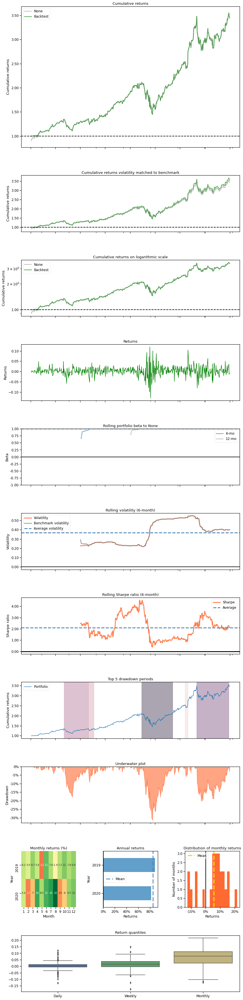

In [ ]:
print("==============Compare to AAPL itself buy-and-hold===========")
%matplotlib inline
BackTestPlot(account_value=df_account_value, 
             baseline_ticker = 'AAPL',
             baseline_start = '2019-01-01',
             baseline_end = '2021-01-01')

<a id='6.3'></a>
## 7.3 Baseline Stats

In [ ]:
print("==============Get Baseline Stats===========")
baesline_perf_stats=BaselineStats('AAPL')

==============Get Baseline Stats===========
[*********************100%***********************]  1 of 1 completed
Shape of DataFrame:  (483, 7)
Annual return          0.800630
Cumulative returns     2.087191
Annual volatility      0.382201
Sharpe ratio           1.735128
Calmar ratio           2.547565
Stability              0.930285
Max drawdown          -0.314273
Omega ratio            1.387241
Sortino ratio          2.572655
Skew                        NaN
Kurtosis                    NaN
Tail ratio             1.081315
Daily value at risk   -0.045521
Alpha                  0.000000
Beta                   1.000000
dtype: float64


In [ ]:
print("==============Get Baseline Stats===========")
baesline_perf_stats=BaselineStats('^GSPC')

==============Get Baseline Stats===========
[*********************100%***********************]  1 of 1 completed
Shape of DataFrame:  (483, 7)
Annual return          0.210804
Cumulative returns     0.442863
Annual volatility      0.264385
Sharpe ratio           0.858377
Calmar ratio           0.621384
Stability              0.467075
Max drawdown          -0.339250
Omega ratio            1.200929
Sortino ratio          1.183069
Skew                        NaN
Kurtosis                    NaN
Tail ratio             0.726400
Daily value at risk   -0.032409
Alpha                  0.000000
Beta                   1.000000
dtype: float64


<a id='6.4'></a>
## 7.4 Compare to Stock Market Index

==============Compare to S&P 500===========
annual return:  98.50882005689301
sharpe ratio:  1.8721562790475017
[*********************100%***********************]  1 of 1 completed
Shape of DataFrame:  (483, 7)


Start date,2019-01-03
End date,2020-11-30
Total months,22
,Backtest
Annual return,80.433%
Cumulative returns,209.212%
Annual volatility,37.022%
Sharpe ratio,1.78
Calmar ratio,2.56
Stability,0.93
Max drawdown,-31.422%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,31.42,2020-02-12,2020-03-23,2020-06-05,83
1,20.37,2020-09-01,2020-09-18,NaT,NaN
2,17.84,2019-05-03,2019-06-03,2019-07-31,64
3,9.24,2019-07-31,2019-08-05,2019-08-21,16
4,5.84,2020-07-20,2020-07-24,2020-07-31,10


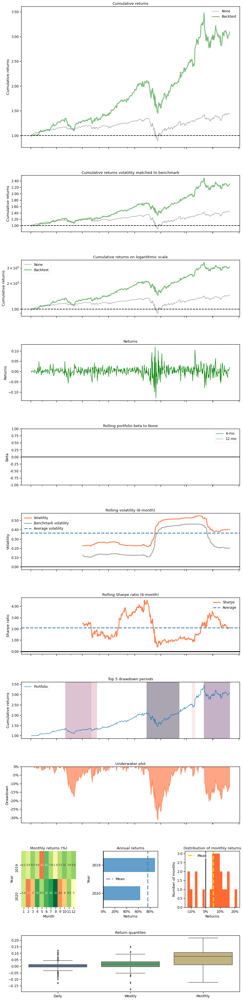

In [ ]:
print("==============Compare to S&P 500===========")
%matplotlib inline
# S&P 500: ^GSPC
# Dow Jones Index: ^DJI
# NASDAQ 100: ^NDX
BackTestPlot(df_account_value, baseline_ticker = '^GSPC')